In [1]:
import sys
import os

# Get the root directory
root_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Add the root directory to the Python path
sys.path.append(root_dir)

In [2]:
from tqdm import tqdm
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import OneCycleLR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.datasets import load_diabetes
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from TINTOlib.igtd import IGTD
from kan import *
from tqdm import tqdm
from sklearn.metrics import confusion_matrix


import traceback
import time
import gc
import copy
import traceback
import cv2
import math
import random
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch.nn as nn
import torch.optim as optim
import seaborn as sns
import csv

if torch.cuda.is_available():
  device = torch.device("cuda")
else:
  device = torch.device("cpu")

print(device)

cuda


In [3]:
SEED = 381
# SET RANDOM SEED FOR REPRODUCIBILITY
torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

# BEST: ACC = 0.998

In [4]:
folder="data/wall-robot-navigation"
x_col=["V1", "V2", "V3", "V4", "V5", "V6", "V7", "V8","V9","V10","V11", "V12", "V13", 
       "V14", "V15", "V16", "V17", "V18","V19","V20","V21", "V22", "V23", "V24"]
target_col=["class"]

# Functions

### Load Dataset and Images

In [5]:
def load_and_clean(npy_filename, y_filename, x_col, target_col):
    """
    Load the feature array (npy_filename) and label array (y_filename),
    drop rows in the feature array that contain any NaNs, and apply
    the same mask to the label array.
    """
    # Load numpy arrays
    X = np.load(os.path.join(folder, npy_filename))
    y = np.load(os.path.join(folder, y_filename), allow_pickle=True)
    
    # Ensure the number of rows matches between X and y
    if X.shape[0] != y.shape[0]:
        raise ValueError("The number of rows in {} and {} do not match.".format(npy_filename, y_filename))
    
    # Create a boolean mask for rows that do NOT have any NaN values in X
    valid_rows = ~np.isnan(X).any(axis=1)
    #print(valid_rows)
    # Filter both arrays using the valid_rows mask
    X_clean = X[valid_rows]
    y_clean = y[valid_rows]
    
    # Convert arrays to DataFrames
    df_X = pd.DataFrame(X_clean)
    df_y = pd.DataFrame(y_clean)
    df_X.columns = x_col
    df_y.columns = target_col

    df_y[target_col] = df_y[target_col].astype(int)
    return df_X, df_y

In [6]:
def load_and_preprocess_data(X_train, y_train, X_test, y_test, X_val, y_val, image_model, problem_type, batch_size=32):
    # Add target column to input for IGTD
    X_train_full = X_train.copy()
    X_train_full["target"] = y_train.values

    X_val_full = X_val.copy()
    X_val_full["target"] = y_val.values

    X_test_full = X_test.copy()
    X_test_full["target"] = y_test.values

    # Generate the images if the folder does not exist
    if not os.path.exists(f'{images_folder}/train'):
        #print(X_train_full)
        image_model.fit_transform(X_train_full, f'{images_folder}/train')
        image_model.saveHyperparameters(f'{images_folder}/model.pkl')
    else:
        print("The images are already generated")

    # Load image paths
    imgs_train = pd.read_csv(os.path.join(f'{images_folder}/train', f'{problem_type}.csv'))
    imgs_train["images"] = images_folder + "/train/" + imgs_train["images"]

    if not os.path.exists(f'{images_folder}/val'):
        image_model.transform(X_val_full, f'{images_folder}/val')
    else:
        print("The images are already generated")

    imgs_val = pd.read_csv(os.path.join(f'{images_folder}/val', f'{problem_type}.csv'))
    imgs_val["images"] = images_folder + "/val/" + imgs_val["images"]

    if not os.path.exists(f'{images_folder}/test'):
        image_model.transform(X_test_full, f'{images_folder}/test')
    else:
        print("The images are already generated")

    imgs_test = pd.read_csv(os.path.join(f'{images_folder}/test', f'{problem_type}.csv'))
    imgs_test["images"] = images_folder + "/test/" + imgs_test["images"]

    # Image data
    X_train_img = np.array([cv2.imread(img) for img in imgs_train["images"]])
    X_val_img = np.array([cv2.imread(img) for img in imgs_val["images"]])
    X_test_img = np.array([cv2.imread(img) for img in imgs_test["images"]])

    # Create a MinMaxScaler object
    scaler = MinMaxScaler()

    # Scale numerical data
    X_train_num = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
    X_val_num = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)
    X_test_num = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

    attributes = len(X_train_num.columns)
    height, width, channels = X_train_img[0].shape
    imgs_shape = (channels, height, width)

    print("Images shape: ", imgs_shape)
    print("Attributes: ", attributes)

    # Convert data to PyTorch tensors
    X_train_num_tensor = torch.as_tensor(X_train_num.values, dtype=torch.float32)
    X_val_num_tensor = torch.as_tensor(X_val_num.values, dtype=torch.float32)
    X_test_num_tensor = torch.as_tensor(X_test_num.values, dtype=torch.float32)
    X_train_img_tensor = torch.as_tensor(X_train_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    X_val_img_tensor = torch.as_tensor(X_val_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    X_test_img_tensor = torch.as_tensor(X_test_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    y_train_tensor = torch.as_tensor(y_train.values, dtype=torch.float32).reshape(-1, 1)
    y_val_tensor = torch.as_tensor(y_val.values, dtype=torch.float32).reshape(-1, 1)
    y_test_tensor = torch.as_tensor(y_test.values, dtype=torch.float32).reshape(-1, 1)

    # Create DataLoaders
    train_dataset = TensorDataset(X_train_num_tensor, X_train_img_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_num_tensor, X_val_img_tensor, y_val_tensor)
    test_dataset = TensorDataset(X_test_num_tensor, X_test_img_tensor, y_test_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)

    return train_loader, val_loader, test_loader, attributes, imgs_shape

In [7]:
def complete_coordinate_and_xcol(coordinate, x_col):
    """
    Given a coordinate (tuple of row, col arrays) and x_col feature list,
    return completed coordinate and x_col including empty positions.

    Empty positions are filled with labels: 'Ex1', 'Ex2', ...
    """

    row_coords, col_coords = coordinate
    max_row = row_coords.max()
    max_col = col_coords.max()
    max_c = max(max_row, max_col)
    # All possible coordinate slots
    full_coords = set((r, c) for r in range(max_col + 1) for c in range(max_col + 1))
    current_coords = set(zip(row_coords, col_coords))
    missing_coords = sorted(full_coords - current_coords)

    # Create updated coordinate arrays
    new_row_coords = list(row_coords)
    new_col_coords = list(col_coords)
    new_x_col = list(x_col)

    for idx, (r, c) in enumerate(missing_coords):
        new_row_coords.append(r)
        new_col_coords.append(c)
        new_x_col.append(f"Ex{idx+1}")

    completed_coordinate = (np.array(new_row_coords), np.array(new_col_coords))
    return completed_coordinate, new_x_col

In [8]:
def plot_feature_mapping(x_col, coordinate, scale=(4,4)):
    grid = np.full(scale, "", dtype=object)
    rows, cols = coordinate
    for i, (r, c) in enumerate(zip(rows, cols)):
        if i < len(x_col):
            grid[r, c] = x_col[i]
        else:
            grid[r, c] = "?"
    
    plt.figure(figsize=(scale[1] * 2, scale[0] * 2))
    for i in range(scale[0]):
        for j in range(scale[1]):
            plt.text(j, i, grid[i, j], ha='center', va='center', fontsize=10,
                     bbox=dict(facecolor='white', edgecolor='gray'))
    
    plt.xticks(np.arange(scale[1]))
    plt.yticks(np.arange(scale[0]))
    plt.grid(True)
    plt.title("Feature → Pixel Mapping")
    plt.gca().invert_yaxis()  # So row 0 is at the top
    plt.show()

In [9]:
def combine_loader(loader):
    """
    Combines all batches from a DataLoader into three tensors.
    Assumes each batch is a tuple: (mlp_tensor, img_tensor, target_tensor)
    """
    mlp_list, img_list, target_list = [], [], []
    for mlp, img, target in loader:
        mlp_list.append(mlp)
        img_list.append(img)
        target_list.append(target)
    return torch.cat(mlp_list, dim=0), torch.cat(img_list, dim=0), torch.cat(target_list, dim=0)

### Functions for KAN

In [10]:
dtype = torch.get_default_dtype()
min_expected = 1.
max_expected = 4.

In [11]:
def plot_sorted_feature_importance(columns, importances):
    # Move to CPU and numpy if it's a GPU tensor
    if isinstance(importances, torch.Tensor):
        importances = importances.detach().cpu().numpy()

    # Pair columns and importances and sort by importance descending
    sorted_pairs = sorted(zip(columns, importances), key=lambda x: x[1], reverse=True)
    print(sorted_pairs)
    sorted_columns, sorted_importances = zip(*sorted_pairs)
    
    # Create the bar plot
    plt.figure(figsize=(4, 3))
    plt.barh(sorted_columns, sorted_importances, color='royalblue')
    plt.xlabel('Importance')
    plt.title('KAN Feature Importances')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    return sorted_pairs

In [12]:
def plot_training_ACC(y_true, y_pred, train_loss, val_loss):
    clipped = torch.clamp(torch.round(y_pred), min=min_expected, max=max_expected)
    avg_rmse = torch.mean((clipped == y_true).type(dtype))
    print(avg_rmse)
    plt.figure(figsize=(5, 4))
    plt.plot(train_loss)
    plt.plot(val_loss)
    plt.legend(['train', 'val'])
    plt.ylabel('Accuracy')
    plt.xlabel('step')
    plt.yscale('log')
    return avg_rmse

In [13]:
def plot_confusion_matrix(y_true_tensor, y_pred_tensor, title="Confusion Matrix", plot=False):
    # Move tensors to CPU and detach if necessary
    clipped = torch.clamp(torch.round(y_pred_tensor), min=min_expected, max=max_expected)

    y_true = y_true_tensor.detach().cpu().numpy().flatten()
    y_pred = clipped.detach().cpu().numpy().flatten()

    # Round predictions if they are float (e.g., from sigmoid or regression)
    if y_pred.dtype.kind in {'f'}:
        y_pred = y_pred.round()

    # Get sorted list of all unique labels
    all_labels = sorted(set(y_true) | set(y_pred))

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=all_labels)
    print(cm)
    if plot:
        # Plot
        plt.figure(figsize=(4, 3))
        sns.heatmap(cm, annot=True, fmt='g', cmap='Blues',
                    xticklabels=all_labels, yticklabels=all_labels)
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title(title)
        plt.tight_layout()
        plt.show()
    return cm

In [14]:
def train_acc_kan():
    rounded = torch.round(torch.round(model(dataset['train_input'])[:,0]))
    clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
    return torch.mean((clipped == dataset['train_label'][:,0]).type(dtype))

def val_acc_kan():
    rounded = torch.round(torch.round(model(dataset['val_input'])[:,0]))
    clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
    return torch.mean((clipped == dataset['val_label'][:,0]).type(dtype))

In [15]:
def custom_fit(model, dataset, opt="LBFGS", steps=100, log=1, lamb=0., lamb_l1=1., lamb_entropy=2., lamb_coef=0., lamb_coefdiff=0., update_grid=True, 
               grid_update_num=10, loss_fn=None, lr=1., start_grid_update_step=-1, stop_grid_update_step=50, batch=-1,
               metrics=None, save_fig=False, in_vars=None, out_vars=None, beta=3, save_fig_freq=1, img_folder='./video', 
               singularity_avoiding=False, y_th=1000., reg_metric='edge_forward_spline_n', display_metrics=None):
    '''
    training

    Args:
    -----
        dataset : dic
            contains dataset['train_input'], dataset['train_label'], dataset['val_input'], dataset['val_label']
        opt : str
            "LBFGS" or "Adam"
        steps : int
            training steps
        log : int
            logging frequency
        lamb : float
            overall penalty strength
        lamb_l1 : float
            l1 penalty strength
        lamb_entropy : float
            entropy penalty strength
        lamb_coef : float
            coefficient magnitude penalty strength
        lamb_coefdiff : float
            difference of nearby coefficits (smoothness) penalty strength
        update_grid : bool
            If True, update grid regularly before stop_grid_update_step
        grid_update_num : int
            the number of grid updates before stop_grid_update_step
        start_grid_update_step : int
            no grid updates before this training step
        stop_grid_update_step : int
            no grid updates after this training step
        loss_fn : function
            loss function
        lr : float
            learning rate
        batch : int
            batch size, if -1 then full.
        save_fig_freq : int
            save figure every (save_fig_freq) steps
        singularity_avoiding : bool
            indicate whether to avoid singularity for the symbolic part
        y_th : float
            singularity threshold (anything above the threshold is considered singular and is softened in some ways)
        reg_metric : str
            regularization metric. Choose from {'edge_forward_spline_n', 'edge_forward_spline_u', 'edge_forward_sum', 'edge_backward', 'node_backward'}
        metrics : a list of metrics (as functions)
            the metrics to be computed in training
        display_metrics : a list of functions
            the metric to be displayed in tqdm progress bar

    Returns:
    --------
        results : dic
            results['train_loss'], 1D array of training losses (RMSE)
            results['val_loss'], 1D array of val losses (RMSE)
            results['reg'], 1D array of regularization
            other metrics specified in metrics
        best_model:
    '''

    if lamb > 0. and not model.save_act:
        print('setting lamb=0. If you want to set lamb > 0, set model.save_act=True')
        
    old_save_act, old_symbolic_enabled = model.disable_symbolic_in_fit(lamb)

    pbar = tqdm(range(steps), desc='description', ncols=100)

    if loss_fn == None:
        loss_fn = loss_fn_eval = lambda x, y: torch.mean((x - y) ** 2)
    else:
        loss_fn = loss_fn_eval = loss_fn

    grid_update_freq = int(stop_grid_update_step / grid_update_num)

    if opt == "Adam":
        optimizer = torch.optim.Adam(model.get_params(), lr=lr)
    elif opt == "LBFGS":
        optimizer = LBFGS(model.get_params(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32,
                          tolerance_change=1e-32,
                          tolerance_ys=1e-32)

    results = {}
    results['train_loss'] = []
    results['val_loss'] = []
    results['reg'] = []
    if metrics != None:
        for i in range(len(metrics)):
            results[metrics[i].__name__] = []

    if batch == -1 or batch > dataset['train_input'].shape[0]:
        batch_size = dataset['train_input'].shape[0]
        batch_size_val = dataset['val_input'].shape[0]
    else:
        batch_size = batch
        batch_size_val = batch

    global train_loss, reg_

    def closure():
        global train_loss, reg_
        optimizer.zero_grad()
        pred = model.forward(dataset['train_input'][train_id], singularity_avoiding=singularity_avoiding, y_th=y_th)
        train_loss = loss_fn(pred, dataset['train_label'][train_id])
        if model.save_act:
            if reg_metric == 'edge_backward':
                model.attribute()
            if reg_metric == 'node_backward':
                model.node_attribute()
            reg_ = model.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
        else:
            reg_ = torch.tensor(0.)
        objective = train_loss + lamb * reg_
        objective.backward()
        return objective

    if save_fig:
        if not os.path.exists(img_folder):
            os.makedirs(img_folder)
    
    best_model_state = None
    best_epoch = -1
    best_metric = 0
    val_metric = 0
    for epoch in pbar:
        
        if epoch == steps-1 and old_save_act:
            model.save_act = True
            
        if save_fig and epoch % save_fig_freq == 0:
            save_act = model.save_act
            model.save_act = True
        
        train_id = np.random.choice(dataset['train_input'].shape[0], batch_size, replace=False)
        val_id = np.random.choice(dataset['val_input'].shape[0], batch_size_val, replace=False)

        if epoch % grid_update_freq == 0 and epoch < stop_grid_update_step and update_grid and epoch >= start_grid_update_step:
            model.update_grid(dataset['train_input'][train_id])

        if opt == "LBFGS":
            optimizer.step(closure)

        if opt == "Adam":
            pred = model.forward(dataset['train_input'][train_id], singularity_avoiding=singularity_avoiding, y_th=y_th)
            train_loss = loss_fn(pred, dataset['train_label'][train_id])
            if model.save_act:
                if reg_metric == 'edge_backward':
                    model.attribute()
                if reg_metric == 'node_backward':
                    model.node_attribute()
                reg_ = model.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_ = torch.tensor(0.)
            loss = train_loss + lamb * reg_
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        val_loss = loss_fn_eval(model.forward(dataset['val_input'][val_id]), dataset['val_label'][val_id])
        
        if metrics != None:
            for i in range(len(metrics)):
                results[metrics[i].__name__].append(metrics[i]().item())
        
        results['train_loss'].append(torch.sqrt(train_loss).cpu().detach().numpy())
        results['val_loss'].append(torch.sqrt(val_loss).cpu().detach().numpy())
        results['reg'].append(reg_.cpu().detach().numpy())

        if epoch % log == 0:
            if display_metrics == None:
                pbar.set_description("| train_loss: %.2e | val_loss: %.2e | reg: %.2e | " % (torch.sqrt(train_loss).cpu().detach().numpy(), torch.sqrt(val_loss).cpu().detach().numpy(), reg_.cpu().detach().numpy()))
                val_metric = val_loss
            else:
                string = ''
                data = ()
                for metric in display_metrics:
                    val_metric = results[metric][-1]
                    string += f' {metric}: %.2e |'
                    try:
                        results[metric]
                    except:
                        raise Exception(f'{metric} not recognized')
                    data += (results[metric][-1],)
                pbar.set_description(string % data)

        if val_metric > best_metric:
            best_epoch = epoch
            best_metric = val_metric
            best_model_state = copy.deepcopy(model.state_dict())

        if save_fig and epoch % save_fig_freq == 0:
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title="Step {}".format(_), beta=beta)
            plt.savefig(img_folder + '/' + str(_) + '.jpg', bbox_inches='tight', dpi=200)
            plt.close()
            model.save_act = save_act

    model.log_history('fit')
    # revert back to original state
    model.symbolic_enabled = old_symbolic_enabled
    print(f"✅ Best validation Accuracy: {best_metric:.4e} at {best_epoch} epoch")
    return best_model_state, results, best_epoch

### Grad CAM Functions

In [16]:
def grad_cam_side_by_side(model, model_state, num_input, img_input, x_col, coordinate,
                          zoom=1, target_index=None, save_path=None, show=True):
    model.load_state_dict(model_state)
    model.eval()
    model.zero_grad()

    if num_input.dim() == 1:
        num_input = num_input.unsqueeze(0)
    if img_input.dim() == 3:
        img_input = img_input.unsqueeze(0)

    num_input = num_input.to(model.device)
    img_input = img_input.to(model.device)

    # Store activations and gradients
    activations = {}
    gradients = {}

    def forward_hook(module, input, output):
        activations["value"] = output.detach()

    def backward_hook(module, grad_input, grad_output):
        gradients["value"] = grad_output[0].detach()

    conv_layer = model.cnn_branch[0]
    h_fwd = conv_layer.register_forward_hook(forward_hook)
    h_bwd = conv_layer.register_full_backward_hook(backward_hook)

    output = model(num_input, img_input)
    target = output if target_index is None else output[:, target_index]
    target.backward()

    act = activations["value"].squeeze(0)
    grad = gradients["value"].squeeze(0)
    weights = grad.mean(dim=(1, 2))
    cam = torch.zeros_like(act[0])
    for i, w in enumerate(weights):
        cam += w * act[i]

    cam = torch.relu(cam)
    if cam.max() > 0:
        cam -= cam.min()
        cam /= cam.max()
    else:
        cam[:] = 0.0


    cam_resized = F.interpolate(cam.unsqueeze(0).unsqueeze(0), size=img_input.shape[-2:], mode='bilinear', align_corners=False)
    #print(cam_resized)
    heatmap = cam_resized.squeeze().cpu()

    img_disp = img_input.squeeze().detach().cpu()
    if img_disp.shape[0] == 1:
        img_disp = img_disp[0]
        cmap = 'gray'
    else:
        img_disp = img_disp.permute(1, 2, 0)
        cmap = None

    h, w = img_disp.shape[:2]

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    axs[0].imshow(img_disp, cmap=cmap)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    im = axs[1].imshow(img_disp, cmap=cmap)
    heatmap_img = axs[1].imshow(heatmap, cmap='jet', alpha=0.5)
    axs[1].set_title("Grad-CAM")
    axs[1].axis('off')

    # Add colorbar (legend)
    cbar = fig.colorbar(heatmap_img, ax=axs[1], fraction=0.046, pad=0.04)
    cbar.set_label("Grad-CAM Intensity", fontsize=10)

    # Overlay abbreviated features
    for i, col in enumerate(x_col):
        abbrev = col.split("-")[0][:8]
        if i < len(coordinate[0]):
            r, c = coordinate[0][i], coordinate[1][i]
            ry = r * zoom + zoom // 2
            cx = c * zoom + zoom // 2
            if ry < h and cx < w:
                axs[1].text(cx, ry, abbrev,
                            color='white', fontsize=9, ha='center', va='center',
                            bbox=dict(facecolor='black', edgecolor='none', pad=1.0, alpha=0.4))
                axs[0].text(cx, ry, abbrev,
                            color='white', fontsize=9, ha='center', va='center',
                            bbox=dict(facecolor='black', edgecolor='none', pad=1.0, alpha=0.4))

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)

    if show:
        plt.show()
    else:
        plt.close()

    h_fwd.remove()
    h_bwd.remove()

    return heatmap

In [17]:
def heatmap_to_feature_relevance(heatmap, coordinate, x_col, zoom=1):
    """
    Map heatmap pixel intensities to their corresponding features using coordinate and zoom.
    Returns a dictionary of {feature_name: relevance_score}.
    """
    feature_scores = {}

    for i, col in enumerate(x_col):
        if i < len(coordinate[0]):
            r, c = coordinate[0][i], coordinate[1][i]
            ry = r * zoom + zoom // 2
            cx = c * zoom + zoom // 2
            if ry < heatmap.shape[0] and cx < heatmap.shape[1]:
                feature_scores[col] = heatmap[ry, cx].item()

    return feature_scores

def plot_feature_relevance_bar(feature_scores):
    """
    Plots a horizontal bar chart of feature relevance from Grad-CAM heatmap.
    """
    sorted_scores = sorted(feature_scores.items(), key=lambda item: item[1], reverse=True)
    print(sorted_scores)
    features, scores = zip(*sorted_scores)

    plt.figure(figsize=(6, 3))
    plt.barh(features, scores, color='royalblue')
    plt.xlabel("Grad-CAM Relevance")
    plt.title("Feature Relevance for Test")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    return sorted_scores

In [18]:
def compute_avg_feature_relevance_from_val(model, model_state, val_inputs, val_imgs, coordinate, x_col, zoom=1):
    """
    Computes average Grad-CAM feature relevance over all validation instances with a tqdm progress bar.

    Args:
        model: Trained model
        model_state: Trained weights to be loaded
        val_inputs: List or tensor of numerical inputs
        val_imgs: List or tensor of image inputs
        coordinate: IGTD-style coordinate tuple (row array, col array)
        x_col: List of feature names (including extras)
        zoom: Zoom level used when generating the images

    Returns:
        Dictionary of average feature relevance
    """
    accumulated_scores = {feature: [] for feature in x_col}

    for num_input, img_input in tqdm(zip(val_inputs, val_imgs), total=len(val_inputs), desc="Computing Grad-CAM"):
        heatmap = grad_cam_side_by_side(
            model=model,
            model_state=model_state,
            num_input=num_input,
            img_input=img_input,
            coordinate=coordinate,
            x_col=x_col,
            zoom=zoom,
            show=False
        )
        scores = heatmap_to_feature_relevance(heatmap, coordinate, x_col, zoom)
        for feature, value in scores.items():
            accumulated_scores[feature].append(value)

    # Compute average
    avg_scores = {feature: float(np.mean(values)) if values else 0.0
                  for feature, values in accumulated_scores.items()}

    return avg_scores


# def plot_avg_feature_relevance_from_val(model, val_inputs, val_imgs, coordinate, x_col, zoom=1):
#     """
#     Combines all steps: compute average relevance and plot.
#     """
#     avg_scores = compute_avg_feature_relevance_from_val(model, val_inputs, val_imgs, coordinate, x_col, zoom)
#     return plot_feature_relevance_bar(avg_scores)

### Write metrics

In [19]:
def create_csv_with_header(filename, columns_opt):
    header=['kan_neurons', 'kan_grid', 'lamb', columns_opt, 'ACC','Conf_Mtx','Best_Epoch','KAN_Relevance','CNN_Relevance','KAN M.R.F.','CNN M.R.F.']
    """Creates a CSV file with a given header."""
    with open(filename, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(header)

In [20]:
def format_top_3(pairs):
    return '\n'.join(f"{k}: {v:.2f}" for k, v in pairs[:3])

In [21]:
def append_row_to_csv(filename, kan_neurons, kan_grid, lamb, opt_col_val, acc, cm, best_epoch, k_rel, cnn_rel, kan_mrf, cnn_mrf):
    row = [kan_neurons, kan_grid, lamb, opt_col_val, acc, cm, best_epoch, k_rel, cnn_rel, format_top_3(kan_mrf), format_top_3(cnn_mrf)]
    ['Configuration', opt_col_val,'ACC','Conf_Mtx','Best_Epoch','KAN_Relevance','CNN_Relevance','KAN M.R.F.','CNN M.R.F.']
    """Appends a single row to an existing CSV file."""
    if not os.path.isfile(filename):
        raise FileNotFoundError(f"{filename} does not exist. Please create the file first with a header.")
    with open(filename, mode='a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(row)

### Hybrid Functions

In [22]:
def print_mkan_vs_cnn_relevance(feature_scores, mkan_len):
    if isinstance(feature_scores, torch.Tensor):
        feature_scores = feature_scores.detach().cpu().numpy()

    mkan_relevance = feature_scores[:mkan_len].sum()
    cnn_relevance = feature_scores[mkan_len:].sum()
    m_kan_relevance_perct = float(mkan_relevance/(mkan_relevance+cnn_relevance))
    cnn_relevance_perct = float(cnn_relevance/(mkan_relevance+cnn_relevance))
    print(f"M_KAN Relevance: {m_kan_relevance_perct}")
    print(f"CNN Relevance: {cnn_relevance_perct}")
    return m_kan_relevance_perct, cnn_relevance_perct

In [23]:
def plot_mkan_vs_cnn_relevance(feature_scores, mkan_len=6, title="Feature Relevance Split"):
    """
    Plots a pie chart comparing the total feature relevance from m_kan output vs CNN output.

    Args:
        feature_scores (torch.Tensor or list): 1D tensor of relevance values from final_kan.
        mkan_len (int): Number of dimensions from m_kan (default: 6).
        title (str): Title for the pie chart.
    """
    if isinstance(feature_scores, torch.Tensor):
        feature_scores = feature_scores.detach().cpu().numpy()

    mkan_relevance = feature_scores[:mkan_len].sum()
    cnn_relevance = feature_scores[mkan_len:].sum()

    sizes = [mkan_relevance, cnn_relevance]
    labels = ['m_kan Output', 'CNN Output']
    explode = (0.05, 0)  # Slightly explode m_kan slice for emphasis

    plt.figure(figsize=(3, 3))
    plt.pie(sizes, labels=labels, explode=explode, autopct='%1.1f%%',
            shadow=True, startangle=140, colors=["#66c2a5", "#fc8d62"])
    plt.title(title)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

In [24]:
def fit_hybrid_dataloaders(model, 
                           dataset,
                           opt="AdamW", 
                           steps=100, 
                           log=1, 
                           lamb=0., 
                           lamb_l1=1., 
                           lamb_entropy=2., 
                           lamb_coef=0., 
                           lamb_coefdiff=0., 
                           update_grid=True, 
                           grid_update_num=10, 
                           loss_fn=None, 
                           lr=1., 
                           start_grid_update_step=-1, 
                           stop_grid_update_step=50, 
                           batch=-1,
                           metrics=None, 
                           save_fig=False, 
                           in_vars=None, 
                           out_vars=None, 
                           beta=3, 
                           save_fig_freq=1, 
                           img_folder='./video', 
                           singularity_avoiding=False, 
                           y_th=1000., 
                           reg_metric='edge_forward_spline_n', 
                           display_metrics=None,
                           sum_f_reg=True):
    """
    Trains the hybrid model (with a KAN branch and a CNN branch) using a steps-based loop
    adapted from KAN.fit(), with grid updates and regularization.
    
    Instead of a single dataset dict, this function accepts three DataLoaders:
        - train_loader: provides (mlp, img, target) for training
        - val_loader: provides (mlp, img, target) for evaluation during training
        - test_loader: provides (mlp, img, target) for validation

    Internally, the function combines each loader into a dataset dictionary.
    
    Returns:
        results: dictionary containing training loss, evaluation loss, regularization values,
                 and any additional metrics recorded during training.
    """
    #device = next(model.parameters()).device

    # Warn if regularization is requested but model's internal flag isn't enabled.
    if lamb > 0. and not getattr(model.m_kan, "save_act", False):
        print("setting lamb=0. If you want to set lamb > 0, set model.m_kan.save_act=True")
    
    # Disable symbolic processing for training if applicable (KAN internal logic)
    if hasattr(model.m_kan, "disable_symbolic_in_fit"):
        old_save_act, old_symbolic_enabled = model.m_kan.disable_symbolic_in_fit(lamb)
        f_old_save_act, f_old_symbolic_enabled = model.final_kan.disable_symbolic_in_fit(lamb)
    else:
        old_save_act, old_symbolic_enabled = None, None

    pbar = tqdm(range(steps), desc='Training', ncols=100)

    # Default loss function (mean squared error) if not provided
    if loss_fn is None:
        loss_fn = lambda x, y: torch.mean((x - y) ** 2)

    # Determine grid update frequency
    grid_update_freq = int(stop_grid_update_step / grid_update_num) if grid_update_num > 0 else 1

    # Determine total number of training examples
    n_train = dataset["train_input"].shape[0]
    n_eval  = dataset["val_input"].shape[0]  # using val set for evaluation during training
    batch_size = n_train if batch == -1 or batch > n_train else batch

    # Set up optimizer: choose between Adam and LBFGS (removed tolerance_ys)
    if opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    elif opt == "LBFGS":        
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    else:
        raise ValueError("Optimizer not recognized. Use 'Adam' or 'LBFGS'.")

    # Prepare results dictionary.
    results = {'train_loss': [], 'eval_loss': [], 'reg': []}
    
    if metrics is not None:
        for metric in metrics:
            results[metric.__name__] = []

    best_model_state = None
    best_epoch = -1
    best_metric = 0
    val_metric = 0

    for step in pbar:
        # Randomly sample indices for a mini-batch from the training set.
        train_indices = np.random.choice(n_train, batch_size, replace=False)
        # Use full evaluation set for evaluation; you can also sample if desired.
        eval_indices = np.arange(n_eval)
        
        cached_loss = {}
        # Closure for LBFGS
        def closure():
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            # Compute regularization term if enabled.
            if hasattr(model.m_kan, "save_act") and model.m_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.m_kan.attribute()
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.m_kan.node_attribute()
                    model.final_kan.node_attribute()
                reg_val_inner = model.m_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
                if sum_f_reg:
                    reg_val_inner += model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val_inner = torch.tensor(0., device=device)
            loss_val_inner = train_loss + lamb * reg_val_inner
            loss_val_inner.backward()
            cached_loss['loss'] = loss_val_inner.detach()
            cached_loss['reg'] = reg_val_inner.detach()
            return loss_val_inner

        # Perform grid update if applicable.
        if (step % grid_update_freq == 0 and step < stop_grid_update_step 
            and update_grid and step >= start_grid_update_step):
            
            mlp_batch = dataset['train_input'][train_indices]
            cnn_batch = dataset['train_img'][train_indices]
            
            model.m_kan.update_grid(mlp_batch)
            #cnn_output = model.cnn_branch(cnn_batch)  # Process image input
            concatenated = model.get_concat_output(mlp_batch, cnn_batch)

            model.final_kan.update_grid(concatenated)

        # Perform an optimizer step.
        if opt == "LBFGS":
            optimizer.step(closure)
            loss_val = cached_loss['loss']
            reg_val = cached_loss['reg']
        else:  # AdamW branch
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            if hasattr(model.m_kan, "save_act") and model.m_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.m_kan.attribute()
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.m_kan.node_attribute()
                    model.final_kan.node_attribute()
                reg_val = model.m_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
                if sum_f_reg:
                    reg_val = reg_val + model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val = torch.tensor(0., device=device)
            loss_val = train_loss + lamb * reg_val
            loss_val.backward()
            optimizer.step()


        with torch.no_grad():
            mlp_eval = dataset["val_input"][eval_indices]
            img_eval = dataset["val_img"][eval_indices]
            target_eval = dataset["val_label"][eval_indices]
            eval_loss = loss_fn(model(mlp_eval, img_eval), target_eval)

        # Record results (using square-root of loss similar to KAN.fit)
        results['eval_loss'].append(torch.sqrt(eval_loss.detach()).item())
        results['reg'].append(reg_val.detach().item())

        if metrics is not None:
            for metric in metrics:
                # Here, we assume each metric returns a tensor.
                results[metric.__name__].append(metric().item())


        # Update progress bar.
        if display_metrics is None:
            pbar.set_description("| train_loss: %.2e | eval_loss: %.2e | reg: %.2e |" %
                                 (torch.sqrt(loss_val.detach()).item(),
                                  torch.sqrt(eval_loss.detach()).item(),
                                  reg_val.detach().item()))
        else:
            string = ''
            data = ()
            for metric in display_metrics:
                val_metric = results[metric][-1]
                string += f' {metric}: %.2e |'
                try:
                    results[metric]
                except:
                    raise Exception(f'{metric} not recognized')
                data += (results[metric][-1],)
            pbar.set_description(string % data)

        if val_metric > best_metric:
            best_epoch = step
            best_metric = val_metric
            best_model_state = copy.deepcopy(model.state_dict())

        # Optionally save a figure snapshot.
        if save_fig and step % save_fig_freq == 0:
            save_act_backup = getattr(model.m_kan, "save_act", False)
            model.m_kan.save_act = True
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title=f"Step {step}", beta=beta)
            plt.savefig(os.path.join(img_folder, f"{step}.jpg"), bbox_inches='tight', dpi=200)
            plt.close()
            model.m_kan.save_act = save_act_backup

    # Restore original settings if applicable.
    if old_symbolic_enabled is not None:
        model.m_kan.symbolic_enabled = old_symbolic_enabled
    if hasattr(model.m_kan, "log_history"):
        model.m_kan.log_history('fit')
    print(f"✅ Best validation Accuracy: {best_metric:.4e} at {best_epoch} epoch")
    return best_model_state, results, best_epoch

In [25]:
import traceback

def try_create_model(model_class, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, alpha, hidden_dim, embed_dim, num_heads):
    try:
        model = model_class(attributes, imgs_shape, kan_neurons, kan_grid,
                            cnn_bottleneck_dim=cnn_bottleneck_dim, alpha=alpha, hidden_dim=hidden_dim, embed_dim=embed_dim, num_heads=num_heads)
        # Test the model with a sample input
        num_input = torch.randn(4, attributes)
        img_input = torch.randn(4, *imgs_shape)
        output = model(num_input, img_input)
        
        print(f"Successfully created and tested {model_class.__name__}")
        
        return model
    except Exception as e:
        print(f"Error creating or testing {model_class.__name__}:")
        traceback.print_exc()
        return None

In [26]:
def cnn_branch_relevance(model, best_model_state):
    avg_scores = compute_avg_feature_relevance_from_val(
        model=model,
        model_state=best_model_state,
        val_inputs=dataset["test_input"],
        val_imgs=dataset["test_img"],
        coordinate=completed_coordinate,
        x_col=completed_x_col,
        zoom=1
    )
    return plot_feature_relevance_bar(avg_scores)

In [27]:
def train_and_plot_relevance(model_class, kan_neurons, kan_grid, lamb, steps, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, n_kan_len=None, filename=None, opt_col_val=None):
    torch.cuda.empty_cache()
    gc.collect()
    model = try_create_model(model_class, attributes, imgs_shape, kan_neurons=kan_neurons, kan_grid=kan_grid,
                             cnn_bottleneck_dim=cnn_bottleneck_dim, alpha=alpha, hidden_dim=hidden_dim, embed_dim=embed_dim, num_heads=num_heads)
    def train_acc_hybrid():
        rounded = torch.round(torch.round(model(dataset['train_input'], dataset['train_img'])[:,0]))
        clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
        return torch.mean((clipped == dataset['train_label'][:,0]).type(dtype))
    
    def val_acc_hybrid():
        rounded = torch.round(torch.round(model(dataset['val_input'], dataset['val_img'])[:,0]))
        clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
        return torch.mean((clipped == dataset['val_label'][:,0]).type(dtype))

    model_state, results, best_epoch = fit_hybrid_dataloaders(
        model, dataset, opt="LBFGS", steps=steps, lamb=lamb,
        metrics=(train_acc_hybrid, val_acc_hybrid), display_metrics=['train_acc_hybrid', 'val_acc_hybrid'])

    model.load_state_dict(model_state)
    acc = plot_training_ACC(dataset['test_label'][:,0], model(dataset['test_input'], dataset['test_img'])[:,0],
                            results['train_acc_hybrid'], results['val_acc_hybrid'])

    cm = plot_confusion_matrix(dataset['test_label'][:,0], model(dataset['test_input'], dataset['test_img'])[:,0], title="Confusion Matrix")

    if not n_kan_len:
        n_kan_len = kan_neurons
    k_rel, cnn_rel = print_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=n_kan_len)
    #plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=kan_neurons)
    kan_mrf = plot_sorted_feature_importance(x_col, model.m_kan.feature_score)
    cnn_mrf = cnn_branch_relevance(model, model_state)

    append_row_to_csv(filename, kan_neurons, kan_grid, lamb, opt_col_val, acc.item(), cm, best_epoch, k_rel, cnn_rel, kan_mrf, cnn_mrf)

### Models Class

In [22]:
class Model3(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, device=device):
        super(Model3, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 8, 8]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)
        # Final KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [23]:
class Model4(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, device=device):
        super(Model4, self).__init__()

        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4
            
            nn.Conv2d(16, 32, kernel_size=3, padding=2),                # out: 32 x 5 x 5
            nn.LayerNorm([32, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Middle KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )
        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)
        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            device=device
        )
        
        self.device = device

    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

### Models Class Hybrids

In [28]:
class Model3_0(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_0, self).__init__()

        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Dummy pass to get flattened size
        self.flat_size = self._get_flat_size(imgs_shape)

        # Bottleneck layer
        self.cnn_bottleneck = nn.Linear(self.flat_size, 1).to(device)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Final KAN layer
        self.final_kan = KAN(
            width=[2, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.shape[1]

    def get_concat_output(self, mlp_input, cnn_input):
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        conv_out = self.cnn_branch(cnn_input)
        cnn_output = self.cnn_bottleneck(conv_out)

        kan_output = self.m_kan(kan_input)

        return torch.cat((kan_output, cnn_output), dim=1)

    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [29]:
class Model3_1(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_1, self).__init__()

        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)
        # Dummy pass to get flattened size
        self.flat_size = self._get_flat_size(imgs_shape)
        # Bottleneck layer
        self.cnn_bottleneck = nn.Linear(self.flat_size, cnn_bottleneck_dim).to(device)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Final KAN layer
        self.final_kan = KAN(
            width=[cnn_bottleneck_dim + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.shape[1]

    def get_concat_output(self, mlp_input, cnn_input):
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        conv_out = self.cnn_branch(cnn_input)
        cnn_output = self.cnn_bottleneck(conv_out)

        kan_output = self.m_kan(kan_input)

        return torch.cat((kan_output, cnn_output), dim=1)

    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [30]:
class Model3_2(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_2, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)
        # Final KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device
        self.alpha = alpha


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        cnn_output = cnn_output * self.alpha
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [31]:
class Model3_3(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_3, self).__init__()
        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        self.flat_size = self._get_flat_size(imgs_shape)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Gating MLP: inputs are concatenated CNN + KAN representations
        self.gate_net = nn.Sequential(
            nn.Linear(self.flat_size + kan_neurons, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1),
            nn.Sigmoid()  # Output ∈ [0,1]
        ).to(device)

        # Final regressor (KAN layer)
        self.final_kan = KAN(
            width=[kan_neurons + self.flat_size, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(4, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        mlp_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        kan_out = self.m_kan(mlp_input)                  # shape: (B, kan_neurons)
        cnn_out = self.cnn_branch(cnn_input)             # shape: (B, cnn_flat)

        concat = torch.cat((kan_out, cnn_out), dim=1)    # For gating
        alpha = self.gate_net(concat)                    # shape: (B, 1)

        gated_kan = (1 - alpha) * kan_out                # shape: (B, kan_neurons)
        gated_cnn = alpha * cnn_out                      # shape: (B, cnn_flat)

        return torch.cat((gated_kan, gated_cnn), dim=1)  # shape: (B, total)

    def forward(self, mlp_input, cnn_input):
        fused = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(fused)


In [32]:
class Model3_4(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_4, self).__init__()
        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)


        self.flat_size = self._get_flat_size(imgs_shape)

        # KAN Branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Linear projections for Q, K, V
        self.query_proj = nn.Linear(kan_neurons, embed_dim).to(device)
        self.key_proj = nn.Linear(self.flat_size, embed_dim).to(device)
        self.value_proj = nn.Linear(self.flat_size, embed_dim).to(device)

        # Attention module
        self.attn = nn.MultiheadAttention(embed_dim=embed_dim, num_heads=num_heads, batch_first=True).to(device)

        # Final regression layer (KAN again)
        self.final_kan = KAN(
            width=[embed_dim, 1], grid=kan_grid, k=3, seed=SEED, device=device
        )
    
    def get_concat_output(self, mlp_input, cnn_input):
        # Get KAN and CNN outputs
        kan_out = self.m_kan(mlp_input.to(self.device))  # [B, D_kan]
        cnn_out = self.cnn_branch(cnn_input.to(self.device))  # [B, D_cnn]

        # Project into Q, K, V space
        Q = self.query_proj(kan_out).unsqueeze(1)  # [B, 1, E]
        K = self.key_proj(cnn_out).unsqueeze(1)    # [B, 1, E]
        V = self.value_proj(cnn_out).unsqueeze(1)  # [B, 1, E]
        # Cross-attention: KAN attends to CNN
        attn_out, _ = self.attn(Q, K, V)  # [B, 1, E]
        attn_out = attn_out.squeeze(1)   # [B, E]

        return attn_out



    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        return self.cnn_branch(dummy_input).shape[1]

    def forward(self, mlp_input, cnn_input):
        attn_out = self.get_concat_output(mlp_input, cnn_input)

        return self.final_kan(attn_out)

# Load Dataset and Images

In [33]:
X_train, y_train = load_and_clean('N_train.npy', 'y_train.npy',x_col, target_col)
X_test, y_test   = load_and_clean('N_test.npy',  'y_test.npy', x_col, target_col)
X_val, y_val     = load_and_clean('N_val.npy',   'y_val.npy', x_col, target_col)

In [34]:
# Get the shape of the dataframe
num_columns = X_train.shape[1]

# Calculate number of columns - 1
columns_minus_one = num_columns - 1

# Calculate the square root for image size
image_size = math.ceil(math.sqrt(num_columns))
print(image_size)

5


In [35]:
dataset_name = 'wall-robot-navigation'
#Select the model and the parameters
problem_type = "supervised"
image_model = IGTD(problem= problem_type, scale=[image_size,image_size], fea_dist_method='Euclidean', image_dist_method='Euclidean', error='abs', max_step=30000, val_step=300, random_seed=SEED)
name = f"IGTD_{image_size}x{image_size}_fEuclidean_iEuclidean_abs"

#Define the dataset path and the folder where the images will be saved
images_folder = f"HyNNImages/Classification/{dataset_name}/images_{dataset_name}_{name}"

In [36]:
train_loader, val_loader, test_loader, attributes, imgs_shape = load_and_preprocess_data(
    X_train, y_train, X_test, y_test, X_val, y_val,
    image_model=image_model,
    problem_type=problem_type,
    batch_size=16
)

The images are already generated
The images are already generated
The images are already generated
Images shape:  (3, 5, 5)
Attributes:  24


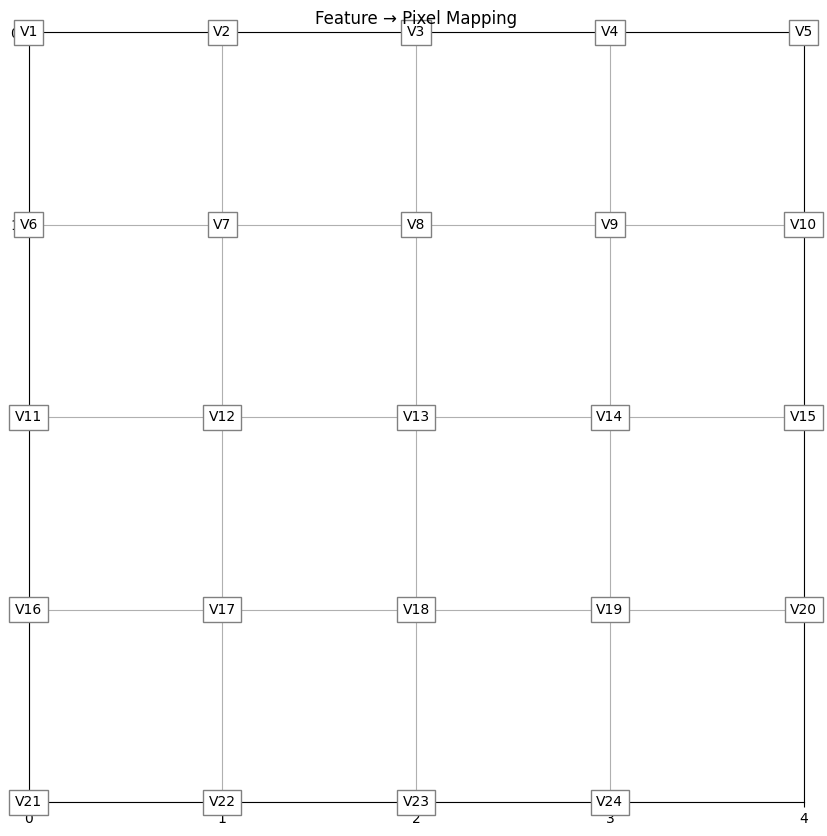

In [37]:
if hasattr(image_model, 'coordinate'):
    coordinates = image_model.coordinate
else:
    coordinates = (np.array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4, 4, 4]),
                   np.array([0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3]))

plot_feature_mapping(x_col, coordinates, scale=[5, 5])

In [38]:
# Combine dataloaders into tensors.
train_mlp, train_img, train_target = combine_loader(train_loader)
val_mlp, val_img, val_target = combine_loader(val_loader)
test_mlp, test_img, test_target = combine_loader(test_loader)

dataset = {
    "train_input": train_mlp.to(device),
    "train_img": train_img.to(device),
    "train_label": train_target.to(device),
    "val_input": val_mlp.to(device),
    "val_img": val_img.to(device),
    "val_label": val_target.to(device),
    "test_input": test_mlp.to(device),
    "test_img": test_img.to(device),
    "test_label": test_target.to(device),
}

In [39]:
# Print the shapes of the tensors
print("Train data shape:", dataset['train_input'].shape)
print("Train target shape:", dataset['train_label'].shape)
print("Test data shape:", dataset['test_input'].shape)
print("Test target shape:", dataset['test_label'].shape)
print("Validation data shape:", dataset['val_input'].shape)
print("Validation target shape:", dataset['val_label'].shape)

Train data shape: torch.Size([3491, 24])
Train target shape: torch.Size([3491, 1])
Test data shape: torch.Size([1092, 24])
Test target shape: torch.Size([1092, 1])
Validation data shape: torch.Size([873, 24])
Validation target shape: torch.Size([873, 1])


In [40]:
completed_coordinate, completed_x_col = complete_coordinate_and_xcol(coordinates, x_col)

In [41]:
completed_coordinate

(array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4,
        4, 4, 4]),
 array([0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1,
        2, 3, 4]))

# KAN training ✅ Top 2 Configurations

### 1. width=[24, 12, 1], grid=8, lamb=0.001 | best_epoch=10 | acc_test=0.94139

checkpoint directory created: ./model
saving model version 0.0


 train_acc_kan: 9.92e-01 | val_acc_kan: 9.30e-01 |: 100%|███████████| 20/20 [00:31<00:00,  1.58s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3929e-01 at 15 epoch
tensor(0.9313, device='cuda:0')


tensor(0.9313, device='cuda:0')

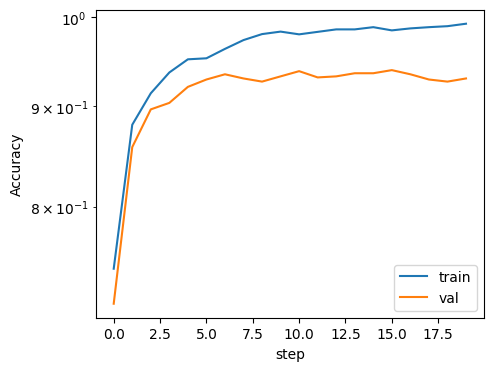

In [46]:
model = KAN(width=[attributes, 12, 1], grid=8, k=3, seed=381, device=device)
best_model_state, results, _ = custom_fit(model, dataset, opt="LBFGS", steps=20, lamb=0.001,
                                          metrics=(train_acc_kan, val_acc_kan), display_metrics=['train_acc_kan', 'val_acc_kan'])
plot_training_ACC(model, best_model_state, dataset['test_label'][:,0], model(dataset['test_input'])[:,0],
                  results['train_acc_kan'], results['val_acc_kan'])

In [47]:
plot_confusion_matrix(dataset['test_label'][:,0], model(dataset['test_input'])[:,0], title="Confusion Matrix")

[[412  25   3   1]
 [  3 411   5   1]
 [  0   4  62   0]
 [  1   5  19 140]]


array([[412,  25,   3,   1],
       [  3, 411,   5,   1],
       [  0,   4,  62,   0],
       [  1,   5,  19, 140]], dtype=int64)

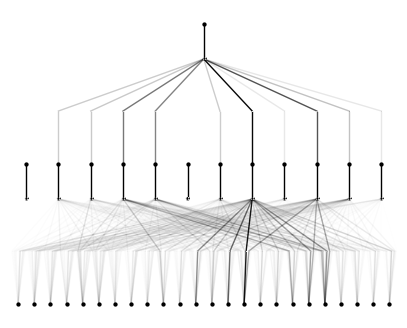

In [48]:
model.plot()

[('V15', 0.7205136), ('V20', 0.5018514), ('V19', 0.35363477), ('V14', 0.32254362), ('V12', 0.2588088), ('V18', 0.25326848), ('V10', 0.18166798), ('V5', 0.181334), ('V13', 0.17880335), ('V6', 0.16233715), ('V17', 0.14206776), ('V24', 0.12878905), ('V4', 0.1280533), ('V3', 0.12735932), ('V21', 0.12553105), ('V22', 0.12358998), ('V2', 0.123083234), ('V16', 0.12219272), ('V8', 0.116725355), ('V7', 0.10790293), ('V11', 0.10657196), ('V23', 0.10410144), ('V9', 0.10166758), ('V1', 0.090189055)]


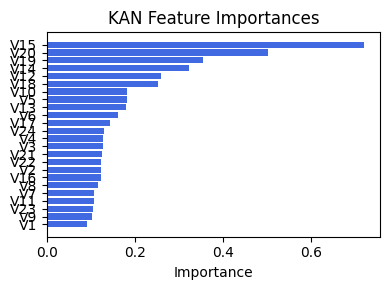

[('V15', 0.7205136),
 ('V20', 0.5018514),
 ('V19', 0.35363477),
 ('V14', 0.32254362),
 ('V12', 0.2588088),
 ('V18', 0.25326848),
 ('V10', 0.18166798),
 ('V5', 0.181334),
 ('V13', 0.17880335),
 ('V6', 0.16233715),
 ('V17', 0.14206776),
 ('V24', 0.12878905),
 ('V4', 0.1280533),
 ('V3', 0.12735932),
 ('V21', 0.12553105),
 ('V22', 0.12358998),
 ('V2', 0.123083234),
 ('V16', 0.12219272),
 ('V8', 0.116725355),
 ('V7', 0.10790293),
 ('V11', 0.10657196),
 ('V23', 0.10410144),
 ('V9', 0.10166758),
 ('V1', 0.090189055)]

In [49]:
plot_sorted_feature_importance(x_col, model.feature_score)

### 2. width=[24, 5, 1], grid=7, lamb=1e-07 | best_epoch=19 | acc_test=0.93956

checkpoint directory created: ./model
saving model version 0.0


 train_acc_kan: 9.84e-01 | val_acc_kan: 9.44e-01 |: 100%|███████████| 25/25 [00:34<00:00,  1.38s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4387e-01 at 24 epoch
tensor(0.9405, device='cuda:0')


tensor(0.9405, device='cuda:0')

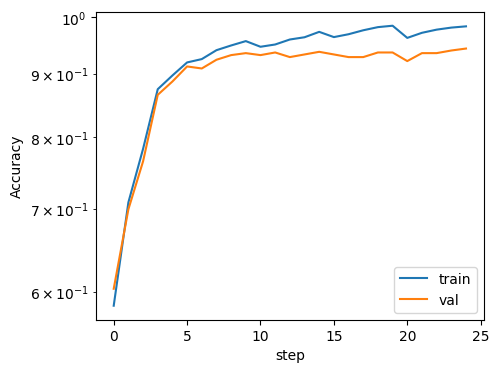

In [60]:
model = KAN(width=[attributes, 5, 1], grid=7, k=3, seed=381, device=device)
best_model_state, results, _ = custom_fit(model, dataset, opt="LBFGS", steps=25, lamb=1e-07,
                                          metrics=(train_acc_kan, val_acc_kan), display_metrics=['train_acc_kan', 'val_acc_kan'])
plot_training_ACC(model, best_model_state, dataset['test_label'][:,0], model(dataset['test_input'])[:,0],
                  results['train_acc_kan'], results['val_acc_kan'])

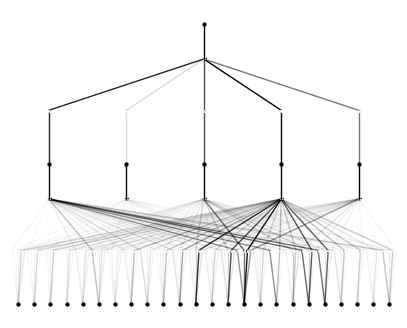

In [61]:
model.plot()

In [62]:
plot_confusion_matrix(dataset['test_label'][:,0], model(dataset['test_input'])[:,0], title="Confusion Matrix")

[[418  20   2   1]
 [  8 407   3   2]
 [  1   9  54   2]
 [  3   2  12 148]]


array([[418,  20,   2,   1],
       [  8, 407,   3,   2],
       [  1,   9,  54,   2],
       [  3,   2,  12, 148]], dtype=int64)

[('V15', 1.0719963), ('V19', 0.5573939), ('V12', 0.51437366), ('V20', 0.50086236), ('V14', 0.43167537), ('V17', 0.2692169), ('V11', 0.21304394), ('V18', 0.20386389), ('V24', 0.18995684), ('V6', 0.17213984), ('V21', 0.14557846), ('V8', 0.14530358), ('V10', 0.14164215), ('V1', 0.12634565), ('V16', 0.12476687), ('V13', 0.122186735), ('V9', 0.12136726), ('V3', 0.104929835), ('V5', 0.09771918), ('V2', 0.0965341), ('V22', 0.09578386), ('V7', 0.0858482), ('V4', 0.08309814), ('V23', 0.08075081)]


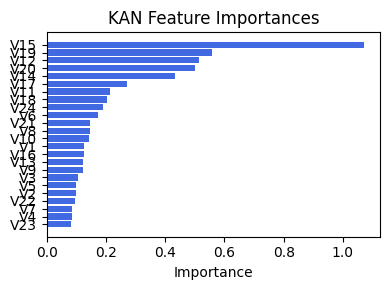

[('V15', 1.0719963),
 ('V19', 0.5573939),
 ('V12', 0.51437366),
 ('V20', 0.50086236),
 ('V14', 0.43167537),
 ('V17', 0.2692169),
 ('V11', 0.21304394),
 ('V18', 0.20386389),
 ('V24', 0.18995684),
 ('V6', 0.17213984),
 ('V21', 0.14557846),
 ('V8', 0.14530358),
 ('V10', 0.14164215),
 ('V1', 0.12634565),
 ('V16', 0.12476687),
 ('V13', 0.122186735),
 ('V9', 0.12136726),
 ('V3', 0.104929835),
 ('V5', 0.09771918),
 ('V2', 0.0965341),
 ('V22', 0.09578386),
 ('V7', 0.0858482),
 ('V4', 0.08309814),
 ('V23', 0.08075081)]

In [63]:
plot_sorted_feature_importance(x_col, model.feature_score)

# CNN training ✅ Top 2 Configurations

### 1. cnn_blocks=1, dense_layers=1 | best_epoch=18 | loss=3.22069

In [47]:
build_custom_cnn_model(cnn_blocks=1, dense_layers=1, imgs_shape=imgs_shape)

CustomCNNModel(
  (cnn_branch): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (1): LayerNorm((16, 8, 8), eps=1e-05, elementwise_affine=True)
    (2): Sigmoid()
    (3): Flatten(start_dim=1, end_dim=-1)
  )
  (fc): Sequential(
    (0): Linear(in_features=1024, out_features=1, bias=True)
  )
)

| Train: 8.9853e+00 | Val: 1.0173e+01 |: 100%|████████████████████| 100/100 [00:37<00:00,  2.68it/s]


✅ Best validation loss: 9.5183e+00 at 22 epoch
3.311112880706787


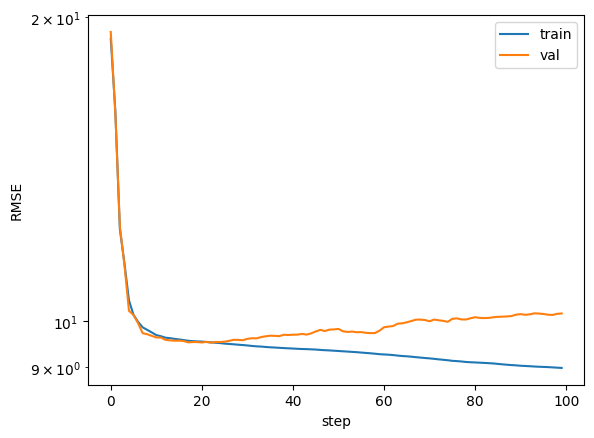

In [38]:
model = build_custom_cnn_model(cnn_blocks=1, dense_layers=1, imgs_shape=imgs_shape)
model_state, results, _ = fit_cnn_only_model(model, dataset, steps=100)
plot_training_RMSE(model, model_state, average_rmse(model(0, dataset['test_img']), dataset['test_label']), results['train_loss'], results['val_loss'])

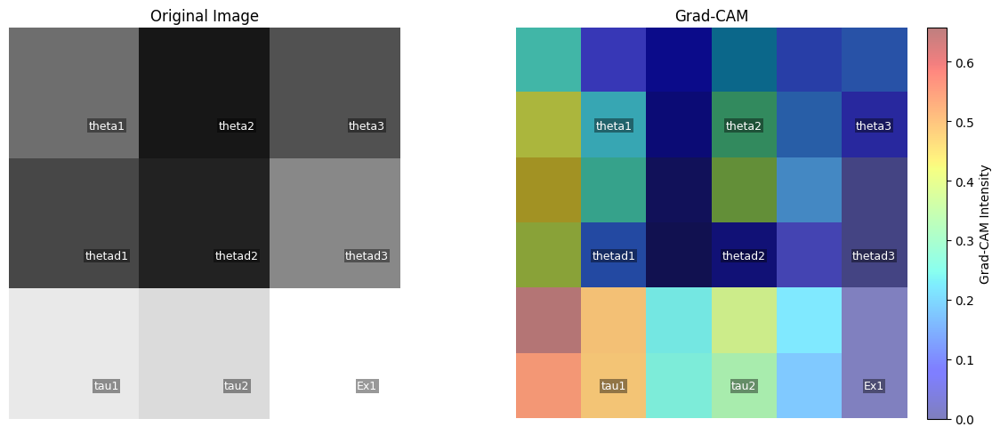

In [39]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [06:11<00:00,  4.41it/s]


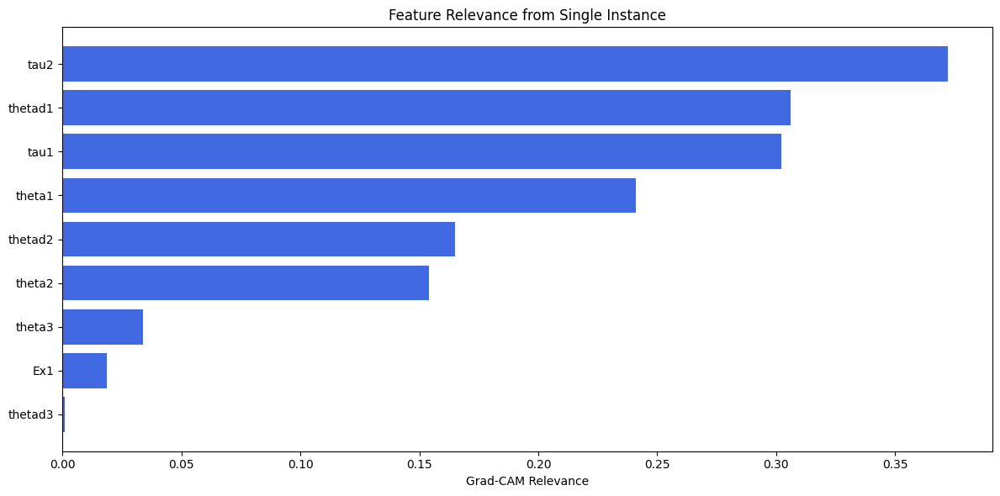

In [40]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. cnn_blocks=3, dense_layers=2 | best_epoch=4 | loss=3.24624

| Train: 2.5414e+00 | Val: 1.7249e+01 |: 100%|████████████████████| 110/110 [01:03<00:00,  1.73it/s]


✅ Best validation loss: 9.8724e+00 at 3 epoch
4.303581714630127


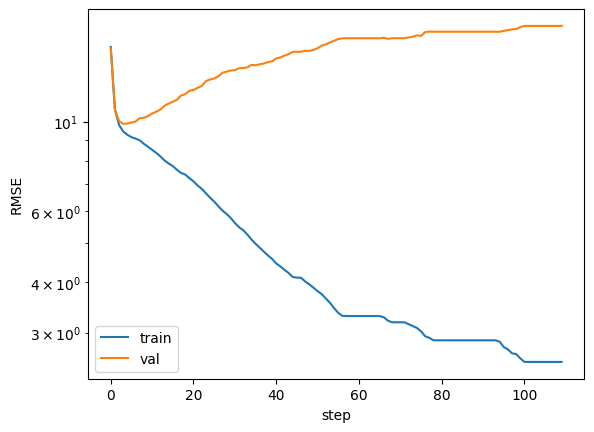

In [41]:
model = build_custom_cnn_model(cnn_blocks=3, dense_layers=2, imgs_shape=imgs_shape)
model_state, results, _ = fit_cnn_only_model(model, dataset, steps=110)
plot_training_RMSE(model, model_state, average_rmse(model(0, dataset['test_img']), dataset['test_label']), results['train_loss'], results['val_loss'])

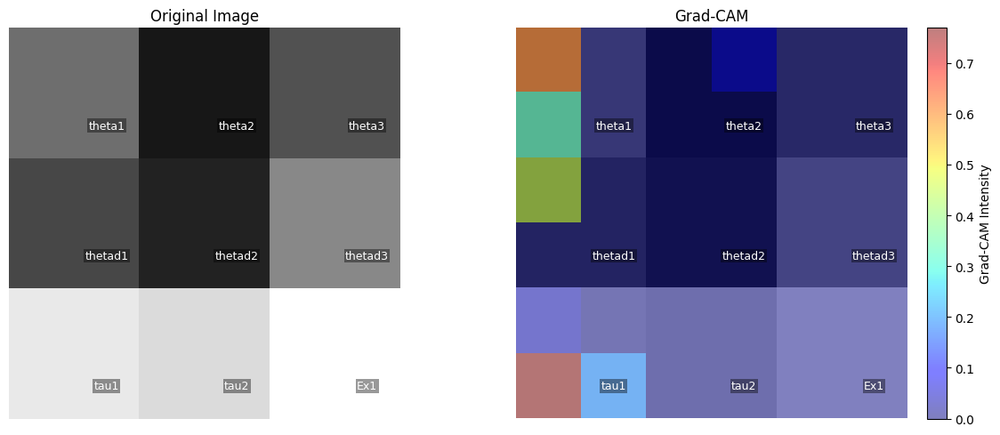

In [42]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [06:16<00:00,  4.35it/s] 


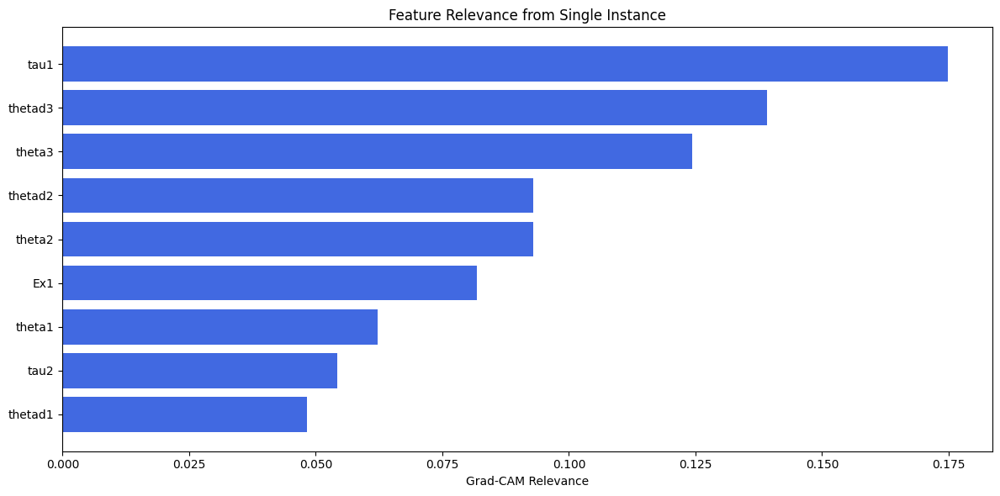

In [43]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Set Files Name

In [42]:
filename_0=f'{dataset_name}_Concat_Op0.csv'
filename_1=f'{dataset_name}_Concat_Op1.csv'
filename_2=f'{dataset_name}_Concat_Op2.csv'
filename_3=f'{dataset_name}_Concat_Op3.csv'
filename_4=f'{dataset_name}_Concat_Op4.csv'

In [43]:
columns_opt0 = '_'
columns_opt1 = 'cnn_bottleneck_dim'
columns_opt2 = 'alpha'
columns_opt3 = 'hidden_dim'
columns_opt4 = 'embed_dim, num_heads'

# Option 0: Concat full best KAN with full best CNN

In [51]:
create_csv_with_header(filename_0, columns_opt0)

### 0.1.0 width=[24, 12, 1], grid=8, lamb=0.001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 8.95e-01 | val_acc_hybrid: 4.63e-01 |: 100%|█████| 30/30 [01:09<00:00,  2.31s/it]


saving model version 0.1
✅ Best validation Accuracy: 4.7079e-01 at 17 epoch
tensor(0.4844, device='cuda:0')
[[277  85  45  34]
 [114 146 116  44]
 [ 10   7  25  24]
 [ 14  19  51  81]]
M_KAN Relevance: 0.99950110912323
CNN Relevance: 0.0004989283042959869
[('V22', 0.87811685), ('V7', 0.868108), ('V5', 0.8380544), ('V10', 0.7832491), ('V13', 0.75234413), ('V4', 0.74278975), ('V12', 0.70256287), ('V14', 0.6627185), ('V15', 0.66062737), ('V9', 0.5978066), ('V20', 0.56493604), ('V19', 0.52262276), ('V2', 0.48763677), ('V16', 0.48311928), ('V18', 0.483099), ('V23', 0.47601992), ('V6', 0.47278094), ('V3', 0.44828406), ('V11', 0.44738466), ('V17', 0.38467833), ('V8', 0.37432033), ('V24', 0.35833624), ('V21', 0.34961724), ('V1', 0.3060642)]


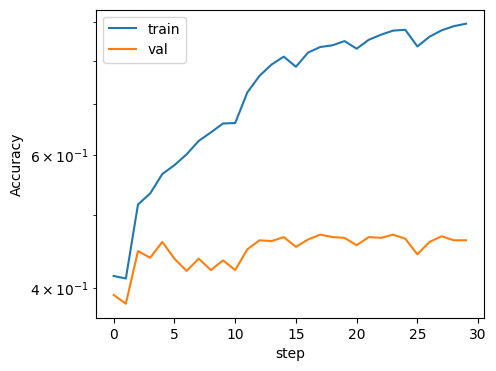

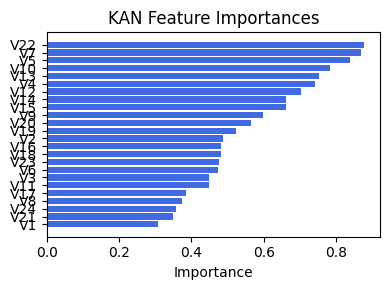

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.3144145498044564), ('V17', 0.30901988463605506), ('V20', 0.3001298844650552), ('V12', 0.2917823071195829), ('V15', 0.29065394664710753), ('V23', 0.28483910556633585), ('V18', 0.2737386945030403), ('V21', 0.2588204550573896), ('V24', 0.25402299476546086), ('V7', 0.23920573152310895), ('V11', 0.2340424695758374), ('V16', 0.2329898280374733), ('V13', 0.22420721159797613), ('V19', 0.22183141370882595), ('V14', 0.21671814242175963), ('V8', 0.19577253345663842), ('V6', 0.19440158440189048), ('V10', 0.18780767791495137), ('V2', 0.1780439089064106), ('V1', 0.16347123049336038), ('V9', 0.15879763358131038), ('V4', 0.12970711233180368), ('V3', 0.12496832561822678), ('V5', 0.1108675092338685), ('Ex1', 0.07930627378195222)]


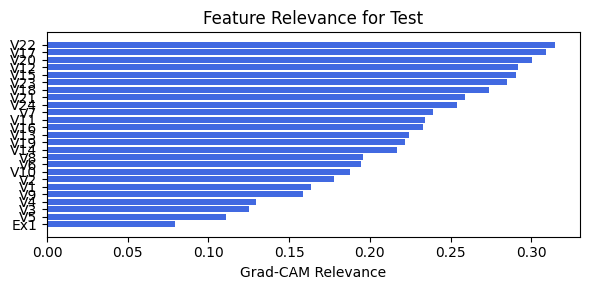

In [52]:
train_and_plot_relevance(Model3_0, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=30, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.1.1 width=[24, 12, 1], grid=8, lamb=0.001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 8.93e-01 | val_acc_hybrid: 4.50e-01 |: 100%|█████| 30/30 [01:05<00:00,  2.19s/it]


saving model version 0.1
✅ Best validation Accuracy: 4.6506e-01 at 17 epoch
tensor(0.4496, device='cuda:0')
[[231 108  72  30]
 [136 140  97  47]
 [  9   8  34  15]
 [ 17  16  46  86]]
M_KAN Relevance: 0.9626203775405884
CNN Relevance: 0.03737960010766983
[('V7', 0.83244926), ('V14', 0.7892882), ('V22', 0.77047265), ('V4', 0.71118426), ('V5', 0.6991003), ('V10', 0.68679833), ('V13', 0.6781446), ('V23', 0.6719653), ('V12', 0.6164285), ('V15', 0.5770143), ('V11', 0.55262977), ('V19', 0.5519262), ('V9', 0.5151061), ('V16', 0.48468018), ('V20', 0.48268026), ('V2', 0.4569648), ('V24', 0.4267178), ('V17', 0.42045903), ('V3', 0.4131961), ('V6', 0.41239995), ('V21', 0.41162544), ('V18', 0.39313686), ('V8', 0.36191186), ('V1', 0.34173542)]


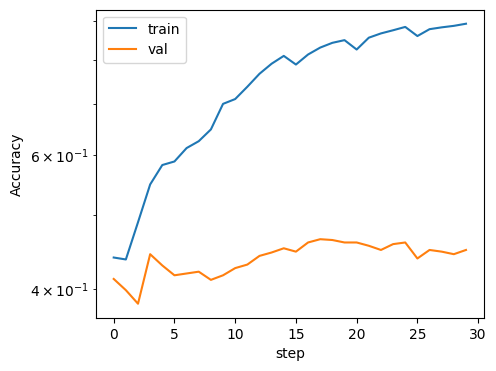

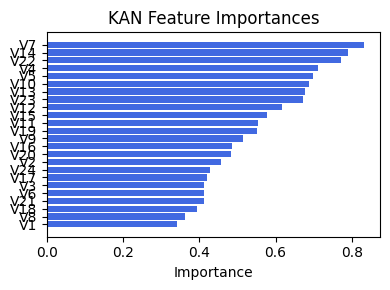

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V3', 0.40061618745558975), ('V5', 0.37650534450571177), ('V4', 0.3719854469482715), ('V2', 0.36129814102536156), ('V1', 0.35229172718612267), ('V23', 0.3189268083842096), ('V6', 0.31396019070466485), ('V24', 0.31073684552910436), ('V19', 0.30673585461977965), ('V18', 0.2878205132148964), ('V11', 0.2871204987723054), ('V16', 0.25567110013246785), ('V9', 0.24639813390897275), ('V7', 0.24599665467767642), ('V10', 0.22101094752368614), ('V14', 0.211906603877471), ('V8', 0.2098482788286484), ('V21', 0.2025180023301542), ('V22', 0.19943876053330048), ('V17', 0.19034747709949257), ('V20', 0.1740510391987783), ('V12', 0.15632247084035802), ('V13', 0.13968048938657196), ('V15', 0.13953955456036254), ('Ex1', 0.10004197334382008)]


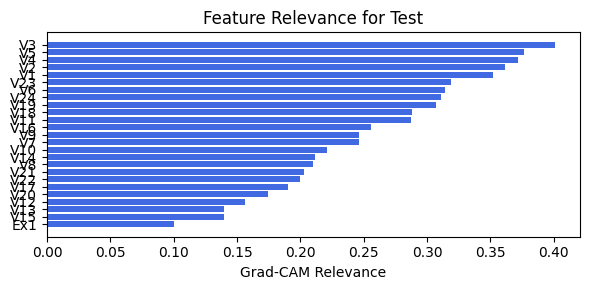

In [53]:
train_and_plot_relevance(Model3_0, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=30, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.2.1 width=[24, 5, 1], grid=7, lamb=1e-07

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.85e-01 | val_acc_hybrid: 6.11e-01 |: 100%|█████| 30/30 [01:12<00:00,  2.43s/it]


saving model version 0.1
✅ Best validation Accuracy: 6.4147e-01 at 17 epoch
tensor(0.6383, device='cuda:0')
[[309 111  15   6]
 [ 82 272  36  30]
 [ 11  20  20  15]
 [  5  27  37  96]]
M_KAN Relevance: 0.824457049369812
CNN Relevance: 0.1755429208278656
[('V10', 0.46869385), ('V13', 0.46473482), ('V3', 0.4051485), ('V23', 0.3953135), ('V19', 0.38264963), ('V20', 0.3232857), ('V16', 0.32290864), ('V15', 0.32186854), ('V12', 0.27561632), ('V4', 0.24900183), ('V14', 0.2371213), ('V24', 0.22575535), ('V5', 0.22126368), ('V22', 0.21704955), ('V21', 0.21076164), ('V11', 0.20769484), ('V6', 0.19407563), ('V7', 0.18920738), ('V8', 0.1846742), ('V1', 0.17522775), ('V17', 0.17399399), ('V2', 0.16980965), ('V18', 0.14392303), ('V9', 0.12839715)]


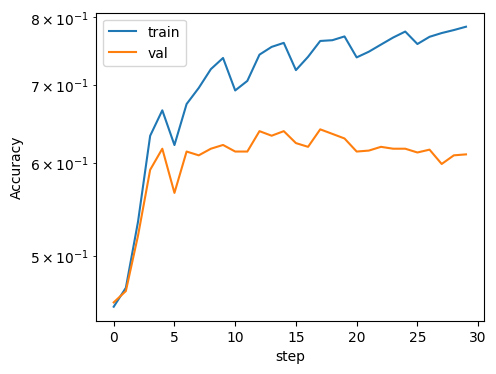

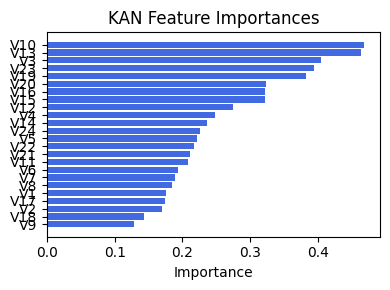

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V5', 0.5276965298595621), ('V4', 0.3954486544021981), ('V10', 0.37047977521221614), ('V3', 0.3693363711351125), ('V1', 0.3411039598070838), ('V2', 0.3121032003322058), ('V21', 0.3060313596420384), ('V18', 0.24791151692283991), ('V6', 0.24429630912176362), ('V11', 0.2345551812506175), ('V17', 0.23295787515586938), ('V8', 0.23197572311150225), ('V12', 0.2316988991796689), ('V15', 0.23006719377767845), ('V20', 0.2270975110196816), ('V13', 0.22175505663133516), ('V9', 0.21243751750145562), ('V19', 0.21005908861004102), ('V7', 0.2060562679279255), ('V16', 0.19132944499851406), ('V14', 0.18317200805170983), ('V22', 0.13856992901298823), ('V23', 0.13204689309028061), ('V24', 0.12410634317132133), ('Ex1', 0.11058205339990503)]


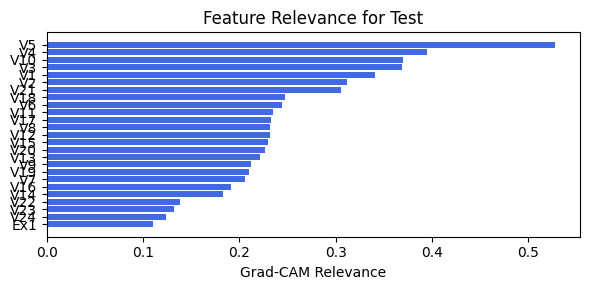

In [54]:
train_and_plot_relevance(Model3_0, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=30, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.2.2 width=[24, 5, 1], grid=7, lamb=1e-07

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.85e-01 | val_acc_hybrid: 6.11e-01 |: 100%|█████| 30/30 [01:09<00:00,  2.30s/it]


saving model version 0.1
✅ Best validation Accuracy: 6.4147e-01 at 17 epoch
tensor(0.6383, device='cuda:0')
[[309 111  15   6]
 [ 82 272  36  30]
 [ 11  20  20  15]
 [  5  27  37  96]]
M_KAN Relevance: 0.824457049369812
CNN Relevance: 0.1755429208278656
[('V10', 0.46869385), ('V13', 0.46473482), ('V3', 0.4051485), ('V23', 0.3953135), ('V19', 0.38264963), ('V20', 0.3232857), ('V16', 0.32290864), ('V15', 0.32186854), ('V12', 0.27561632), ('V4', 0.24900183), ('V14', 0.2371213), ('V24', 0.22575535), ('V5', 0.22126368), ('V22', 0.21704955), ('V21', 0.21076164), ('V11', 0.20769484), ('V6', 0.19407563), ('V7', 0.18920738), ('V8', 0.1846742), ('V1', 0.17522775), ('V17', 0.17399399), ('V2', 0.16980965), ('V18', 0.14392303), ('V9', 0.12839715)]


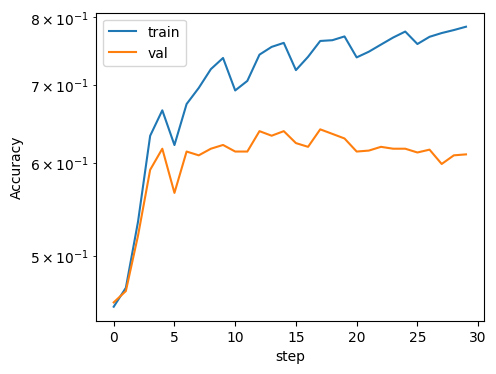

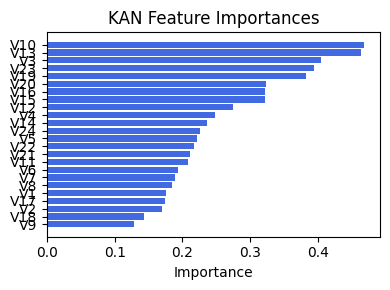

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V5', 0.5276965298595621), ('V4', 0.3954486544021981), ('V10', 0.37047977521221614), ('V3', 0.3693363711351125), ('V1', 0.3411039598070838), ('V2', 0.3121032003322058), ('V21', 0.3060313596420384), ('V18', 0.24791151692283991), ('V6', 0.24429630912176362), ('V11', 0.2345551812506175), ('V17', 0.23295787515586938), ('V8', 0.23197572311150225), ('V12', 0.2316988991796689), ('V15', 0.23006719377767845), ('V20', 0.2270975110196816), ('V13', 0.22175505663133516), ('V9', 0.21243751750145562), ('V19', 0.21005908861004102), ('V7', 0.2060562679279255), ('V16', 0.19132944499851406), ('V14', 0.18317200805170983), ('V22', 0.13856992901298823), ('V23', 0.13204689309028061), ('V24', 0.12410634317132133), ('Ex1', 0.11058205339990503)]


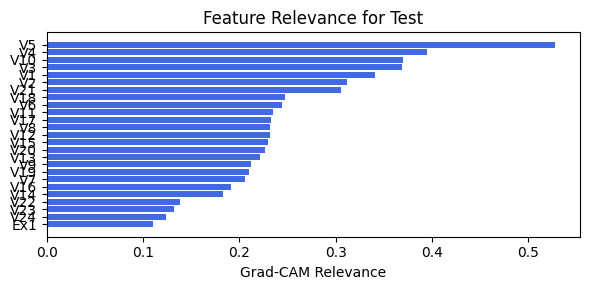

In [55]:
train_and_plot_relevance(Model3_0, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=30, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.3.1 width=[24, 7, 1], grid=8, lamb=0.001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 9.44e-01 | val_acc_hybrid: 6.93e-01 |: 100%|█████| 30/30 [01:09<00:00,  2.33s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2852e-01 at 9 epoch
tensor(0.7051, device='cuda:0')
[[364  65   5   7]
 [ 45 284  51  40]
 [  0  27  17  22]
 [  0  21  39 105]]
M_KAN Relevance: 0.9998306035995483
CNN Relevance: 0.00016932676953729242
[('V11', 0.6136399), ('V12', 0.5624487), ('V5', 0.4945531), ('V9', 0.48971242), ('V18', 0.4794108), ('V15', 0.478551), ('V20', 0.47606125), ('V19', 0.45592353), ('V13', 0.41092598), ('V4', 0.4107059), ('V16', 0.3869965), ('V24', 0.38511568), ('V10', 0.32458767), ('V14', 0.30062374), ('V7', 0.27099085), ('V6', 0.25872263), ('V2', 0.25401935), ('V21', 0.23524293), ('V1', 0.22846478), ('V22', 0.22319426), ('V23', 0.22177528), ('V8', 0.19444944), ('V3', 0.18677297), ('V17', 0.112709075)]


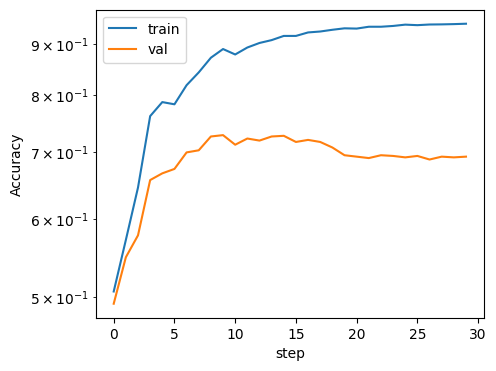

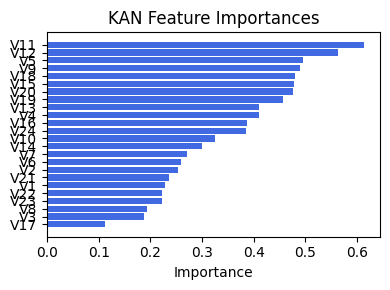

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V3', 0.3908860599909171), ('V5', 0.38227196419850373), ('V4', 0.3736871572641226), ('V2', 0.364122952242474), ('V1', 0.35968622205021616), ('V19', 0.3315375412150368), ('V6', 0.3140898653640921), ('V18', 0.3100477742172365), ('V23', 0.3075462880233284), ('V24', 0.30078808117720585), ('V11', 0.2898592798430913), ('V16', 0.2580534831551301), ('V7', 0.2498899320658833), ('V14', 0.24818737449972197), ('V9', 0.23365715009159488), ('V8', 0.23247856813033163), ('V17', 0.22347542323500869), ('V10', 0.21638026128800444), ('V21', 0.21306899673370747), ('V22', 0.20640277690620348), ('V12', 0.19896479943353979), ('V20', 0.19377174174283876), ('V13', 0.18482141461657897), ('V15', 0.16663750653015919), ('Ex1', 0.11021366328131724)]


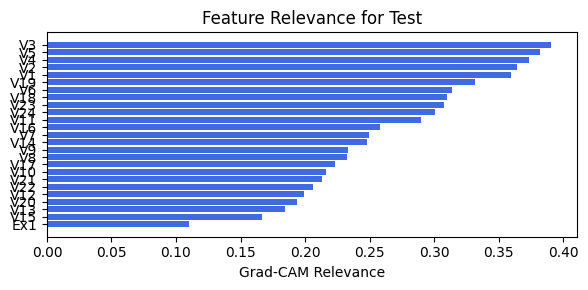

In [56]:
train_and_plot_relevance(Model3_0, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=30, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.3.2 width=[24, 7, 1], grid=8, lamb=0.001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 9.42e-01 | val_acc_hybrid: 7.15e-01 |: 100%|█████| 30/30 [01:07<00:00,  2.27s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3196e-01 at 17 epoch
tensor(0.7234, device='cuda:0')
[[369  61   5   6]
 [ 43 301  33  43]
 [  0  35  15  16]
 [  0  27  33 105]]
M_KAN Relevance: 0.998924970626831
CNN Relevance: 0.001074971747584641
[('V11', 0.633779), ('V12', 0.5599554), ('V15', 0.5292922), ('V5', 0.4879504), ('V18', 0.46741945), ('V20', 0.4655883), ('V9', 0.4494378), ('V4', 0.43225744), ('V13', 0.3921645), ('V24', 0.38481167), ('V19', 0.382323), ('V7', 0.36969274), ('V16', 0.320997), ('V10', 0.31955218), ('V14', 0.3066236), ('V6', 0.28671697), ('V22', 0.24515787), ('V3', 0.2245481), ('V21', 0.22373804), ('V2', 0.20826349), ('V23', 0.20402353), ('V1', 0.19846824), ('V8', 0.16189678), ('V17', 0.099975035)]


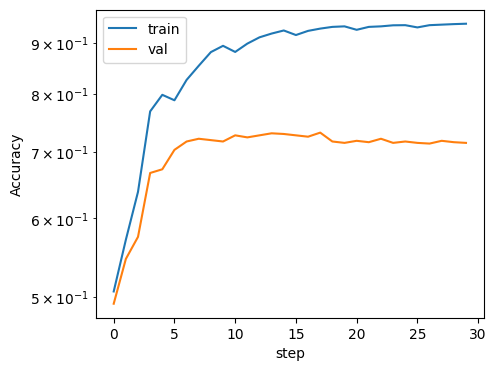

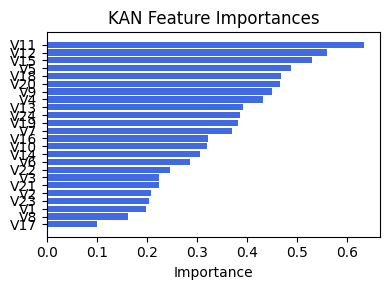

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.36539717024744867), ('V23', 0.3557581793358669), ('V3', 0.34842618180809015), ('V18', 0.34590767475172124), ('V24', 0.34219003372421425), ('V5', 0.3367682992866188), ('V4', 0.3302647959378688), ('V2', 0.3216201039133491), ('V1', 0.3181113904212421), ('V6', 0.2745191017931355), ('V14', 0.24988550119375955), ('V11', 0.2489763676393066), ('V17', 0.2428823906620442), ('V22', 0.23887871016510234), ('V16', 0.23208008924757784), ('V9', 0.22899494118968633), ('V7', 0.22086810675159269), ('V8', 0.21870374224692815), ('V21', 0.19314284178596938), ('V10', 0.19076862312158815), ('V20', 0.1870996370125395), ('V12', 0.18399519669950537), ('V13', 0.17693206392799593), ('V15', 0.15205013113644958), ('Ex1', 0.11851048471288488)]


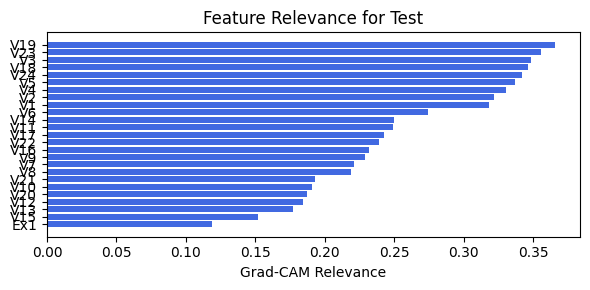

In [57]:
train_and_plot_relevance(Model3_0, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=30, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.4.1 width=[24, 9, 1], grid=8, lamb=0.001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 8.77e-01 | val_acc_hybrid: 5.09e-01 |: 100%|█████| 30/30 [01:06<00:00,  2.22s/it]


saving model version 0.1
✅ Best validation Accuracy: 5.5670e-01 at 6 epoch
tensor(0.5421, device='cuda:0')
[[241 161  23  16]
 [ 74 261  47  38]
 [ 13  22  11  20]
 [  8  44  34  79]]
M_KAN Relevance: 0.9995622038841248
CNN Relevance: 0.0004378018493298441
[('V11', 0.81094325), ('V9', 0.79808176), ('V7', 0.70680344), ('V4', 0.6944971), ('V22', 0.666417), ('V3', 0.66484964), ('V15', 0.56946707), ('V12', 0.564511), ('V23', 0.55288416), ('V6', 0.51721954), ('V20', 0.49151215), ('V16', 0.4549022), ('V14', 0.44849682), ('V19', 0.4445932), ('V5', 0.43837023), ('V17', 0.39815336), ('V2', 0.3981183), ('V10', 0.39366907), ('V21', 0.385777), ('V24', 0.32183975), ('V18', 0.29727638), ('V1', 0.29208133), ('V8', 0.2731029), ('V13', 0.24852666)]


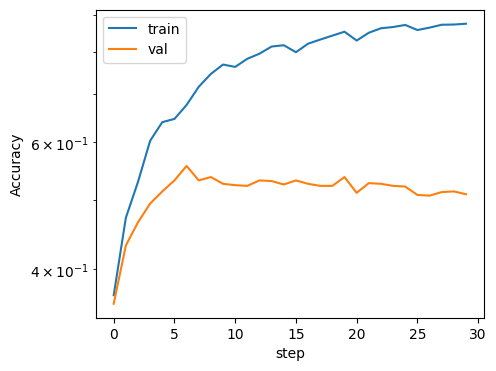

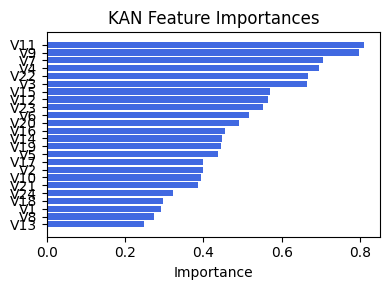

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V3', 0.5623362483230723), ('V5', 0.5493131943128922), ('V4', 0.5364419375802134), ('V2', 0.5194636991063317), ('V1', 0.512061343634085), ('V6', 0.45314889905970324), ('V11', 0.41117546157942336), ('V16', 0.3734485481281134), ('V7', 0.32049008651593686), ('V21', 0.3119544405931436), ('V10', 0.30141931875398736), ('V9', 0.2754110790415575), ('V8', 0.2695553321581105), ('V19', 0.1968990428929815), ('V24', 0.1899004277336964), ('V12', 0.18611309918758992), ('V23', 0.18521772143891552), ('V17', 0.1816203790163561), ('V18', 0.17606694658167524), ('V20', 0.16455272790612763), ('V14', 0.1558332660239842), ('V15', 0.14909883705042423), ('V22', 0.14662398746578142), ('V13', 0.1229458473860107), ('Ex1', 0.0749570234450839)]


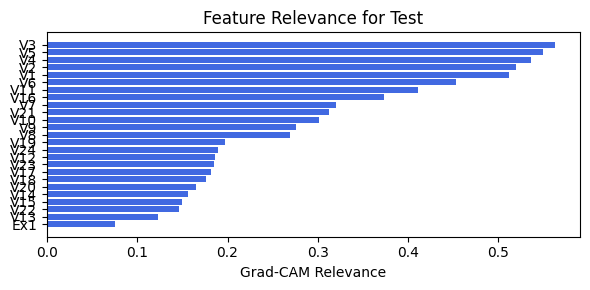

In [62]:
train_and_plot_relevance(Model3_0, kan_neurons=9, kan_grid=8, lamb=0.001, steps=30, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.4.2 width=[24, 9, 1], grid=8, lamb=0.001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 8.77e-01 | val_acc_hybrid: 5.09e-01 |: 100%|█████| 30/30 [01:08<00:00,  2.29s/it]


saving model version 0.1
✅ Best validation Accuracy: 5.5670e-01 at 6 epoch
tensor(0.5421, device='cuda:0')
[[241 161  23  16]
 [ 74 261  47  38]
 [ 13  22  11  20]
 [  8  44  34  79]]
M_KAN Relevance: 0.9995622038841248
CNN Relevance: 0.0004378018493298441
[('V11', 0.81094325), ('V9', 0.79808176), ('V7', 0.70680344), ('V4', 0.6944971), ('V22', 0.666417), ('V3', 0.66484964), ('V15', 0.56946707), ('V12', 0.564511), ('V23', 0.55288416), ('V6', 0.51721954), ('V20', 0.49151215), ('V16', 0.4549022), ('V14', 0.44849682), ('V19', 0.4445932), ('V5', 0.43837023), ('V17', 0.39815336), ('V2', 0.3981183), ('V10', 0.39366907), ('V21', 0.385777), ('V24', 0.32183975), ('V18', 0.29727638), ('V1', 0.29208133), ('V8', 0.2731029), ('V13', 0.24852666)]


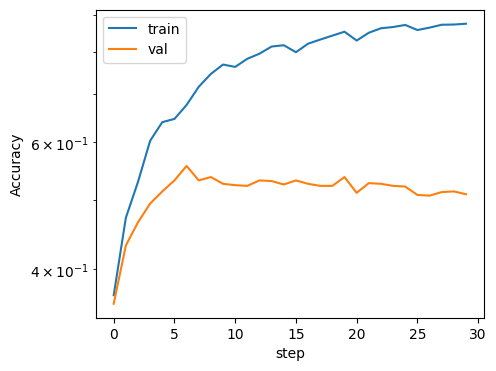

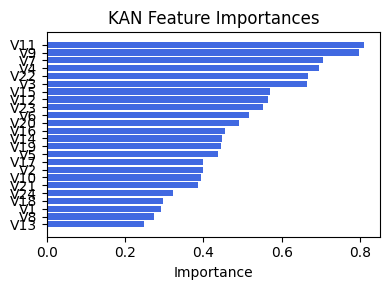

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V3', 0.5623362483230723), ('V5', 0.5493131943128922), ('V4', 0.5364419375802134), ('V2', 0.5194636991063317), ('V1', 0.512061343634085), ('V6', 0.45314889905970324), ('V11', 0.41117546157942336), ('V16', 0.3734485481281134), ('V7', 0.32049008651593686), ('V21', 0.3119544405931436), ('V10', 0.30141931875398736), ('V9', 0.2754110790415575), ('V8', 0.2695553321581105), ('V19', 0.1968990428929815), ('V24', 0.1899004277336964), ('V12', 0.18611309918758992), ('V23', 0.18521772143891552), ('V17', 0.1816203790163561), ('V18', 0.17606694658167524), ('V20', 0.16455272790612763), ('V14', 0.1558332660239842), ('V15', 0.14909883705042423), ('V22', 0.14662398746578142), ('V13', 0.1229458473860107), ('Ex1', 0.0749570234450839)]


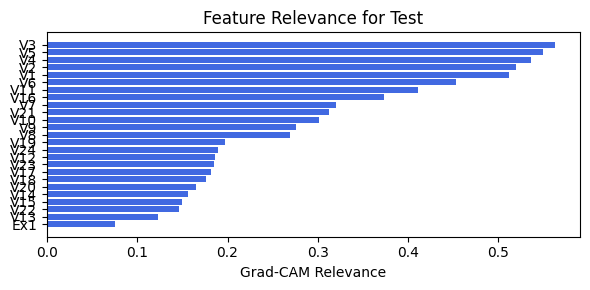

In [63]:
train_and_plot_relevance(Model3_0, kan_neurons=9, kan_grid=8, lamb=0.001, steps=30, n_kan_len=1, filename=filename_0, opt_col_val='_')

# Option 1: Concat KAN with (CNN with dense layer to reduce output_size)

In [64]:
create_csv_with_header(filename_1, columns_opt1)

## 1.0 width=[24, 12, 1], grid=8, lamb=0.001

### 1.0.0 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.96e-01 | val_acc_hybrid: 9.03e-01 |: 100%|█████| 40/40 [01:06<00:00,  1.65s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.2554e-01 at 6 epoch
tensor(0.9249, device='cuda:0')
[[406  32   1   2]
 [ 13 403   3   1]
 [  0   6  57   3]
 [  0   8  13 144]]
M_KAN Relevance: 0.9997903108596802
CNN Relevance: 0.00020965035946574062
[('V15', 0.30921492), ('V20', 0.2091307), ('V19', 0.20473877), ('V14', 0.19830728), ('V5', 0.19197725), ('V7', 0.17274855), ('V6', 0.16998307), ('V22', 0.12828064), ('V18', 0.10417422), ('V16', 0.10381331), ('V9', 0.09859258), ('V2', 0.098159894), ('V12', 0.09709354), ('V4', 0.09341186), ('V3', 0.08817811), ('V13', 0.07974079), ('V23', 0.07572817), ('V24', 0.07572742), ('V11', 0.072869286), ('V17', 0.060876857), ('V1', 0.05638834), ('V10', 0.055542763), ('V21', 0.048663095), ('V8', 0.04137975)]


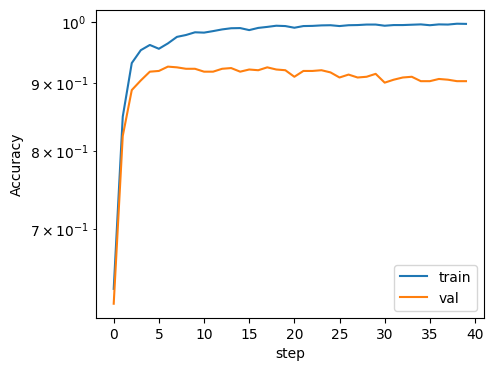

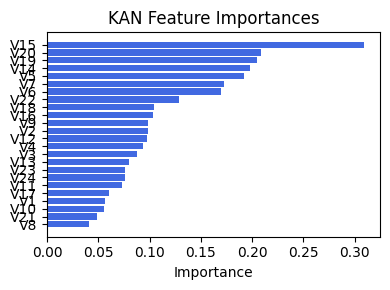

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.3454397917240508), ('V6', 0.32661678251925935), ('V5', 0.3178230827136262), ('V1', 0.3104766897371912), ('V11', 0.28634427444183785), ('V3', 0.2836854789945921), ('V21', 0.269129794440652), ('V4', 0.2667537737508257), ('V2', 0.26169862279142025), ('V23', 0.2599741082437867), ('V24', 0.23275556162078473), ('V22', 0.2183426496642727), ('V7', 0.2132516179044348), ('V10', 0.1871869970652566), ('V19', 0.17853911055520993), ('V18', 0.1767896658073522), ('V8', 0.17049140483844555), ('V9', 0.16965458659493984), ('V17', 0.16131396513285573), ('V14', 0.1356434187320948), ('V12', 0.1346127475355901), ('V20', 0.13377266889082232), ('V15', 0.12488544358398543), ('V13', 0.10006538351964471), ('Ex1', 0.07988037248138333)]


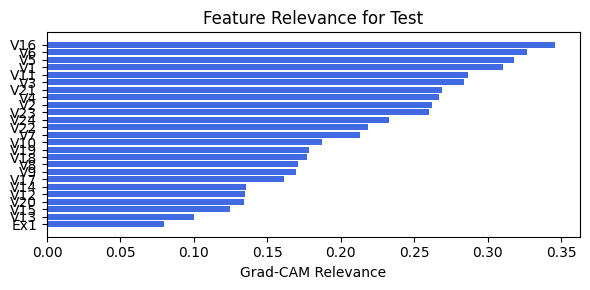

In [65]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=2, lamb=0.001, steps=40, filename=filename_1, opt_col_val=2)

### 1.0.1 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.95e-01 | val_acc_hybrid: 9.15e-01 |: 100%|█████| 40/40 [01:10<00:00,  1.77s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.2784e-01 at 21 epoch
tensor(0.9341, device='cuda:0')
[[416  20   5   0]
 [  8 406   5   1]
 [  0   7  56   3]
 [  1   7  15 142]]
M_KAN Relevance: 0.9992090463638306
CNN Relevance: 0.000790996418800205
[('V15', 0.34093314), ('V20', 0.25206408), ('V19', 0.22737578), ('V5', 0.19754049), ('V14', 0.16676871), ('V22', 0.1648305), ('V12', 0.1507487), ('V7', 0.15069315), ('V4', 0.14198288), ('V9', 0.13598904), ('V18', 0.1260939), ('V6', 0.12514383), ('V2', 0.1101532), ('V10', 0.106881015), ('V11', 0.099807195), ('V23', 0.09101044), ('V3', 0.090179086), ('V16', 0.09000236), ('V17', 0.08836361), ('V8', 0.08519288), ('V1', 0.07660875), ('V24', 0.07447415), ('V13', 0.07240473), ('V21', 0.059118062)]


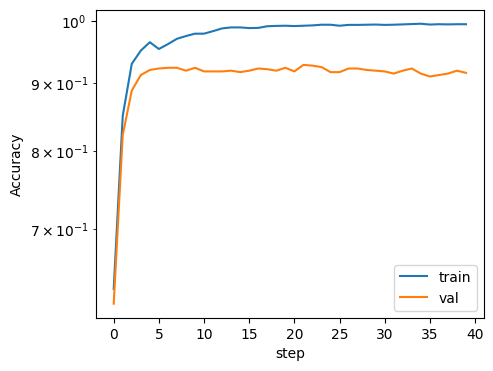

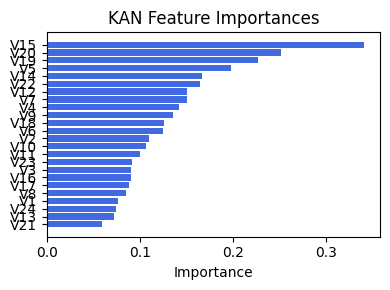

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V5', 0.4342175073670885), ('V1', 0.42142412629133713), ('V6', 0.4185120921553453), ('V16', 0.39292860977174326), ('V11', 0.37954371504560314), ('V3', 0.3573213581603141), ('V2', 0.34349617153221074), ('V4', 0.34267810988950215), ('V19', 0.3230585247473998), ('V21', 0.2986348255572086), ('V23', 0.2765848611952906), ('V24', 0.2700517296540096), ('V14', 0.269323433609722), ('V18', 0.26717144347248206), ('V10', 0.2582597878377856), ('V7', 0.24065194341363452), ('V9', 0.23496983725441242), ('V8', 0.23196824781944786), ('V17', 0.22281741202065222), ('V22', 0.2160745198506224), ('V20', 0.21268257009394356), ('V15', 0.19945283321836016), ('V12', 0.192968439184979), ('V13', 0.19160457202421002), ('Ex1', 0.15735228342798638)]


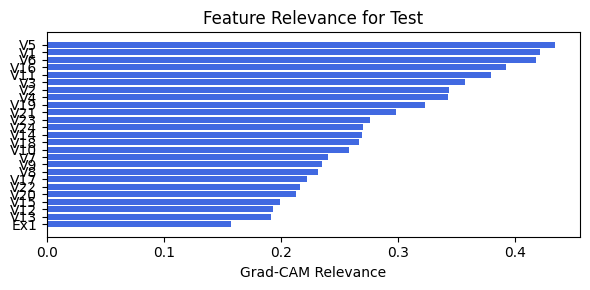

In [45]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=2, lamb=0.001, steps=40, filename=filename_1, opt_col_val=2)

### 1.0.2 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.94e-01 | val_acc_hybrid: 8.59e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.21it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.9003e-01 at 12 epoch
tensor(0.8984, device='cuda:0')
[[406  30   4   1]
 [ 17 382  21   0]
 [  0  10  53   3]
 [  0   4  21 140]]
M_KAN Relevance: 0.9260592460632324
CNN Relevance: 0.07394078373908997
[('V15', 0.35874447), ('V20', 0.23788014), ('V19', 0.17863297), ('V9', 0.15799153), ('V11', 0.14912547), ('V12', 0.12406044), ('V5', 0.11996448), ('V22', 0.11422229), ('V18', 0.11206061), ('V6', 0.109588966), ('V13', 0.10222995), ('V17', 0.09634113), ('V3', 0.09081527), ('V7', 0.08960699), ('V16', 0.08281509), ('V4', 0.08259896), ('V23', 0.08239292), ('V14', 0.07679178), ('V10', 0.071649365), ('V24', 0.06913616), ('V21', 0.0543937), ('V8', 0.051025044), ('V2', 0.04861524), ('V1', 0.038524415)]


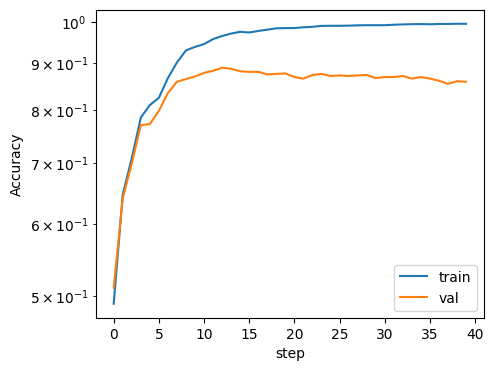

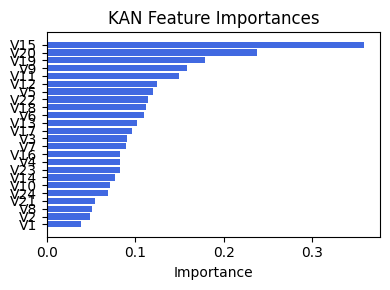

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V8', 0.03668801831900255), ('V14', 0.035805344219991576), ('V9', 0.03129422190878881), ('V7', 0.030389623747176523), ('V18', 0.026862401044466994), ('V13', 0.024779955169097298), ('V19', 0.022459787850510397), ('V12', 0.02062817059748127), ('V4', 0.01708430141567051), ('V17', 0.013652295660314529), ('V3', 0.012977652029124098), ('V2', 0.011837796183316217), ('V6', 0.010489164460143382), ('V11', 0.009571983558918954), ('V15', 0.009142994469011649), ('V10', 0.007183124032383273), ('V20', 0.00717132926501518), ('V5', 0.005376696861549468), ('V24', 0.005297401907168083), ('V23', 0.004643789741582486), ('V16', 0.004453693501034403), ('Ex1', 0.004353562412372425), ('V1', 0.0030047294612114248), ('V22', 0.0029693787488186624), ('V21', 0.0013779547243191054)]


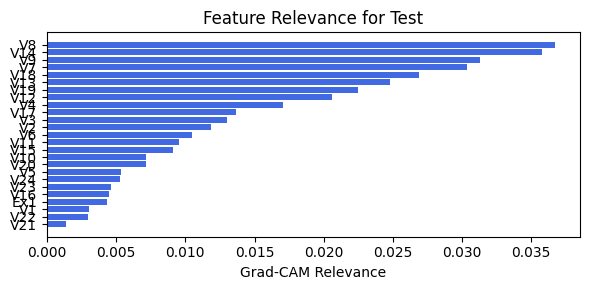

In [46]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=6, lamb=0.001, steps=40, filename=filename_1, opt_col_val=6)

### 1.0.3 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.95e-01 | val_acc_hybrid: 8.90e-01 |: 100%|█████| 40/40 [01:05<00:00,  1.64s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.1638e-01 at 14 epoch
tensor(0.9203, device='cuda:0')
[[416  18   6   1]
 [ 15 394  11   0]
 [  0   5  61   0]
 [  0   6  25 134]]
M_KAN Relevance: 0.9398931264877319
CNN Relevance: 0.06010684743523598
[('V15', 0.35617897), ('V20', 0.22958773), ('V9', 0.20902139), ('V19', 0.17559735), ('V11', 0.1716085), ('V13', 0.13133883), ('V5', 0.12055193), ('V4', 0.115437314), ('V18', 0.115251206), ('V22', 0.102446154), ('V16', 0.10189226), ('V12', 0.10016845), ('V14', 0.09561291), ('V17', 0.092104696), ('V10', 0.09148161), ('V6', 0.08963925), ('V23', 0.0865452), ('V7', 0.084571384), ('V3', 0.08143047), ('V24', 0.08027503), ('V8', 0.064779), ('V2', 0.06424643), ('V21', 0.057717066), ('V1', 0.04853348)]


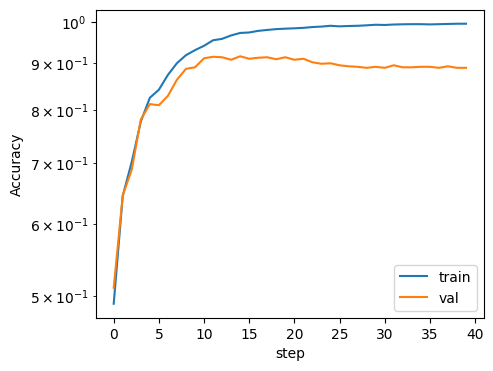

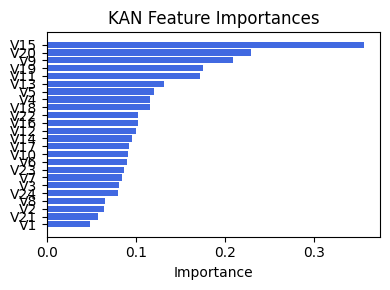

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V8', 0.036753960277871554), ('V9', 0.03198990210781604), ('V7', 0.029842554158343502), ('V13', 0.026181923716769112), ('V14', 0.024182208569809086), ('V12', 0.01877165923488664), ('V20', 0.018771466793963215), ('V18', 0.018025674307957675), ('V4', 0.01682212742662992), ('V17', 0.016621336186110235), ('V5', 0.015808752310763355), ('V3', 0.013664113362353882), ('V10', 0.013255907815365946), ('V15', 0.01277676613463239), ('V19', 0.012030441644891495), ('V2', 0.010680877598473332), ('V6', 0.00511506893728551), ('V11', 0.004024313517160468), ('V16', 0.003948497005128311), ('V24', 0.0029218712136756643), ('V22', 0.0018237723241647152), ('V1', 0.0011733821348027895), ('V21', 0.0009543917232417782), ('V23', 0.0007899263255373189), ('Ex1', 0.0005397581882036467)]


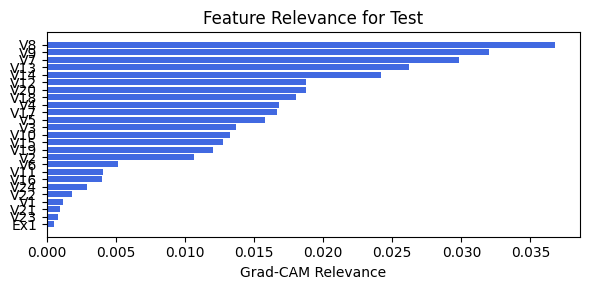

In [48]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=6, lamb=0.001, steps=40, filename=filename_1, opt_col_val=6)

### 1.0.4 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.75e-01 | val_acc_hybrid: 9.29e-01 |: 100%|█████| 40/40 [01:10<00:00,  1.75s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3127e-01 at 37 epoch
tensor(0.9093, device='cuda:0')
[[408  30   2   1]
 [ 20 392   6   2]
 [  0   8  57   1]
 [  1   9  19 136]]
M_KAN Relevance: 0.9514491558074951
CNN Relevance: 0.0485508032143116
[('V20', 0.30536652), ('V15', 0.24011026), ('V9', 0.21692848), ('V19', 0.20137787), ('V4', 0.18068898), ('V14', 0.17447686), ('V7', 0.16143437), ('V13', 0.11804311), ('V5', 0.11676711), ('V17', 0.11103642), ('V22', 0.10920356), ('V24', 0.10870919), ('V3', 0.106917284), ('V10', 0.103059106), ('V11', 0.10265743), ('V6', 0.101467155), ('V18', 0.09755224), ('V12', 0.08970015), ('V16', 0.08791061), ('V8', 0.08480993), ('V2', 0.06977054), ('V23', 0.060022887), ('V21', 0.05170889), ('V1', 0.048578262)]


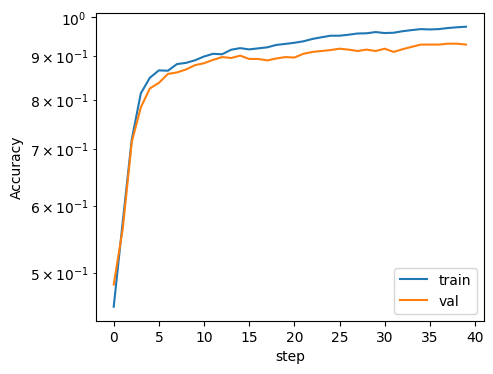

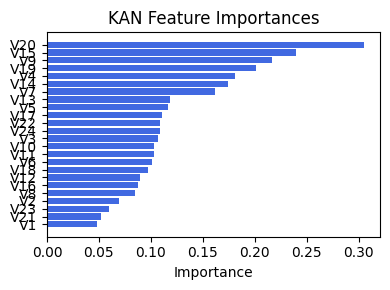

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.27685747453723375), ('V22', 0.26020989803522016), ('V23', 0.251537935728452), ('V16', 0.23336546964437663), ('V18', 0.20543651691370987), ('V17', 0.20028819649896265), ('V14', 0.19710627581211848), ('V19', 0.19700707524044536), ('V24', 0.19444367500519272), ('V9', 0.18845660720939916), ('V13', 0.18781919706051645), ('V12', 0.18480481607508448), ('V10', 0.18389999363042633), ('V11', 0.1819722393573255), ('V8', 0.17798519900367996), ('V20', 0.17665447023508077), ('Ex1', 0.16408799537604643), ('V7', 0.16020512666621275), ('V15', 0.15901714011705578), ('V3', 0.14955087334706832), ('V6', 0.1473486039577994), ('V5', 0.14533437327933688), ('V4', 0.12959305089081294), ('V2', 0.12526736758107143), ('V1', 0.08167340095460265)]


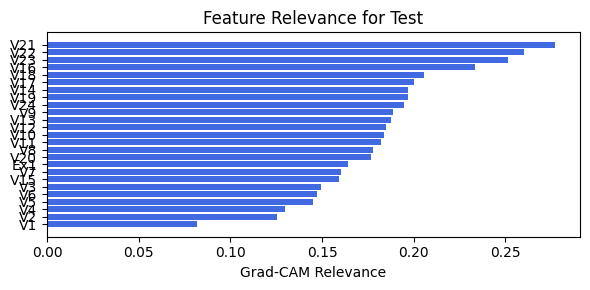

In [49]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=9, lamb=0.001, steps=40, filename=filename_1, opt_col_val=9)

### 1.0.5 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.70e-01 | val_acc_hybrid: 9.16e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.11it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1982e-01 at 38 epoch
tensor(0.9029, device='cuda:0')
[[407  30   3   1]
 [ 22 389   7   2]
 [  0  10  54   2]
 [  1   6  22 136]]
M_KAN Relevance: 0.9553065896034241
CNN Relevance: 0.04469335079193115
[('V15', 0.27660266), ('V9', 0.2323043), ('V20', 0.21000057), ('V7', 0.17428991), ('V14', 0.16237678), ('V19', 0.15081266), ('V5', 0.13550277), ('V13', 0.119736195), ('V22', 0.11876291), ('V10', 0.11157131), ('V17', 0.10700765), ('V3', 0.10616883), ('V12', 0.094807714), ('V18', 0.09231239), ('V11', 0.089220576), ('V4', 0.0879085), ('V23', 0.083970636), ('V16', 0.08250852), ('V8', 0.08194594), ('V6', 0.078546025), ('V2', 0.07514101), ('V24', 0.06936305), ('V21', 0.067788266), ('V1', 0.052171886)]


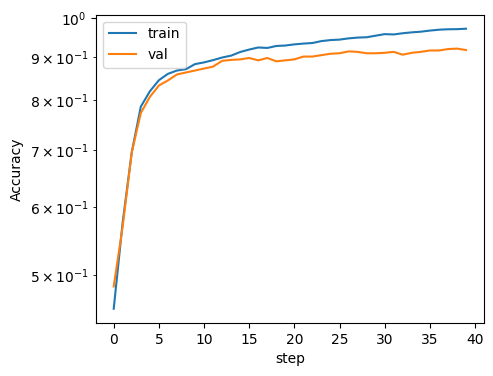

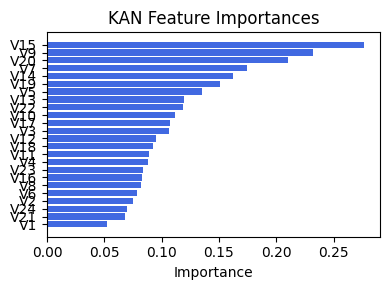

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.20679164272355643), ('V16', 0.184344640910563), ('V23', 0.18222460179781208), ('V22', 0.16193645121617317), ('V11', 0.15877513632228626), ('V20', 0.15450531414199548), ('V24', 0.15180683796216848), ('V21', 0.15077864724205425), ('V6', 0.14255278191454376), ('V10', 0.13638178785759042), ('V18', 0.11946444725231314), ('V3', 0.1191076497563213), ('V19', 0.11254814363866862), ('V15', 0.11025083704666924), ('V4', 0.1080537037205398), ('V17', 0.10701874922449281), ('V5', 0.10369876225135885), ('V8', 0.10144099669067032), ('V1', 0.10011476888599985), ('V9', 0.09712924211688558), ('V2', 0.09553082544537977), ('V13', 0.09171430382881), ('V14', 0.08969614775373767), ('V12', 0.0795442590177837), ('V7', 0.07484291181230379)]


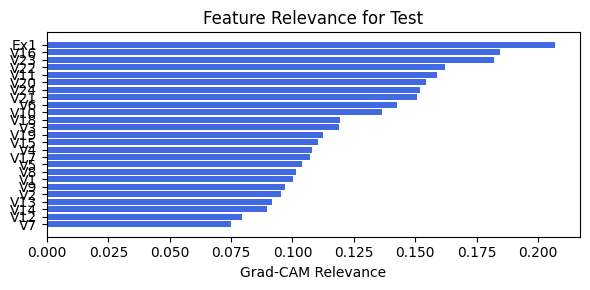

In [50]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=9, lamb=0.001, steps=40, filename=filename_1, opt_col_val=9)

### 1.0.6 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.94e-01 | val_acc_hybrid: 9.19e-01 |: 100%|█████| 40/40 [00:13<00:00,  3.02it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.3700e-01 at 18 epoch
tensor(0.9322, device='cuda:0')
[[412  27   1   1]
 [ 10 404   5   1]
 [  0   5  61   0]
 [  0   6  18 141]]
M_KAN Relevance: 0.9501841068267822
CNN Relevance: 0.04981588199734688
[('V20', 0.24828419), ('V14', 0.23467295), ('V19', 0.22897267), ('V15', 0.22231635), ('V9', 0.1387895), ('V18', 0.13811302), ('V12', 0.132382), ('V22', 0.12664406), ('V11', 0.10967441), ('V10', 0.105433695), ('V16', 0.098200455), ('V5', 0.097492956), ('V3', 0.08965275), ('V17', 0.08526805), ('V2', 0.08194383), ('V13', 0.07837486), ('V21', 0.07057824), ('V24', 0.06619745), ('V23', 0.06543018), ('V7', 0.063635856), ('V4', 0.05877485), ('V1', 0.047704533), ('V8', 0.047351986), ('V6', 0.042148672)]


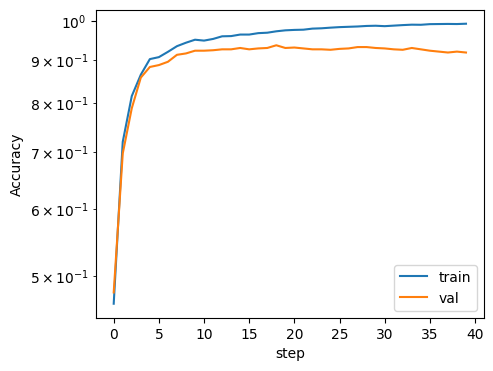

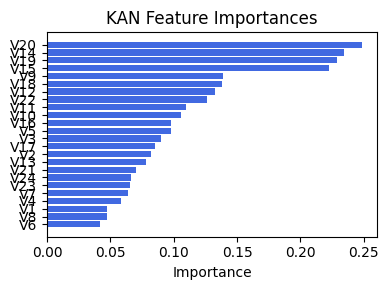

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.4663790604065517), ('V12', 0.38736593311024836), ('V18', 0.3755366938029187), ('V8', 0.324223747327685), ('V17', 0.3231914711339167), ('V14', 0.31886495380204394), ('V19', 0.31836976445970405), ('V7', 0.2707824881127592), ('V9', 0.2691900491532819), ('V3', 0.22857098470974183), ('V23', 0.22505805601967982), ('V24', 0.20549144088047566), ('V11', 0.19789554879285529), ('V20', 0.1864256848411203), ('Ex1', 0.1670609825850855), ('V16', 0.16442201721853825), ('V2', 0.16273451651849072), ('V22', 0.1615995921213956), ('V4', 0.15815308187267788), ('V15', 0.15250873394974), ('V6', 0.1495746009238576), ('V10', 0.13805085143876933), ('V1', 0.07595543843693359), ('V5', 0.0698145631771155), ('V21', 0.057569632082832695)]


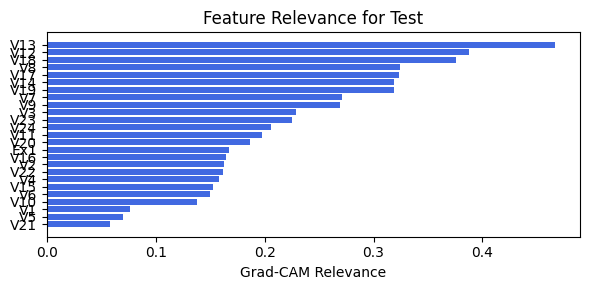

In [51]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=12, lamb=0.001, steps=40, filename=filename_1, opt_col_val=12)

### 1.0.7 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.90e-01 | val_acc_hybrid: 9.19e-01 |: 100%|█████| 40/40 [00:13<00:00,  2.87it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.2898e-01 at 26 epoch
tensor(0.9332, device='cuda:0')
[[415  24   1   1]
 [  9 401   9   1]
 [  1   2  63   0]
 [  0   8  17 140]]
M_KAN Relevance: 0.9723960161209106
CNN Relevance: 0.0276040006428957
[('V15', 0.25525796), ('V20', 0.2286501), ('V19', 0.20943062), ('V14', 0.17035845), ('V17', 0.13763975), ('V18', 0.13558553), ('V10', 0.1280235), ('V22', 0.12010634), ('V12', 0.11693128), ('V9', 0.11235504), ('V7', 0.11125317), ('V2', 0.10437651), ('V13', 0.09949039), ('V24', 0.09666346), ('V16', 0.09320982), ('V5', 0.09042917), ('V11', 0.090113476), ('V6', 0.08450465), ('V3', 0.0654529), ('V23', 0.06439551), ('V8', 0.063965365), ('V21', 0.063726775), ('V1', 0.05295992), ('V4', 0.045016598)]


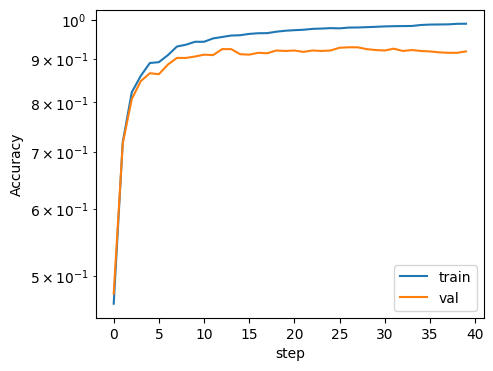

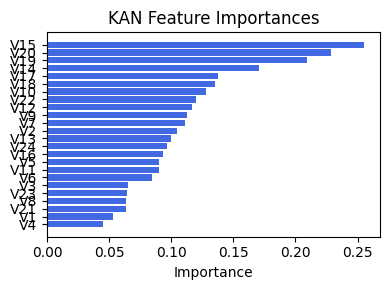

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.5331907377999631), ('V13', 0.48252440210825837), ('V19', 0.4244321186382037), ('V17', 0.42397135746709647), ('V23', 0.39387467458175546), ('V12', 0.3784001338487106), ('V14', 0.3679909418137052), ('V24', 0.3412836946192042), ('V8', 0.33663834329019043), ('V22', 0.31418059827250705), ('V16', 0.26814430696416847), ('V7', 0.2667653517731066), ('V9', 0.26152879024379044), ('Ex1', 0.23793236652542604), ('V20', 0.2378016495821322), ('V11', 0.23255233960532143), ('V15', 0.1982602704071287), ('V21', 0.18623847336036703), ('V6', 0.16960674123436634), ('V10', 0.13313633434961877), ('V3', 0.10768965511917966), ('V2', 0.08651540557443012), ('V4', 0.06890336565417814), ('V1', 0.0578755205928506), ('V5', 0.03493584969452132)]


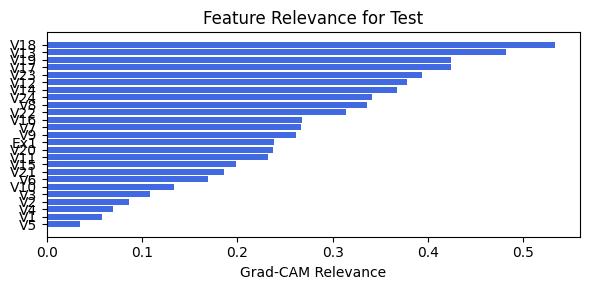

In [52]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=12, lamb=0.001, steps=40, filename=filename_1, opt_col_val=12)

### 1.0.8 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=15

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 9.08e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.14it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1409e-01 at 25 epoch
tensor(0.9029, device='cuda:0')
[[412  26   2   1]
 [ 17 391  11   1]
 [  0  10  49   7]
 [  0   3  28 134]]
M_KAN Relevance: 0.901347279548645
CNN Relevance: 0.09865272045135498
[('V15', 0.36662096), ('V19', 0.2399194), ('V20', 0.22278064), ('V4', 0.15546376), ('V18', 0.15519857), ('V9', 0.149157), ('V6', 0.13774723), ('V12', 0.13039152), ('V13', 0.11237089), ('V17', 0.11086368), ('V5', 0.106493786), ('V11', 0.10549426), ('V14', 0.10415761), ('V3', 0.10076212), ('V22', 0.0961211), ('V16', 0.09384491), ('V10', 0.09313997), ('V7', 0.087810695), ('V24', 0.06940059), ('V21', 0.0639416), ('V2', 0.061022446), ('V8', 0.05642236), ('V23', 0.05482867), ('V1', 0.03863078)]


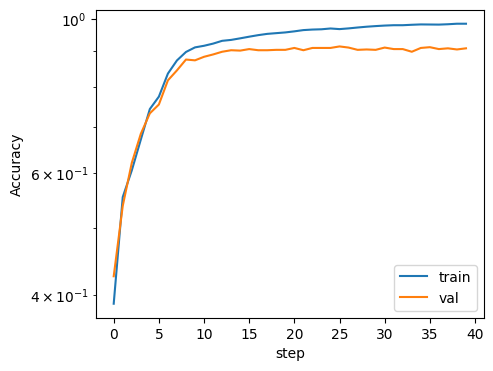

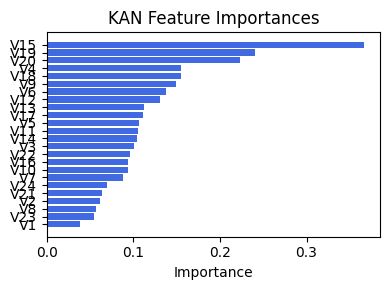

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.33156009412154425), ('V6', 0.3015693826369771), ('V11', 0.28579545228824366), ('V5', 0.2521845312747399), ('V1', 0.2457193918585373), ('V17', 0.23263605935400994), ('V7', 0.22707959680793555), ('V3', 0.2211642597555507), ('V12', 0.20353970081188705), ('V8', 0.19231749671548026), ('V21', 0.19074432730289678), ('V2', 0.18973677525986), ('V22', 0.1836576541296621), ('V4', 0.18051210863328318), ('V9', 0.1497221933082923), ('V10', 0.12379881494341997), ('V13', 0.12270442718996465), ('V18', 0.11656262224355471), ('V23', 0.10478701835360477), ('V19', 0.09689979272130651), ('V24', 0.09597798366066121), ('V14', 0.08351509051457996), ('V20', 0.047109912916808556), ('Ex1', 0.04186154143493422), ('V15', 0.02838409171484909)]


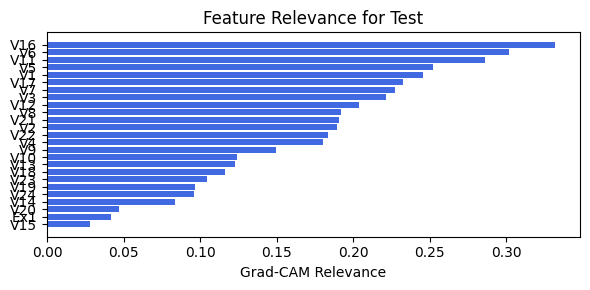

In [53]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=15, lamb=0.001, steps=40, filename=filename_1, opt_col_val=15)

### 1.0.9 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=15

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 8.88e-01 |: 100%|█████| 40/40 [00:13<00:00,  3.04it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.9462e-01 at 38 epoch
tensor(0.9020, device='cuda:0')
[[410  28   3   0]
 [ 21 376  23   0]
 [  1   6  57   2]
 [  0   4  19 142]]
M_KAN Relevance: 0.9094668626785278
CNN Relevance: 0.09053315222263336
[('V15', 0.32795176), ('V20', 0.241896), ('V19', 0.22244069), ('V14', 0.17590928), ('V9', 0.15258282), ('V18', 0.13179922), ('V12', 0.12913805), ('V5', 0.12874635), ('V11', 0.12747237), ('V17', 0.12621024), ('V13', 0.12110025), ('V22', 0.11407922), ('V6', 0.1018471), ('V7', 0.093514085), ('V10', 0.090378314), ('V16', 0.090249054), ('V4', 0.08952272), ('V23', 0.07691714), ('V3', 0.07436955), ('V1', 0.07361372), ('V2', 0.07173507), ('V21', 0.07082328), ('V24', 0.06569326), ('V8', 0.06395772)]


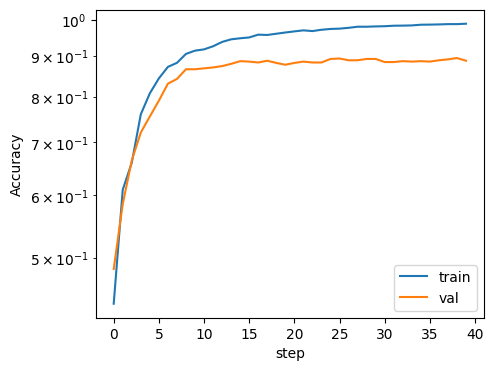

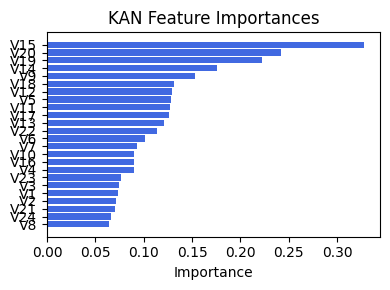

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.33786228222117054), ('V19', 0.3331165742846556), ('V14', 0.32547289331958734), ('V13', 0.31846527907325317), ('V17', 0.3142591900863402), ('V11', 0.3087886716802042), ('V16', 0.30398750751749004), ('V6', 0.2965673707515038), ('V12', 0.2908613046111186), ('V1', 0.27292570895258816), ('V15', 0.25891567979801333), ('V8', 0.2568090012930922), ('V7', 0.24954638655220487), ('V20', 0.24848279159596798), ('V9', 0.24791941653986727), ('V23', 0.2106327776947539), ('V22', 0.20982849502655843), ('V2', 0.20354683166467874), ('V24', 0.20197301211533908), ('V10', 0.18951805096464305), ('V21', 0.18545087204437793), ('V3', 0.16004972460562122), ('Ex1', 0.1584636764154521), ('V4', 0.14331753055761004), ('V5', 0.12040822820154229)]


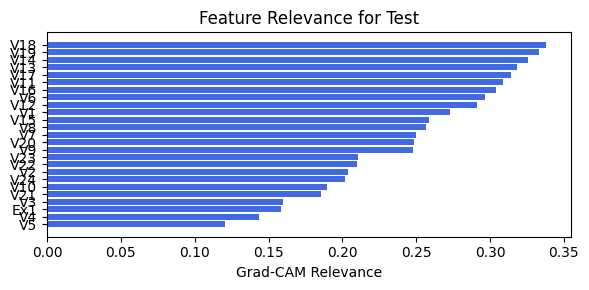

In [54]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=15, lamb=0.001, steps=40, filename=filename_1, opt_col_val=15)

### 1.0.10 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=18

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.88e-01 | val_acc_hybrid: 8.95e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.09it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1065e-01 at 19 epoch
tensor(0.9011, device='cuda:0')
[[416  20   4   1]
 [ 28 372  20   0]
 [  0   5  60   1]
 [  0   4  25 136]]
M_KAN Relevance: 0.901086688041687
CNN Relevance: 0.09891334921121597
[('V15', 0.278363), ('V19', 0.21387145), ('V9', 0.18424515), ('V20', 0.17992604), ('V12', 0.16010645), ('V13', 0.15012033), ('V14', 0.14745837), ('V18', 0.12515864), ('V5', 0.1162416), ('V17', 0.1026776), ('V16', 0.097102255), ('V24', 0.08583861), ('V4', 0.08217315), ('V3', 0.074401766), ('V6', 0.06777826), ('V22', 0.06621493), ('V8', 0.060696967), ('V11', 0.059606783), ('V10', 0.05788362), ('V7', 0.055230673), ('V2', 0.05497892), ('V1', 0.054085508), ('V23', 0.05347392), ('V21', 0.04792325)]


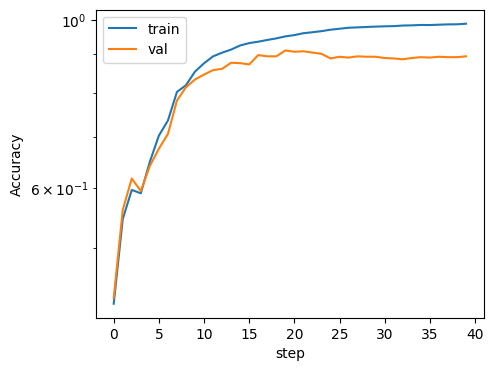

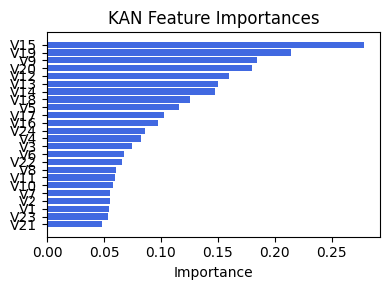

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V11', 0.2978515640980455), ('V16', 0.27528222605794256), ('V6', 0.2656686104910744), ('V10', 0.2628792407535995), ('V17', 0.24243103300297675), ('V1', 0.2337716729719202), ('V13', 0.22968085674279465), ('V7', 0.22615347677273992), ('V18', 0.22129650798597672), ('V20', 0.20928136599512392), ('V5', 0.208930475667355), ('V8', 0.20287137368860308), ('V12', 0.20046647307002446), ('V15', 0.1886579169522753), ('V3', 0.18410379883766587), ('V2', 0.17537074102715233), ('V19', 0.17376312916750755), ('V4', 0.15772187361633788), ('V9', 0.14368095908858966), ('Ex1', 0.13303858564173732), ('V14', 0.11916879163892946), ('V23', 0.09924841229327291), ('V24', 0.09283950408499574), ('V22', 0.08802982170697923), ('V21', 0.08206338466498182)]


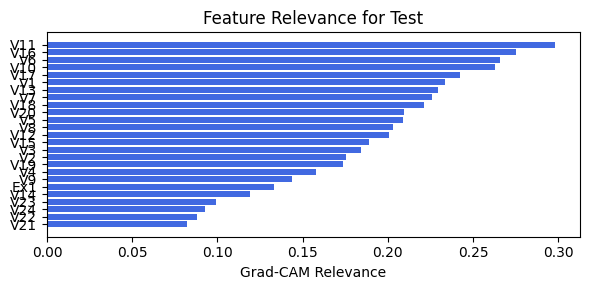

In [55]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=18, lamb=0.001, steps=40, filename=filename_1, opt_col_val=18)

### 1.0.11 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=18

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.85e-01 | val_acc_hybrid: 8.96e-01 |: 100%|█████| 40/40 [00:13<00:00,  2.96it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.0951e-01 at 23 epoch
tensor(0.9002, device='cuda:0')
[[411  24   5   1]
 [ 32 376  12   0]
 [  0   7  59   0]
 [  0   3  25 137]]
M_KAN Relevance: 0.8476395606994629
CNN Relevance: 0.15236042439937592
[('V15', 0.30521867), ('V19', 0.22512434), ('V20', 0.20926842), ('V9', 0.18328111), ('V12', 0.14900063), ('V18', 0.14874892), ('V13', 0.125433), ('V14', 0.10849016), ('V3', 0.10477503), ('V16', 0.0990439), ('V5', 0.097072005), ('V6', 0.09139728), ('V17', 0.09052707), ('V7', 0.08634015), ('V10', 0.07963195), ('V22', 0.07763748), ('V24', 0.07463981), ('V4', 0.07367742), ('V21', 0.06272107), ('V11', 0.062381633), ('V8', 0.058483016), ('V23', 0.058228552), ('V2', 0.049503665), ('V1', 0.04939416)]


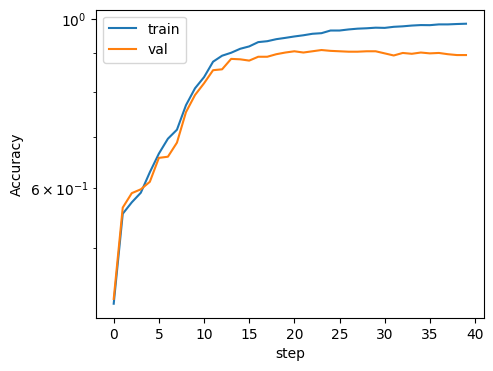

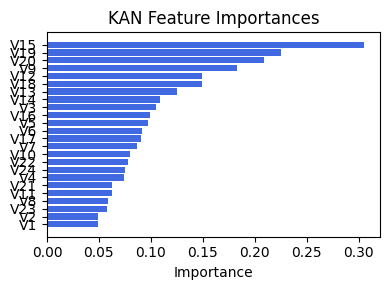

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.33983388316353624), ('V8', 0.3281055703949381), ('V18', 0.326658639865808), ('V17', 0.30876729975250033), ('V5', 0.30359662651209784), ('V16', 0.30013563222178913), ('V12', 0.28205532800310695), ('V7', 0.2785883584070862), ('V19', 0.2671729801922027), ('V11', 0.25359004433378757), ('V3', 0.2370728611449422), ('V6', 0.23299487481205985), ('V9', 0.22902433435087632), ('V14', 0.22678046274824484), ('V4', 0.22520996142092314), ('V1', 0.20765932936765005), ('V2', 0.20631092217974298), ('V10', 0.20428551830506572), ('V21', 0.17271128789640994), ('V23', 0.16978810185201626), ('V15', 0.1578278503613893), ('V24', 0.15133017845105465), ('V20', 0.1421824685680787), ('V22', 0.13754616624577293), ('Ex1', 0.11658092126428142)]


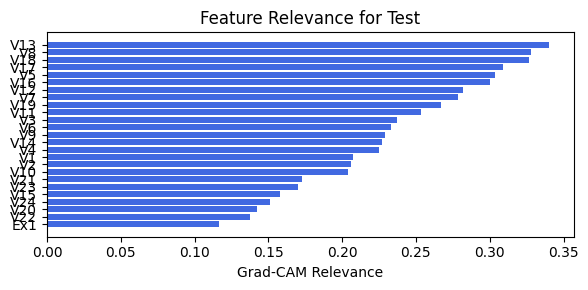

In [56]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=18, lamb=0.001, steps=40, filename=filename_1, opt_col_val=18)

### 1.0.12 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=24

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.85e-01 | val_acc_hybrid: 9.16e-01 |: 100%|█████| 40/40 [00:13<00:00,  3.03it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.2211e-01 at 29 epoch
tensor(0.9286, device='cuda:0')
[[416  21   3   1]
 [ 11 402   5   2]
 [  0   7  55   4]
 [  0   4  20 141]]
M_KAN Relevance: 0.8463123440742493
CNN Relevance: 0.15368765592575073
[('V15', 0.2848923), ('V19', 0.22532007), ('V20', 0.22269824), ('V14', 0.1589041), ('V12', 0.15544486), ('V9', 0.131944), ('V7', 0.13013092), ('V10', 0.12421989), ('V5', 0.11156826), ('V16', 0.099136114), ('V24', 0.08893492), ('V11', 0.08727521), ('V13', 0.08643576), ('V17', 0.08478543), ('V3', 0.081028394), ('V18', 0.07488221), ('V23', 0.070980094), ('V22', 0.07024029), ('V6', 0.06933518), ('V4', 0.061511423), ('V8', 0.060619306), ('V2', 0.051277947), ('V21', 0.046360023), ('V1', 0.041293744)]


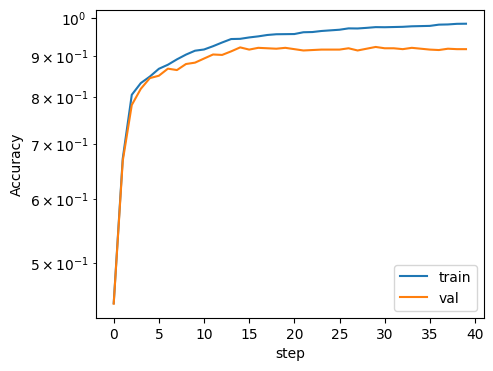

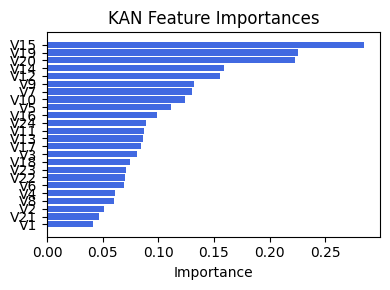

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.2751699532507104), ('V21', 0.2731322054103577), ('V22', 0.2313578125671377), ('V11', 0.21821784582433604), ('V18', 0.21324311070543528), ('V23', 0.21072839414100666), ('V17', 0.20581873106892176), ('V24', 0.19965136025496247), ('V19', 0.19949302265804664), ('V6', 0.19498050763313618), ('V13', 0.1943698169095544), ('V9', 0.18610318484606578), ('V14', 0.18371555427065453), ('V20', 0.1809431177256616), ('Ex1', 0.17990445793546), ('V12', 0.17538864957616448), ('V4', 0.17109942908826356), ('V7', 0.16437811996926802), ('V10', 0.1601672860745103), ('V8', 0.15884285622456318), ('V15', 0.15025561273939073), ('V5', 0.1493153371627955), ('V2', 0.14757862264327126), ('V3', 0.14608266421013993), ('V1', 0.13172326440935284)]


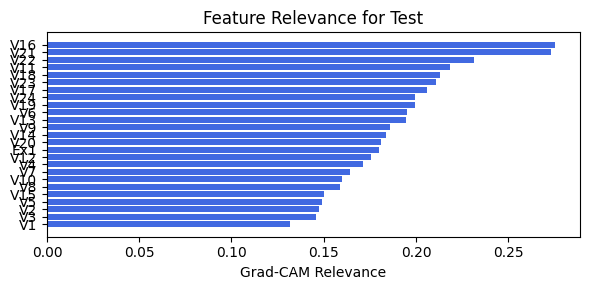

In [57]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=24, lamb=0.001, steps=40, filename=filename_1, opt_col_val=24)

### 1.0.13 width=[24, 12, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=24

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.87e-01 | val_acc_hybrid: 9.11e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.09it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.2440e-01 at 20 epoch
tensor(0.9222, device='cuda:0')
[[413  25   2   1]
 [ 13 396   9   2]
 [  0   7  56   3]
 [  0   4  19 142]]
M_KAN Relevance: 0.9144747257232666
CNN Relevance: 0.0855252593755722
[('V20', 0.2630876), ('V15', 0.2437335), ('V19', 0.22353312), ('V9', 0.15699399), ('V14', 0.14308652), ('V11', 0.14073694), ('V7', 0.13520207), ('V5', 0.13276482), ('V12', 0.11912198), ('V16', 0.11156927), ('V13', 0.106285594), ('V17', 0.1018179), ('V3', 0.101410374), ('V22', 0.09948723), ('V24', 0.09656175), ('V10', 0.09583851), ('V18', 0.085786104), ('V4', 0.081592925), ('V21', 0.074339114), ('V2', 0.068296425), ('V8', 0.06624918), ('V23', 0.06144915), ('V6', 0.04982315), ('V1', 0.046811044)]


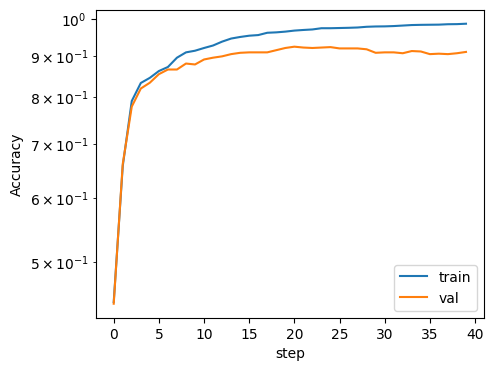

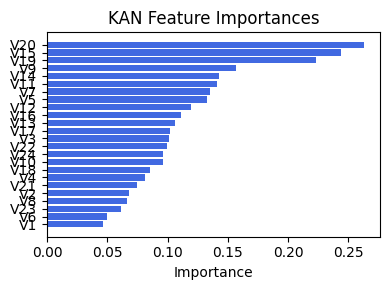

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.3659861742751859), ('V11', 0.32305059185070867), ('V21', 0.2925813585295009), ('V6', 0.27064789680389034), ('V23', 0.2632006723106448), ('V19', 0.24167617545551628), ('V22', 0.23555353618650818), ('V18', 0.23444077465603266), ('V24', 0.23207602173322597), ('V17', 0.2267613986954756), ('V14', 0.20080999565999888), ('V4', 0.1990074251926395), ('V13', 0.1973218125701714), ('V9', 0.1936922327643385), ('V8', 0.19363731683778573), ('Ex1', 0.1902912623901525), ('V5', 0.18687663448588784), ('V3', 0.17637039357647327), ('V10', 0.17274903154670454), ('V12', 0.17244938188415312), ('V20', 0.16857470231757143), ('V15', 0.16460503134582252), ('V7', 0.1614358218933679), ('V2', 0.14154629968438062), ('V1', 0.141270859457625)]


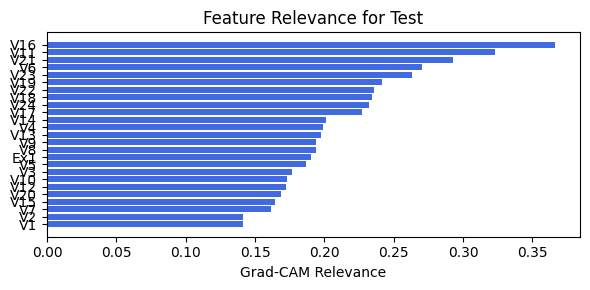

In [58]:
train_and_plot_relevance(Model3_1, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=24, lamb=0.001, steps=40, filename=filename_1, opt_col_val=24)

## 1.1 width=[24, 5, 1], grid=7, lamb=1e-07

### 1.1.1 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.65e-01 | val_acc_hybrid: 9.07e-01 |: 100%|█████| 40/40 [00:13<00:00,  3.01it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.2669e-01 at 19 epoch
tensor(0.9249, device='cuda:0')
[[413  22   5   1]
 [ 17 394   6   3]
 [  3   5  56   2]
 [  1   4  13 147]]
M_KAN Relevance: 0.9750043749809265
CNN Relevance: 0.024995600804686546
[('V19', 0.35305855), ('V15', 0.28362802), ('V20', 0.24360625), ('V14', 0.18989103), ('V18', 0.18238795), ('V12', 0.1707834), ('V10', 0.16180216), ('V6', 0.15427454), ('V7', 0.12396524), ('V17', 0.12396395), ('V24', 0.122536734), ('V3', 0.12169502), ('V16', 0.11978441), ('V5', 0.11928528), ('V22', 0.11568721), ('V13', 0.10671669), ('V11', 0.10662444), ('V1', 0.10524569), ('V8', 0.09259455), ('V23', 0.081311695), ('V2', 0.07385533), ('V4', 0.07270916), ('V21', 0.06843378), ('V9', 0.06765925)]


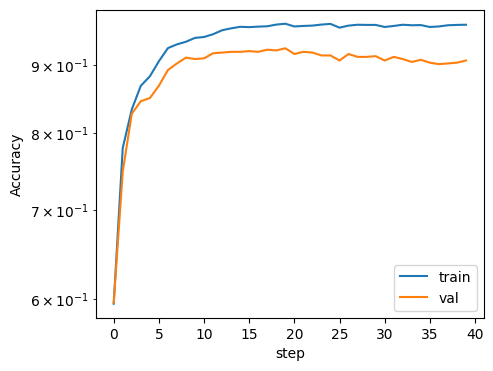

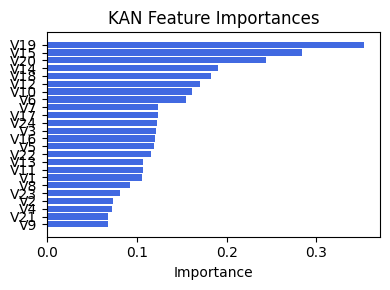

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V3', 0.31722486884552376), ('V24', 0.3120456682034726), ('V13', 0.3005705959523513), ('V8', 0.2940046322615578), ('V7', 0.29311149132897696), ('V23', 0.29173003125219604), ('V11', 0.2866492433267289), ('V16', 0.27796461073777234), ('V17', 0.27591095617400896), ('V4', 0.27562395412734564), ('V2', 0.27202094253813575), ('V12', 0.2689883070025634), ('V18', 0.2662282644659848), ('V6', 0.2656706143371017), ('V9', 0.2640218341613492), ('V19', 0.25660596620918324), ('V5', 0.23028914150082586), ('V1', 0.22940984531071193), ('V14', 0.2225222912585552), ('V22', 0.21840439257280211), ('V20', 0.18805342136567807), ('V21', 0.16757745154849304), ('V10', 0.16622969408935548), ('Ex1', 0.145416922746965), ('V15', 0.1367233725709861)]


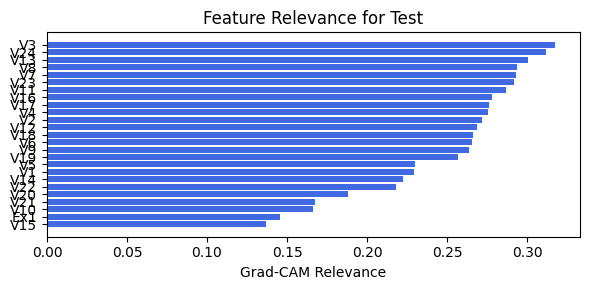

In [59]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=1, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=1)

### 1.1.2 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.65e-01 | val_acc_hybrid: 9.07e-01 |: 100%|█████| 40/40 [00:14<00:00,  2.72it/s]

saving model version 0.1
✅ Best validation Accuracy: 9.2669e-01 at 19 epoch
tensor(0.9249, device='cuda:0')
[[413  22   5   1]
 [ 17 394   6   3]
 [  3   5  56   2]
 [  1   4  13 147]]
M_KAN Relevance: 0.9750043749809265
CNN Relevance: 0.024995600804686546
[('V19', 0.35305855), ('V15', 0.28362802), ('V20', 0.24360625), ('V14', 0.18989103), ('V18', 0.18238795), ('V12', 0.1707834), ('V10', 0.16180216), ('V6', 0.15427454), ('V7', 0.12396524), ('V17', 0.12396395), ('V24', 0.122536734), ('V3', 0.12169502), ('V16', 0.11978441), ('V5', 0.11928528), ('V22', 0.11568721), ('V13', 0.10671669), ('V11', 0.10662444), ('V1', 0.10524569), ('V8', 0.09259455), ('V23', 0.081311695), ('V2', 0.07385533), ('V4', 0.07270916), ('V21', 0.06843378), ('V9', 0.06765925)]


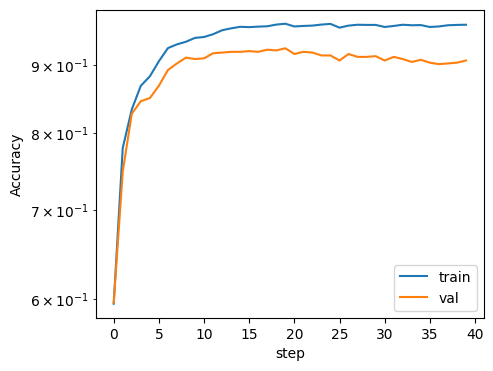

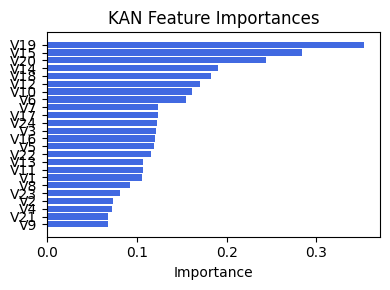

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V3', 0.31722486884552376), ('V24', 0.3120456682034726), ('V13', 0.3005705959523513), ('V8', 0.2940046322615578), ('V7', 0.29311149132897696), ('V23', 0.29173003125219604), ('V11', 0.2866492433267289), ('V16', 0.27796461073777234), ('V17', 0.27591095617400896), ('V4', 0.27562395412734564), ('V2', 0.27202094253813575), ('V12', 0.2689883070025634), ('V18', 0.2662282644659848), ('V6', 0.2656706143371017), ('V9', 0.2640218341613492), ('V19', 0.25660596620918324), ('V5', 0.23028914150082586), ('V1', 0.22940984531071193), ('V14', 0.2225222912585552), ('V22', 0.21840439257280211), ('V20', 0.18805342136567807), ('V21', 0.16757745154849304), ('V10', 0.16622969408935548), ('Ex1', 0.145416922746965), ('V15', 0.1367233725709861)]


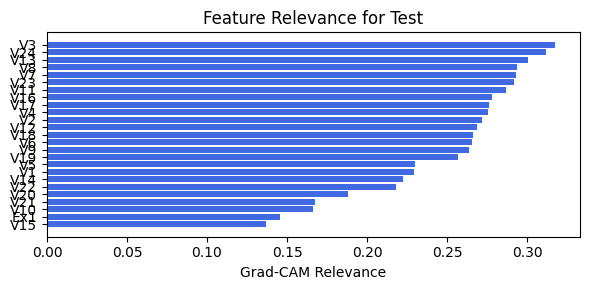

In [60]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=1, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=1)

### 1.1.3 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.36e-01 | val_acc_hybrid: 9.16e-01 |: 100%|█████| 40/40 [00:14<00:00,  2.75it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.3127e-01 at 30 epoch
tensor(0.9112, device='cuda:0')
[[408  28   4   1]
 [ 17 392   9   2]
 [  1   6  57   2]
 [  1   4  22 138]]
M_KAN Relevance: 0.8792237043380737
CNN Relevance: 0.12077627331018448
[('V20', 0.26340562), ('V15', 0.23312795), ('V19', 0.21019231), ('V7', 0.20376058), ('V9', 0.16002294), ('V12', 0.14082246), ('V4', 0.13904317), ('V5', 0.12992735), ('V11', 0.1017743), ('V23', 0.10083967), ('V14', 0.09911318), ('V8', 0.096370794), ('V24', 0.09627023), ('V10', 0.09038758), ('V6', 0.090033375), ('V3', 0.089964196), ('V18', 0.084422275), ('V22', 0.082044266), ('V13', 0.07646026), ('V16', 0.076042), ('V17', 0.07243829), ('V2', 0.05432713), ('V1', 0.04755638), ('V21', 0.03902125)]


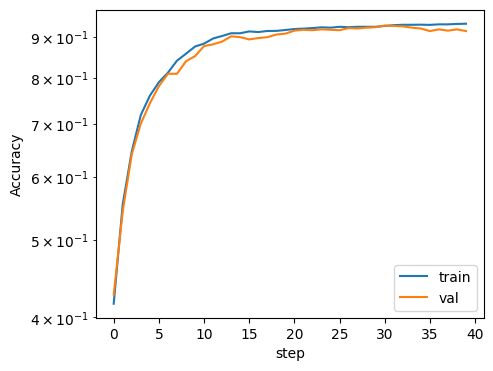

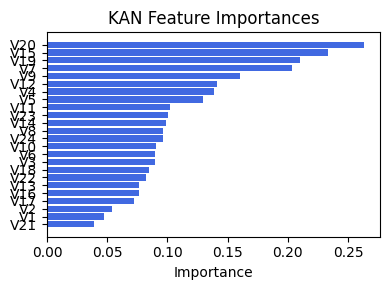

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.4199317983087688), ('V18', 0.4106968425654793), ('V12', 0.3944596204752761), ('V17', 0.3874406808600914), ('V19', 0.3438581822824561), ('V14', 0.33546040188128834), ('V8', 0.3255813229682381), ('V7', 0.31597213947487957), ('V9', 0.29857837073969734), ('V11', 0.2773858207276248), ('V16', 0.2715297200292308), ('V23', 0.2679983289734735), ('V24', 0.25305568269476225), ('V22', 0.2404776217865599), ('V6', 0.23958578448722478), ('V2', 0.20467298938794704), ('V10', 0.20414785736695873), ('V3', 0.19968534905888607), ('V4', 0.19773801069428645), ('V15', 0.19219762876818738), ('V20', 0.18302021579863684), ('Ex1', 0.17961023861228706), ('V1', 0.16314094361961654), ('V5', 0.1506586971821949), ('V21', 0.1378584077816353)]


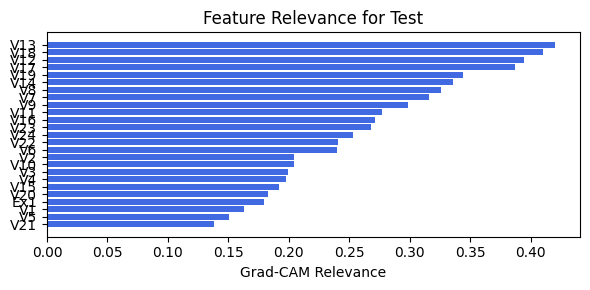

In [61]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=3, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=3)

### 1.1.4 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.36e-01 | val_acc_hybrid: 9.16e-01 |: 100%|█████| 40/40 [00:13<00:00,  2.91it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.3127e-01 at 30 epoch
tensor(0.9112, device='cuda:0')
[[408  28   4   1]
 [ 17 392   9   2]
 [  1   6  57   2]
 [  1   4  22 138]]
M_KAN Relevance: 0.8792237043380737
CNN Relevance: 0.12077627331018448
[('V20', 0.26340562), ('V15', 0.23312795), ('V19', 0.21019231), ('V7', 0.20376058), ('V9', 0.16002294), ('V12', 0.14082246), ('V4', 0.13904317), ('V5', 0.12992735), ('V11', 0.1017743), ('V23', 0.10083967), ('V14', 0.09911318), ('V8', 0.096370794), ('V24', 0.09627023), ('V10', 0.09038758), ('V6', 0.090033375), ('V3', 0.089964196), ('V18', 0.084422275), ('V22', 0.082044266), ('V13', 0.07646026), ('V16', 0.076042), ('V17', 0.07243829), ('V2', 0.05432713), ('V1', 0.04755638), ('V21', 0.03902125)]


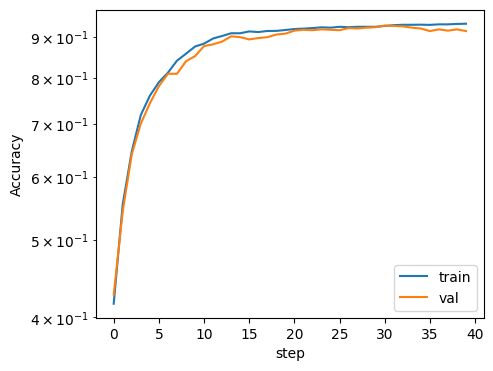

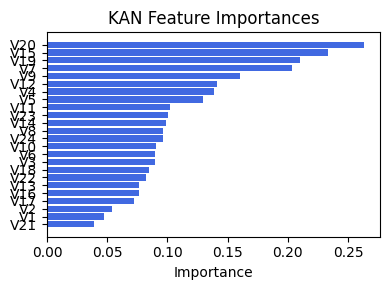

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.4199317983087688), ('V18', 0.4106968425654793), ('V12', 0.3944596204752761), ('V17', 0.3874406808600914), ('V19', 0.3438581822824561), ('V14', 0.33546040188128834), ('V8', 0.3255813229682381), ('V7', 0.31597213947487957), ('V9', 0.29857837073969734), ('V11', 0.2773858207276248), ('V16', 0.2715297200292308), ('V23', 0.2679983289734735), ('V24', 0.25305568269476225), ('V22', 0.2404776217865599), ('V6', 0.23958578448722478), ('V2', 0.20467298938794704), ('V10', 0.20414785736695873), ('V3', 0.19968534905888607), ('V4', 0.19773801069428645), ('V15', 0.19219762876818738), ('V20', 0.18302021579863684), ('Ex1', 0.17961023861228706), ('V1', 0.16314094361961654), ('V5', 0.1506586971821949), ('V21', 0.1378584077816353)]


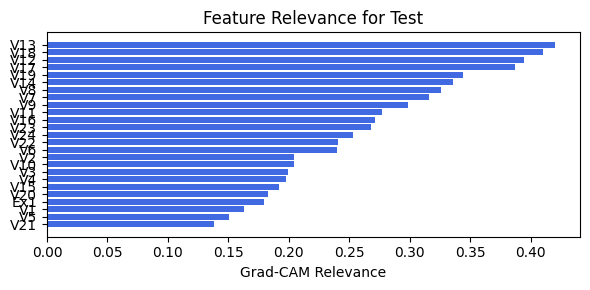

In [62]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=3, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=3)

### 1.1.5 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.59e-01 | val_acc_hybrid: 9.03e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.14it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1753e-01 at 11 epoch
tensor(0.9158, device='cuda:0')
[[412  25   3   1]
 [ 14 393  12   1]
 [  0   7  56   3]
 [  2   3  21 139]]
M_KAN Relevance: 0.8884071111679077
CNN Relevance: 0.11159295588731766
[('V20', 0.28131863), ('V15', 0.25804532), ('V19', 0.24782641), ('V7', 0.17870592), ('V9', 0.1470523), ('V22', 0.13643296), ('V12', 0.13579293), ('V5', 0.1334776), ('V13', 0.12759322), ('V14', 0.12204238), ('V17', 0.12125023), ('V3', 0.109639265), ('V18', 0.10244032), ('V1', 0.087225854), ('V6', 0.08436526), ('V16', 0.077254735), ('V23', 0.076327674), ('V24', 0.06696024), ('V8', 0.06324331), ('V11', 0.057468105), ('V10', 0.053638723), ('V2', 0.046793263), ('V21', 0.043397553), ('V4', 0.035471633)]


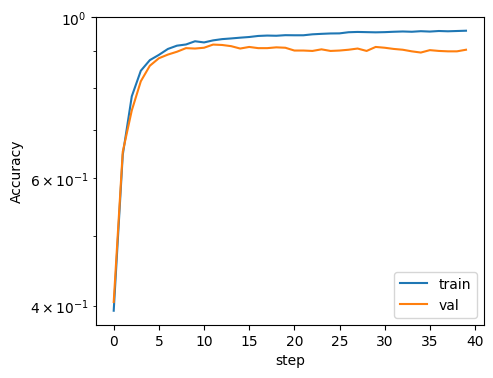

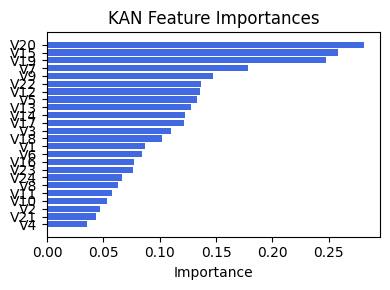

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V11', 0.2554838131071024), ('V16', 0.22197908736512084), ('V6', 0.2093290500488898), ('V12', 0.2015835999761923), ('V17', 0.19331679033412302), ('V13', 0.1701558767924522), ('V7', 0.17013647750046892), ('V18', 0.1478822319320618), ('V8', 0.14181646731474876), ('V19', 0.11530728198022022), ('V1', 0.10407130220255068), ('V2', 0.09034487081034068), ('V14', 0.086126143054571), ('V9', 0.059522449816743976), ('V23', 0.056141331169396916), ('V22', 0.05403431565304638), ('V24', 0.05244678167805149), ('V3', 0.05234501425817783), ('V21', 0.04371114914386956), ('V20', 0.03535867931731489), ('V4', 0.03206913665311958), ('Ex1', 0.02872808808863808), ('V10', 0.02867062455707361), ('V15', 0.025680405406312053), ('V5', 0.02062725787614549)]


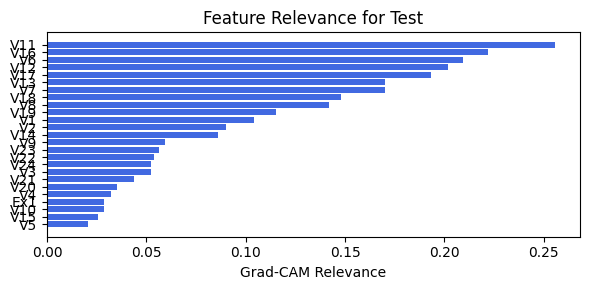

In [63]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=5, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=5)

### 1.1.6 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.52e-01 | val_acc_hybrid: 9.23e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.24it/s]

saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 14 epoch
tensor(0.9313, device='cuda:0')
[[414  23   3   1]
 [ 14 400   5   1]
 [  0   5  61   0]
 [  1   4  18 142]]
M_KAN Relevance: 0.9046325087547302
CNN Relevance: 0.09536747634410858
[('V20', 0.33256826), ('V15', 0.2933674), ('V19', 0.28941315), ('V7', 0.16081424), ('V12', 0.15651475), ('V13', 0.14667946), ('V14', 0.11822486), ('V17', 0.112769365), ('V18', 0.10968363), ('V23', 0.10941877), ('V5', 0.106607854), ('V3', 0.101941966), ('V1', 0.09548815), ('V9', 0.08699673), ('V11', 0.085056454), ('V10', 0.07864969), ('V16', 0.075162314), ('V8', 0.07502795), ('V22', 0.07189716), ('V6', 0.05858041), ('V24', 0.04631861), ('V2', 0.044823326), ('V4', 0.043959007), ('V21', 0.03612679)]


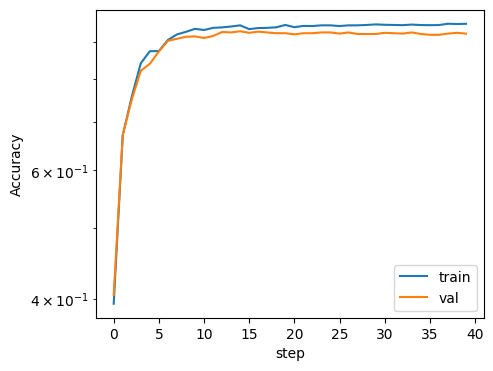

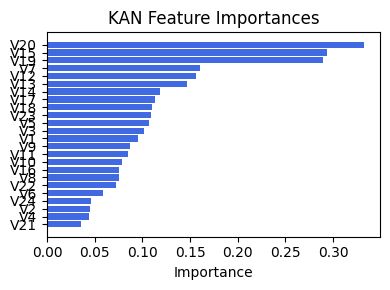

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.7042990968482281), ('V18', 0.6645602742210031), ('V8', 0.5961938766691081), ('V17', 0.5857456521687162), ('V12', 0.5820088342869238), ('V14', 0.5523657933864299), ('V19', 0.549694870844291), ('V7', 0.5039864584476084), ('V9', 0.46908709391991643), ('V16', 0.4159460112338117), ('V11', 0.4159190960046358), ('V6', 0.3435633359366052), ('V3', 0.29617156254807725), ('V2', 0.2782750122774488), ('V20', 0.27793921573518693), ('V15', 0.25101575033138795), ('V23', 0.23128516997437543), ('V1', 0.22076185951980887), ('V4', 0.220408554034966), ('V10', 0.21871561535093387), ('V24', 0.20358995890998877), ('V22', 0.20079348152912743), ('V21', 0.16831681676195753), ('Ex1', 0.14148335859303665), ('V5', 0.1065108559034989)]


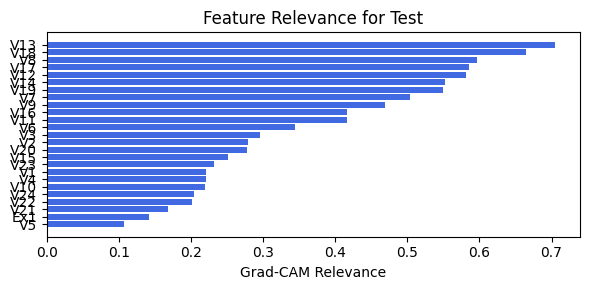

In [64]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=5, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=5)

### 1.1.7 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.49e-01 | val_acc_hybrid: 8.82e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.14it/s]

saving model version 0.1
✅ Best validation Accuracy: 8.9691e-01 at 23 epoch
tensor(0.8837, device='cuda:0')
[[395  43   2   1]
 [ 22 389   8   1]
 [  0  11  55   0]
 [  0   3  36 126]]
M_KAN Relevance: 0.726638674736023
CNN Relevance: 0.27336132526397705
[('V15', 0.3983494), ('V19', 0.31450915), ('V20', 0.25520107), ('V14', 0.14368826), ('V18', 0.12767036), ('V12', 0.12569629), ('V13', 0.12312589), ('V9', 0.09535962), ('V22', 0.09264746), ('V17', 0.09071636), ('V6', 0.089516245), ('V11', 0.08485504), ('V7', 0.08185968), ('V24', 0.07989679), ('V3', 0.079077765), ('V16', 0.0783262), ('V23', 0.07233866), ('V8', 0.060653847), ('V4', 0.058378268), ('V10', 0.056349106), ('V5', 0.05587527), ('V2', 0.04707924), ('V21', 0.044599645), ('V1', 0.040817622)]


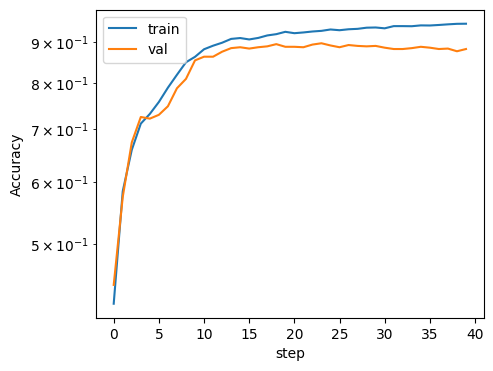

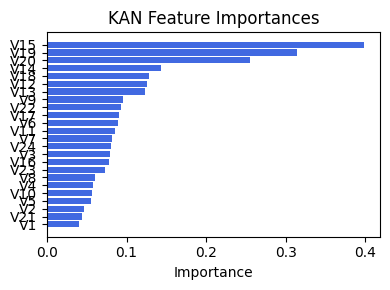

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.13265172524578978), ('Ex1', 0.12203160035361037), ('V18', 0.11359521941162028), ('V24', 0.11150974513607968), ('V13', 0.10686560230706596), ('V17', 0.10010128769974118), ('V8', 0.09977433032287121), ('V7', 0.09920563493609993), ('V5', 0.09116066990923623), ('V19', 0.09059538323952558), ('V22', 0.08946938053176025), ('V9', 0.0872152532820143), ('V12', 0.08410431497937985), ('V20', 0.0822137724522897), ('V14', 0.08062259816671653), ('V16', 0.0779881149738775), ('V10', 0.07370817489876631), ('V3', 0.06990316955563732), ('V11', 0.058852026624956436), ('V4', 0.056893008647970776), ('V15', 0.05124807264058827), ('V6', 0.04041125493759721), ('V2', 0.03860340340725754), ('V21', 0.02072259861850751), ('V1', 0.014222161040252836)]


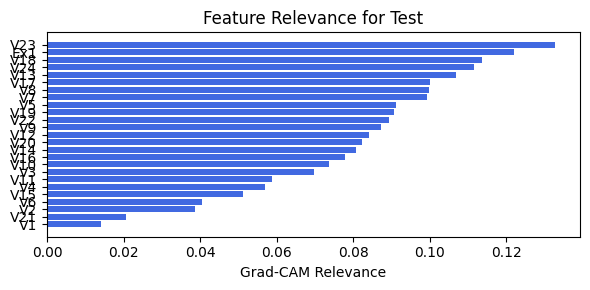

In [65]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=8, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=8)

### 1.1.8 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.45e-01 | val_acc_hybrid: 8.88e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.12it/s]

saving model version 0.1
✅ Best validation Accuracy: 8.9920e-01 at 32 epoch
tensor(0.8993, device='cuda:0')
[[397  40   3   1]
 [ 19 390   8   3]
 [  0   9  56   1]
 [  0   3  23 139]]
M_KAN Relevance: 0.7188458442687988
CNN Relevance: 0.28115415573120117
[('V15', 0.4561134), ('V19', 0.27404276), ('V20', 0.23667793), ('V18', 0.16773263), ('V14', 0.14845091), ('V17', 0.13247056), ('V9', 0.12656823), ('V2', 0.10457505), ('V12', 0.100208454), ('V22', 0.09828254), ('V13', 0.09690384), ('V7', 0.084611855), ('V24', 0.08102356), ('V23', 0.075273745), ('V11', 0.07169806), ('V6', 0.06484958), ('V16', 0.0598966), ('V3', 0.059501678), ('V10', 0.05519429), ('V5', 0.053258), ('V1', 0.049697246), ('V8', 0.049582608), ('V21', 0.045550287), ('V4', 0.041406054)]


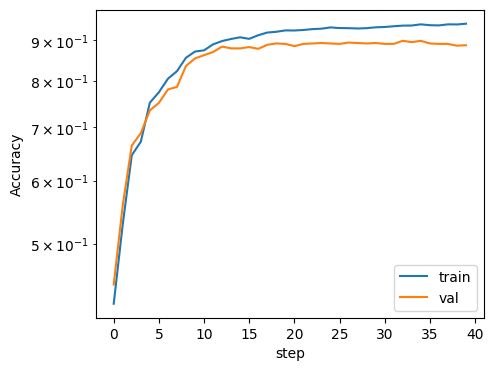

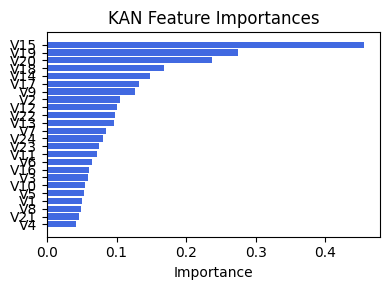

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.408038864299423), ('V15', 0.3789395357219028), ('Ex1', 0.30268481970490074), ('V19', 0.2012267587022027), ('V14', 0.16571846261881495), ('V13', 0.14939629282945624), ('V10', 0.14422159841725818), ('V18', 0.14153517997630055), ('V9', 0.12449555592864758), ('V17', 0.12224411319465493), ('V12', 0.11945420476836545), ('V8', 0.11836036562965671), ('V24', 0.11777894367563459), ('V23', 0.09913572616546394), ('V22', 0.08640560586454973), ('V7', 0.08397066703694761), ('V16', 0.0828198559191837), ('V11', 0.07239126346291744), ('V3', 0.05205935242787539), ('V6', 0.04727148933095152), ('V2', 0.04250834330315685), ('V4', 0.040780178280882005), ('V1', 0.035461654902604466), ('V21', 0.034387011041748766), ('V5', 0.02581335052746865)]


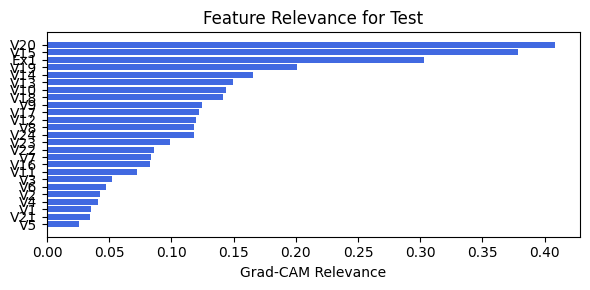

In [66]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=8, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=8)

### 1.1.9 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=10

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.45e-01 | val_acc_hybrid: 9.06e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.09it/s]

saving model version 0.1
✅ Best validation Accuracy: 9.0951e-01 at 36 epoch
tensor(0.9011, device='cuda:0')
[[403  36   1   1]
 [ 23 387   9   1]
 [  1   6  58   1]
 [  0   7  22 136]]
M_KAN Relevance: 0.7939847111701965
CNN Relevance: 0.20601528882980347
[('V15', 0.3591555), ('V19', 0.25194478), ('V20', 0.22986054), ('V24', 0.18332055), ('V9', 0.17293163), ('V10', 0.14429682), ('V14', 0.1394767), ('V7', 0.13909082), ('V12', 0.1291377), ('V5', 0.121320724), ('V3', 0.1154744), ('V8', 0.11288851), ('V18', 0.10881968), ('V11', 0.10233771), ('V22', 0.098138615), ('V13', 0.09744855), ('V2', 0.08947151), ('V17', 0.08817684), ('V6', 0.08708521), ('V16', 0.082088225), ('V23', 0.0752516), ('V21', 0.060136434), ('V1', 0.056471594), ('V4', 0.056235638)]


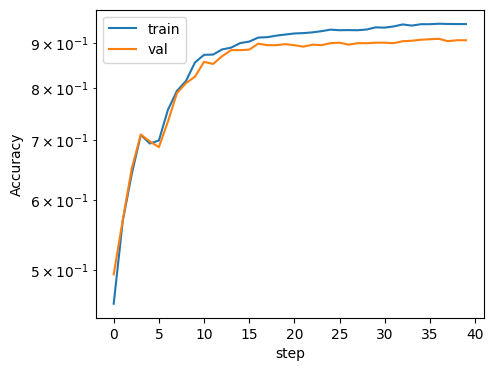

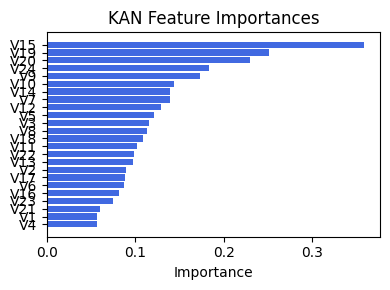

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.0767166833052132), ('V24', 0.010110910566550963), ('V13', 0.00626202642699301), ('V8', 0.003536281950307853), ('V9', 0.0035298119807418015), ('V23', 0.003467515370238832), ('V19', 0.0030658277154187144), ('V17', 0.002912134500118075), ('V12', 0.002851290461153556), ('V18', 0.0027644563288915726), ('V10', 0.0027311015533003614), ('V14', 0.00256308621211803), ('V20', 0.002445769698816205), ('V22', 0.0023902224056122504), ('V4', 0.0023733370633789034), ('V5', 0.0019695512513756316), ('V7', 0.0018897377357105195), ('V15', 0.0016086111220466348), ('V3', 0.0015676119262454929), ('V2', 0.0008918380095272056), ('V6', 0.0005705789552025852), ('V16', 0.0005151864444843797), ('V21', 0.00047827051652274725), ('V11', 0.0004253855398122644), ('V1', 0.000289920069304578)]


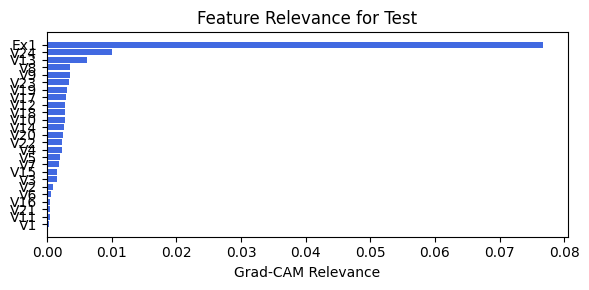

In [67]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=10, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=10)

### 1.1.10 width=[24, 5, 1], grid=7, lamb=1e-07 | cnn_bottleneck_dim=10

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.45e-01 | val_acc_hybrid: 9.06e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.12it/s]

saving model version 0.1
✅ Best validation Accuracy: 9.0951e-01 at 36 epoch
tensor(0.9011, device='cuda:0')
[[403  36   1   1]
 [ 23 387   9   1]
 [  1   6  58   1]
 [  0   7  22 136]]
M_KAN Relevance: 0.7939847111701965
CNN Relevance: 0.20601528882980347
[('V15', 0.3591555), ('V19', 0.25194478), ('V20', 0.22986054), ('V24', 0.18332055), ('V9', 0.17293163), ('V10', 0.14429682), ('V14', 0.1394767), ('V7', 0.13909082), ('V12', 0.1291377), ('V5', 0.121320724), ('V3', 0.1154744), ('V8', 0.11288851), ('V18', 0.10881968), ('V11', 0.10233771), ('V22', 0.098138615), ('V13', 0.09744855), ('V2', 0.08947151), ('V17', 0.08817684), ('V6', 0.08708521), ('V16', 0.082088225), ('V23', 0.0752516), ('V21', 0.060136434), ('V1', 0.056471594), ('V4', 0.056235638)]


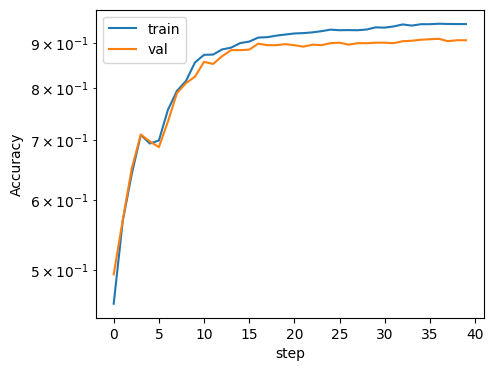

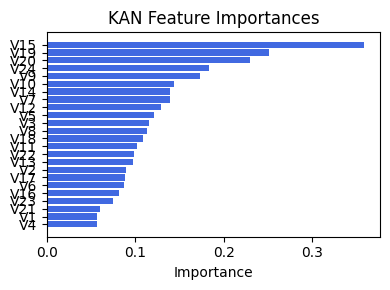

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.0767166833052132), ('V24', 0.010110910566550963), ('V13', 0.00626202642699301), ('V8', 0.003536281950307853), ('V9', 0.0035298119807418015), ('V23', 0.003467515370238832), ('V19', 0.0030658277154187144), ('V17', 0.002912134500118075), ('V12', 0.002851290461153556), ('V18', 0.0027644563288915726), ('V10', 0.0027311015533003614), ('V14', 0.00256308621211803), ('V20', 0.002445769698816205), ('V22', 0.0023902224056122504), ('V4', 0.0023733370633789034), ('V5', 0.0019695512513756316), ('V7', 0.0018897377357105195), ('V15', 0.0016086111220466348), ('V3', 0.0015676119262454929), ('V2', 0.0008918380095272056), ('V6', 0.0005705789552025852), ('V16', 0.0005151864444843797), ('V21', 0.00047827051652274725), ('V11', 0.0004253855398122644), ('V1', 0.000289920069304578)]


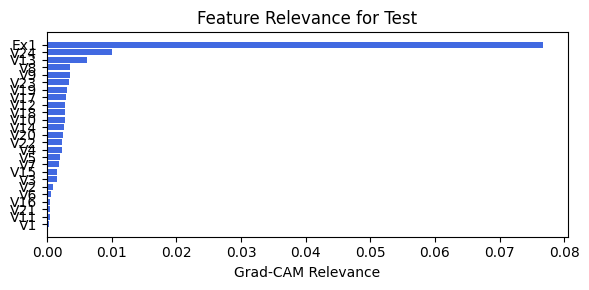

In [68]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=10, lamb=1e-07, steps=40, filename=filename_1, opt_col_val=10)

## 1.2 width=[24, 7, 1], grid=8, lamb=0.001

### 1.2.0 width=[24, 7, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.65e-01 | val_acc_hybrid: 9.45e-01 |: 100%|█████| 40/40 [00:14<00:00,  2.86it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.4960e-01 at 33 epoch
tensor(0.9350, device='cuda:0')
[[417  22   1   1]
 [ 12 404   3   1]
 [  3   4  57   2]
 [  1   4  17 143]]
M_KAN Relevance: 0.9926812052726746
CNN Relevance: 0.007318831980228424
[('V7', 0.35932028), ('V15', 0.2946445), ('V14', 0.22305764), ('V20', 0.16600612), ('V11', 0.1367107), ('V19', 0.13337682), ('V5', 0.13258642), ('V13', 0.12805013), ('V12', 0.11631745), ('V6', 0.10791), ('V4', 0.105037645), ('V3', 0.09697666), ('V9', 0.09431503), ('V22', 0.09418933), ('V2', 0.083614126), ('V17', 0.06993294), ('V18', 0.06595727), ('V24', 0.06523657), ('V10', 0.06127997), ('V16', 0.05844964), ('V23', 0.04860278), ('V21', 0.045832258), ('V8', 0.041982934), ('V1', 0.029021272)]


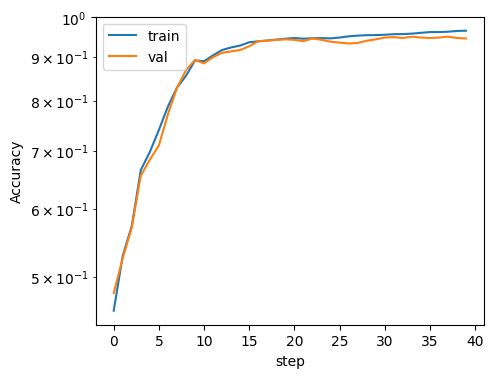

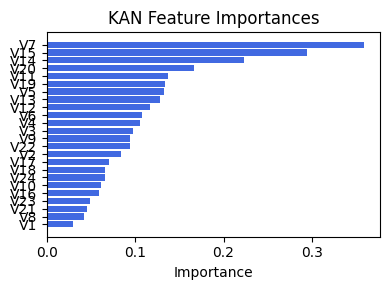

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.24567917330150454), ('V23', 0.2303066930246212), ('V24', 0.22463502561481202), ('V18', 0.19976522990514356), ('V19', 0.18809188154740122), ('V13', 0.1704738438056399), ('V22', 0.16914742239000938), ('V17', 0.1665632669291448), ('V20', 0.1572169861523861), ('V8', 0.15373022604205785), ('V12', 0.14619938118618678), ('V7', 0.14359289802102995), ('V11', 0.1407870219791154), ('V3', 0.13782872392191195), ('V16', 0.13745586421511702), ('V4', 0.13711526244537625), ('V6', 0.13471868767216716), ('V2', 0.13337325213269452), ('V9', 0.13095406561886513), ('V14', 0.12856731894502804), ('V1', 0.11536007470954163), ('V15', 0.11235911435447207), ('V21', 0.09391259134047557), ('V5', 0.08402820737208812), ('V10', 0.07544346630633826)]


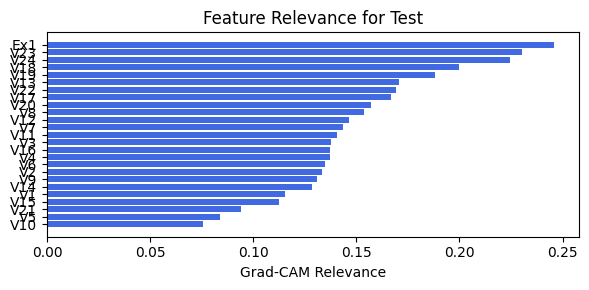

In [69]:
train_and_plot_relevance(Model3_1, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=3, lamb=0.001, steps=40, filename=filename_1, opt_col_val=3)

### 1.2.1 width=[24, 7, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.65e-01 | val_acc_hybrid: 9.45e-01 |: 100%|█████| 40/40 [00:13<00:00,  2.94it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.4960e-01 at 33 epoch
tensor(0.9350, device='cuda:0')
[[417  22   1   1]
 [ 12 404   3   1]
 [  3   4  57   2]
 [  1   4  17 143]]
M_KAN Relevance: 0.9926812052726746
CNN Relevance: 0.007318831980228424
[('V7', 0.35932028), ('V15', 0.2946445), ('V14', 0.22305764), ('V20', 0.16600612), ('V11', 0.1367107), ('V19', 0.13337682), ('V5', 0.13258642), ('V13', 0.12805013), ('V12', 0.11631745), ('V6', 0.10791), ('V4', 0.105037645), ('V3', 0.09697666), ('V9', 0.09431503), ('V22', 0.09418933), ('V2', 0.083614126), ('V17', 0.06993294), ('V18', 0.06595727), ('V24', 0.06523657), ('V10', 0.06127997), ('V16', 0.05844964), ('V23', 0.04860278), ('V21', 0.045832258), ('V8', 0.041982934), ('V1', 0.029021272)]


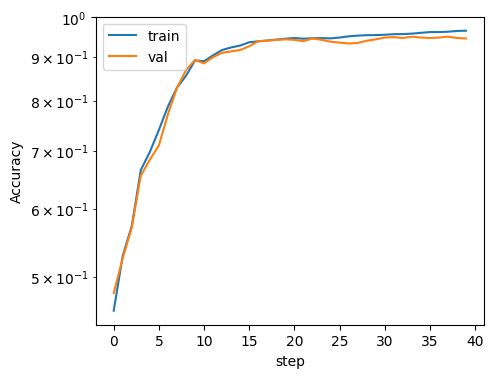

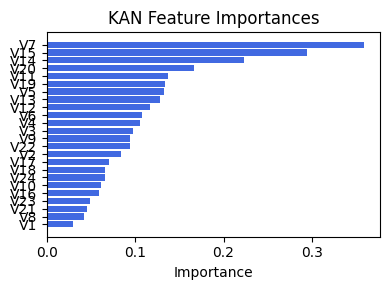

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.24567917330150454), ('V23', 0.2303066930246212), ('V24', 0.22463502561481202), ('V18', 0.19976522990514356), ('V19', 0.18809188154740122), ('V13', 0.1704738438056399), ('V22', 0.16914742239000938), ('V17', 0.1665632669291448), ('V20', 0.1572169861523861), ('V8', 0.15373022604205785), ('V12', 0.14619938118618678), ('V7', 0.14359289802102995), ('V11', 0.1407870219791154), ('V3', 0.13782872392191195), ('V16', 0.13745586421511702), ('V4', 0.13711526244537625), ('V6', 0.13471868767216716), ('V2', 0.13337325213269452), ('V9', 0.13095406561886513), ('V14', 0.12856731894502804), ('V1', 0.11536007470954163), ('V15', 0.11235911435447207), ('V21', 0.09391259134047557), ('V5', 0.08402820737208812), ('V10', 0.07544346630633826)]


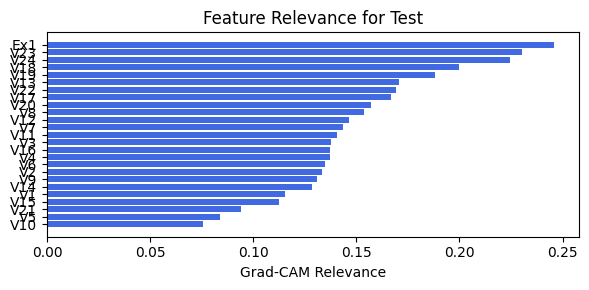

In [70]:
train_and_plot_relevance(Model3_1, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=3, lamb=0.001, steps=40, filename=filename_1, opt_col_val=3)

### 1.2.2 width=[24, 7, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=7

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.87e-01 | val_acc_hybrid: 9.06e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.08it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1523e-01 at 7 epoch
tensor(0.9002, device='cuda:0')
[[404  34   3   0]
 [ 23 387   9   1]
 [  0   9  56   1]
 [  0   3  26 136]]
M_KAN Relevance: 0.9388632774353027
CNN Relevance: 0.06113675981760025
[('V15', 0.38047186), ('V20', 0.23186514), ('V19', 0.22362182), ('V7', 0.16803446), ('V14', 0.14807245), ('V18', 0.13748151), ('V5', 0.13309571), ('V13', 0.12938796), ('V6', 0.1103469), ('V12', 0.10625731), ('V16', 0.10218708), ('V24', 0.09753033), ('V23', 0.095741116), ('V10', 0.09419803), ('V22', 0.085719556), ('V4', 0.08533408), ('V17', 0.074941985), ('V21', 0.06988787), ('V11', 0.06547639), ('V9', 0.06440743), ('V1', 0.054428264), ('V8', 0.05277666), ('V3', 0.05268987), ('V2', 0.03691199)]


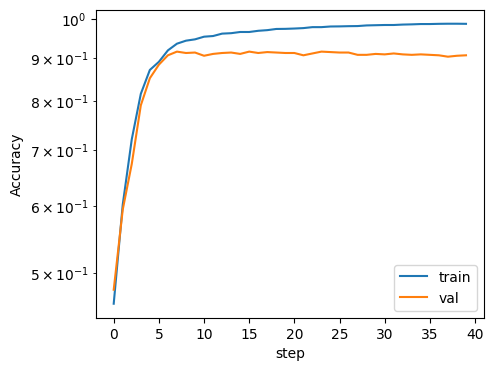

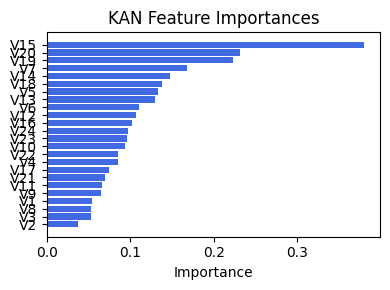

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V5', 0.37858576162851176), ('V13', 0.3502197838537634), ('V3', 0.3454997537538165), ('V9', 0.3368198377559835), ('V8', 0.3113293552126449), ('V14', 0.2942977077508368), ('V4', 0.28958264210593165), ('V12', 0.2776239271943701), ('V7', 0.2741537022105019), ('V17', 0.25943307346326716), ('V18', 0.25796428635407703), ('V10', 0.2540234113587561), ('V19', 0.24361768523953947), ('V2', 0.23740140748855865), ('V20', 0.19816014510672422), ('V15', 0.18453146642858992), ('V1', 0.16908260636413974), ('V6', 0.16290256523635624), ('V16', 0.15721263507573616), ('V11', 0.15332752996296606), ('V24', 0.12086661257559345), ('V22', 0.10614829583685675), ('V23', 0.10318812699869084), ('Ex1', 0.06977464985648245), ('V21', 0.053063386982864356)]


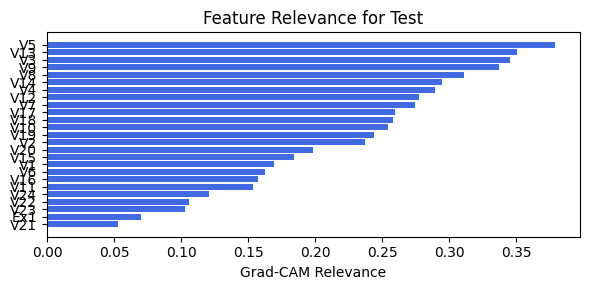

In [71]:
train_and_plot_relevance(Model3_1, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=7, lamb=0.001, steps=40, filename=filename_1, opt_col_val=7)

### 1.2.3 width=[24, 7, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=7

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.87e-01 | val_acc_hybrid: 9.06e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.08it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1523e-01 at 7 epoch
tensor(0.9002, device='cuda:0')
[[404  34   3   0]
 [ 23 387   9   1]
 [  0   9  56   1]
 [  0   3  26 136]]
M_KAN Relevance: 0.9388632774353027
CNN Relevance: 0.06113675981760025
[('V15', 0.38047186), ('V20', 0.23186514), ('V19', 0.22362182), ('V7', 0.16803446), ('V14', 0.14807245), ('V18', 0.13748151), ('V5', 0.13309571), ('V13', 0.12938796), ('V6', 0.1103469), ('V12', 0.10625731), ('V16', 0.10218708), ('V24', 0.09753033), ('V23', 0.095741116), ('V10', 0.09419803), ('V22', 0.085719556), ('V4', 0.08533408), ('V17', 0.074941985), ('V21', 0.06988787), ('V11', 0.06547639), ('V9', 0.06440743), ('V1', 0.054428264), ('V8', 0.05277666), ('V3', 0.05268987), ('V2', 0.03691199)]


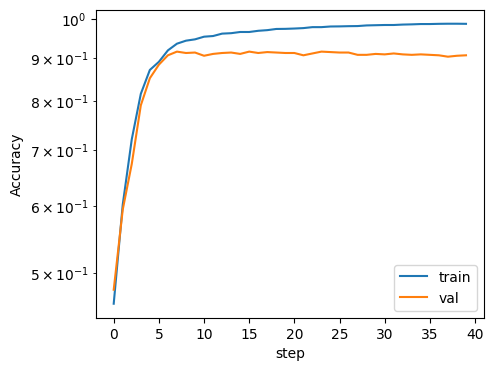

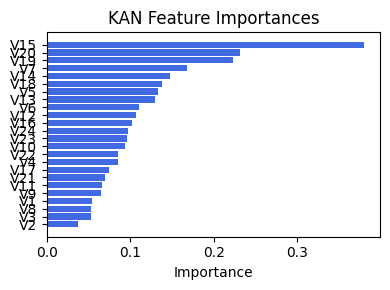

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V5', 0.37858576162851176), ('V13', 0.3502197838537634), ('V3', 0.3454997537538165), ('V9', 0.3368198377559835), ('V8', 0.3113293552126449), ('V14', 0.2942977077508368), ('V4', 0.28958264210593165), ('V12', 0.2776239271943701), ('V7', 0.2741537022105019), ('V17', 0.25943307346326716), ('V18', 0.25796428635407703), ('V10', 0.2540234113587561), ('V19', 0.24361768523953947), ('V2', 0.23740140748855865), ('V20', 0.19816014510672422), ('V15', 0.18453146642858992), ('V1', 0.16908260636413974), ('V6', 0.16290256523635624), ('V16', 0.15721263507573616), ('V11', 0.15332752996296606), ('V24', 0.12086661257559345), ('V22', 0.10614829583685675), ('V23', 0.10318812699869084), ('Ex1', 0.06977464985648245), ('V21', 0.053063386982864356)]


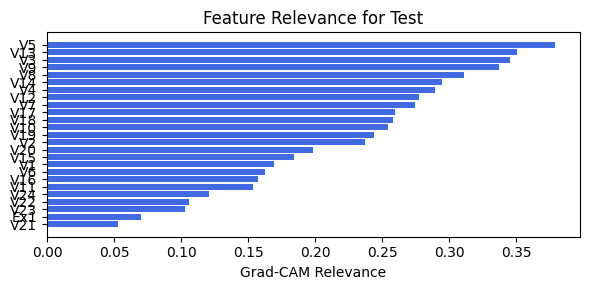

In [72]:
train_and_plot_relevance(Model3_1, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=7, lamb=0.001, steps=40, filename=filename_1, opt_col_val=7)

### 1.2.4 width=[24, 7, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=10

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.81e-01 | val_acc_hybrid: 9.21e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.11it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.2554e-01 at 15 epoch
tensor(0.9148, device='cuda:0')
[[414  24   3   0]
 [ 15 392  12   1]
 [  0   8  53   5]
 [  1   3  21 140]]
M_KAN Relevance: 0.9601009488105774
CNN Relevance: 0.03989902883768082
[('V20', 0.25767943), ('V19', 0.24224472), ('V15', 0.22409317), ('V18', 0.19421202), ('V6', 0.15554197), ('V11', 0.15370743), ('V12', 0.14341065), ('V9', 0.13193215), ('V14', 0.12009146), ('V24', 0.11569067), ('V2', 0.11335176), ('V7', 0.10470677), ('V3', 0.10279575), ('V23', 0.0829483), ('V22', 0.08258231), ('V4', 0.075553134), ('V17', 0.06643354), ('V10', 0.059571594), ('V1', 0.056966145), ('V16', 0.053183045), ('V13', 0.052880898), ('V21', 0.050722662), ('V8', 0.046593443), ('V5', 0.04346795)]


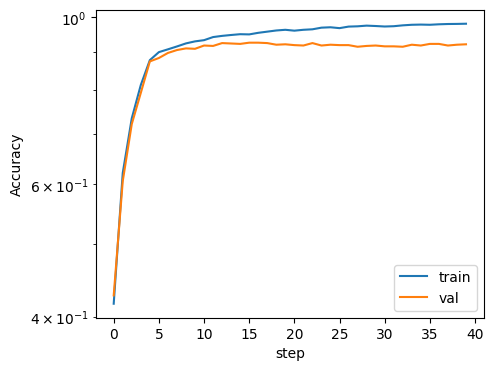

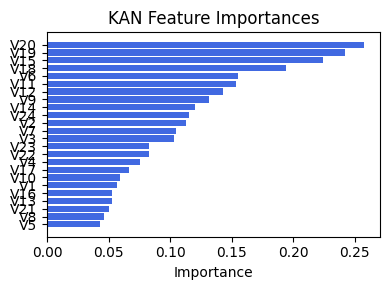

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.36316439948566454), ('V18', 0.362899485041836), ('V17', 0.34887514276917314), ('V13', 0.29852160213425827), ('V19', 0.2835692170977118), ('V23', 0.27865696544997776), ('V11', 0.2697728362655943), ('V12', 0.2550869545649977), ('V8', 0.24368644117155103), ('V22', 0.24315520992328588), ('V24', 0.23059049327697315), ('V14', 0.22929595780772952), ('V7', 0.2027844213528794), ('V9', 0.20076341701459546), ('V6', 0.18357363223603965), ('V10', 0.18152794244038695), ('V3', 0.1731766318360301), ('V15', 0.16066440677936802), ('V21', 0.1572487265618489), ('V20', 0.1548346195489839), ('V5', 0.15291279145832706), ('V4', 0.15185026933514253), ('V2', 0.12576159339942056), ('Ex1', 0.09007985927772617), ('V1', 0.06726333195291483)]


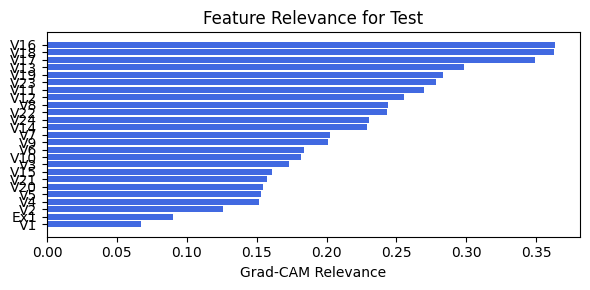

In [73]:
train_and_plot_relevance(Model3_1, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=10, lamb=0.001, steps=40, filename=filename_1, opt_col_val=10)

### 1.2.5 width=[24, 7, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=10

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.81e-01 | val_acc_hybrid: 9.21e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.10it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.2554e-01 at 15 epoch
tensor(0.9148, device='cuda:0')
[[414  24   3   0]
 [ 15 392  12   1]
 [  0   8  53   5]
 [  1   3  21 140]]
M_KAN Relevance: 0.9601009488105774
CNN Relevance: 0.03989902883768082
[('V20', 0.25767943), ('V19', 0.24224472), ('V15', 0.22409317), ('V18', 0.19421202), ('V6', 0.15554197), ('V11', 0.15370743), ('V12', 0.14341065), ('V9', 0.13193215), ('V14', 0.12009146), ('V24', 0.11569067), ('V2', 0.11335176), ('V7', 0.10470677), ('V3', 0.10279575), ('V23', 0.0829483), ('V22', 0.08258231), ('V4', 0.075553134), ('V17', 0.06643354), ('V10', 0.059571594), ('V1', 0.056966145), ('V16', 0.053183045), ('V13', 0.052880898), ('V21', 0.050722662), ('V8', 0.046593443), ('V5', 0.04346795)]


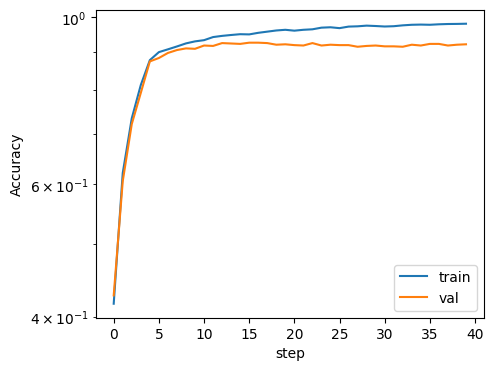

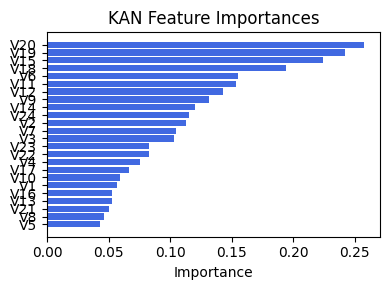

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.36316439948566454), ('V18', 0.362899485041836), ('V17', 0.34887514276917314), ('V13', 0.29852160213425827), ('V19', 0.2835692170977118), ('V23', 0.27865696544997776), ('V11', 0.2697728362655943), ('V12', 0.2550869545649977), ('V8', 0.24368644117155103), ('V22', 0.24315520992328588), ('V24', 0.23059049327697315), ('V14', 0.22929595780772952), ('V7', 0.2027844213528794), ('V9', 0.20076341701459546), ('V6', 0.18357363223603965), ('V10', 0.18152794244038695), ('V3', 0.1731766318360301), ('V15', 0.16066440677936802), ('V21', 0.1572487265618489), ('V20', 0.1548346195489839), ('V5', 0.15291279145832706), ('V4', 0.15185026933514253), ('V2', 0.12576159339942056), ('Ex1', 0.09007985927772617), ('V1', 0.06726333195291483)]


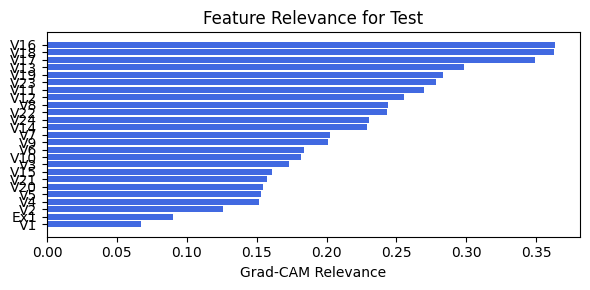

In [74]:
train_and_plot_relevance(Model3_1, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=10, lamb=0.001, steps=40, filename=filename_1, opt_col_val=10)

### 1.2.6 width=[24, 7, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=14

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.84e-01 | val_acc_hybrid: 8.99e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.11it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1638e-01 at 23 epoch
tensor(0.9093, device='cuda:0')
[[413  26   1   1]
 [ 28 376  16   0]
 [  0   7  57   2]
 [  0   3  15 147]]
M_KAN Relevance: 0.9854916334152222
CNN Relevance: 0.014508386142551899
[('V19', 0.28900474), ('V20', 0.28566274), ('V15', 0.26360294), ('V5', 0.199461), ('V14', 0.13247214), ('V12', 0.12941493), ('V4', 0.12768604), ('V6', 0.12076709), ('V24', 0.114071354), ('V22', 0.106546566), ('V17', 0.0977801), ('V18', 0.0976415), ('V13', 0.08293348), ('V23', 0.07559271), ('V11', 0.07251849), ('V2', 0.06892935), ('V10', 0.0684543), ('V3', 0.06836275), ('V7', 0.05778474), ('V9', 0.05698672), ('V21', 0.056364696), ('V16', 0.049308114), ('V1', 0.04110991), ('V8', 0.039127573)]


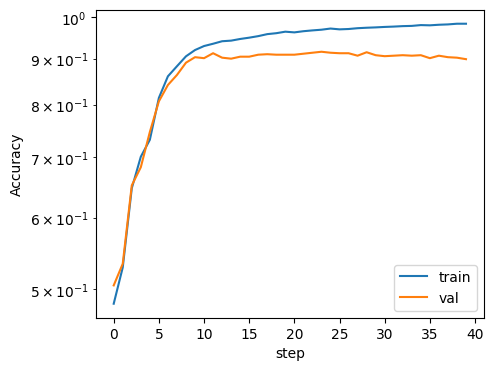

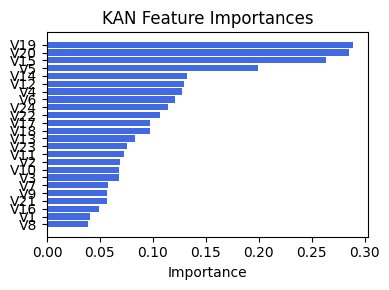

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V12', 0.47248026174911034), ('V13', 0.4627318243341966), ('V16', 0.4248822812577744), ('V18', 0.4082098275835834), ('V11', 0.4018065080817639), ('V6', 0.3989558281724925), ('V17', 0.3867519202715382), ('V7', 0.3859642954741949), ('V8', 0.38180115235067097), ('V19', 0.2991357190078619), ('V14', 0.2966480381021009), ('V1', 0.2858749441239614), ('V2', 0.28538084656773893), ('V3', 0.27430176529704997), ('V24', 0.2734590274387981), ('V22', 0.27342969451791305), ('V23', 0.2545899441261049), ('V9', 0.24883036944851444), ('V4', 0.2019014134789875), ('V21', 0.16387914307372842), ('Ex1', 0.12966697058764512), ('V20', 0.09739979934041139), ('V15', 0.09609387491594304), ('V5', 0.09104501237182179), ('V10', 0.08386324099063584)]


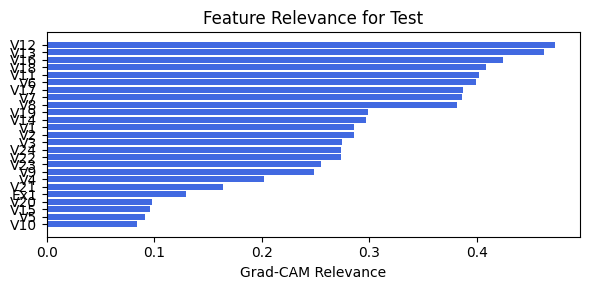

In [75]:
train_and_plot_relevance(Model3_1, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=14, lamb=0.001, steps=40, filename=filename_1, opt_col_val=14)

### 1.2.7 width=[24, 7, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=14

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.84e-01 | val_acc_hybrid: 8.99e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.18it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1638e-01 at 23 epoch
tensor(0.9093, device='cuda:0')
[[413  26   1   1]
 [ 28 376  16   0]
 [  0   7  57   2]
 [  0   3  15 147]]
M_KAN Relevance: 0.9854916334152222
CNN Relevance: 0.014508386142551899
[('V19', 0.28900474), ('V20', 0.28566274), ('V15', 0.26360294), ('V5', 0.199461), ('V14', 0.13247214), ('V12', 0.12941493), ('V4', 0.12768604), ('V6', 0.12076709), ('V24', 0.114071354), ('V22', 0.106546566), ('V17', 0.0977801), ('V18', 0.0976415), ('V13', 0.08293348), ('V23', 0.07559271), ('V11', 0.07251849), ('V2', 0.06892935), ('V10', 0.0684543), ('V3', 0.06836275), ('V7', 0.05778474), ('V9', 0.05698672), ('V21', 0.056364696), ('V16', 0.049308114), ('V1', 0.04110991), ('V8', 0.039127573)]


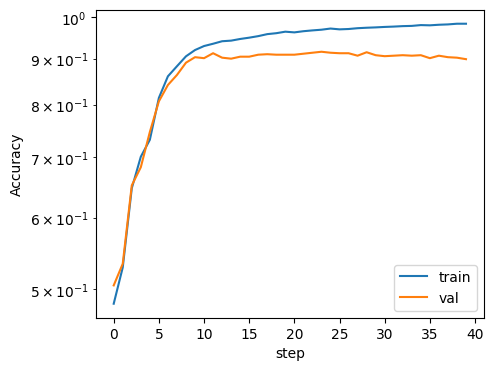

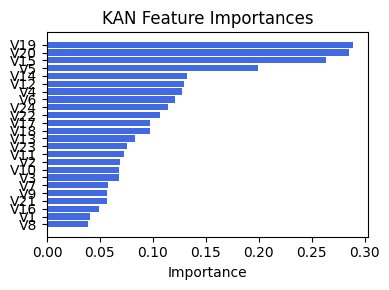

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V12', 0.47248026174911034), ('V13', 0.4627318243341966), ('V16', 0.4248822812577744), ('V18', 0.4082098275835834), ('V11', 0.4018065080817639), ('V6', 0.3989558281724925), ('V17', 0.3867519202715382), ('V7', 0.3859642954741949), ('V8', 0.38180115235067097), ('V19', 0.2991357190078619), ('V14', 0.2966480381021009), ('V1', 0.2858749441239614), ('V2', 0.28538084656773893), ('V3', 0.27430176529704997), ('V24', 0.2734590274387981), ('V22', 0.27342969451791305), ('V23', 0.2545899441261049), ('V9', 0.24883036944851444), ('V4', 0.2019014134789875), ('V21', 0.16387914307372842), ('Ex1', 0.12966697058764512), ('V20', 0.09739979934041139), ('V15', 0.09609387491594304), ('V5', 0.09104501237182179), ('V10', 0.08386324099063584)]


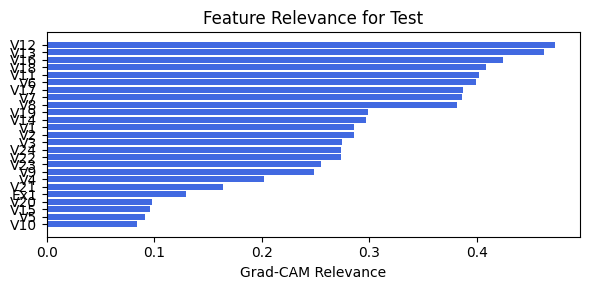

In [76]:
train_and_plot_relevance(Model3_1, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=14, lamb=0.001, steps=40, filename=filename_1, opt_col_val=14)

## 1.3 width=[24, 9, 1], grid=8, lamb=0.001

### 1.3.0 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.64e-01 | val_acc_hybrid: 9.06e-01 |: 100%|█████| 40/40 [00:13<00:00,  2.98it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1638e-01 at 28 epoch
tensor(0.9020, device='cuda:0')
[[407  31   2   1]
 [ 10 389  21   0]
 [  0  10  55   1]
 [  0   3  28 134]]
M_KAN Relevance: 0.9777372479438782
CNN Relevance: 0.022262750193476677
[('V15', 0.32828012), ('V20', 0.29470617), ('V19', 0.25057068), ('V7', 0.23329309), ('V2', 0.15090717), ('V18', 0.14860323), ('V14', 0.12018377), ('V4', 0.112268485), ('V16', 0.108776756), ('V11', 0.104630545), ('V10', 0.10367373), ('V9', 0.103489175), ('V12', 0.101527736), ('V24', 0.10007677), ('V5', 0.098606944), ('V6', 0.091448665), ('V21', 0.083388135), ('V8', 0.07788858), ('V22', 0.07622357), ('V17', 0.07562293), ('V13', 0.06571078), ('V3', 0.065301396), ('V23', 0.060146168), ('V1', 0.046627488)]


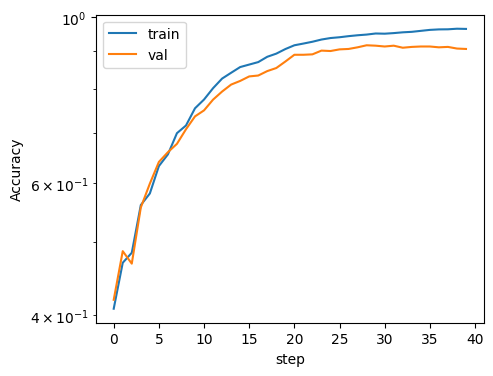

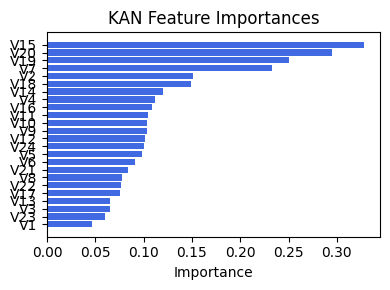

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V11', 0.3910148219938392), ('V16', 0.38167376602346254), ('V6', 0.3169881037192348), ('V7', 0.2180285837683373), ('V1', 0.21629940063144454), ('V12', 0.2119430110792181), ('V10', 0.20777838893277326), ('V20', 0.20447030653319945), ('V2', 0.19841729814018705), ('V14', 0.1974833478152005), ('V15', 0.19535737140095646), ('V3', 0.18968936794821467), ('V21', 0.17547002233942585), ('V9', 0.17267557572732908), ('V17', 0.17016027539272557), ('V8', 0.16302782031628577), ('V19', 0.16105375196448654), ('V5', 0.15475104224683475), ('V4', 0.15244957844700302), ('V13', 0.12097768917711342), ('V18', 0.10394381725629313), ('V22', 0.09437672131939624), ('V24', 0.07129954692027907), ('V23', 0.06239976468302532), ('Ex1', 0.05360410428088288)]


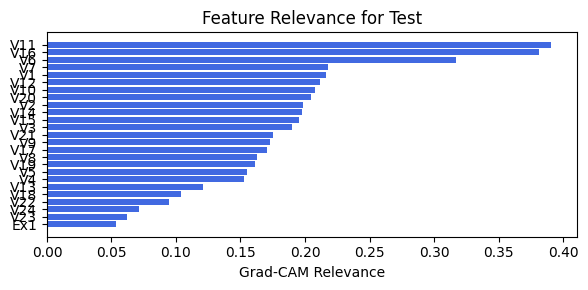

In [77]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=3, lamb=0.001, steps=40, filename=filename_1, opt_col_val=3)

### 1.3.1 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.68e-01 | val_acc_hybrid: 8.95e-01 |: 100%|█████| 40/40 [00:13<00:00,  3.05it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.9920e-01 at 28 epoch
tensor(0.9029, device='cuda:0')
[[407  31   2   1]
 [ 19 385  13   3]
 [  0   9  56   1]
 [  1   5  21 138]]
M_KAN Relevance: 0.9212900400161743
CNN Relevance: 0.07870995253324509
[('V20', 0.28011844), ('V19', 0.2663806), ('V15', 0.22701621), ('V7', 0.21159549), ('V11', 0.16562684), ('V13', 0.14365885), ('V2', 0.14243652), ('V9', 0.13674082), ('V3', 0.13478129), ('V17', 0.11968046), ('V12', 0.114905305), ('V8', 0.1081259), ('V5', 0.106058426), ('V24', 0.10517897), ('V22', 0.10334407), ('V10', 0.101976484), ('V14', 0.09617279), ('V18', 0.08828769), ('V6', 0.08683849), ('V4', 0.07801752), ('V21', 0.076341584), ('V16', 0.07570163), ('V23', 0.061533682), ('V1', 0.033896476)]


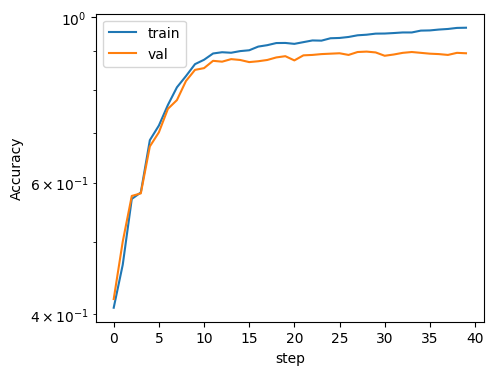

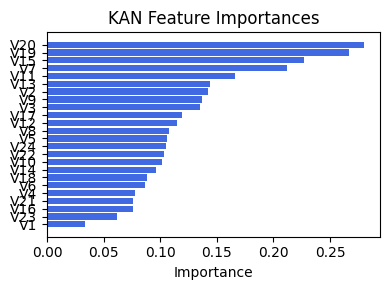

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.387763500072155), ('V22', 0.3792839453093047), ('V17', 0.37907938217687087), ('V16', 0.3660877463466715), ('V18', 0.34258978415292096), ('V24', 0.3361706387792595), ('V11', 0.31851936415232923), ('V13', 0.3139765758329944), ('V12', 0.31064674302069095), ('V19', 0.3047982684467517), ('V8', 0.3045593467329956), ('V14', 0.2986501346252929), ('V7', 0.2829352957541942), ('V9', 0.27182007333583685), ('V15', 0.26732227193042823), ('V10', 0.2666361089373329), ('V21', 0.23671538446220045), ('V3', 0.23512475583261772), ('V20', 0.23281420292276533), ('V6', 0.22609528302401044), ('V4', 0.20077246899580417), ('V5', 0.18688208125336164), ('V2', 0.17817166385927086), ('V1', 0.11762549621174573), ('Ex1', 0.10432087177399635)]


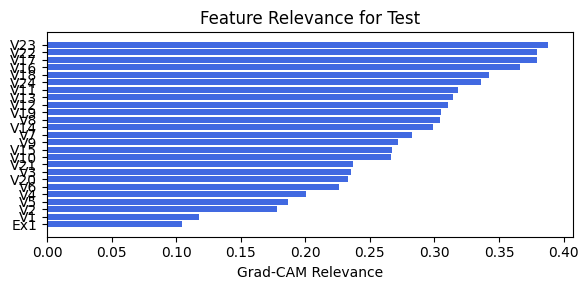

In [78]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=3, lamb=0.001, steps=40, filename=filename_1, opt_col_val=3)

### 1.3.2 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.92e-01 | val_acc_hybrid: 9.01e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.15it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1753e-01 at 24 epoch
tensor(0.9139, device='cuda:0')
[[408  28   4   1]
 [ 16 396   6   2]
 [  1   8  53   4]
 [  0   8  16 141]]
M_KAN Relevance: 0.8733454942703247
CNN Relevance: 0.1266544908285141
[('V15', 0.3650067), ('V19', 0.23120563), ('V20', 0.22200663), ('V14', 0.19851756), ('V13', 0.19699346), ('V18', 0.16600426), ('V6', 0.15594691), ('V9', 0.14201257), ('V22', 0.12506044), ('V16', 0.10992333), ('V10', 0.095697366), ('V5', 0.09530364), ('V12', 0.089479215), ('V17', 0.088077076), ('V4', 0.08623352), ('V7', 0.08540461), ('V24', 0.085377574), ('V3', 0.08118497), ('V8', 0.069876425), ('V11', 0.06618702), ('V23', 0.055226233), ('V2', 0.0543331), ('V21', 0.05365107), ('V1', 0.04038248)]


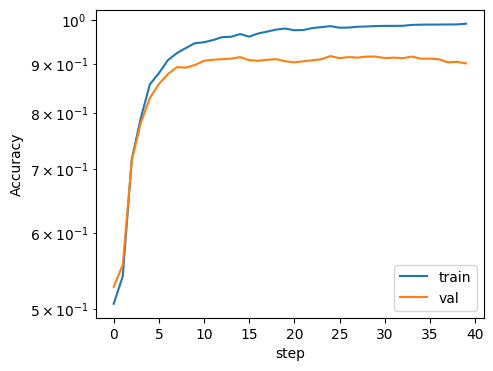

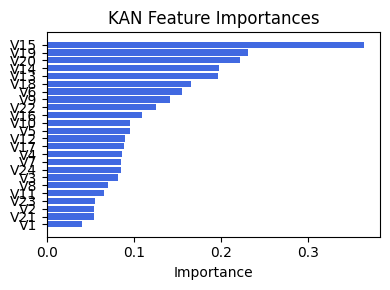

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.29373319514373813), ('V13', 0.293678372791344), ('V17', 0.293358944822316), ('V12', 0.26405576623380506), ('V19', 0.26010358760998187), ('V8', 0.25055092977826404), ('V7', 0.22771715649575056), ('V22', 0.21234682216965714), ('V14', 0.2080005691297209), ('V23', 0.2060516640844997), ('V24', 0.19310306718456985), ('V16', 0.18594395378326287), ('V6', 0.18325624979775307), ('V5', 0.18048410912275364), ('V1', 0.1802462664714907), ('V3', 0.17724265999938088), ('V11', 0.17672290834891946), ('V2', 0.17033669492570963), ('V9', 0.1701443405939614), ('V4', 0.16191639161464885), ('V21', 0.15563920015575694), ('Ex1', 0.13220699341835934), ('V20', 0.12325719135185284), ('V15', 0.10254504702236476), ('V10', 0.0868061489306519)]


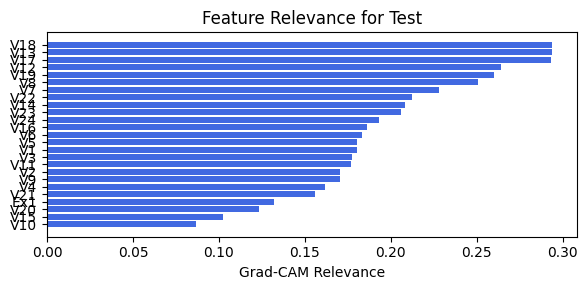

In [79]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=6, lamb=0.001, steps=40, filename=filename_1, opt_col_val=6)

### 1.3.3 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 9.27e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.22it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.2898e-01 at 37 epoch
tensor(0.9130, device='cuda:0')
[[411  23   6   1]
 [  8 400  11   1]
 [  0   6  53   7]
 [  0   5  27 133]]
M_KAN Relevance: 0.9262423515319824
CNN Relevance: 0.07375761866569519
[('V15', 0.3804627), ('V19', 0.21293135), ('V20', 0.19776829), ('V18', 0.17462122), ('V14', 0.15774788), ('V13', 0.12914228), ('V12', 0.12551285), ('V6', 0.11136096), ('V7', 0.11062576), ('V24', 0.104375176), ('V17', 0.104332134), ('V9', 0.10260227), ('V5', 0.09229612), ('V3', 0.08790249), ('V8', 0.08788987), ('V11', 0.086670265), ('V22', 0.08575824), ('V10', 0.08104395), ('V4', 0.07871062), ('V16', 0.068216875), ('V21', 0.056597684), ('V2', 0.05320072), ('V1', 0.05200948), ('V23', 0.05114908)]


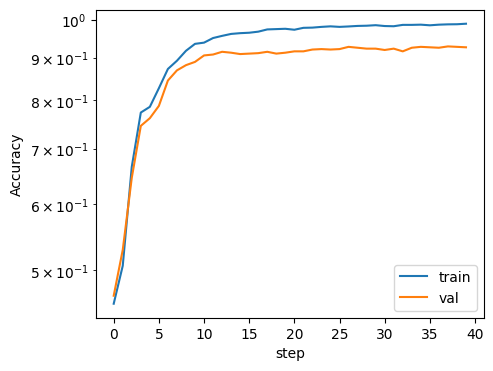

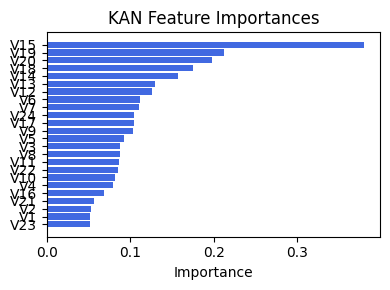

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.43711553674703807), ('V18', 0.39539173245557924), ('V14', 0.34196509841096934), ('V19', 0.3394083569662973), ('V8', 0.33788211694574233), ('V12', 0.32951956061911153), ('V17', 0.3169105410236695), ('V7', 0.2963251378847757), ('V9', 0.284089615123326), ('V23', 0.26058900055723716), ('V24', 0.2301108258396418), ('V22', 0.21744525550178673), ('V11', 0.2117743696434555), ('V3', 0.20884831055635059), ('V2', 0.19833967175330747), ('V16', 0.19602685680398854), ('V6', 0.19242229251657533), ('V4', 0.18006904290942347), ('V1', 0.1639255587078312), ('V20', 0.15776314486436524), ('V10', 0.14346848389146416), ('V5', 0.1401835818398514), ('V15', 0.1387062608513848), ('V21', 0.13269244234642438), ('Ex1', 0.11854131135923028)]


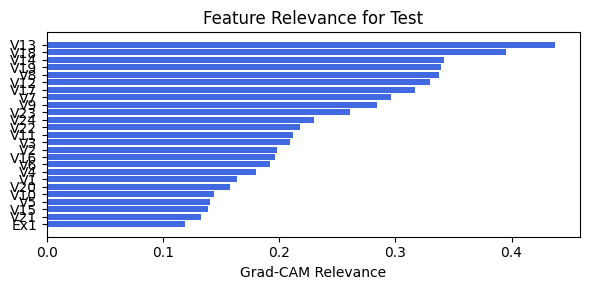

In [80]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=6, lamb=0.001, steps=40, filename=filename_1, opt_col_val=6)

### 1.3.4 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.85e-01 | val_acc_hybrid: 8.84e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.10it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1065e-01 at 18 epoch
tensor(0.9103, device='cuda:0')
[[409  24   6   2]
 [ 20 392   6   2]
 [  0   8  58   0]
 [  0   4  26 135]]
M_KAN Relevance: 0.8345394730567932
CNN Relevance: 0.16546055674552917
[('V15', 0.33372754), ('V19', 0.23858018), ('V7', 0.22610089), ('V20', 0.21480383), ('V9', 0.12161544), ('V13', 0.118528605), ('V16', 0.11322803), ('V18', 0.11277963), ('V22', 0.10724769), ('V23', 0.104523756), ('V6', 0.10008652), ('V12', 0.09709645), ('V17', 0.095107965), ('V14', 0.09363018), ('V5', 0.076818205), ('V8', 0.07618392), ('V4', 0.0647301), ('V10', 0.06403126), ('V3', 0.05899346), ('V11', 0.0574186), ('V24', 0.051689044), ('V2', 0.048969284), ('V21', 0.048752528), ('V1', 0.04696054)]


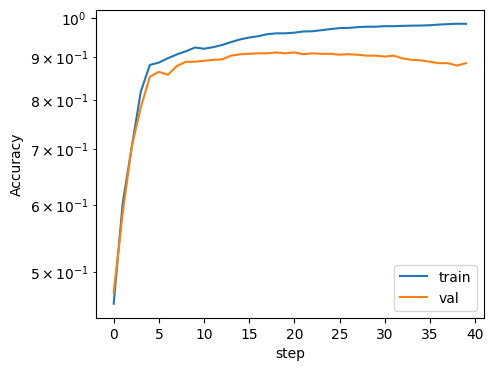

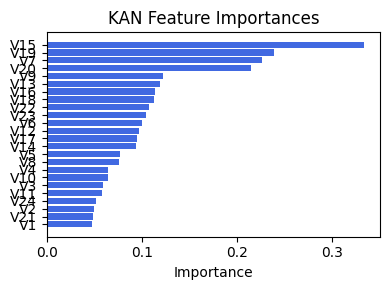

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V1', 0.5631827829018544), ('V6', 0.45128866920881777), ('V11', 0.4479237395155509), ('V2', 0.4003617093018738), ('V5', 0.3936592453956709), ('V16', 0.38238438901663313), ('V21', 0.35103744252580826), ('V3', 0.3480194287986329), ('V4', 0.31632849670532803), ('V10', 0.2600374978639007), ('V14', 0.21753662493124248), ('V15', 0.21399898200053655), ('V7', 0.20650285060720897), ('V19', 0.18730939596227453), ('V9', 0.18431474975598214), ('V12', 0.17470115003398418), ('V18', 0.16974522258008357), ('V17', 0.16659409493085758), ('V22', 0.16583439374527179), ('V13', 0.14892348747914946), ('V20', 0.1470151201309828), ('V8', 0.14575831983246987), ('V24', 0.1333487703163866), ('V23', 0.1288901963177386), ('Ex1', 0.04481855410362963)]


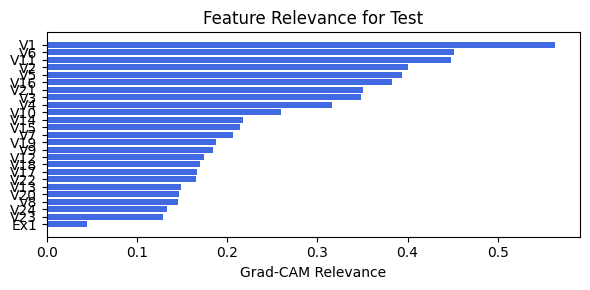

In [81]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=9, lamb=0.001, steps=40, filename=filename_1, opt_col_val=9)

### 1.3.5 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.82e-01 | val_acc_hybrid: 9.27e-01 |: 100%|█████| 40/40 [00:14<00:00,  2.79it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 28 epoch
tensor(0.9341, device='cuda:0')
[[413  23   3   2]
 [  7 408   5   0]
 [  0   8  57   1]
 [  0   5  18 142]]
M_KAN Relevance: 0.9362228512763977
CNN Relevance: 0.06377716362476349
[('V15', 0.3283111), ('V19', 0.2398515), ('V20', 0.21908946), ('V22', 0.16387384), ('V7', 0.14970139), ('V12', 0.14486244), ('V17', 0.12955286), ('V18', 0.12688582), ('V9', 0.12263824), ('V13', 0.11981604), ('V8', 0.11025849), ('V14', 0.104300186), ('V5', 0.09202359), ('V4', 0.08593703), ('V10', 0.08399428), ('V23', 0.08131538), ('V24', 0.0799279), ('V2', 0.06769218), ('V3', 0.06234609), ('V16', 0.05407627), ('V6', 0.052783787), ('V21', 0.048171144), ('V11', 0.04414019), ('V1', 0.039728854)]


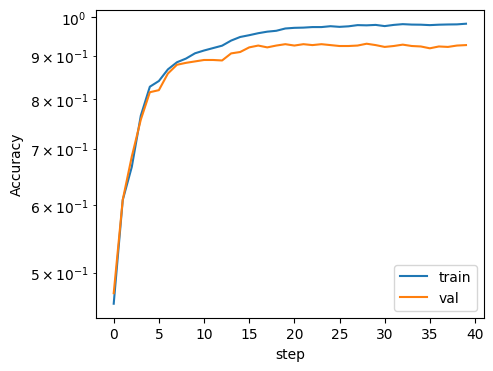

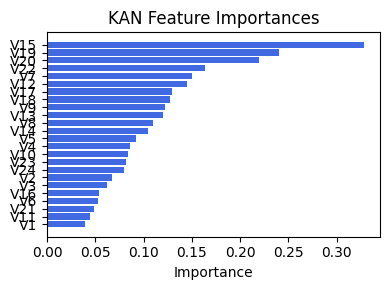

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.3637382220514078), ('V1', 0.32376400029010416), ('V6', 0.3181312246775806), ('V11', 0.3011974249274027), ('V16', 0.28315203484052265), ('V2', 0.25758971220114296), ('V3', 0.20664593222899227), ('V7', 0.188978404338391), ('V4', 0.14961757299353695), ('V21', 0.14537714644356106), ('V19', 0.14309519559261363), ('V17', 0.13964690922523418), ('V14', 0.13955190088817399), ('V8', 0.13835363180388102), ('V23', 0.12968491951902159), ('V9', 0.12670843246941507), ('V24', 0.12441706323357261), ('V12', 0.12320817696575469), ('V22', 0.1225636762374518), ('V18', 0.11848455146856984), ('V5', 0.11612473765231138), ('V10', 0.10184764630423906), ('V13', 0.09953012834371842), ('V20', 0.08914819218330611), ('V15', 0.08538820862055557)]


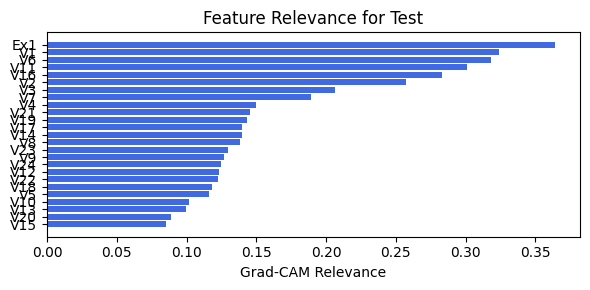

In [82]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=9, lamb=0.001, steps=40, filename=filename_1, opt_col_val=9)

### 1.3.6 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 9.05e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.11it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1867e-01 at 22 epoch
tensor(0.9093, device='cuda:0')
[[412  25   4   0]
 [ 21 384  15   0]
 [  0   9  56   1]
 [  0   2  22 141]]
M_KAN Relevance: 0.7949510812759399
CNN Relevance: 0.20504894852638245
[('V15', 0.42035282), ('V20', 0.25141674), ('V19', 0.2336768), ('V18', 0.1411731), ('V7', 0.13605094), ('V12', 0.11182466), ('V9', 0.10972375), ('V10', 0.108516745), ('V22', 0.0946394), ('V24', 0.08817458), ('V8', 0.085836805), ('V14', 0.08538484), ('V5', 0.08202937), ('V2', 0.081959695), ('V4', 0.07724287), ('V6', 0.07479379), ('V23', 0.0733009), ('V17', 0.06347398), ('V11', 0.062215924), ('V13', 0.058497317), ('V3', 0.055803347), ('V1', 0.050781883), ('V16', 0.045479435), ('V21', 0.037290066)]


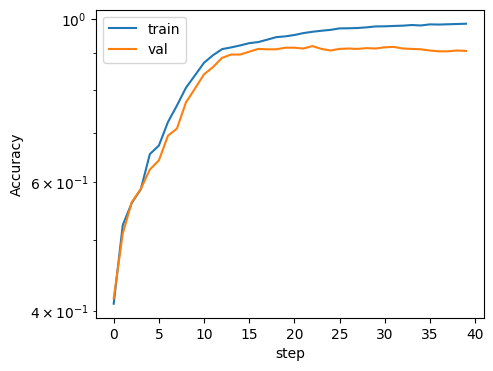

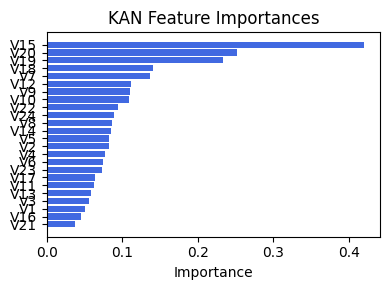

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V1', 0.7082745737699798), ('V16', 0.7032312919870155), ('V6', 0.7026790432468221), ('V11', 0.6956649242674091), ('V21', 0.5914113296693935), ('V2', 0.5552802153240639), ('V5', 0.5372360079743705), ('V3', 0.5301922381535299), ('V4', 0.46243257546753047), ('V7', 0.414400072404586), ('V8', 0.37101930199103983), ('V12', 0.3613060418930674), ('V13', 0.3106004106914522), ('V17', 0.3087792573750425), ('V10', 0.2820391250380243), ('V9', 0.2672997821263023), ('V22', 0.22004976385697764), ('V15', 0.20759002756532716), ('V18', 0.20028283525149138), ('V14', 0.16270817553054373), ('Ex1', 0.1337295587639083), ('V19', 0.1296304414096591), ('V20', 0.09772714215457962), ('V23', 0.09690330621874686), ('V24', 0.08714337498113242)]


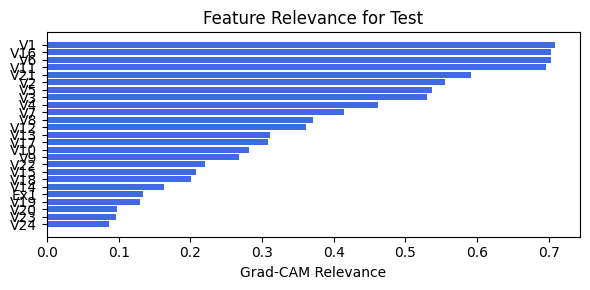

In [83]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=12, lamb=0.001, steps=40, filename=filename_1, opt_col_val=12)

### 1.3.7 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.77e-01 | val_acc_hybrid: 9.10e-01 |: 100%|█████| 40/40 [00:13<00:00,  3.02it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.2898e-01 at 31 epoch
tensor(0.9185, device='cuda:0')
[[413  24   3   1]
 [ 19 390  11   0]
 [  1   7  55   3]
 [  0   4  16 145]]
M_KAN Relevance: 0.8381672501564026
CNN Relevance: 0.16183282434940338
[('V19', 0.3201747), ('V20', 0.270673), ('V15', 0.26888263), ('V9', 0.1722335), ('V10', 0.16158696), ('V18', 0.13759743), ('V14', 0.13289918), ('V22', 0.10331832), ('V17', 0.09338377), ('V12', 0.08963994), ('V16', 0.08439014), ('V3', 0.08265202), ('V13', 0.07965771), ('V6', 0.07882166), ('V24', 0.07730315), ('V11', 0.07715472), ('V7', 0.07689979), ('V21', 0.06980272), ('V23', 0.0677896), ('V2', 0.066303946), ('V5', 0.06579602), ('V4', 0.057143524), ('V8', 0.0453805), ('V1', 0.043178596)]


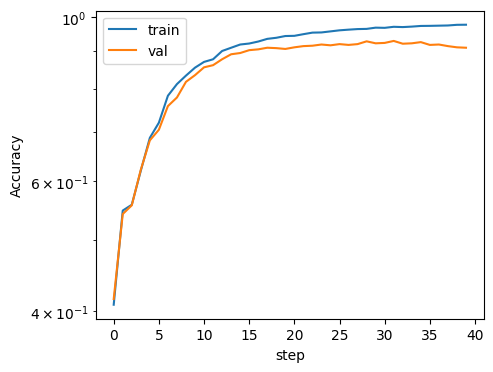

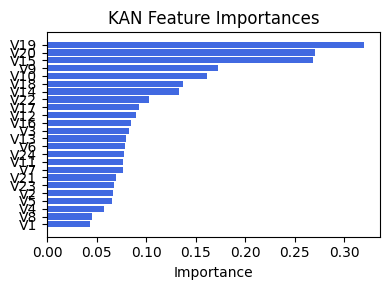

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.38601802880624175), ('V1', 0.3806516636268964), ('V21', 0.3706304829852526), ('V6', 0.3313440239420903), ('V23', 0.32097869642648585), ('V24', 0.3196257939385233), ('V11', 0.3103987482931182), ('V16', 0.29866283225454116), ('V2', 0.2590122282344365), ('V12', 0.23956908175368413), ('V7', 0.23890258245774687), ('V5', 0.23884323457423973), ('V3', 0.23580213232075065), ('V17', 0.2273812750868257), ('V13', 0.22295049652543322), ('Ex1', 0.2203678040412995), ('V8', 0.21857517634587553), ('V4', 0.21178980896625352), ('V15', 0.21164353448179493), ('V14', 0.20440646393095388), ('V19', 0.18752052513330025), ('V18', 0.18372301696414842), ('V9', 0.18040352707612328), ('V20', 0.16784455628181444), ('V10', 0.15890953176482978)]


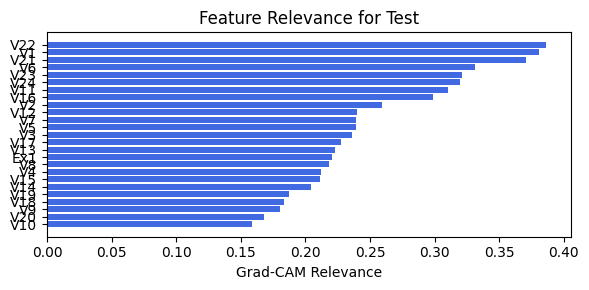

In [84]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=12, lamb=0.001, steps=40, filename=filename_1, opt_col_val=12)

### 1.3.8 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=15

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.87e-01 | val_acc_hybrid: 8.90e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.17it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1638e-01 at 21 epoch
tensor(0.9038, device='cuda:0')
[[412  26   2   1]
 [ 28 374  18   0]
 [  1   5  60   0]
 [  0   5  19 141]]
M_KAN Relevance: 0.8857630491256714
CNN Relevance: 0.11423689126968384
[('V15', 0.2830765), ('V20', 0.27915177), ('V9', 0.2146504), ('V19', 0.17955828), ('V13', 0.17121924), ('V22', 0.14477381), ('V6', 0.140493), ('V14', 0.13552895), ('V10', 0.104672946), ('V12', 0.10144464), ('V18', 0.100173935), ('V17', 0.09009228), ('V24', 0.08973619), ('V16', 0.08277295), ('V5', 0.08246157), ('V7', 0.07157351), ('V23', 0.07145294), ('V11', 0.070180364), ('V2', 0.06832042), ('V4', 0.06472385), ('V8', 0.060351864), ('V1', 0.060322538), ('V3', 0.058648612), ('V21', 0.04552882)]


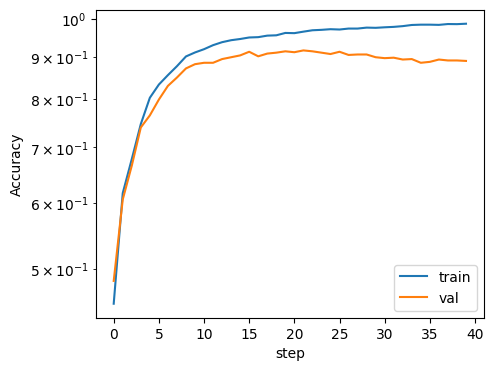

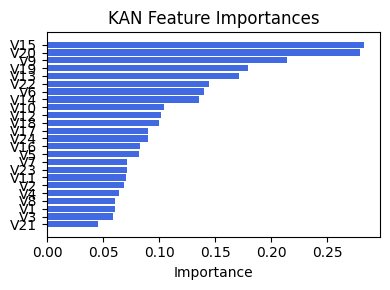

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V11', 0.3307698857467349), ('V16', 0.28999492779601516), ('V6', 0.28587651796887853), ('V1', 0.21881338751759), ('V12', 0.21163005637659116), ('V7', 0.21137579322362815), ('V8', 0.20057967390593293), ('V2', 0.19087214953696352), ('V13', 0.18785793929136504), ('V17', 0.18146325613183545), ('V3', 0.18089254943714922), ('Ex1', 0.16641370330283517), ('V18', 0.15472298722941047), ('V21', 0.14106340427844485), ('V9', 0.13600520188585186), ('V20', 0.13561531246693945), ('V19', 0.1187999939462622), ('V14', 0.11539921162100641), ('V15', 0.11448875512934593), ('V4', 0.11384433537897323), ('V10', 0.09019526099222103), ('V5', 0.07021974218837003), ('V22', 0.06104176863099826), ('V24', 0.04564891631239317), ('V23', 0.04361496167933386)]


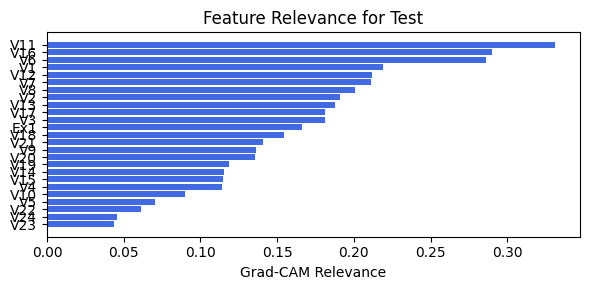

In [85]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=15, lamb=0.001, steps=40, filename=filename_1, opt_col_val=15)

### 1.3.9 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=15

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.85e-01 | val_acc_hybrid: 9.12e-01 |: 100%|█████| 40/40 [00:13<00:00,  2.98it/s]


saving model version 0.1
✅ Best validation Accuracy: 9.1180e-01 at 38 epoch
tensor(0.9011, device='cuda:0')
[[402  35   4   0]
 [ 20 383  17   0]
 [  0   8  58   0]
 [  2   5  17 141]]
M_KAN Relevance: 0.8680842518806458
CNN Relevance: 0.13191582262516022
[('V15', 0.3482277), ('V19', 0.23627782), ('V20', 0.23425514), ('V9', 0.18567158), ('V13', 0.18300124), ('V6', 0.114358716), ('V17', 0.1140497), ('V14', 0.11395068), ('V22', 0.108104356), ('V10', 0.10810223), ('V12', 0.102041066), ('V18', 0.10197757), ('V7', 0.09372139), ('V24', 0.089835025), ('V2', 0.084828146), ('V5', 0.08300022), ('V4', 0.077855825), ('V16', 0.06982374), ('V11', 0.0643929), ('V3', 0.06291147), ('V23', 0.0617965), ('V8', 0.058568366), ('V21', 0.043734673), ('V1', 0.038077816)]


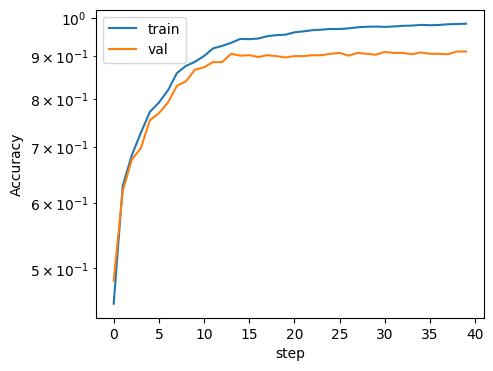

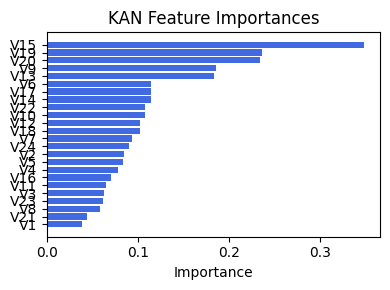

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V11', 0.3192248248002955), ('V21', 0.31528844368881687), ('V16', 0.2603753004307328), ('V6', 0.2586261927694261), ('V1', 0.17513516252319822), ('V7', 0.1667235506099995), ('V12', 0.16159272652155432), ('V17', 0.1463967086732497), ('V19', 0.13935529190345797), ('V2', 0.13381509464368171), ('V14', 0.13007261730080655), ('V20', 0.1290023848499374), ('V9', 0.1264252814491136), ('V8', 0.11975211141999442), ('V13', 0.11352627825515597), ('V18', 0.11225078532320018), ('V3', 0.1086691618323233), ('V15', 0.10495753508170337), ('Ex1', 0.10117244294203137), ('V22', 0.0884012781553083), ('V4', 0.08153081494826468), ('V10', 0.08119509047633523), ('V24', 0.08063275666707061), ('V23', 0.07111899751326903), ('V5', 0.05180278857274944)]


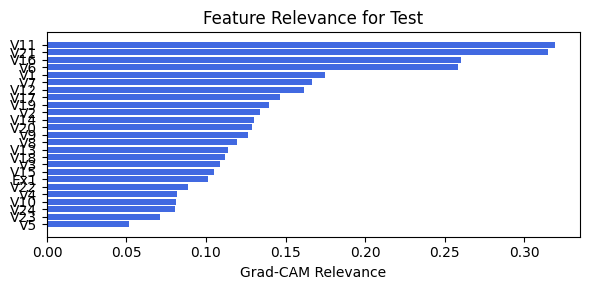

In [86]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=15, lamb=0.001, steps=40, filename=filename_1, opt_col_val=15)

### 1.3.10 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=18

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.79e-01 | val_acc_hybrid: 8.49e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.29it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.8774e-01 at 13 epoch
tensor(0.8773, device='cuda:0')
[[391  45   4   1]
 [ 34 370  16   0]
 [  0   4  61   1]
 [  0   3  26 136]]
M_KAN Relevance: 0.8528692722320557
CNN Relevance: 0.1471307873725891
[('V20', 0.32811013), ('V15', 0.25279075), ('V19', 0.2438224), ('V7', 0.13902779), ('V11', 0.13775632), ('V9', 0.13175568), ('V22', 0.1309056), ('V14', 0.120332204), ('V13', 0.11936487), ('V17', 0.11935172), ('V10', 0.11289252), ('V18', 0.099934764), ('V12', 0.09785512), ('V5', 0.091071285), ('V16', 0.08579782), ('V4', 0.079215676), ('V24', 0.07784842), ('V8', 0.069006935), ('V3', 0.060865104), ('V2', 0.05200675), ('V21', 0.049444996), ('V23', 0.048970964), ('V6', 0.04811171), ('V1', 0.045978237)]


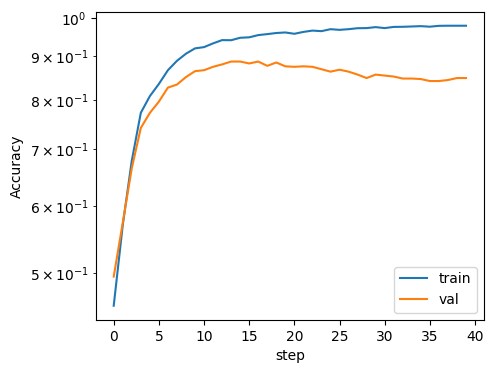

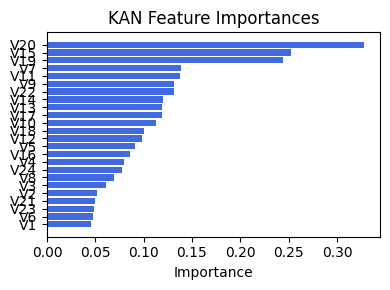

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.3055139973268404), ('V21', 0.29225495146483443), ('V1', 0.2757307366913525), ('V16', 0.2744784569453186), ('V12', 0.27363763990148476), ('V6', 0.2686466520233952), ('V11', 0.2672425239046715), ('V7', 0.26575026545753555), ('V2', 0.25257437862349236), ('V17', 0.25204090376530824), ('V8', 0.19494875217681315), ('V18', 0.1710170553697592), ('V19', 0.15083877257640427), ('V13', 0.14144196338702553), ('V20', 0.14089366524558), ('V9', 0.13502769634073675), ('V3', 0.13112147264276383), ('V14', 0.12547724537671123), ('V23', 0.1244742129274794), ('V24', 0.12150260062881922), ('V4', 0.11758459095146244), ('Ex1', 0.0915393386513066), ('V5', 0.08659981673505644), ('V10', 0.06889429718180493), ('V15', 0.0386030417987338)]


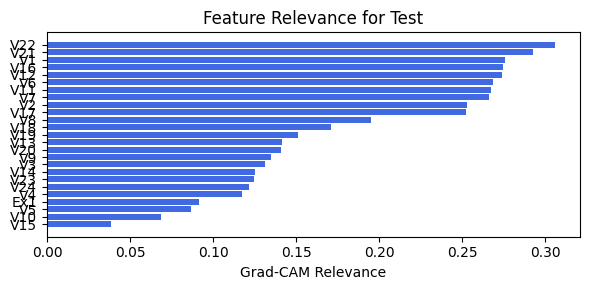

In [87]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=18, lamb=0.001, steps=40, filename=filename_1, opt_col_val=18)

### 1.3.11 width=[24, 9, 1], grid=8, lamb=0.001 | cnn_bottleneck_dim=18

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


 train_acc_hybrid: 9.85e-01 | val_acc_hybrid: 8.41e-01 |: 100%|█████| 40/40 [00:12<00:00,  3.25it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.8545e-01 at 16 epoch
tensor(0.8581, device='cuda:0')
[[388  46   6   1]
 [ 39 356  25   0]
 [  0   6  56   4]
 [  0   2  26 137]]
M_KAN Relevance: 0.848205029964447
CNN Relevance: 0.15179498493671417
[('V15', 0.3116351), ('V20', 0.30721465), ('V19', 0.23595148), ('V11', 0.21610561), ('V22', 0.14106824), ('V14', 0.13531747), ('V5', 0.12349163), ('V7', 0.12121546), ('V18', 0.12082805), ('V9', 0.11360929), ('V10', 0.11060772), ('V24', 0.10873272), ('V12', 0.10343149), ('V13', 0.09817278), ('V23', 0.090807684), ('V17', 0.08700433), ('V16', 0.08212272), ('V4', 0.07907509), ('V8', 0.073112436), ('V6', 0.06685696), ('V3', 0.066452205), ('V21', 0.059914283), ('V1', 0.05742793), ('V2', 0.047501832)]


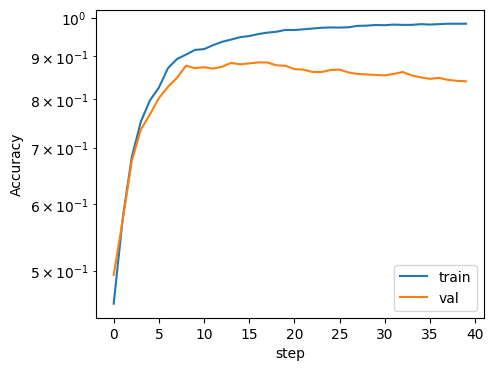

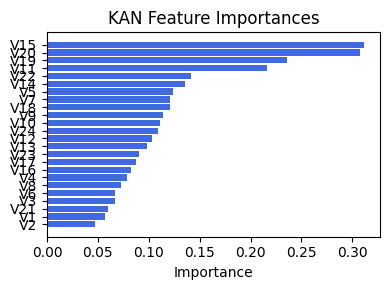

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V1', 0.2944258864169033), ('V2', 0.27846081634386843), ('V22', 0.27102664106221863), ('V7', 0.23723619105720778), ('V21', 0.23314924213826374), ('V8', 0.22486705798037426), ('V11', 0.21992593202245295), ('V6', 0.21672453557389734), ('V12', 0.21004024036305413), ('V17', 0.19774867420509284), ('V16', 0.18890649396466153), ('V3', 0.18605898532557177), ('V9', 0.1814271564324725), ('V20', 0.16463009981482388), ('V13', 0.16152706077951773), ('V18', 0.1597111215785098), ('V4', 0.157565532508077), ('V19', 0.152744927722449), ('V24', 0.1506019320892044), ('V14', 0.14986498342917473), ('V23', 0.14773843587024799), ('Ex1', 0.1411292220032593), ('V5', 0.10544955189090495), ('V10', 0.09399281938958699), ('V15', 0.07005332759709436)]


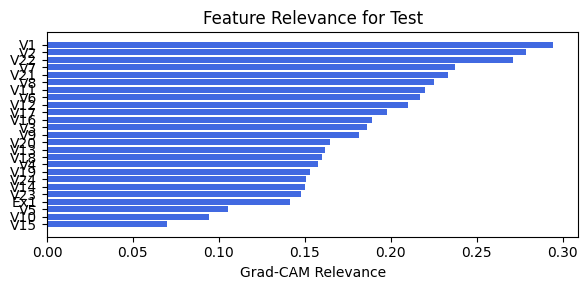

In [88]:
train_and_plot_relevance(Model3_1, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=18, lamb=0.001, steps=40, filename=filename_1, opt_col_val=18)

# Option 2: Multiply CNN output by factor

In [90]:
create_csv_with_header(filename_2, columns_opt2)

## 2.0. width=[24, 12, 1], grid=8, lamb=0.001

### 2.0.1. width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.95e-01 | val_acc_hybrid: 9.03e-01 |: 100%|█████| 40/40 [01:54<00:00,  2.85s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 11 epoch
tensor(0.9359, device='cuda:0')
[[416  21   3   1]
 [ 11 399  10   0]
 [  0   4  62   0]
 [  1   2  17 145]]
M_KAN Relevance: 0.6444101929664612
CNN Relevance: 0.35558977723121643
[('V20', 0.3237874), ('V19', 0.31964177), ('V15', 0.19372603), ('V18', 0.14946286), ('V10', 0.12717435), ('V9', 0.11842997), ('V4', 0.11551251), ('V14', 0.11361812), ('V11', 0.108334444), ('V16', 0.10637357), ('V12', 0.10629609), ('V17', 0.09950071), ('V13', 0.092604876), ('V21', 0.09167658), ('V6', 0.0874694), ('V24', 0.086830065), ('V5', 0.08565687), ('V22', 0.081694625), ('V7', 0.070580885), ('V3', 0.07034698), ('V23', 0.06949205), ('V2', 0.06439109), ('V8', 0.06318649), ('V1', 0.04777075)]


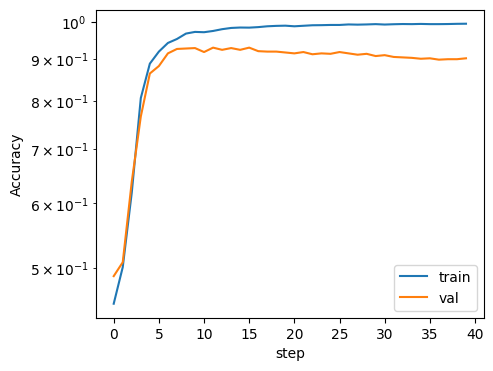

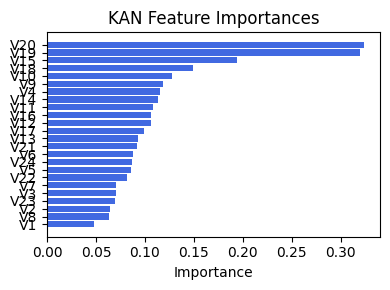

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3926060421567904), ('V24', 0.3619472371966957), ('V22', 0.32899068445397966), ('Ex1', 0.21141698398143519), ('V19', 0.19731050470253092), ('V13', 0.19352709298958531), ('V18', 0.18428730992136047), ('V20', 0.1823234484404549), ('V15', 0.18042571855420692), ('V14', 0.17954260495057647), ('V17', 0.1762561701599981), ('V12', 0.17327991758252326), ('V8', 0.16899629367501373), ('V7', 0.16040658728102727), ('V9', 0.15263293244356896), ('V16', 0.14069090955018132), ('V11', 0.13948341192767807), ('V6', 0.1337012578953543), ('V21', 0.12630403050970526), ('V10', 0.12445233360319564), ('V3', 0.12253312147615841), ('V2', 0.10718630709434432), ('V4', 0.10392973848646071), ('V1', 0.08197081181286514), ('V5', 0.08081464458598184)]


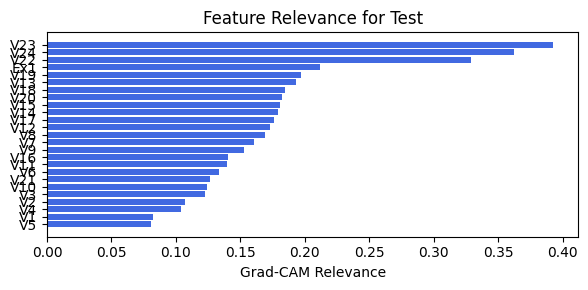

In [91]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.0.2. width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.95e-01 | val_acc_hybrid: 9.03e-01 |: 100%|█████| 40/40 [01:55<00:00,  2.88s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 11 epoch
tensor(0.9359, device='cuda:0')
[[416  21   3   1]
 [ 11 399  10   0]
 [  0   4  62   0]
 [  1   2  17 145]]
M_KAN Relevance: 0.6444101929664612
CNN Relevance: 0.35558977723121643
[('V20', 0.3237874), ('V19', 0.31964177), ('V15', 0.19372603), ('V18', 0.14946286), ('V10', 0.12717435), ('V9', 0.11842997), ('V4', 0.11551251), ('V14', 0.11361812), ('V11', 0.108334444), ('V16', 0.10637357), ('V12', 0.10629609), ('V17', 0.09950071), ('V13', 0.092604876), ('V21', 0.09167658), ('V6', 0.0874694), ('V24', 0.086830065), ('V5', 0.08565687), ('V22', 0.081694625), ('V7', 0.070580885), ('V3', 0.07034698), ('V23', 0.06949205), ('V2', 0.06439109), ('V8', 0.06318649), ('V1', 0.04777075)]


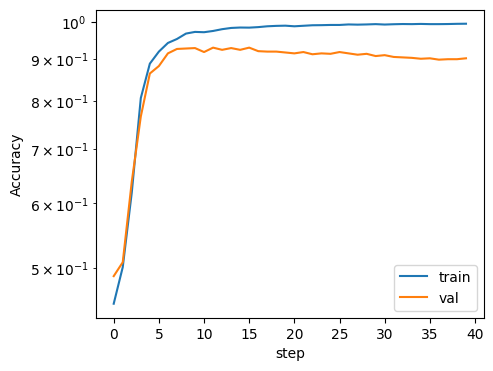

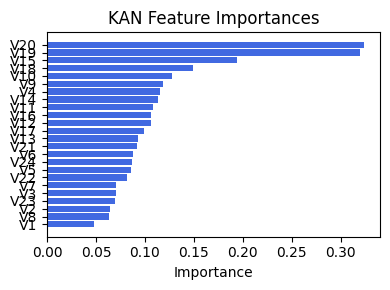

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3926060421567904), ('V24', 0.3619472371966957), ('V22', 0.32899068445397966), ('Ex1', 0.21141698398143519), ('V19', 0.19731050470253092), ('V13', 0.19352709298958531), ('V18', 0.18428730992136047), ('V20', 0.1823234484404549), ('V15', 0.18042571855420692), ('V14', 0.17954260495057647), ('V17', 0.1762561701599981), ('V12', 0.17327991758252326), ('V8', 0.16899629367501373), ('V7', 0.16040658728102727), ('V9', 0.15263293244356896), ('V16', 0.14069090955018132), ('V11', 0.13948341192767807), ('V6', 0.1337012578953543), ('V21', 0.12630403050970526), ('V10', 0.12445233360319564), ('V3', 0.12253312147615841), ('V2', 0.10718630709434432), ('V4', 0.10392973848646071), ('V1', 0.08197081181286514), ('V5', 0.08081464458598184)]


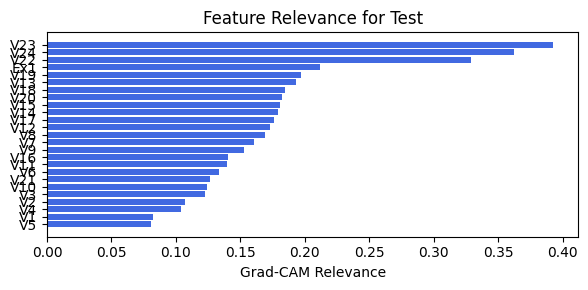

In [92]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.0.2. width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.97e-01 | val_acc_hybrid: 9.19e-01 |: 100%|█████| 40/40 [01:54<00:00,  2.86s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3471e-01 at 11 epoch
tensor(0.9304, device='cuda:0')
[[412  25   3   1]
 [ 14 400   5   1]
 [  0   3  62   1]
 [  0   6  17 142]]
M_KAN Relevance: 0.5086371898651123
CNN Relevance: 0.4913628101348877
[('V19', 0.32438868), ('V20', 0.25517663), ('V15', 0.25170594), ('V12', 0.14948453), ('V14', 0.13723625), ('V18', 0.1371785), ('V17', 0.1310908), ('V22', 0.11441942), ('V13', 0.11118307), ('V10', 0.11074944), ('V9', 0.10657197), ('V11', 0.105218604), ('V21', 0.09835917), ('V16', 0.09196424), ('V7', 0.091329664), ('V24', 0.0882422), ('V23', 0.08689487), ('V6', 0.08672503), ('V2', 0.075685024), ('V5', 0.0684049), ('V4', 0.06682829), ('V1', 0.06603408), ('V3', 0.0638338), ('V8', 0.047735192)]


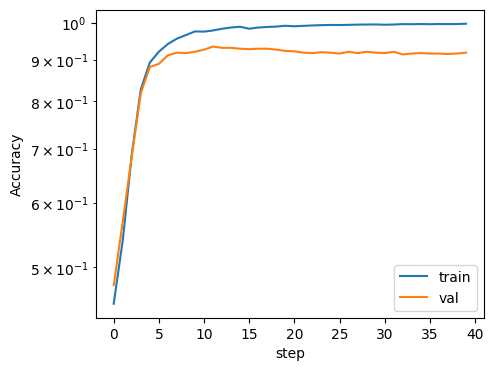

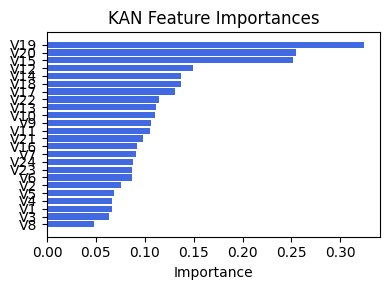

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.2151778384533774), ('V17', 0.1749990782554427), ('V24', 0.17070417884556446), ('V7', 0.16516733195791755), ('V2', 0.16291625185801886), ('V3', 0.16182257153921942), ('V18', 0.15945921673276547), ('V23', 0.15858932556474406), ('V16', 0.15724531416642024), ('V11', 0.15124297922885646), ('V8', 0.14967510308793702), ('V22', 0.1484999253742076), ('V12', 0.1398255127596879), ('V6', 0.1395395823105184), ('V19', 0.13616056787996125), ('V4', 0.13228036294229228), ('V20', 0.13101386210399094), ('V9', 0.12935136541700193), ('V15', 0.12734209151035647), ('V13', 0.12250038301815269), ('V14', 0.11762485497608426), ('V1', 0.11539421303591336), ('V10', 0.0792992861502021), ('V5', 0.07445659691675979), ('V21', 0.06979912302585112)]


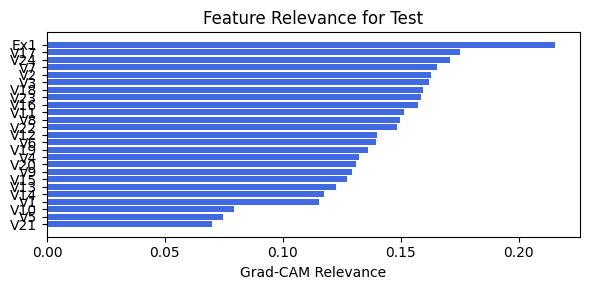

In [93]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.0.3. width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.96e-01 | val_acc_hybrid: 9.24e-01 |: 100%|█████| 40/40 [01:53<00:00,  2.84s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4387e-01 at 13 epoch
tensor(0.9377, device='cuda:0')
[[412  26   2   1]
 [  7 407   6   0]
 [  0   6  59   1]
 [  0   5  14 146]]
M_KAN Relevance: 0.6275885701179504
CNN Relevance: 0.37241142988204956
[('V20', 0.2979512), ('V15', 0.29433107), ('V19', 0.2811448), ('V18', 0.15111661), ('V12', 0.14296311), ('V14', 0.13820007), ('V22', 0.13201739), ('V11', 0.10714735), ('V16', 0.10164565), ('V17', 0.100150816), ('V24', 0.09509471), ('V2', 0.09501081), ('V21', 0.08937223), ('V6', 0.08865355), ('V13', 0.087233655), ('V10', 0.08556026), ('V9', 0.07872254), ('V7', 0.07736542), ('V5', 0.06653099), ('V8', 0.06342674), ('V3', 0.060201865), ('V4', 0.05523482), ('V23', 0.054246597), ('V1', 0.047416463)]


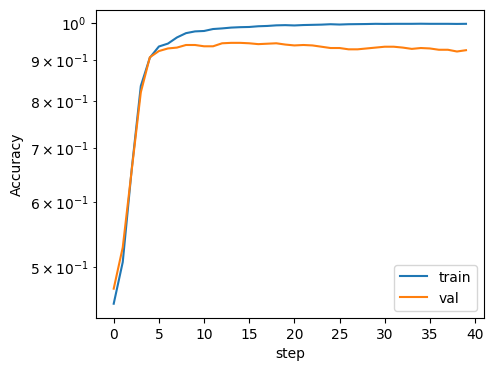

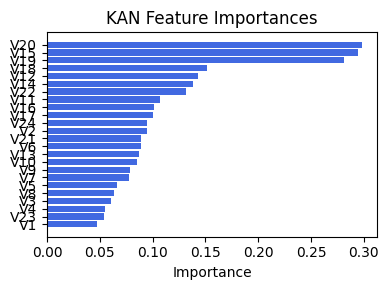

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.37234439326255353), ('V22', 0.35928191965167205), ('V24', 0.35448083337629854), ('V18', 0.23145623870832324), ('V21', 0.21830668844086842), ('V17', 0.2150479356982925), ('V19', 0.21131141032567743), ('Ex1', 0.19729869825625143), ('V16', 0.1946125266044857), ('V14', 0.18707876650245747), ('V20', 0.1796688165932843), ('V13', 0.17627843879244287), ('V11', 0.1754536755701731), ('V12', 0.1713322266540682), ('V8', 0.16223826122575954), ('V7', 0.15880088678226617), ('V9', 0.14490348593065994), ('V6', 0.14423776749205297), ('V10', 0.13704308395509399), ('V15', 0.13433124707200358), ('V3', 0.1303147058570575), ('V5', 0.10959306489361145), ('V4', 0.09685698265317254), ('V2', 0.0919217450442881), ('V1', 0.07110636818394793)]


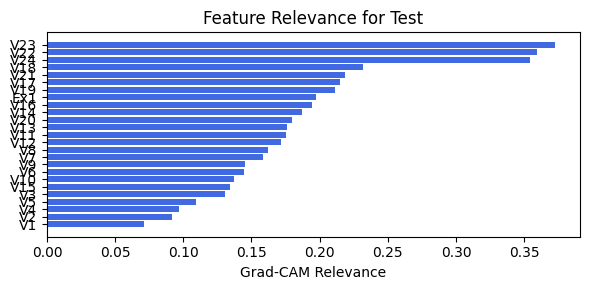

In [94]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.0.4. width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.91e-01 | val_acc_hybrid: 9.22e-01 |: 100%|█████| 40/40 [01:50<00:00,  2.76s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4044e-01 at 8 epoch
tensor(0.9368, device='cuda:0')
[[421  17   2   1]
 [ 12 402   6   0]
 [  0   9  55   2]
 [  0   5  15 145]]
M_KAN Relevance: 0.6089813709259033
CNN Relevance: 0.3910185694694519
[('V15', 0.32254398), ('V19', 0.25617468), ('V20', 0.25409645), ('V18', 0.18373963), ('V12', 0.15544997), ('V14', 0.13690343), ('V16', 0.12010805), ('V10', 0.11202141), ('V13', 0.1095089), ('V22', 0.09779328), ('V9', 0.094772816), ('V11', 0.09141554), ('V6', 0.08724289), ('V5', 0.08656408), ('V4', 0.078077644), ('V7', 0.07801934), ('V17', 0.077983886), ('V3', 0.07677199), ('V24', 0.072705686), ('V8', 0.06703465), ('V2', 0.06466239), ('V21', 0.062308356), ('V23', 0.06048715), ('V1', 0.0421158)]


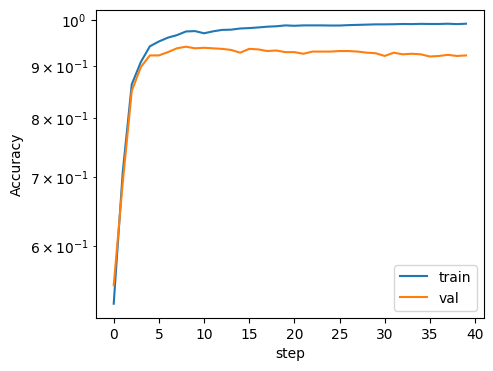

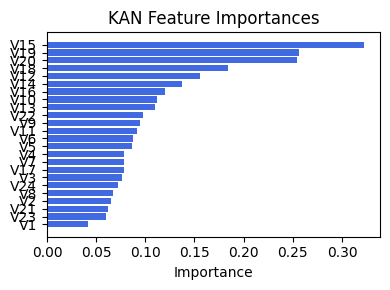

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V14', 0.38525085415379834), ('V18', 0.37087492535893146), ('V13', 0.368630198263431), ('V19', 0.3584480497087591), ('V23', 0.3274831127869703), ('V12', 0.31713934815383216), ('V17', 0.3149213409606191), ('V24', 0.30806193655338004), ('V22', 0.3017451432860314), ('V8', 0.3011479843668525), ('V9', 0.30078336975920816), ('V20', 0.24748084028840076), ('V7', 0.24735476954509855), ('V15', 0.21925954326698147), ('V3', 0.21777270085333375), ('V21', 0.211940568442488), ('V10', 0.20119555137675504), ('V16', 0.19429235419273613), ('V4', 0.19138626213685583), ('V11', 0.18558910834650344), ('Ex1', 0.18000575671879268), ('V5', 0.1716110109776246), ('V2', 0.14883980785683082), ('V6', 0.13551278128744967), ('V1', 0.08272948422118034)]


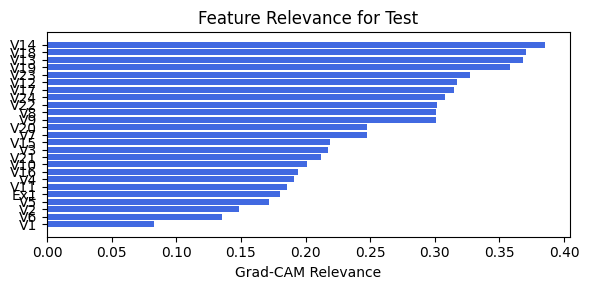

In [45]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.0.5. width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.96e-01 | val_acc_hybrid: 9.31e-01 |: 100%|█████| 40/40 [01:47<00:00,  2.70s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3585e-01 at 11 epoch
tensor(0.9277, device='cuda:0')
[[413  25   2   1]
 [ 15 397   8   0]
 [  0   4  62   0]
 [  0   4  20 141]]
M_KAN Relevance: 0.8169118762016296
CNN Relevance: 0.18308815360069275
[('V20', 0.28946307), ('V15', 0.2742166), ('V19', 0.24254811), ('V18', 0.19895057), ('V12', 0.18240254), ('V14', 0.16572179), ('V5', 0.13261113), ('V22', 0.11131506), ('V13', 0.10032028), ('V16', 0.097792946), ('V11', 0.08558037), ('V21', 0.081072845), ('V17', 0.08036016), ('V6', 0.07729518), ('V7', 0.07720784), ('V10', 0.06865414), ('V9', 0.06719428), ('V3', 0.06414701), ('V24', 0.063749015), ('V4', 0.06263187), ('V23', 0.0562489), ('V8', 0.04994766), ('V2', 0.04850971), ('V1', 0.04395452)]


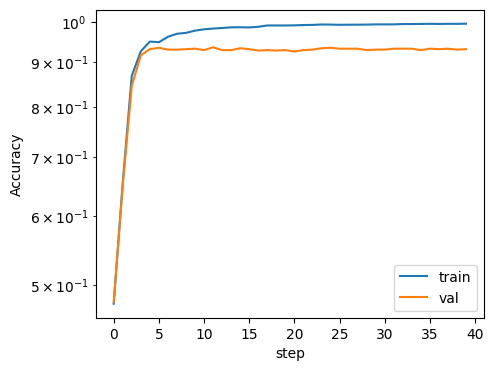

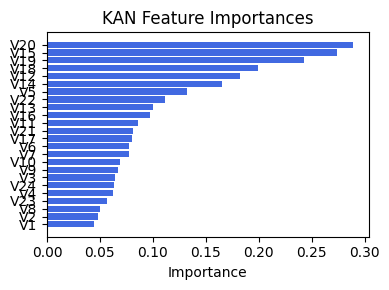

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.34687539874505674), ('V19', 0.3124241562186648), ('V20', 0.2940308819014294), ('V14', 0.2867519378524799), ('V24', 0.2815845722776137), ('V15', 0.2795003160109702), ('V18', 0.2704485575628003), ('V23', 0.26241009133985616), ('V13', 0.25822981421950003), ('V12', 0.2231023972391342), ('V22', 0.20972075604296042), ('V17', 0.20886030380326048), ('V9', 0.2083676085878437), ('V8', 0.20521467473189903), ('V7', 0.15209973809180735), ('V10', 0.14338560491972907), ('V3', 0.11004533476527566), ('V16', 0.1049958866839779), ('V4', 0.09785099105519603), ('V2', 0.096074873007954), ('V11', 0.09411043527880117), ('V21', 0.08881821666282688), ('V6', 0.08364446329620484), ('V1', 0.08112018249995101), ('V5', 0.0688674707306189)]


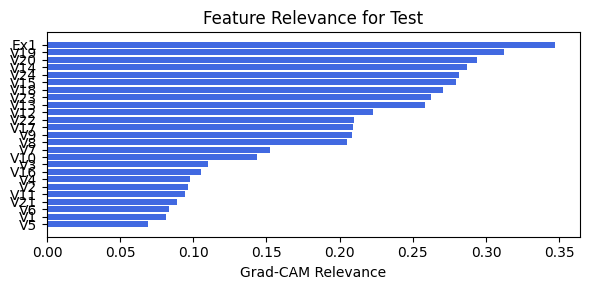

In [46]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.0.6. width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.93e-01 | val_acc_hybrid: 9.21e-01 |: 100%|█████| 40/40 [01:49<00:00,  2.73s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3929e-01 at 5 epoch
tensor(0.9148, device='cuda:0')
[[406  31   3   1]
 [ 15 394  11   0]
 [  0   8  57   1]
 [  0   2  21 142]]
M_KAN Relevance: 0.8517117500305176
CNN Relevance: 0.14828823506832123
[('V20', 0.28966868), ('V19', 0.2733637), ('V15', 0.23207912), ('V18', 0.18285275), ('V16', 0.1777679), ('V13', 0.13603668), ('V14', 0.13176477), ('V22', 0.10885812), ('V12', 0.10787055), ('V9', 0.09145194), ('V4', 0.08308661), ('V11', 0.07940838), ('V6', 0.07807428), ('V3', 0.07611217), ('V7', 0.07543744), ('V21', 0.073722), ('V10', 0.07298398), ('V24', 0.06609302), ('V17', 0.06485994), ('V1', 0.060106106), ('V2', 0.057726555), ('V5', 0.057263143), ('V23', 0.05723098), ('V8', 0.051719338)]


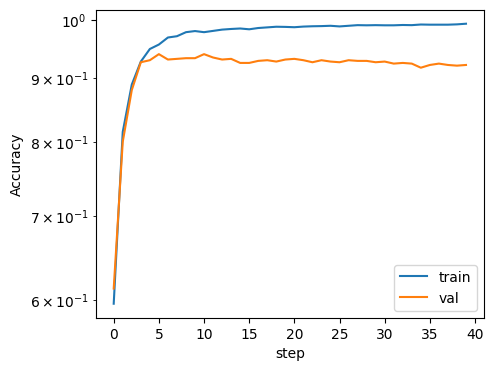

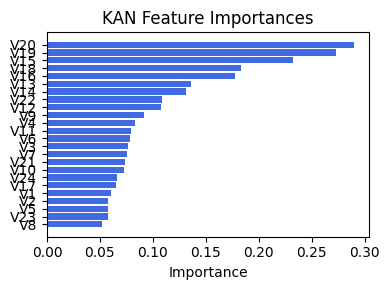

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.29229623344299366), ('V24', 0.27786536597880884), ('V10', 0.23569978737048872), ('V22', 0.22646171638655524), ('Ex1', 0.2258141092875604), ('V15', 0.2182768552286692), ('V20', 0.20572926106776585), ('V3', 0.20299716791444988), ('V5', 0.19935280260061342), ('V4', 0.18718756443753518), ('V11', 0.18646715155856183), ('V18', 0.17883968639938885), ('V14', 0.17744868392994262), ('V9', 0.17560696426253244), ('V16', 0.17557307411899498), ('V2', 0.16454220329100674), ('V8', 0.16185869152731033), ('V19', 0.15835451196522332), ('V7', 0.15738374888922527), ('V13', 0.15618329928014774), ('V17', 0.14939523484232076), ('V6', 0.14793226385931313), ('V12', 0.13673315873220152), ('V1', 0.13224916596808037), ('V21', 0.11735671960054504)]


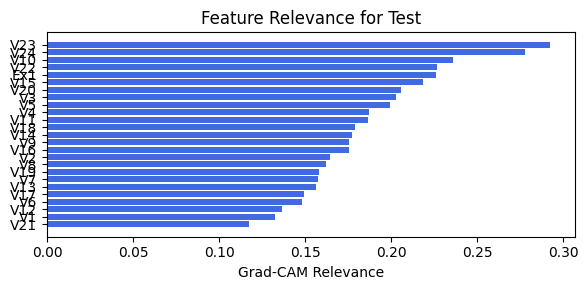

In [47]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.0.6b width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.93e-01 | val_acc_hybrid: 9.21e-01 |: 100%|█████| 40/40 [01:49<00:00,  2.73s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3929e-01 at 5 epoch
tensor(0.9148, device='cuda:0')
[[406  31   3   1]
 [ 15 394  11   0]
 [  0   8  57   1]
 [  0   2  21 142]]
M_KAN Relevance: 0.8517117500305176
CNN Relevance: 0.14828823506832123
[('V20', 0.28966868), ('V19', 0.2733637), ('V15', 0.23207912), ('V18', 0.18285275), ('V16', 0.1777679), ('V13', 0.13603668), ('V14', 0.13176477), ('V22', 0.10885812), ('V12', 0.10787055), ('V9', 0.09145194), ('V4', 0.08308661), ('V11', 0.07940838), ('V6', 0.07807428), ('V3', 0.07611217), ('V7', 0.07543744), ('V21', 0.073722), ('V10', 0.07298398), ('V24', 0.06609302), ('V17', 0.06485994), ('V1', 0.060106106), ('V2', 0.057726555), ('V5', 0.057263143), ('V23', 0.05723098), ('V8', 0.051719338)]


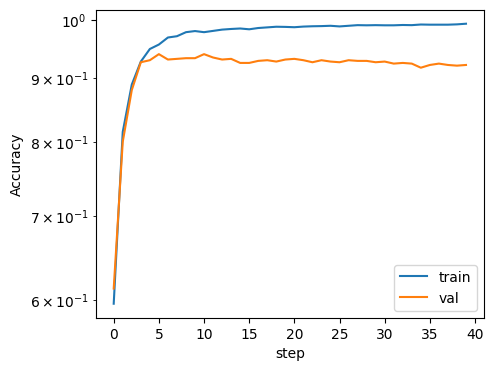

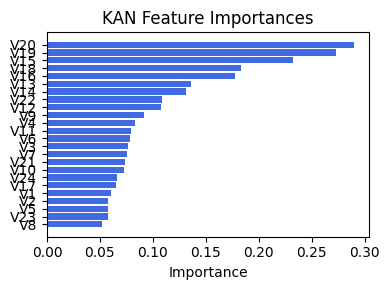

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.29229623344299366), ('V24', 0.27786536597880884), ('V10', 0.23569978737048872), ('V22', 0.22646171638655524), ('Ex1', 0.2258141092875604), ('V15', 0.2182768552286692), ('V20', 0.20572926106776585), ('V3', 0.20299716791444988), ('V5', 0.19935280260061342), ('V4', 0.18718756443753518), ('V11', 0.18646715155856183), ('V18', 0.17883968639938885), ('V14', 0.17744868392994262), ('V9', 0.17560696426253244), ('V16', 0.17557307411899498), ('V2', 0.16454220329100674), ('V8', 0.16185869152731033), ('V19', 0.15835451196522332), ('V7', 0.15738374888922527), ('V13', 0.15618329928014774), ('V17', 0.14939523484232076), ('V6', 0.14793226385931313), ('V12', 0.13673315873220152), ('V1', 0.13224916596808037), ('V21', 0.11735671960054504)]


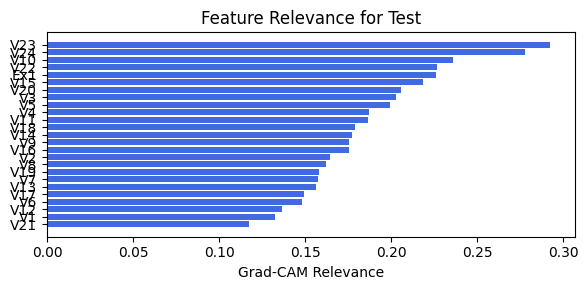

In [48]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.0.7. width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.92e-01 | val_acc_hybrid: 9.05e-01 |: 100%|█████| 40/40 [01:47<00:00,  2.70s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 4 epoch
tensor(0.9112, device='cuda:0')
[[416  23   2   0]
 [ 24 388   8   0]
 [  0   6  59   1]
 [  0   5  28 132]]
M_KAN Relevance: 0.7802456617355347
CNN Relevance: 0.21975427865982056
[('V15', 0.31295294), ('V19', 0.24715869), ('V20', 0.22937328), ('V22', 0.17002165), ('V12', 0.15962146), ('V18', 0.12412736), ('V4', 0.11971905), ('V9', 0.11823258), ('V14', 0.116255805), ('V16', 0.11161264), ('V7', 0.10158317), ('V13', 0.09138455), ('V17', 0.0885699), ('V3', 0.08759628), ('V24', 0.0821335), ('V5', 0.07938519), ('V10', 0.07657981), ('V23', 0.06977706), ('V11', 0.06961933), ('V1', 0.06628916), ('V6', 0.06599358), ('V8', 0.047098212), ('V21', 0.040408365), ('V2', 0.030527165)]


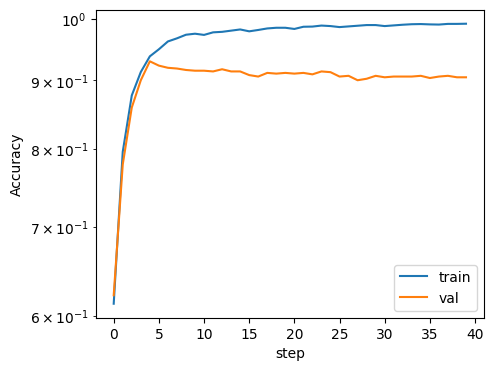

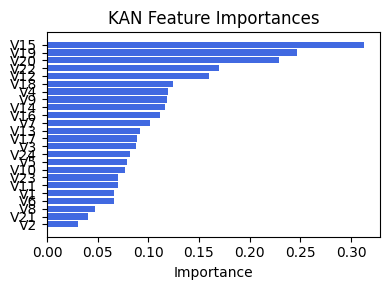

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.29797966126635056), ('V24', 0.27879490514308036), ('V22', 0.24219158830552068), ('V18', 0.2401233772316951), ('V16', 0.22553573805311278), ('V17', 0.1968175278688293), ('V19', 0.19190246726840343), ('V13', 0.18452562337921208), ('V11', 0.18159521936593012), ('Ex1', 0.17305753714233618), ('V20', 0.16168586482486358), ('V12', 0.16060768292076844), ('V8', 0.1562950961942522), ('V21', 0.1527031037227601), ('V15', 0.1496304833053994), ('V14', 0.1436098474832661), ('V7', 0.13330939634747982), ('V6', 0.12631634263810393), ('V9', 0.12272784915212269), ('V10', 0.10642234075040728), ('V3', 0.10210209403168594), ('V2', 0.08668350078124727), ('V4', 0.08521735388233907), ('V1', 0.07093969945986868), ('V5', 0.06470571911420635)]


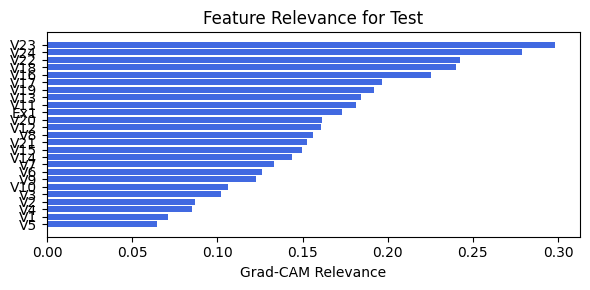

In [49]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.05, filename=filename_2, opt_col_val=0.05)

### 2.0.8. width=[24, 12, 1], grid=8, lamb=0.001 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 9.07e-01 |: 100%|█████| 40/40 [01:51<00:00,  2.79s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 13 epoch
tensor(0.9084, device='cuda:0')
[[409  28   3   1]
 [ 20 385  15   0]
 [  0   7  58   1]
 [  0   4  21 140]]
M_KAN Relevance: 0.9437035322189331
CNN Relevance: 0.05629647895693779
[('V19', 0.30740833), ('V15', 0.28115362), ('V20', 0.22546194), ('V14', 0.17329493), ('V22', 0.15800333), ('V18', 0.1524128), ('V4', 0.12908679), ('V12', 0.122189306), ('V6', 0.12012913), ('V9', 0.114981376), ('V16', 0.10384595), ('V5', 0.10160001), ('V7', 0.097580455), ('V13', 0.09579274), ('V11', 0.08792749), ('V10', 0.08659959), ('V23', 0.08133283), ('V24', 0.07833755), ('V17', 0.07771869), ('V3', 0.07680851), ('V8', 0.070443794), ('V2', 0.05999618), ('V1', 0.05186492), ('V21', 0.043349218)]


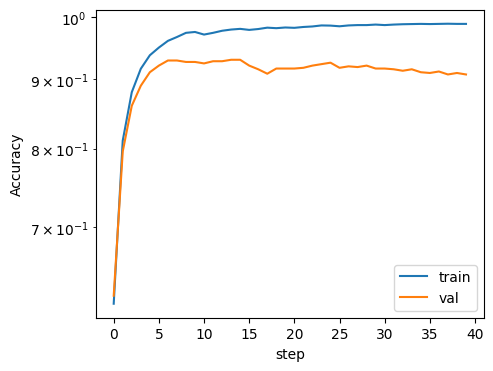

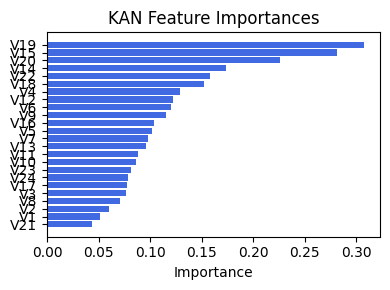

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V8', 0.32335571546673403), ('V23', 0.31523646609347394), ('V24', 0.310133935563106), ('V7', 0.28452650107623073), ('V13', 0.27862286103199385), ('V9', 0.2762048876180822), ('V22', 0.27422349438526306), ('V3', 0.26594419481024667), ('V12', 0.26518877913971556), ('V16', 0.2617937876538978), ('V17', 0.2523421483877564), ('V2', 0.2515142261826717), ('V11', 0.24839886296453081), ('V18', 0.2479363768945318), ('V14', 0.24312268597996647), ('V6', 0.23854409835652132), ('V4', 0.23165309894171687), ('V19', 0.21758389279181087), ('V20', 0.20638362830479456), ('V15', 0.19368314382538282), ('V10', 0.1875419249045347), ('Ex1', 0.17219151142090086), ('V1', 0.1664299159363129), ('V21', 0.1571429743760499), ('V5', 0.1402991534963963)]


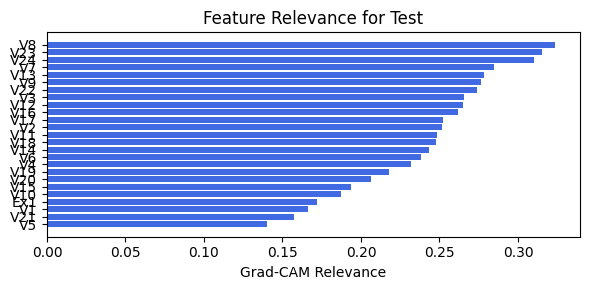

In [50]:
train_and_plot_relevance(Model3_2, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.05, filename=filename_2, opt_col_val=0.05)

## 2.1 width=[24, 5, 1], grid=7, lamb=1e-07

### 2.1.0 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.70e-01 | val_acc_hybrid: 8.97e-01 |: 100%|█████| 40/40 [01:47<00:00,  2.69s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.0607e-01 at 28 epoch
tensor(0.9057, device='cuda:0')
[[410  27   3   1]
 [ 16 398   5   1]
 [  1   8  54   3]
 [  2   4  32 127]]
M_KAN Relevance: 0.18685291707515717
CNN Relevance: 0.8131471276283264
[('V15', 0.38728043), ('V20', 0.2893969), ('V11', 0.21766467), ('V2', 0.19146937), ('V24', 0.18248712), ('V8', 0.17518124), ('V14', 0.17014314), ('V19', 0.1643704), ('V7', 0.15568939), ('V12', 0.1536962), ('V5', 0.14917722), ('V22', 0.14713143), ('V18', 0.11946636), ('V4', 0.117987394), ('V9', 0.11258393), ('V13', 0.11104702), ('V6', 0.10437455), ('V16', 0.10022006), ('V3', 0.084946476), ('V17', 0.081666045), ('V1', 0.06938871), ('V23', 0.061056066), ('V10', 0.05746434), ('V21', 0.05462725)]


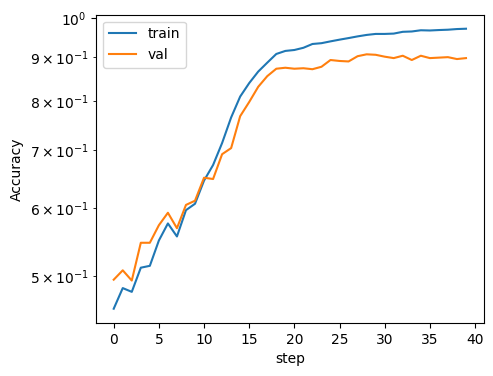

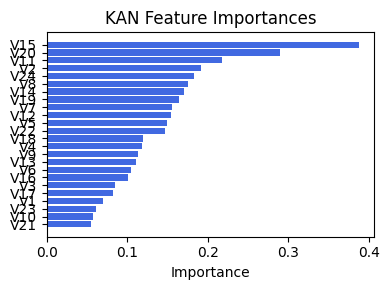

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V8', 0.16440200818627526), ('V14', 0.16112467798130628), ('V24', 0.15842187602853108), ('V18', 0.15561678208263197), ('V19', 0.15160765745491556), ('V9', 0.14797705705719777), ('V13', 0.14578611448041723), ('V20', 0.1454798768692867), ('V17', 0.12629510002976604), ('V15', 0.123875836534093), ('V7', 0.12134044274351741), ('V12', 0.12124744639497408), ('Ex1', 0.10520255129299735), ('V10', 0.09514788648673511), ('V3', 0.08855060506535305), ('V4', 0.07231325541709209), ('V2', 0.06861088123164685), ('V23', 0.06205368111338993), ('V16', 0.05810439047384337), ('V11', 0.055835847411026575), ('V22', 0.05211221698840872), ('V6', 0.04942969858311432), ('V5', 0.047658255148438404), ('V21', 0.03427628575659066), ('V1', 0.02713158318222138)]


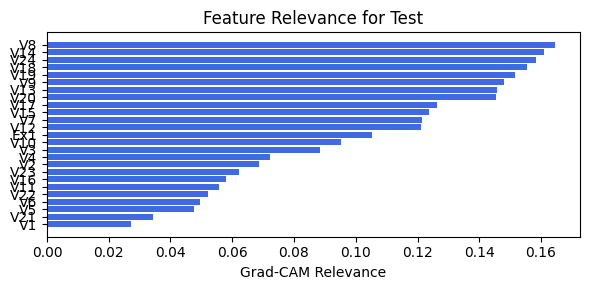

In [51]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.1.1 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.68e-01 | val_acc_hybrid: 9.20e-01 |: 100%|█████| 40/40 [01:48<00:00,  2.72s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.2211e-01 at 26 epoch
tensor(0.9075, device='cuda:0')
[[402  34   4   1]
 [ 17 397   5   1]
 [  0   8  55   3]
 [  0   5  23 137]]
M_KAN Relevance: 0.19598516821861267
CNN Relevance: 0.8040148615837097
[('V15', 0.4232152), ('V14', 0.2578263), ('V20', 0.24879523), ('V19', 0.22741655), ('V11', 0.18313737), ('V5', 0.16789117), ('V7', 0.16748299), ('V24', 0.15658116), ('V2', 0.1526575), ('V12', 0.15174368), ('V8', 0.15165547), ('V4', 0.15155146), ('V22', 0.14331393), ('V18', 0.14206883), ('V13', 0.1294748), ('V9', 0.124143176), ('V16', 0.12212973), ('V3', 0.10188805), ('V17', 0.08715631), ('V6', 0.08476053), ('V10', 0.07829111), ('V1', 0.07551243), ('V23', 0.06424424), ('V21', 0.057052016)]


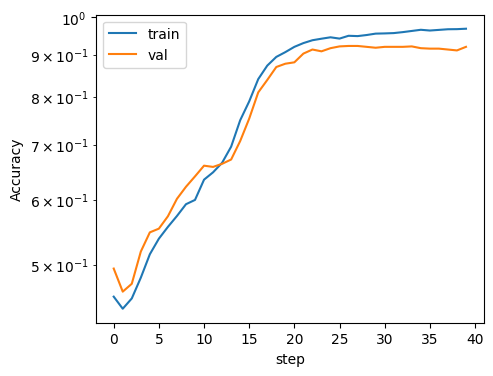

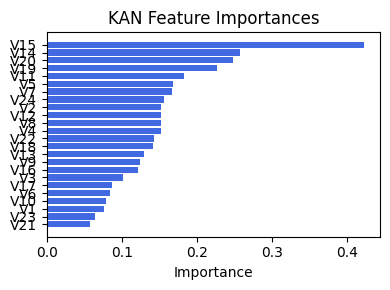

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V24', 0.2997664733236142), ('V23', 0.2232810602994165), ('V18', 0.19502018777573193), ('V17', 0.18970576440723572), ('V22', 0.18271946668498654), ('V19', 0.17823404368055012), ('Ex1', 0.1762194742430558), ('V16', 0.16707854687991883), ('V14', 0.1388246017767691), ('V15', 0.12877338220307352), ('V8', 0.12631757085083858), ('V13', 0.12394649680830101), ('V9', 0.1227989945326797), ('V7', 0.12019608514134773), ('V20', 0.11869297732146185), ('V12', 0.11819659093628986), ('V6', 0.11231836546820363), ('V11', 0.11087194707472721), ('V3', 0.10451691433780523), ('V21', 0.10227385995535486), ('V4', 0.09864682789240374), ('V10', 0.09727252901989848), ('V2', 0.09471991256903046), ('V5', 0.07147044142852509), ('V1', 0.06756152976139584)]


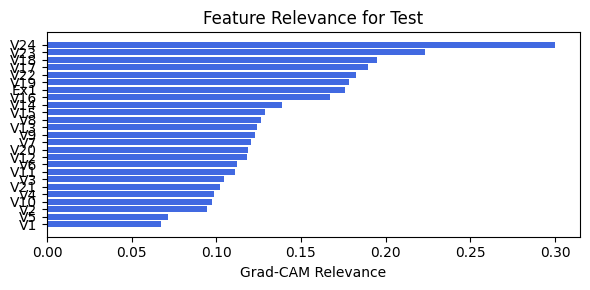

In [52]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.1.2 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.75e-01 | val_acc_hybrid: 8.64e-01 |: 100%|█████| 40/40 [01:41<00:00,  2.54s/it]


saving model version 0.1
✅ Best validation Accuracy: 8.8316e-01 at 23 epoch
tensor(0.8791, device='cuda:0')
[[398  40   3   0]
 [ 31 379   9   1]
 [  0  10  55   1]
 [  0   3  34 128]]
M_KAN Relevance: 0.1161397248506546
CNN Relevance: 0.8838602304458618
[('V15', 0.26769808), ('V5', 0.24789508), ('V19', 0.22162841), ('V20', 0.2126474), ('V14', 0.21009791), ('V4', 0.18909161), ('V2', 0.18292592), ('V24', 0.17560527), ('V18', 0.16587697), ('V3', 0.15153895), ('V8', 0.14997466), ('V9', 0.1483121), ('V7', 0.14456199), ('V16', 0.13526717), ('V10', 0.13424665), ('V13', 0.12748443), ('V17', 0.12546708), ('V11', 0.120407306), ('V22', 0.11587645), ('V6', 0.10508788), ('V12', 0.09560987), ('V23', 0.072910786), ('V1', 0.069003776), ('V21', 0.060392674)]


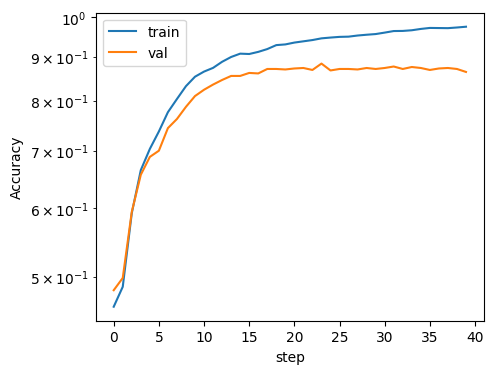

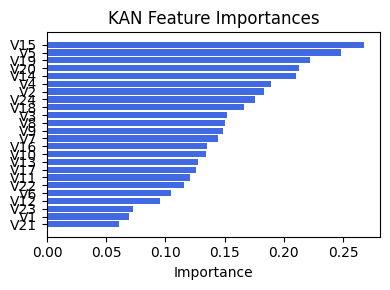

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V15', 0.32301389049732676), ('V20', 0.3144276530459141), ('V10', 0.29596951169596086), ('V16', 0.21195170931746643), ('V22', 0.20724156339593175), ('V23', 0.20477563852659425), ('V11', 0.19170109232179325), ('V21', 0.1914968198158528), ('V24', 0.1891970411082154), ('V14', 0.18231677499007232), ('Ex1', 0.1791417083259681), ('V9', 0.16421929288496886), ('V5', 0.15926208903647587), ('V19', 0.1350126841961965), ('V6', 0.12809173697501253), ('V3', 0.11737674569714074), ('V7', 0.11694177594688301), ('V8', 0.11610777281993793), ('V12', 0.11089513271923059), ('V4', 0.11042067355407238), ('V17', 0.0996511392513073), ('V1', 0.09505195169165764), ('V2', 0.08414511269312067), ('V18', 0.07529923167655794), ('V13', 0.0676430142120008)]


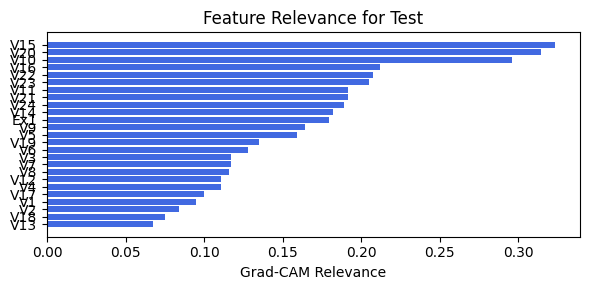

In [53]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.1.3 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.75e-01 | val_acc_hybrid: 8.64e-01 |: 100%|█████| 40/40 [01:40<00:00,  2.52s/it]


saving model version 0.1
✅ Best validation Accuracy: 8.8316e-01 at 23 epoch
tensor(0.8791, device='cuda:0')
[[398  40   3   0]
 [ 31 379   9   1]
 [  0  10  55   1]
 [  0   3  34 128]]
M_KAN Relevance: 0.1161397248506546
CNN Relevance: 0.8838602304458618
[('V15', 0.26769808), ('V5', 0.24789508), ('V19', 0.22162841), ('V20', 0.2126474), ('V14', 0.21009791), ('V4', 0.18909161), ('V2', 0.18292592), ('V24', 0.17560527), ('V18', 0.16587697), ('V3', 0.15153895), ('V8', 0.14997466), ('V9', 0.1483121), ('V7', 0.14456199), ('V16', 0.13526717), ('V10', 0.13424665), ('V13', 0.12748443), ('V17', 0.12546708), ('V11', 0.120407306), ('V22', 0.11587645), ('V6', 0.10508788), ('V12', 0.09560987), ('V23', 0.072910786), ('V1', 0.069003776), ('V21', 0.060392674)]


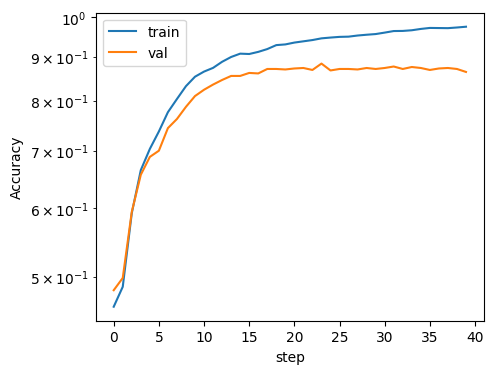

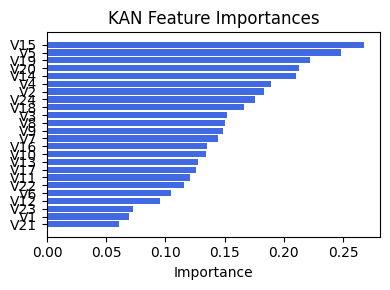

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V15', 0.32301389049732676), ('V20', 0.3144276530459141), ('V10', 0.29596951169596086), ('V16', 0.21195170931746643), ('V22', 0.20724156339593175), ('V23', 0.20477563852659425), ('V11', 0.19170109232179325), ('V21', 0.1914968198158528), ('V24', 0.1891970411082154), ('V14', 0.18231677499007232), ('Ex1', 0.1791417083259681), ('V9', 0.16421929288496886), ('V5', 0.15926208903647587), ('V19', 0.1350126841961965), ('V6', 0.12809173697501253), ('V3', 0.11737674569714074), ('V7', 0.11694177594688301), ('V8', 0.11610777281993793), ('V12', 0.11089513271923059), ('V4', 0.11042067355407238), ('V17', 0.0996511392513073), ('V1', 0.09505195169165764), ('V2', 0.08414511269312067), ('V18', 0.07529923167655794), ('V13', 0.0676430142120008)]


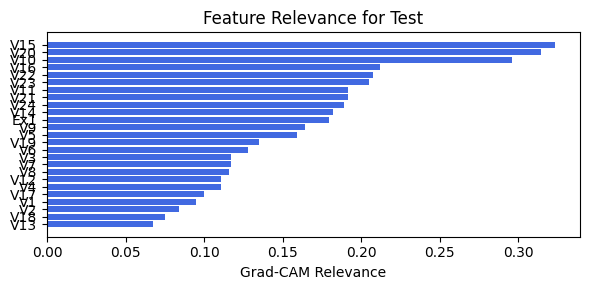

In [54]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.1.4 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.91e-01 | val_acc_hybrid: 8.64e-01 |: 100%|█████| 40/40 [01:40<00:00,  2.52s/it]


saving model version 0.1
✅ Best validation Accuracy: 8.9233e-01 at 13 epoch
tensor(0.8709, device='cuda:0')
[[399  38   3   1]
 [ 34 370  15   1]
 [  1   9  50   6]
 [  1   4  28 132]]
M_KAN Relevance: 0.1676098257303238
CNN Relevance: 0.8323901891708374
[('V15', 0.514352), ('V20', 0.29831812), ('V13', 0.21966389), ('V19', 0.18439487), ('V11', 0.17202511), ('V14', 0.14010917), ('V17', 0.13062264), ('V23', 0.12534738), ('V7', 0.12473457), ('V24', 0.12252277), ('V18', 0.11191652), ('V4', 0.11173928), ('V22', 0.110616185), ('V3', 0.1101192), ('V12', 0.105456285), ('V10', 0.09777649), ('V6', 0.09316926), ('V9', 0.09007753), ('V2', 0.08375142), ('V8', 0.0794852), ('V1', 0.07730495), ('V21', 0.06987437), ('V16', 0.068637304), ('V5', 0.060621053)]


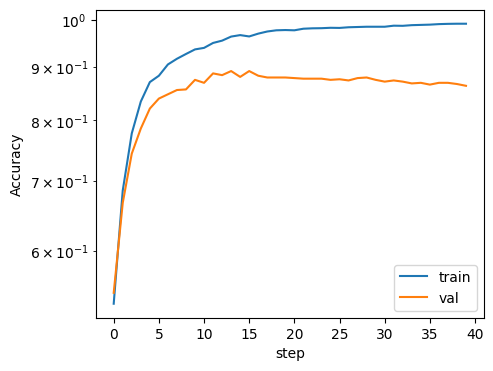

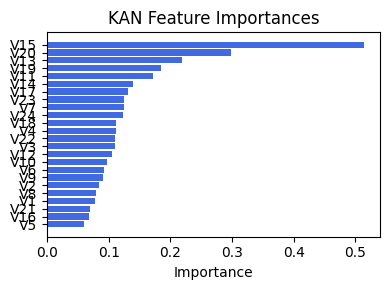

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.3723887221111819), ('V18', 0.32841872136857386), ('V13', 0.29424984505037705), ('V8', 0.2924108119355152), ('V17', 0.28456047553998814), ('V14', 0.27655819164482015), ('V20', 0.25701738830266485), ('V9', 0.25375595295824893), ('V12', 0.23311755991480723), ('V7', 0.2090867414391764), ('V23', 0.2011210168225711), ('V15', 0.1935791532723803), ('V24', 0.18977954971318128), ('V3', 0.18540180136250334), ('Ex1', 0.18177091938845072), ('V22', 0.18017207787842307), ('V2', 0.17211052064936372), ('V4', 0.15684514025634355), ('V16', 0.14570084351107454), ('V10', 0.14414083605419825), ('V21', 0.12291165718159477), ('V11', 0.11980981479342724), ('V6', 0.1075988919481647), ('V1', 0.08187733503689162), ('V5', 0.057608225802746195)]


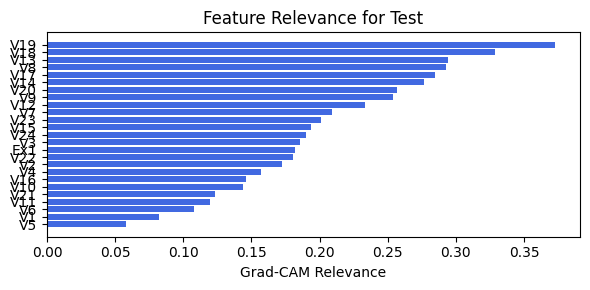

In [55]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.1.5 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 8.56e-01 |: 100%|█████| 40/40 [01:43<00:00,  2.59s/it]


saving model version 0.1
✅ Best validation Accuracy: 8.9805e-01 at 15 epoch
tensor(0.8645, device='cuda:0')
[[395  44   1   1]
 [ 36 362  22   0]
 [  0  11  53   2]
 [  1   3  27 134]]
M_KAN Relevance: 0.17902697622776031
CNN Relevance: 0.8209730386734009
[('V15', 0.49672315), ('V20', 0.2740705), ('V13', 0.23036683), ('V19', 0.16482554), ('V22', 0.14085041), ('V17', 0.13032666), ('V11', 0.12544842), ('V3', 0.1218819), ('V7', 0.12161677), ('V24', 0.11784666), ('V23', 0.11713558), ('V18', 0.11302268), ('V14', 0.11266642), ('V4', 0.11260992), ('V12', 0.109245755), ('V9', 0.10486285), ('V10', 0.10254953), ('V5', 0.09980007), ('V16', 0.09051173), ('V21', 0.090342775), ('V6', 0.0885213), ('V8', 0.0881679), ('V2', 0.08154019), ('V1', 0.0806224)]


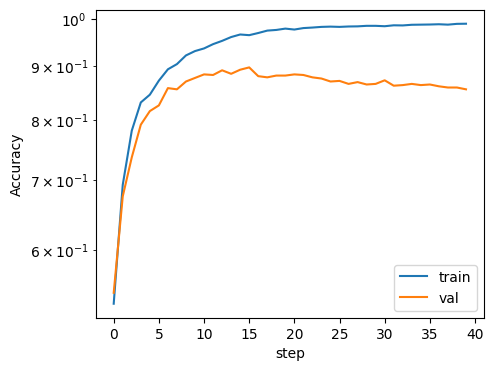

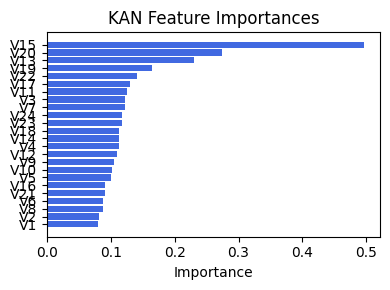

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V17', 0.3090944965721804), ('V18', 0.2980115627433939), ('V19', 0.29200958477744504), ('V12', 0.25475943814831975), ('V13', 0.25315190167072743), ('V23', 0.24090169188104896), ('V14', 0.23567083290270222), ('V7', 0.2330049616578905), ('V22', 0.22887660115250186), ('V8', 0.22506147068620838), ('V24', 0.22474619933645387), ('V16', 0.2227669056900505), ('V11', 0.21432244840886994), ('V9', 0.20829568028146395), ('V20', 0.2066557164201722), ('V6', 0.2044361135094832), ('V15', 0.19077896911005734), ('Ex1', 0.17413935557082894), ('V3', 0.1646902865489613), ('V2', 0.1536698571297552), ('V21', 0.1532540191491711), ('V10', 0.14771105873668414), ('V4', 0.1398826055979693), ('V1', 0.11616753334082482), ('V5', 0.09770332973123617)]


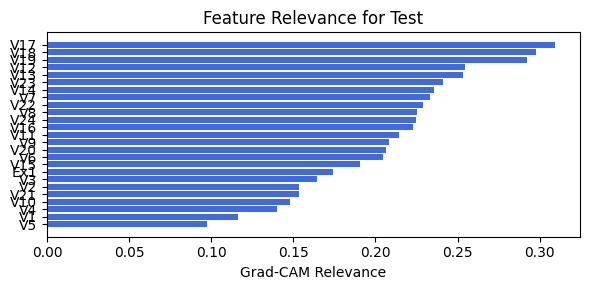

In [56]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.1.6 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 9.06e-01 |: 100%|█████| 40/40 [01:43<00:00,  2.58s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.2669e-01 at 8 epoch
tensor(0.9121, device='cuda:0')
[[403  32   5   1]
 [ 13 399   8   0]
 [  0   7  56   3]
 [  1   3  23 138]]
M_KAN Relevance: 0.2619480788707733
CNN Relevance: 0.7380518913269043
[('V15', 0.3767357), ('V20', 0.32789603), ('V13', 0.22071777), ('V19', 0.20194378), ('V7', 0.13480695), ('V16', 0.13365918), ('V18', 0.1275951), ('V4', 0.12300175), ('V11', 0.12066126), ('V5', 0.11731523), ('V17', 0.10762652), ('V12', 0.105024636), ('V6', 0.0955219), ('V9', 0.09251878), ('V24', 0.08242444), ('V14', 0.07732406), ('V23', 0.074647546), ('V22', 0.07056888), ('V8', 0.06552547), ('V10', 0.06490179), ('V2', 0.06325322), ('V3', 0.06129529), ('V1', 0.050752897), ('V21', 0.03282738)]


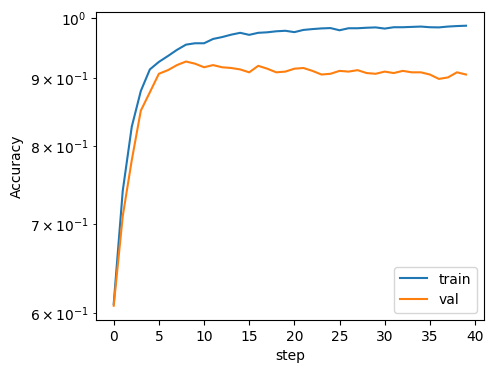

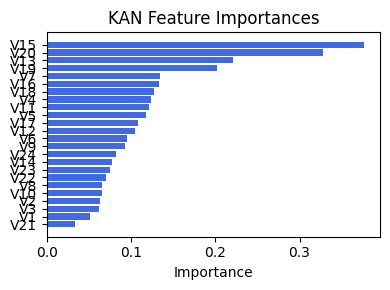

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V3', 0.25325280535398365), ('V2', 0.2483765830116288), ('V13', 0.23708871039931323), ('V8', 0.22719023775894812), ('V11', 0.22578423271723683), ('V9', 0.22398147142349034), ('V4', 0.22296336762493135), ('V12', 0.22164772306396216), ('V1', 0.2210766566414273), ('V7', 0.2136910452150088), ('V5', 0.21195097227389406), ('V6', 0.2074464240557616), ('V24', 0.20653016809458447), ('V16', 0.20313183988424838), ('Ex1', 0.2027236667241569), ('V20', 0.20094775473776796), ('V10', 0.199752664125109), ('V19', 0.19489615838840388), ('V15', 0.1942237423470196), ('V22', 0.19249786879842157), ('V17', 0.18590019938044314), ('V14', 0.18279845643138912), ('V23', 0.1739920263631515), ('V21', 0.17121857913250327), ('V18', 0.16707100151688792)]


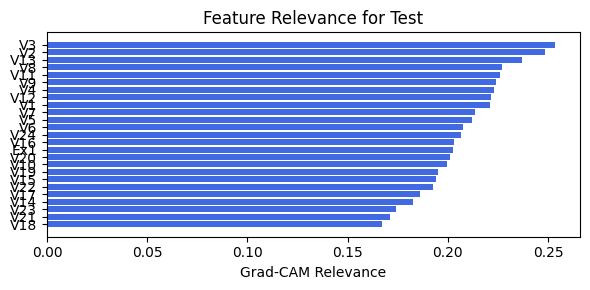

In [57]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.1.7 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 9.06e-01 |: 100%|█████| 40/40 [01:42<00:00,  2.55s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.2669e-01 at 8 epoch
tensor(0.9121, device='cuda:0')
[[403  32   5   1]
 [ 13 399   8   0]
 [  0   7  56   3]
 [  1   3  23 138]]
M_KAN Relevance: 0.2619480788707733
CNN Relevance: 0.7380518913269043
[('V15', 0.3767357), ('V20', 0.32789603), ('V13', 0.22071777), ('V19', 0.20194378), ('V7', 0.13480695), ('V16', 0.13365918), ('V18', 0.1275951), ('V4', 0.12300175), ('V11', 0.12066126), ('V5', 0.11731523), ('V17', 0.10762652), ('V12', 0.105024636), ('V6', 0.0955219), ('V9', 0.09251878), ('V24', 0.08242444), ('V14', 0.07732406), ('V23', 0.074647546), ('V22', 0.07056888), ('V8', 0.06552547), ('V10', 0.06490179), ('V2', 0.06325322), ('V3', 0.06129529), ('V1', 0.050752897), ('V21', 0.03282738)]


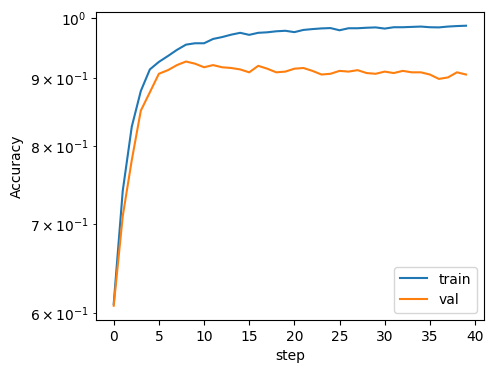

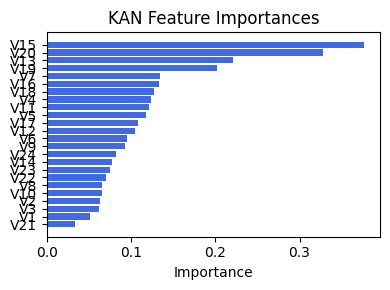

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V3', 0.25325280535398365), ('V2', 0.2483765830116288), ('V13', 0.23708871039931323), ('V8', 0.22719023775894812), ('V11', 0.22578423271723683), ('V9', 0.22398147142349034), ('V4', 0.22296336762493135), ('V12', 0.22164772306396216), ('V1', 0.2210766566414273), ('V7', 0.2136910452150088), ('V5', 0.21195097227389406), ('V6', 0.2074464240557616), ('V24', 0.20653016809458447), ('V16', 0.20313183988424838), ('Ex1', 0.2027236667241569), ('V20', 0.20094775473776796), ('V10', 0.199752664125109), ('V19', 0.19489615838840388), ('V15', 0.1942237423470196), ('V22', 0.19249786879842157), ('V17', 0.18590019938044314), ('V14', 0.18279845643138912), ('V23', 0.1739920263631515), ('V21', 0.17121857913250327), ('V18', 0.16707100151688792)]


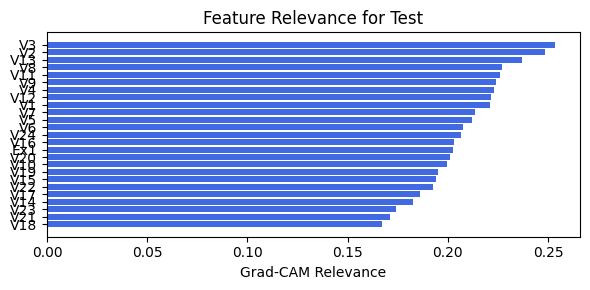

In [58]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.1.8 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.92e-01 | val_acc_hybrid: 8.67e-01 |: 100%|█████| 40/40 [01:40<00:00,  2.50s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.1638e-01 at 7 epoch
tensor(0.9121, device='cuda:0')
[[409  27   4   1]
 [ 16 389  14   1]
 [  0   8  58   0]
 [  0   3  22 140]]
M_KAN Relevance: 0.26141661405563354
CNN Relevance: 0.7385833859443665
[('V20', 0.32271096), ('V15', 0.31121245), ('V19', 0.25649866), ('V9', 0.24452703), ('V22', 0.1461903), ('V14', 0.13300978), ('V13', 0.122781575), ('V18', 0.11283048), ('V7', 0.10632868), ('V12', 0.10195728), ('V6', 0.09362586), ('V2', 0.07533416), ('V24', 0.07350402), ('V16', 0.07119285), ('V4', 0.06801473), ('V17', 0.06564198), ('V5', 0.06420176), ('V11', 0.060930956), ('V10', 0.060916662), ('V3', 0.058204006), ('V1', 0.05341844), ('V23', 0.050145146), ('V8', 0.04354081), ('V21', 0.033388566)]


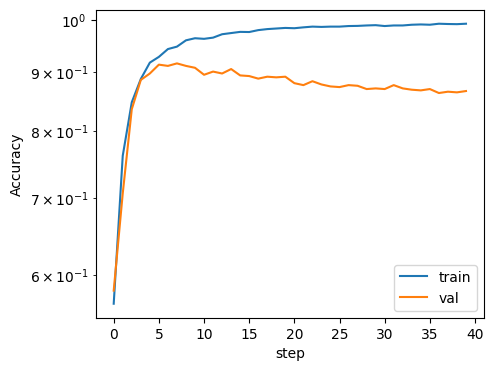

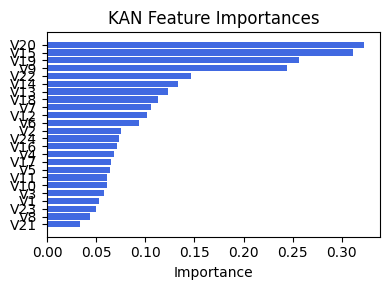

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V5', 0.2505605884173317), ('V16', 0.24839473564719103), ('V11', 0.23683458467090304), ('V21', 0.2323895780514199), ('V22', 0.22099874110525367), ('V17', 0.20938936158988689), ('V6', 0.20523541704994883), ('V10', 0.20288555391879937), ('V1', 0.189321061737356), ('V12', 0.18533034131001047), ('V18', 0.17616189792394066), ('V13', 0.17327054877762918), ('V14', 0.1608393780116142), ('V7', 0.16077200688303178), ('V3', 0.15609326616974142), ('V8', 0.14296879613954974), ('V19', 0.14207168203332307), ('V9', 0.13786602780773646), ('V20', 0.13344074750006552), ('V23', 0.13137445763932992), ('V2', 0.1285921066826518), ('V4', 0.12484203543788759), ('V15', 0.11482926697475365), ('V24', 0.11032353938526451), ('Ex1', 0.06872271345661993)]


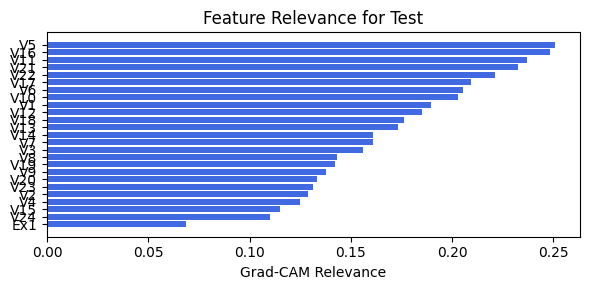

In [59]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.05, filename=filename_2, opt_col_val=0.05)

### 2.1.9 width=[24, 5, 1], grid=7, lamb=1e-07 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.94e-01 | val_acc_hybrid: 8.85e-01 |: 100%|█████| 40/40 [01:39<00:00,  2.49s/it]

saving model version 0.1
✅ Best validation Accuracy: 9.2325e-01 at 6 epoch
tensor(0.9066, device='cuda:0')
[[409  29   2   1]
 [ 20 389  11   0]
 [  0   9  56   1]
 [  0   3  26 136]]
M_KAN Relevance: 0.28970426321029663
CNN Relevance: 0.7102957367897034
[('V15', 0.3222835), ('V20', 0.2984988), ('V19', 0.29428363), ('V7', 0.18985413), ('V14', 0.13125007), ('V22', 0.12965474), ('V18', 0.12809925), ('V2', 0.123300016), ('V9', 0.12222328), ('V24', 0.11655753), ('V12', 0.11291939), ('V13', 0.095533624), ('V5', 0.0892475), ('V17', 0.08867794), ('V3', 0.08567965), ('V23', 0.075958185), ('V16', 0.06879641), ('V4', 0.06844265), ('V11', 0.06492021), ('V1', 0.0633608), ('V10', 0.05412906), ('V6', 0.051849302), ('V21', 0.038983576), ('V8', 0.03816406)]


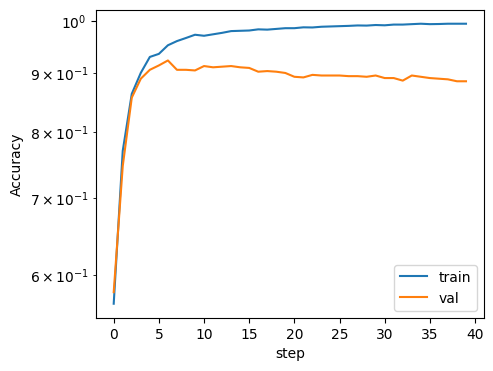

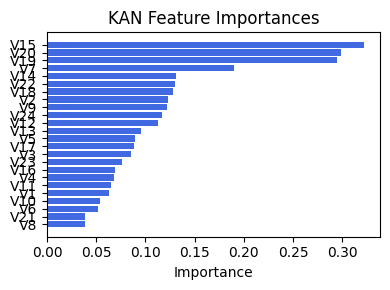

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V11', 0.26833823044783195), ('V16', 0.2680237272681732), ('V17', 0.24208536648096418), ('V22', 0.2419470384972419), ('V23', 0.2406915151617389), ('V12', 0.2248439034977979), ('V24', 0.22339663852938266), ('V18', 0.21274414822852497), ('V13', 0.21039429756589823), ('V19', 0.20665114282725477), ('V6', 0.20581008021707933), ('V14', 0.2041940332918661), ('V7', 0.19334007250767665), ('V21', 0.1868844721414998), ('V20', 0.1819807551507368), ('V9', 0.17630928376051613), ('V15', 0.17243313592370457), ('V8', 0.1716915346238478), ('Ex1', 0.17151805980923338), ('V2', 0.15415388177609116), ('V10', 0.15264396168406277), ('V1', 0.15058938657398066), ('V3', 0.14252972612586826), ('V4', 0.14040564796370425), ('V5', 0.13363410995342023)]


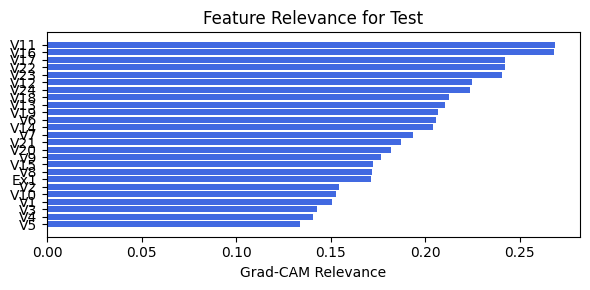

In [60]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-07, steps=40, alpha=.05, filename=filename_2, opt_col_val=0.05)

## 2.2 width=[24, 7, 1], grid=8, lamb=0.001

### 2.2.0. width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.88e-01 | val_acc_hybrid: 9.12e-01 |: 100%|█████| 40/40 [01:49<00:00,  2.74s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.1638e-01 at 27 epoch
tensor(0.9075, device='cuda:0')
[[413  23   3   2]
 [ 16 391  12   1]
 [  1  10  55   0]
 [  0   8  25 132]]
M_KAN Relevance: 0.5522502660751343
CNN Relevance: 0.4477497935295105
[('V15', 0.41051048), ('V19', 0.327552), ('V20', 0.31504923), ('V18', 0.2086905), ('V12', 0.16313536), ('V17', 0.15253924), ('V14', 0.1400729), ('V16', 0.13634822), ('V24', 0.1322875), ('V9', 0.10713354), ('V23', 0.10410751), ('V13', 0.103068046), ('V22', 0.09044591), ('V5', 0.08718833), ('V7', 0.08142784), ('V4', 0.08079326), ('V11', 0.07634075), ('V8', 0.075261705), ('V10', 0.074153595), ('V6', 0.073293775), ('V3', 0.06987777), ('V21', 0.069417745), ('V2', 0.06364579), ('V1', 0.06329804)]


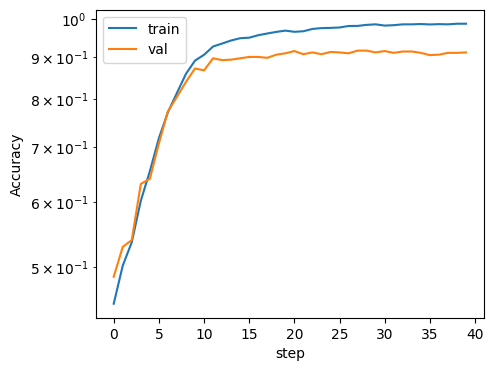

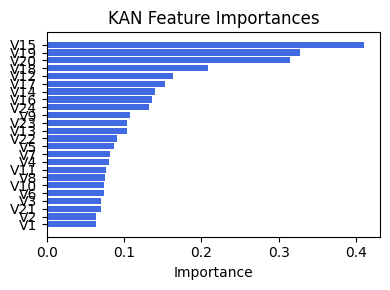

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.34766469264894234), ('V3', 0.3277794245770745), ('V18', 0.3210805606358018), ('V17', 0.3111991188360972), ('V8', 0.30812452843258387), ('V2', 0.30613041542000957), ('V4', 0.30094485084051625), ('V19', 0.30065069834211), ('V14', 0.2936225755138999), ('V12', 0.29175458337277754), ('V9', 0.2889129802913372), ('V7', 0.28685512715795386), ('V1', 0.2690260389017467), ('V6', 0.2539096513412185), ('V5', 0.24929268680208913), ('V11', 0.21464157337541376), ('V15', 0.20883254555936107), ('V20', 0.20600099280067624), ('V16', 0.2044260325456113), ('V10', 0.1946102297816108), ('V23', 0.1944380642244108), ('V21', 0.1873188120294839), ('V24', 0.18373614937687913), ('V22', 0.17903969214139678), ('Ex1', 0.1531406269624003)]


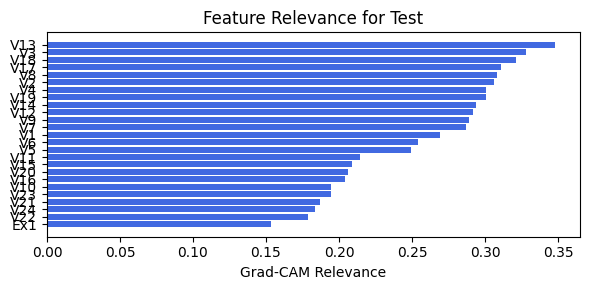

In [61]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.2.1 width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.88e-01 | val_acc_hybrid: 9.12e-01 |: 100%|█████| 40/40 [01:49<00:00,  2.73s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.1638e-01 at 27 epoch
tensor(0.9075, device='cuda:0')
[[413  23   3   2]
 [ 16 391  12   1]
 [  1  10  55   0]
 [  0   8  25 132]]
M_KAN Relevance: 0.5522502660751343
CNN Relevance: 0.4477497935295105
[('V15', 0.41051048), ('V19', 0.327552), ('V20', 0.31504923), ('V18', 0.2086905), ('V12', 0.16313536), ('V17', 0.15253924), ('V14', 0.1400729), ('V16', 0.13634822), ('V24', 0.1322875), ('V9', 0.10713354), ('V23', 0.10410751), ('V13', 0.103068046), ('V22', 0.09044591), ('V5', 0.08718833), ('V7', 0.08142784), ('V4', 0.08079326), ('V11', 0.07634075), ('V8', 0.075261705), ('V10', 0.074153595), ('V6', 0.073293775), ('V3', 0.06987777), ('V21', 0.069417745), ('V2', 0.06364579), ('V1', 0.06329804)]


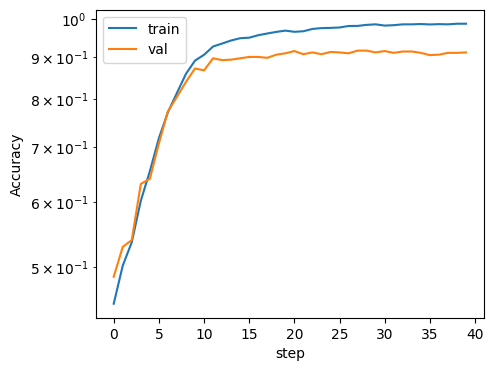

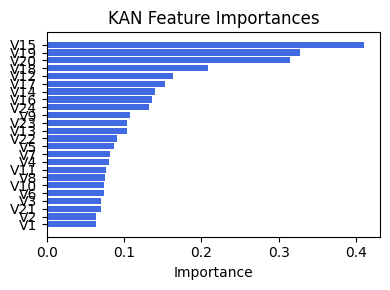

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.34766469264894234), ('V3', 0.3277794245770745), ('V18', 0.3210805606358018), ('V17', 0.3111991188360972), ('V8', 0.30812452843258387), ('V2', 0.30613041542000957), ('V4', 0.30094485084051625), ('V19', 0.30065069834211), ('V14', 0.2936225755138999), ('V12', 0.29175458337277754), ('V9', 0.2889129802913372), ('V7', 0.28685512715795386), ('V1', 0.2690260389017467), ('V6', 0.2539096513412185), ('V5', 0.24929268680208913), ('V11', 0.21464157337541376), ('V15', 0.20883254555936107), ('V20', 0.20600099280067624), ('V16', 0.2044260325456113), ('V10', 0.1946102297816108), ('V23', 0.1944380642244108), ('V21', 0.1873188120294839), ('V24', 0.18373614937687913), ('V22', 0.17903969214139678), ('Ex1', 0.1531406269624003)]


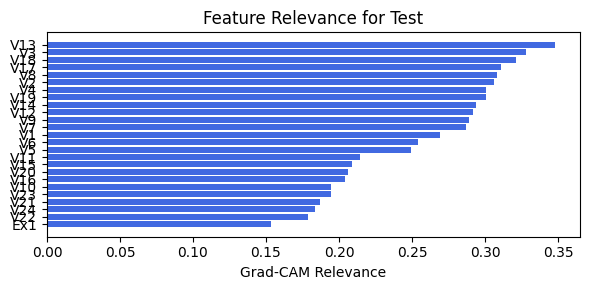

In [62]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.2.2 width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.93e-01 | val_acc_hybrid: 9.15e-01 |: 100%|█████| 40/40 [01:47<00:00,  2.69s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3471e-01 at 22 epoch
tensor(0.9267, device='cuda:0')
[[419  18   3   1]
 [ 19 390   9   2]
 [  0   6  59   1]
 [  0   4  17 144]]
M_KAN Relevance: 0.577312707901001
CNN Relevance: 0.42268723249435425
[('V15', 0.37003672), ('V20', 0.3001329), ('V19', 0.27100918), ('V18', 0.17549707), ('V14', 0.1425361), ('V7', 0.1204035), ('V12', 0.12002153), ('V17', 0.11443657), ('V2', 0.11270942), ('V13', 0.107993215), ('V22', 0.107240826), ('V4', 0.09974056), ('V10', 0.09601978), ('V3', 0.09544721), ('V5', 0.093460865), ('V11', 0.091343485), ('V9', 0.09012119), ('V24', 0.085584566), ('V6', 0.08404122), ('V23', 0.08248921), ('V16', 0.08247826), ('V21', 0.07567926), ('V1', 0.0648037), ('V8', 0.062671535)]


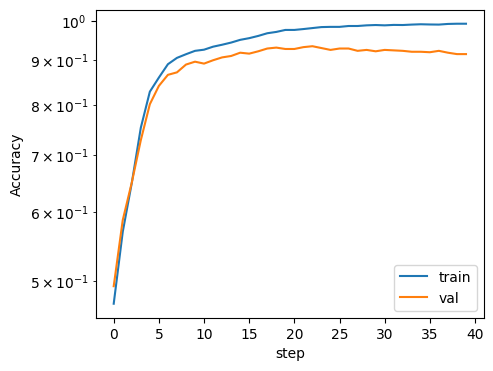

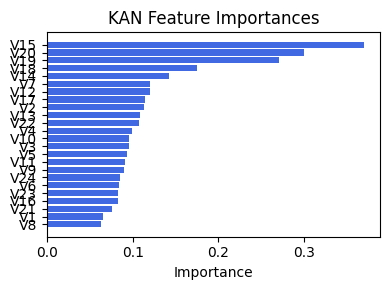

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V4', 0.2654546966738593), ('V3', 0.25983976863880587), ('V2', 0.23001184564839608), ('V20', 0.20634626723537186), ('V24', 0.1897099040430649), ('Ex1', 0.18956039827701585), ('V19', 0.1874136404930784), ('V15', 0.18353329054971187), ('V8', 0.18056835207068248), ('V5', 0.1797355575899162), ('V23', 0.17599977244558082), ('V7', 0.17473757679286564), ('V18', 0.17438366648099504), ('V13', 0.16882925634353418), ('V1', 0.16428585918655142), ('V6', 0.1637892786604605), ('V10', 0.163729789788284), ('V22', 0.15815357116715503), ('V9', 0.15313526410473027), ('V11', 0.14266055899550892), ('V14', 0.1414538837809179), ('V16', 0.1411285414899331), ('V17', 0.1380225494014647), ('V21', 0.13658576010228876), ('V12', 0.13217504910386235)]


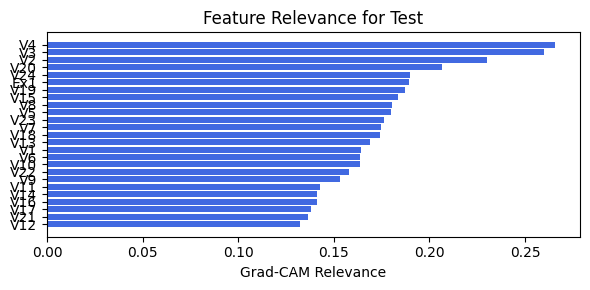

In [63]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.2.3 width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.85e-01 | val_acc_hybrid: 8.97e-01 |: 100%|█████| 40/40 [01:50<00:00,  2.76s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.0378e-01 at 22 epoch
tensor(0.9011, device='cuda:0')
[[400  36   5   0]
 [ 20 386  12   2]
 [  1   7  58   0]
 [  0   4  21 140]]
M_KAN Relevance: 0.4684874415397644
CNN Relevance: 0.5315125584602356
[('V15', 0.4035191), ('V19', 0.2987865), ('V20', 0.26555946), ('V18', 0.22187763), ('V14', 0.17669669), ('V13', 0.16449605), ('V22', 0.15059038), ('V12', 0.12471426), ('V17', 0.124611825), ('V5', 0.1188547), ('V7', 0.11814918), ('V16', 0.108328775), ('V11', 0.101969674), ('V10', 0.10103052), ('V24', 0.09820119), ('V9', 0.09293207), ('V3', 0.091316536), ('V23', 0.09042665), ('V6', 0.08219903), ('V2', 0.07556205), ('V1', 0.070345156), ('V4', 0.069550835), ('V21', 0.06895361), ('V8', 0.042485576)]


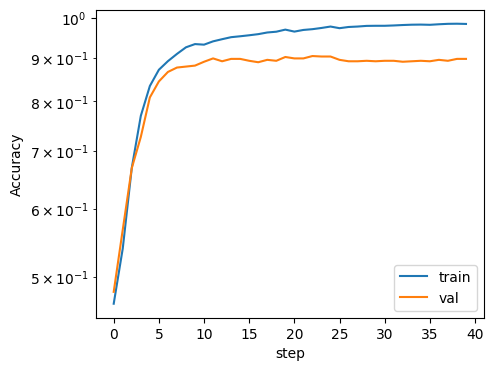

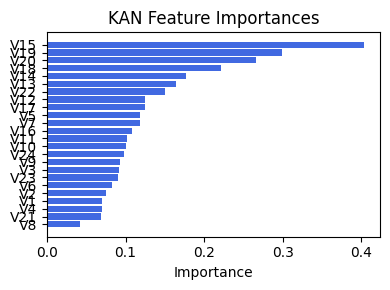

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.32057058792691356), ('V17', 0.2860680467836327), ('V19', 0.28005117245624334), ('V24', 0.21870616623639166), ('V23', 0.21484212209483364), ('V4', 0.20476388741243992), ('V22', 0.2047047709924693), ('V14', 0.20365916423342684), ('V13', 0.20055020980165092), ('V20', 0.19165788635717823), ('V3', 0.19049262689955473), ('V12', 0.18802577389338934), ('V2', 0.18763048446662017), ('V9', 0.17390001907555774), ('V7', 0.17033315846825917), ('V8', 0.1648831525346042), ('V1', 0.16203230998072177), ('Ex1', 0.16192581168164932), ('V16', 0.15787275583097787), ('V15', 0.14963817245100075), ('V10', 0.1446353663924285), ('V5', 0.1418018520223316), ('V6', 0.13834981214427905), ('V21', 0.13354686630100665), ('V11', 0.1278988074849082)]


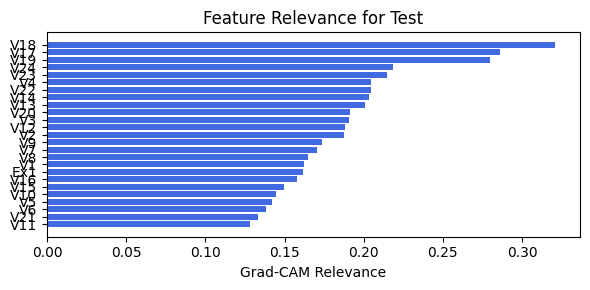

In [64]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.2.4 width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 8.92e-01 |: 100%|█████| 40/40 [01:50<00:00,  2.77s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.1180e-01 at 20 epoch
tensor(0.9121, device='cuda:0')
[[414  21   5   1]
 [ 18 384  18   0]
 [  2   7  53   4]
 [  0   4  16 145]]
M_KAN Relevance: 0.6860918998718262
CNN Relevance: 0.31390807032585144
[('V15', 0.4002849), ('V19', 0.27289507), ('V20', 0.2509219), ('V12', 0.21419151), ('V18', 0.18689586), ('V14', 0.16904935), ('V11', 0.12277202), ('V9', 0.1214012), ('V10', 0.11881793), ('V13', 0.11861549), ('V24', 0.11450318), ('V21', 0.110476114), ('V17', 0.10031644), ('V16', 0.09976185), ('V22', 0.093439154), ('V4', 0.09024651), ('V23', 0.08997958), ('V6', 0.082284115), ('V2', 0.079143465), ('V1', 0.07216574), ('V7', 0.0709), ('V8', 0.063115925), ('V5', 0.061736707), ('V3', 0.056824505)]


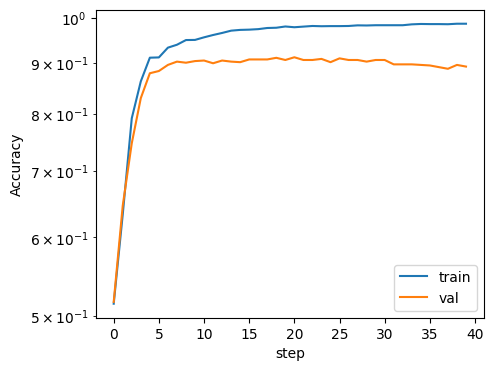

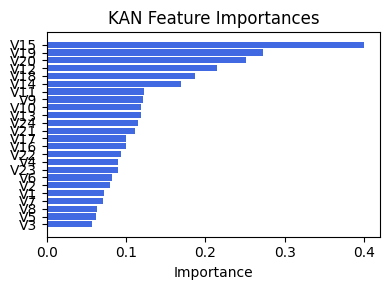

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3358798555281626), ('V22', 0.3018271225817097), ('V24', 0.29684682130280987), ('V20', 0.2963585430684944), ('V19', 0.28598428887182686), ('V14', 0.28081628244306045), ('V18', 0.2540213648200414), ('V15', 0.24273215336377577), ('V17', 0.21800086742504535), ('V13', 0.20890817583360344), ('V10', 0.2078452147826473), ('V21', 0.2053211682018211), ('V11', 0.20034593039539747), ('V8', 0.19703576345237198), ('V9', 0.19700809935967722), ('V16', 0.1944108369078331), ('Ex1', 0.1854022970410203), ('V12', 0.18468466843110587), ('V7', 0.17545949238759825), ('V6', 0.1609526419382706), ('V3', 0.1534316166684747), ('V5', 0.15056521749847357), ('V4', 0.1406265139612115), ('V1', 0.12271737488069678), ('V2', 0.12185009649876699)]


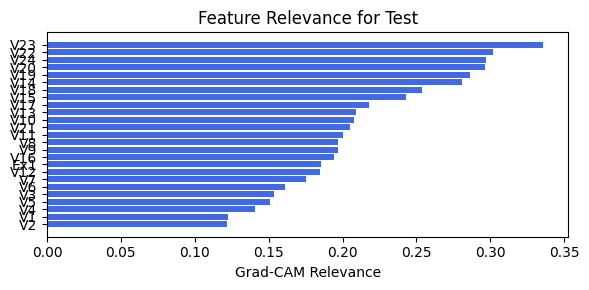

In [65]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.2.5 width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 8.92e-01 |: 100%|█████| 40/40 [01:51<00:00,  2.78s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.1180e-01 at 20 epoch
tensor(0.9121, device='cuda:0')
[[414  21   5   1]
 [ 18 384  18   0]
 [  2   7  53   4]
 [  0   4  16 145]]
M_KAN Relevance: 0.6860918998718262
CNN Relevance: 0.31390807032585144
[('V15', 0.4002849), ('V19', 0.27289507), ('V20', 0.2509219), ('V12', 0.21419151), ('V18', 0.18689586), ('V14', 0.16904935), ('V11', 0.12277202), ('V9', 0.1214012), ('V10', 0.11881793), ('V13', 0.11861549), ('V24', 0.11450318), ('V21', 0.110476114), ('V17', 0.10031644), ('V16', 0.09976185), ('V22', 0.093439154), ('V4', 0.09024651), ('V23', 0.08997958), ('V6', 0.082284115), ('V2', 0.079143465), ('V1', 0.07216574), ('V7', 0.0709), ('V8', 0.063115925), ('V5', 0.061736707), ('V3', 0.056824505)]


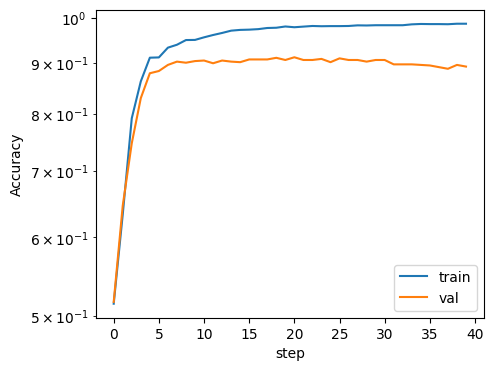

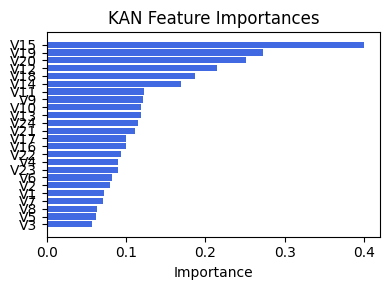

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3358798555281626), ('V22', 0.3018271225817097), ('V24', 0.29684682130280987), ('V20', 0.2963585430684944), ('V19', 0.28598428887182686), ('V14', 0.28081628244306045), ('V18', 0.2540213648200414), ('V15', 0.24273215336377577), ('V17', 0.21800086742504535), ('V13', 0.20890817583360344), ('V10', 0.2078452147826473), ('V21', 0.2053211682018211), ('V11', 0.20034593039539747), ('V8', 0.19703576345237198), ('V9', 0.19700809935967722), ('V16', 0.1944108369078331), ('Ex1', 0.1854022970410203), ('V12', 0.18468466843110587), ('V7', 0.17545949238759825), ('V6', 0.1609526419382706), ('V3', 0.1534316166684747), ('V5', 0.15056521749847357), ('V4', 0.1406265139612115), ('V1', 0.12271737488069678), ('V2', 0.12185009649876699)]


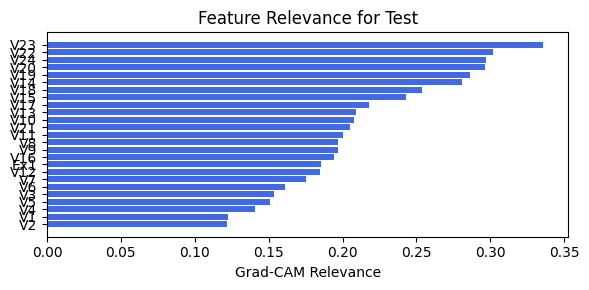

In [66]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.2.7 width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.91e-01 | val_acc_hybrid: 9.45e-01 |: 100%|█████| 40/40 [01:49<00:00,  2.74s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4731e-01 at 38 epoch
tensor(0.9277, device='cuda:0')
[[407  31   2   1]
 [  6 405   9   0]
 [  2   5  59   0]
 [  1   4  18 142]]
M_KAN Relevance: 0.9970651865005493
CNN Relevance: 0.0029348256066441536
[('V15', 0.30455485), ('V19', 0.24314967), ('V20', 0.20454179), ('V18', 0.20372353), ('V12', 0.16681768), ('V7', 0.13881026), ('V14', 0.13201794), ('V17', 0.1222883), ('V11', 0.121428326), ('V10', 0.12017379), ('V6', 0.11941821), ('V2', 0.10907699), ('V23', 0.104511864), ('V8', 0.10112194), ('V24', 0.0995174), ('V9', 0.097144656), ('V3', 0.095711015), ('V4', 0.090942405), ('V16', 0.08620014), ('V22', 0.06820531), ('V5', 0.06469392), ('V21', 0.063595995), ('V1', 0.060957626), ('V13', 0.060782366)]


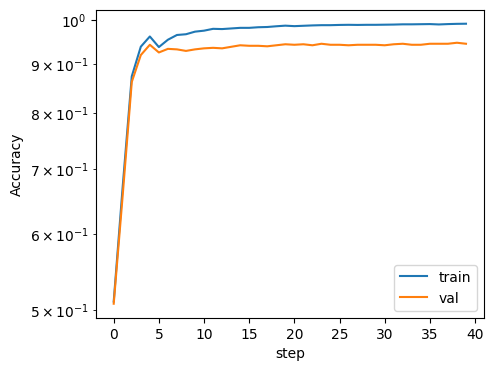

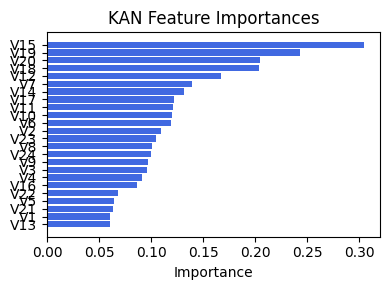

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3336677860275853), ('V22', 0.33243374518840957), ('V24', 0.30500402379898384), ('V9', 0.22524357404075426), ('V7', 0.1873529787688299), ('V21', 0.1848953401427208), ('V8', 0.17706461069869192), ('V14', 0.1770453220878296), ('V11', 0.16556282885172857), ('V19', 0.16398008695749), ('V4', 0.14989723155989043), ('V13', 0.1474567816237537), ('V18', 0.14584878883539912), ('V17', 0.13411054757643098), ('V16', 0.13230068795942665), ('V2', 0.13170052931791726), ('V12', 0.1301694778761978), ('V6', 0.12095239291257769), ('V3', 0.11780633559996764), ('Ex1', 0.09225537349528753), ('V10', 0.0907429502933868), ('V1', 0.08826956862842866), ('V20', 0.08569779608252837), ('V15', 0.06735393066615278), ('V5', 0.05864964267772145)]


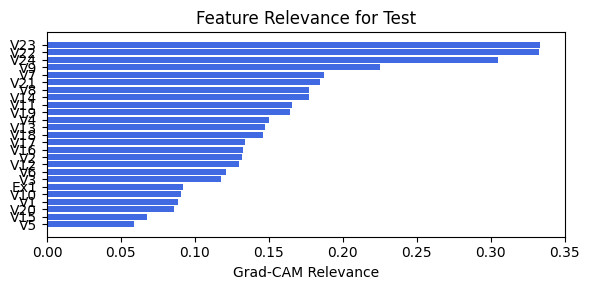

In [67]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.2.8 width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.91e-01 | val_acc_hybrid: 9.45e-01 |: 100%|█████| 40/40 [01:48<00:00,  2.72s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4731e-01 at 38 epoch
tensor(0.9277, device='cuda:0')
[[407  31   2   1]
 [  6 405   9   0]
 [  2   5  59   0]
 [  1   4  18 142]]
M_KAN Relevance: 0.9970651865005493
CNN Relevance: 0.0029348256066441536
[('V15', 0.30455485), ('V19', 0.24314967), ('V20', 0.20454179), ('V18', 0.20372353), ('V12', 0.16681768), ('V7', 0.13881026), ('V14', 0.13201794), ('V17', 0.1222883), ('V11', 0.121428326), ('V10', 0.12017379), ('V6', 0.11941821), ('V2', 0.10907699), ('V23', 0.104511864), ('V8', 0.10112194), ('V24', 0.0995174), ('V9', 0.097144656), ('V3', 0.095711015), ('V4', 0.090942405), ('V16', 0.08620014), ('V22', 0.06820531), ('V5', 0.06469392), ('V21', 0.063595995), ('V1', 0.060957626), ('V13', 0.060782366)]


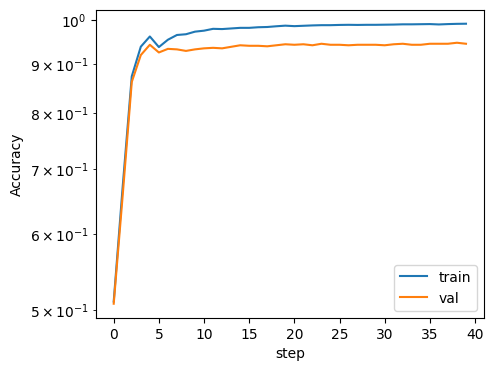

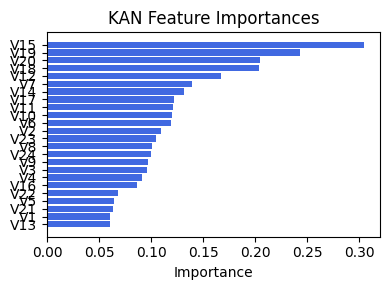

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3336677860275853), ('V22', 0.33243374518840957), ('V24', 0.30500402379898384), ('V9', 0.22524357404075426), ('V7', 0.1873529787688299), ('V21', 0.1848953401427208), ('V8', 0.17706461069869192), ('V14', 0.1770453220878296), ('V11', 0.16556282885172857), ('V19', 0.16398008695749), ('V4', 0.14989723155989043), ('V13', 0.1474567816237537), ('V18', 0.14584878883539912), ('V17', 0.13411054757643098), ('V16', 0.13230068795942665), ('V2', 0.13170052931791726), ('V12', 0.1301694778761978), ('V6', 0.12095239291257769), ('V3', 0.11780633559996764), ('Ex1', 0.09225537349528753), ('V10', 0.0907429502933868), ('V1', 0.08826956862842866), ('V20', 0.08569779608252837), ('V15', 0.06735393066615278), ('V5', 0.05864964267772145)]


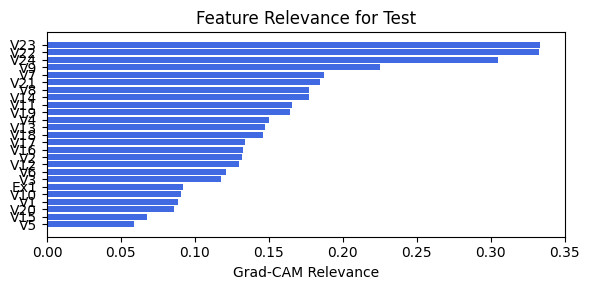

In [68]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.2.9. width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.91e-01 | val_acc_hybrid: 9.14e-01 |: 100%|█████| 40/40 [01:50<00:00,  2.76s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.1867e-01 at 26 epoch
tensor(0.9084, device='cuda:0')
[[405  32   3   1]
 [ 18 386  15   1]
 [  1   7  55   3]
 [  0   5  14 146]]
M_KAN Relevance: 0.9016517400741577
CNN Relevance: 0.09834828972816467
[('V15', 0.34956202), ('V20', 0.31094444), ('V19', 0.23707587), ('V18', 0.19326057), ('V12', 0.13116764), ('V9', 0.11514826), ('V14', 0.11358238), ('V17', 0.1096666), ('V16', 0.10722382), ('V4', 0.10642066), ('V24', 0.0977951), ('V10', 0.09010574), ('V22', 0.084147915), ('V5', 0.07775919), ('V6', 0.07749489), ('V11', 0.07611185), ('V13', 0.07494673), ('V23', 0.07194759), ('V1', 0.066168085), ('V2', 0.06559163), ('V8', 0.06470944), ('V7', 0.06409739), ('V21', 0.06281963), ('V3', 0.05824081)]


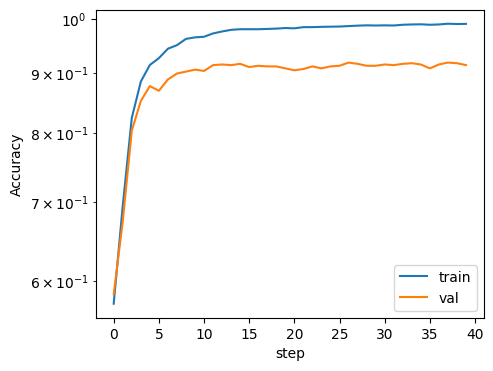

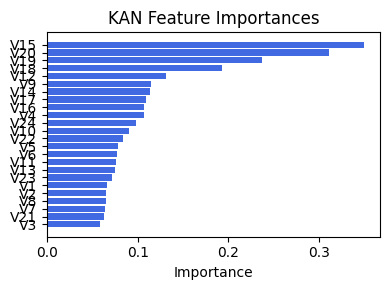

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.2943376022047319), ('V17', 0.290708784520212), ('V22', 0.28697926637007865), ('V19', 0.28112352428635173), ('V23', 0.27718850928691346), ('V24', 0.25875627067201895), ('V12', 0.24902613789070016), ('V13', 0.24858438571183278), ('V14', 0.2454348541046224), ('V3', 0.23262376134561313), ('V8', 0.23165203716518004), ('V16', 0.229687332669531), ('V9', 0.2285968791211317), ('V7', 0.22609319791649046), ('V11', 0.21513094434513255), ('V4', 0.21304546928260254), ('V20', 0.20693847723216607), ('V21', 0.20642524262437778), ('V2', 0.20296336487057148), ('V6', 0.1899032816039262), ('V15', 0.18350008334053552), ('V10', 0.17987031215904073), ('V1', 0.16721610002150222), ('Ex1', 0.1510981212556041), ('V5', 0.13865230309055976)]


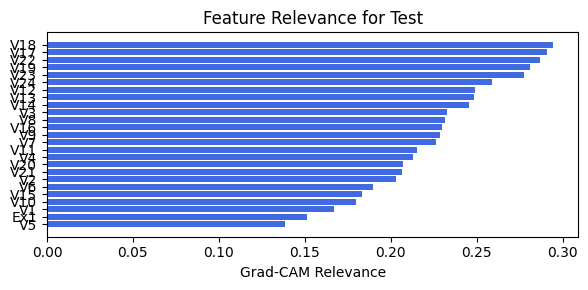

In [69]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.01, filename=filename_2, opt_col_val=0.01)

### 2.2.10 width=[24, 7, 1], grid=8, lamb=0.001 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.91e-01 | val_acc_hybrid: 9.14e-01 |: 100%|█████| 40/40 [01:50<00:00,  2.75s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.1867e-01 at 26 epoch
tensor(0.9084, device='cuda:0')
[[405  32   3   1]
 [ 18 386  15   1]
 [  1   7  55   3]
 [  0   5  14 146]]
M_KAN Relevance: 0.9016517400741577
CNN Relevance: 0.09834828972816467
[('V15', 0.34956202), ('V20', 0.31094444), ('V19', 0.23707587), ('V18', 0.19326057), ('V12', 0.13116764), ('V9', 0.11514826), ('V14', 0.11358238), ('V17', 0.1096666), ('V16', 0.10722382), ('V4', 0.10642066), ('V24', 0.0977951), ('V10', 0.09010574), ('V22', 0.084147915), ('V5', 0.07775919), ('V6', 0.07749489), ('V11', 0.07611185), ('V13', 0.07494673), ('V23', 0.07194759), ('V1', 0.066168085), ('V2', 0.06559163), ('V8', 0.06470944), ('V7', 0.06409739), ('V21', 0.06281963), ('V3', 0.05824081)]


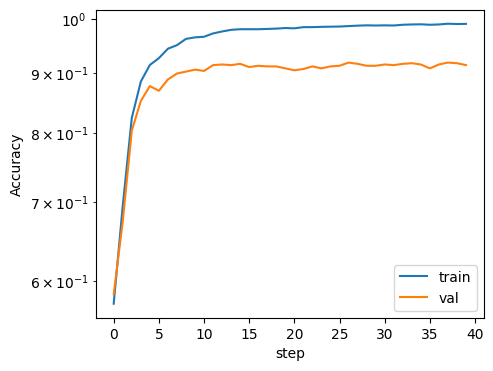

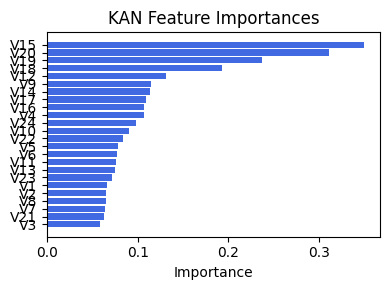

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.2943376022047319), ('V17', 0.290708784520212), ('V22', 0.28697926637007865), ('V19', 0.28112352428635173), ('V23', 0.27718850928691346), ('V24', 0.25875627067201895), ('V12', 0.24902613789070016), ('V13', 0.24858438571183278), ('V14', 0.2454348541046224), ('V3', 0.23262376134561313), ('V8', 0.23165203716518004), ('V16', 0.229687332669531), ('V9', 0.2285968791211317), ('V7', 0.22609319791649046), ('V11', 0.21513094434513255), ('V4', 0.21304546928260254), ('V20', 0.20693847723216607), ('V21', 0.20642524262437778), ('V2', 0.20296336487057148), ('V6', 0.1899032816039262), ('V15', 0.18350008334053552), ('V10', 0.17987031215904073), ('V1', 0.16721610002150222), ('Ex1', 0.1510981212556041), ('V5', 0.13865230309055976)]


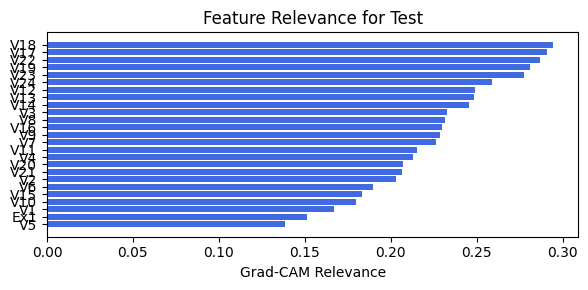

In [70]:
train_and_plot_relevance(Model3_2, kan_neurons=7, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.01, filename=filename_2, opt_col_val=0.01)

## 2.3 width=[24, 9], grid=8, lamb=0.001

### 2.3.0 width=[24, 9], grid=8, lamb=0.001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.62e-01 | val_acc_hybrid: 9.14e-01 |: 100%|█████| 40/40 [02:16<00:00,  3.42s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.2096e-01 at 36 epoch
tensor(0.9048, device='cuda:0')
[[415  24   1   1]
 [ 26 386   6   2]
 [  0   6  60   0]
 [  0   4  32 129]]
M_KAN Relevance: 0.26250380277633667
CNN Relevance: 0.7374961972236633
[('V20', 0.2923597), ('V15', 0.22260131), ('V19', 0.22049141), ('V6', 0.18002328), ('V18', 0.16824599), ('V5', 0.13258794), ('V12', 0.11769123), ('V7', 0.11554321), ('V22', 0.11025558), ('V4', 0.10447056), ('V11', 0.10333786), ('V16', 0.10308026), ('V17', 0.09948817), ('V10', 0.09947208), ('V14', 0.093866386), ('V9', 0.08681985), ('V13', 0.085271984), ('V3', 0.08428182), ('V24', 0.07732066), ('V2', 0.073200665), ('V21', 0.06676723), ('V23', 0.061028864), ('V1', 0.05082323), ('V8', 0.038196318)]


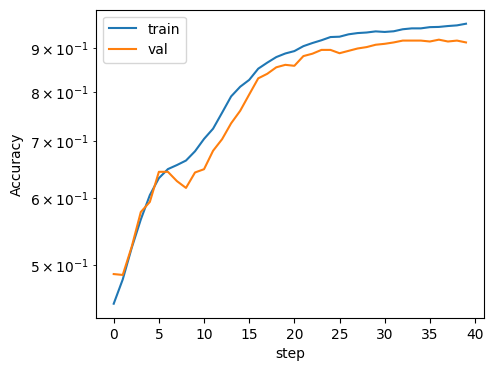

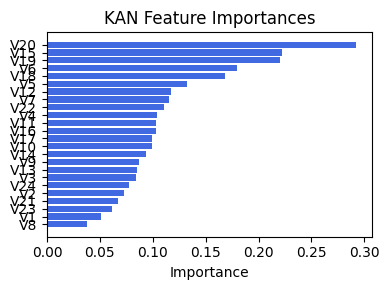

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.27463463427530493), ('V24', 0.25171482403946177), ('V22', 0.23022568107665595), ('V8', 0.22128488275865538), ('V7', 0.21148582998431423), ('V13', 0.20445659971410485), ('V9', 0.1922177665313299), ('V2', 0.1832929387710598), ('V3', 0.18040057448474112), ('V17', 0.1699824531253145), ('V12', 0.16403530266511857), ('V6', 0.16158296352281362), ('V16', 0.15720460947844772), ('V11', 0.1560352801157678), ('V4', 0.1550835224829875), ('V18', 0.15476433187851088), ('V14', 0.15143466202351144), ('V1', 0.14602283912147904), ('Ex1', 0.14557288803463808), ('V19', 0.1419116727507345), ('V20', 0.13117628912596546), ('V15', 0.12008530370385348), ('V10', 0.11169334363528453), ('V5', 0.09738225684629266), ('V21', 0.09007594453397116)]


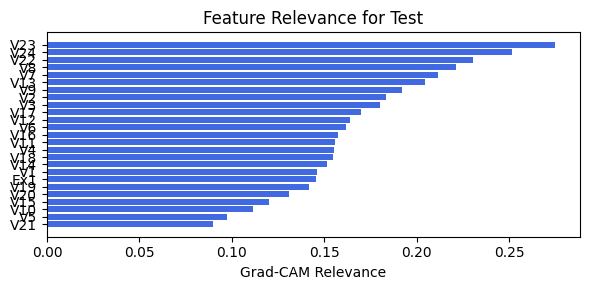

In [154]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.3.1 width=[24, 9], grid=8, lamb=0.001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.74e-01 | val_acc_hybrid: 9.19e-01 |: 100%|█████| 40/40 [01:50<00:00,  2.77s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 26 epoch
tensor(0.9093, device='cuda:0')
[[414  23   3   1]
 [ 20 392   7   1]
 [  0   9  55   2]
 [  0   5  28 132]]
M_KAN Relevance: 0.33542582392692566
CNN Relevance: 0.664574146270752
[('V20', 0.29175615), ('V19', 0.26973096), ('V15', 0.25775748), ('V9', 0.17066403), ('V7', 0.13561967), ('V18', 0.12781473), ('V2', 0.12329939), ('V12', 0.12057919), ('V6', 0.117245704), ('V10', 0.11668432), ('V3', 0.10694344), ('V13', 0.09365555), ('V22', 0.09168432), ('V4', 0.09048585), ('V5', 0.08366748), ('V16', 0.083572604), ('V14', 0.08266736), ('V11', 0.079241574), ('V17', 0.07702408), ('V24', 0.07285018), ('V23', 0.070126735), ('V21', 0.066756345), ('V1', 0.06355907), ('V8', 0.04756794)]


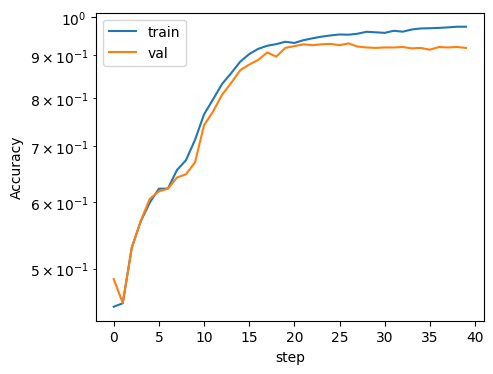

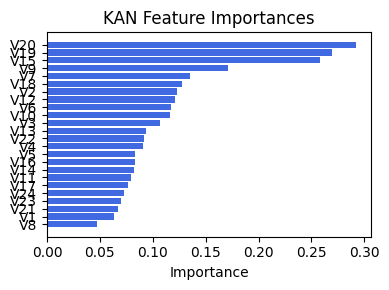

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.3117216581503448), ('V8', 0.2979622361235936), ('V23', 0.29407384334709463), ('V18', 0.27671374535211957), ('V7', 0.2613262879184508), ('V24', 0.253955153109588), ('V9', 0.25235462794634733), ('V14', 0.25212931081600615), ('V22', 0.24825775471035474), ('V12', 0.2465146935588404), ('V19', 0.2432797305114186), ('V17', 0.23683863536274785), ('V3', 0.2147531056320603), ('V2', 0.20333239449941934), ('V11', 0.20115475453915582), ('V16', 0.18857089032989055), ('V4', 0.18578902412706563), ('V6', 0.18480416738351205), ('V10', 0.16976739584076841), ('Ex1', 0.16904443895705315), ('V20', 0.15707197846740079), ('V1', 0.15369590213335885), ('V15', 0.14559791772439779), ('V5', 0.14335340565094656), ('V21', 0.12192358382238262)]


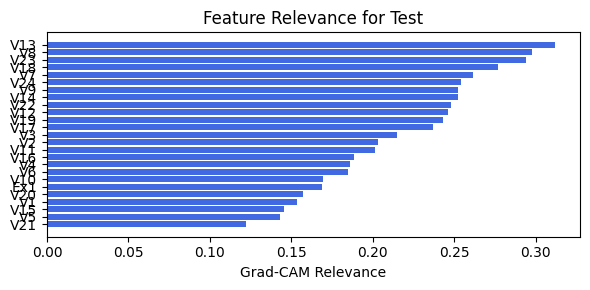

In [71]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.75, filename=filename_2, opt_col_val=0.75)

### 2.3.2 width=[24, 9], grid=8, lamb=0.001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.75e-01 | val_acc_hybrid: 9.20e-01 |: 100%|█████| 40/40 [01:52<00:00,  2.81s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 31 epoch
tensor(0.9240, device='cuda:0')
[[411  24   6   0]
 [  9 403   6   2]
 [  0   8  57   1]
 [  0   4  23 138]]
M_KAN Relevance: 0.3445892035961151
CNN Relevance: 0.6554108262062073
[('V20', 0.3331963), ('V19', 0.32864547), ('V15', 0.22036539), ('V5', 0.1887308), ('V18', 0.16181868), ('V12', 0.1521169), ('V3', 0.1395125), ('V6', 0.13754824), ('V22', 0.13245897), ('V14', 0.11778964), ('V17', 0.1174313), ('V16', 0.11437497), ('V13', 0.10519104), ('V4', 0.10364579), ('V24', 0.09725862), ('V7', 0.08544206), ('V21', 0.083003804), ('V11', 0.08091953), ('V2', 0.07686464), ('V1', 0.07443792), ('V9', 0.06635495), ('V10', 0.06079598), ('V23', 0.05968676), ('V8', 0.045271773)]


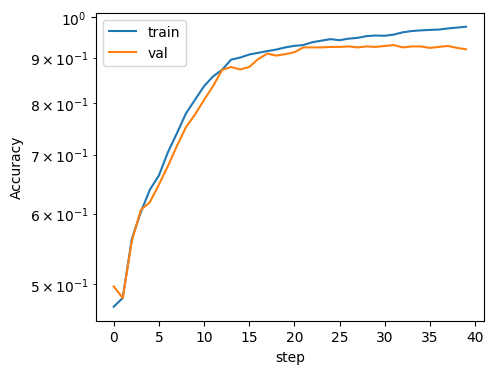

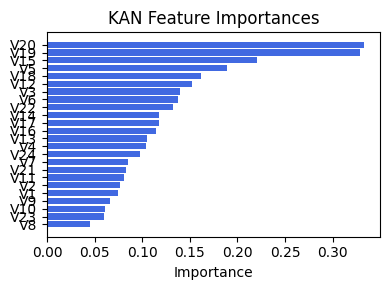

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.48962481336271235), ('V19', 0.4550181144651029), ('V13', 0.4171213043676342), ('V17', 0.4047357557927757), ('V14', 0.3722672123336591), ('V23', 0.33849093783873363), ('V24', 0.3305075187375726), ('V12', 0.3136674789499151), ('V22', 0.2886813505016047), ('V8', 0.2798151987266425), ('V20', 0.2779406768825475), ('V9', 0.27492883118596984), ('V7', 0.26758093181663856), ('Ex1', 0.2508225781824303), ('V15', 0.24741518892241046), ('V16', 0.21673043153373245), ('V11', 0.18706359404375142), ('V21', 0.1809178408021537), ('V6', 0.17885271109962259), ('V2', 0.17087898551938288), ('V10', 0.17046517894271548), ('V3', 0.15994410874953124), ('V4', 0.14878188340369575), ('V1', 0.1419798756584643), ('V5', 0.10144080119039994)]


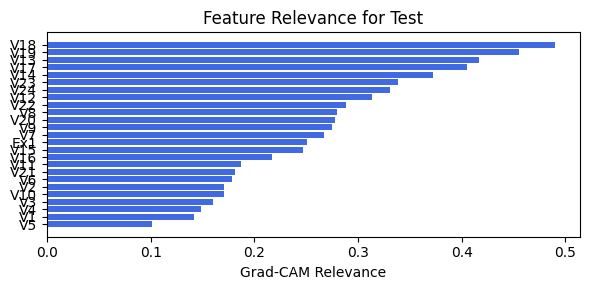

In [72]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.3.3 width=[24, 9], grid=8, lamb=0.001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.88e-01 | val_acc_hybrid: 9.21e-01 |: 100%|█████| 40/40 [01:50<00:00,  2.76s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3585e-01 at 28 epoch
tensor(0.9148, device='cuda:0')
[[406  31   3   1]
 [ 16 392  11   1]
 [  0   8  57   1]
 [  0   6  15 144]]
M_KAN Relevance: 0.552798867225647
CNN Relevance: 0.44720110297203064
[('V20', 0.39037308), ('V19', 0.2816329), ('V15', 0.27033198), ('V14', 0.16924566), ('V12', 0.15089875), ('V11', 0.13771714), ('V18', 0.13219185), ('V6', 0.12293502), ('V17', 0.120456934), ('V2', 0.1187451), ('V5', 0.11395611), ('V22', 0.110085405), ('V16', 0.10318143), ('V13', 0.101648934), ('V21', 0.096364714), ('V1', 0.0944271), ('V4', 0.087596335), ('V24', 0.08405315), ('V7', 0.073810615), ('V10', 0.06669285), ('V3', 0.0630107), ('V9', 0.05832835), ('V23', 0.050862554), ('V8', 0.042094715)]


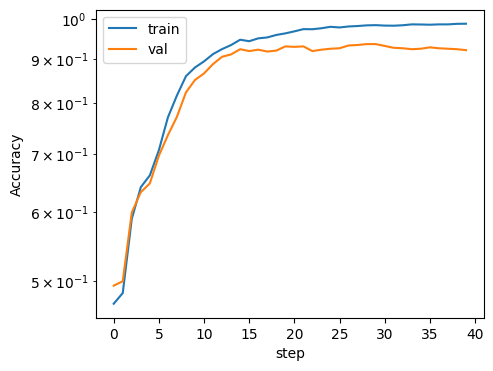

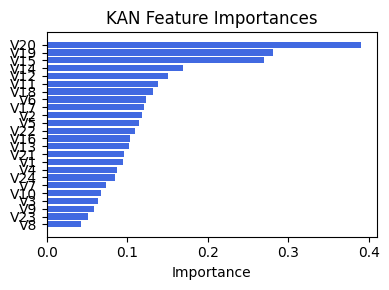

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.24584788420503212), ('V21', 0.2428956991738259), ('V22', 0.2426651384281792), ('V18', 0.2319106050048897), ('V20', 0.23036348476436727), ('V23', 0.22791141745034818), ('V14', 0.2254681243121346), ('V17', 0.22430098010621533), ('V10', 0.21811687791215087), ('V9', 0.20820004659225771), ('V13', 0.2054057192782728), ('V24', 0.19874654611180548), ('V15', 0.18985814673569387), ('V7', 0.18889260526235116), ('V4', 0.18478103434121054), ('V12', 0.1830632543661879), ('V2', 0.17498924015795878), ('V8', 0.17434111891338694), ('V5', 0.16595377387464716), ('V3', 0.16102110928640062), ('V6', 0.15933996748055554), ('V16', 0.15723612696525552), ('V11', 0.14889354930623777), ('Ex1', 0.1435776602575927), ('V1', 0.14212835354181155)]


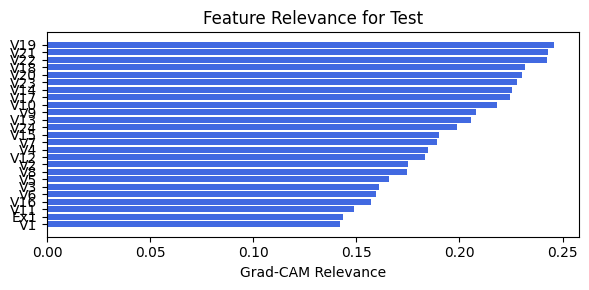

In [73]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.5, filename=filename_2, opt_col_val=0.5)

### 2.3.4 width=[24, 9], grid=8, lamb=0.001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.93e-01 | val_acc_hybrid: 9.22e-01 |: 100%|█████| 40/40 [01:50<00:00,  2.75s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 11 epoch
tensor(0.9240, device='cuda:0')
[[408  29   3   1]
 [ 16 398   5   1]
 [  0   4  60   2]
 [  0   4  18 143]]
M_KAN Relevance: 0.6535099148750305
CNN Relevance: 0.3464900851249695
[('V20', 0.38492185), ('V19', 0.3760784), ('V15', 0.24581139), ('V18', 0.13325797), ('V12', 0.12131355), ('V24', 0.118324295), ('V14', 0.10931366), ('V11', 0.10921117), ('V6', 0.10225222), ('V5', 0.101900615), ('V13', 0.09723355), ('V17', 0.09165228), ('V4', 0.08737852), ('V22', 0.08642963), ('V9', 0.08012049), ('V21', 0.07896824), ('V16', 0.07833989), ('V23', 0.075887956), ('V2', 0.07474319), ('V10', 0.07020636), ('V3', 0.06890184), ('V8', 0.068341866), ('V7', 0.06625976), ('V1', 0.060860388)]


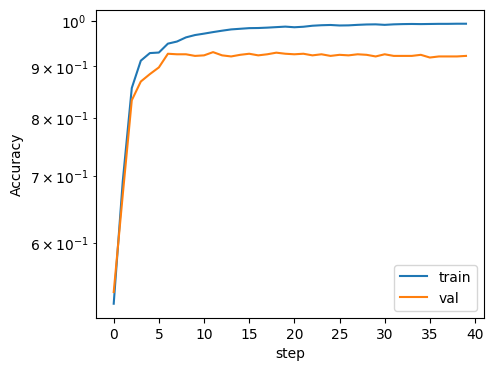

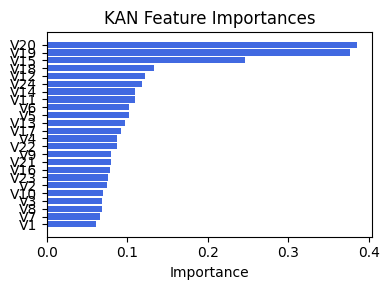

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V24', 0.34663349355401146), ('V23', 0.3361393324669671), ('V22', 0.32152521465710987), ('V19', 0.28525238434387856), ('V20', 0.2582892722826734), ('V15', 0.2372510513612944), ('V18', 0.22825892243982931), ('V21', 0.22329600133485694), ('V17', 0.221279990731614), ('V14', 0.21512333009185577), ('V13', 0.20934510245503352), ('Ex1', 0.2078953940781869), ('V10', 0.1915209743964484), ('V9', 0.1885425648724377), ('V12', 0.17727639415710114), ('V7', 0.17112021229691532), ('V8', 0.1698309676088444), ('V5', 0.15545729762522242), ('V3', 0.1534065037064062), ('V16', 0.15265611711326724), ('V2', 0.1508053177769111), ('V11', 0.1432577574302804), ('V4', 0.14145189145917453), ('V6', 0.12541568771030476), ('V1', 0.10333163921837535)]


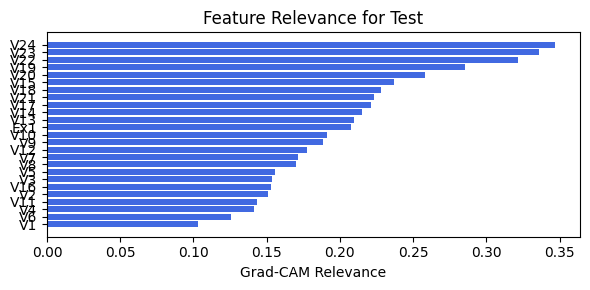

In [74]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.3.5 width=[24, 9], grid=8, lamb=0.001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.90e-01 | val_acc_hybrid: 9.28e-01 |: 100%|█████| 40/40 [01:50<00:00,  2.77s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4044e-01 at 8 epoch
tensor(0.9286, device='cuda:0')
[[412  22   6   1]
 [ 12 402   5   1]
 [  0   8  57   1]
 [  0   4  18 143]]
M_KAN Relevance: 0.5666803121566772
CNN Relevance: 0.43331965804100037
[('V19', 0.35908633), ('V20', 0.3526725), ('V15', 0.19925809), ('V12', 0.14227171), ('V18', 0.1336227), ('V14', 0.11562929), ('V22', 0.11387978), ('V9', 0.108313836), ('V4', 0.10541419), ('V16', 0.098495044), ('V11', 0.09317816), ('V13', 0.08776273), ('V17', 0.07911714), ('V3', 0.069569826), ('V6', 0.06823946), ('V21', 0.06821535), ('V24', 0.064262316), ('V23', 0.059527643), ('V5', 0.05514865), ('V8', 0.05468991), ('V2', 0.05400161), ('V10', 0.05293668), ('V1', 0.051196408), ('V7', 0.039870385)]


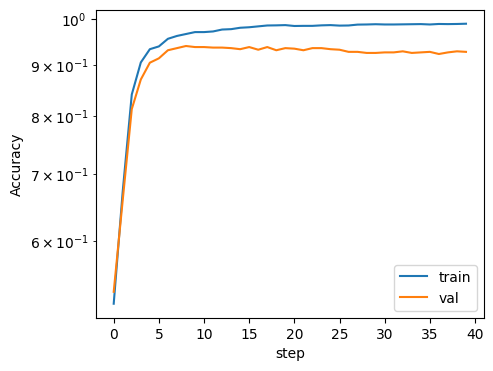

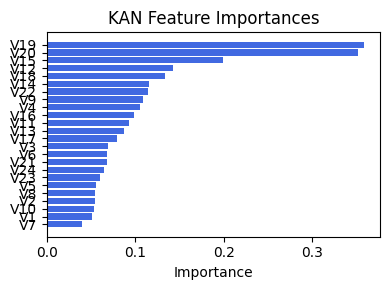

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.35075142077397814), ('V19', 0.30166880909513194), ('V15', 0.29279478795885283), ('V24', 0.28709595152415185), ('V23', 0.2767351052642057), ('V10', 0.26105571517520076), ('Ex1', 0.24161574201161617), ('V22', 0.23912340955266767), ('V18', 0.23354375747339706), ('V14', 0.23268128349515055), ('V9', 0.1854901236049991), ('V17', 0.18547611912018866), ('V13', 0.18510351230577146), ('V8', 0.1691868457464107), ('V7', 0.13260799995009204), ('V12', 0.13093880932820123), ('V5', 0.12852993532029666), ('V21', 0.12607245981357149), ('V3', 0.11815858391236071), ('V4', 0.11449631923224533), ('V2', 0.10342935719259519), ('V6', 0.09205303476142722), ('V16', 0.0860179192019305), ('V1', 0.08549302785693297), ('V11', 0.07922000863687745)]


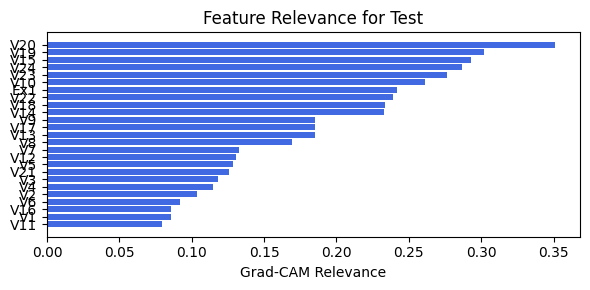

In [75]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.25, filename=filename_2, opt_col_val=0.25)

### 2.3.6 width=[24, 9], grid=8, lamb=0.001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 9.30e-01 |: 100%|█████| 40/40 [01:49<00:00,  2.74s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4731e-01 at 11 epoch
tensor(0.9258, device='cuda:0')
[[404  29   8   0]
 [  8 411   1   0]
 [  1   6  56   3]
 [  2   5  18 140]]
M_KAN Relevance: 0.7495735287666321
CNN Relevance: 0.2504265010356903
[('V15', 0.41407233), ('V9', 0.2388552), ('V19', 0.23227975), ('V20', 0.19103618), ('V12', 0.1545812), ('V13', 0.14554079), ('V18', 0.139459), ('V14', 0.13811313), ('V16', 0.08576928), ('V17', 0.08457363), ('V4', 0.078253455), ('V22', 0.07412391), ('V6', 0.0717497), ('V3', 0.06651676), ('V11', 0.064507075), ('V5', 0.061587323), ('V2', 0.060513657), ('V21', 0.05769257), ('V23', 0.051406555), ('V24', 0.050933234), ('V8', 0.049143475), ('V10', 0.046590377), ('V7', 0.043877322), ('V1', 0.036752228)]


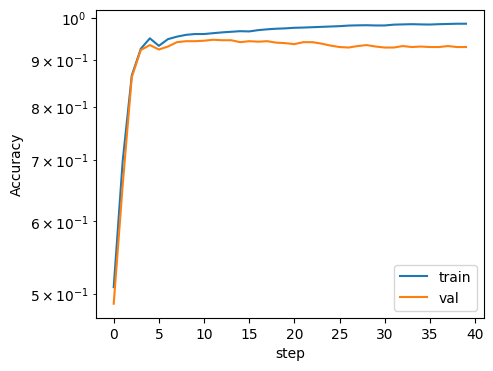

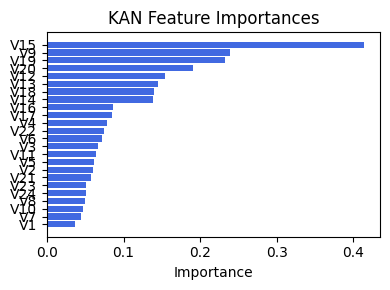

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V15', 0.25932139339652116), ('V20', 0.259076645022775), ('V10', 0.22918140940382462), ('V19', 0.22396506350351014), ('V14', 0.22225710198892137), ('V11', 0.20581089316897888), ('V9', 0.19580139836109797), ('V16', 0.19460631780291293), ('V6', 0.18562687920766688), ('Ex1', 0.1782451890026645), ('V21', 0.1670199695166917), ('V1', 0.16438877990035658), ('V18', 0.16420900603577634), ('V24', 0.1623710198879326), ('V13', 0.1511125292201721), ('V23', 0.14954444541156228), ('V17', 0.14785600990762093), ('V22', 0.1424061006685909), ('V4', 0.14129793279535546), ('V8', 0.13921304735525225), ('V5', 0.13224547657405195), ('V7', 0.13154746816133664), ('V12', 0.1269939817664522), ('V3', 0.1205038677928028), ('V2', 0.11276591509698307)]


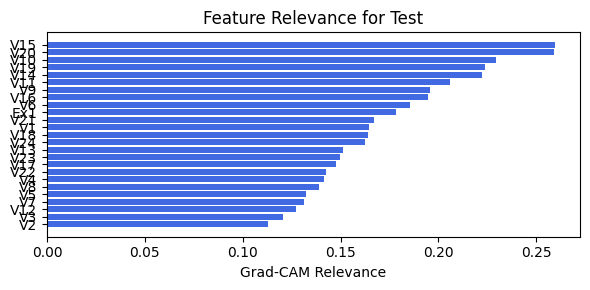

In [76]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.3.7 width=[24, 9], grid=8, lamb=0.001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.87e-01 | val_acc_hybrid: 9.39e-01 |: 100%|█████| 40/40 [01:51<00:00,  2.78s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4387e-01 at 17 epoch
tensor(0.9304, device='cuda:0')
[[412  24   5   0]
 [  7 410   2   1]
 [  0   7  58   1]
 [  0   6  23 136]]
M_KAN Relevance: 0.8102676868438721
CNN Relevance: 0.18973232805728912
[('V15', 0.30988112), ('V13', 0.23273005), ('V19', 0.2279987), ('V12', 0.20946413), ('V20', 0.19799167), ('V9', 0.1742838), ('V14', 0.16584261), ('V18', 0.14746301), ('V17', 0.14125808), ('V16', 0.12020592), ('V22', 0.115550496), ('V6', 0.11194009), ('V4', 0.09684634), ('V5', 0.09555528), ('V3', 0.09408719), ('V11', 0.0921357), ('V2', 0.09048358), ('V21', 0.08946259), ('V10', 0.07858968), ('V23', 0.07128309), ('V24', 0.06449223), ('V7', 0.06108282), ('V8', 0.05457433), ('V1', 0.043249056)]


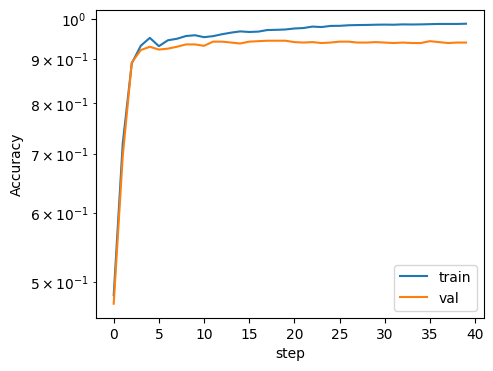

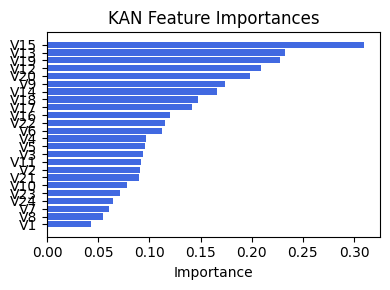

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.31893744594937756), ('V15', 0.2767486383955846), ('Ex1', 0.2366251251348194), ('V10', 0.23213157794421538), ('V17', 0.19288578892408975), ('V19', 0.18757509644688686), ('V8', 0.17990974257333417), ('V12', 0.17647754510966104), ('V9', 0.17282766478922731), ('V14', 0.16433055488513817), ('V22', 0.16422683702719804), ('V24', 0.15660139553625954), ('V7', 0.14672605135975214), ('V13', 0.14301169971517977), ('V23', 0.14251247021102478), ('V3', 0.1291761519183211), ('V18', 0.1254934474899205), ('V4', 0.11869617098293), ('V2', 0.11646344177175114), ('V16', 0.10318145464239373), ('V5', 0.10280007354904078), ('V11', 0.09558166386894353), ('V21', 0.09119831764565212), ('V1', 0.08285606674312793), ('V6', 0.08237725222008292)]


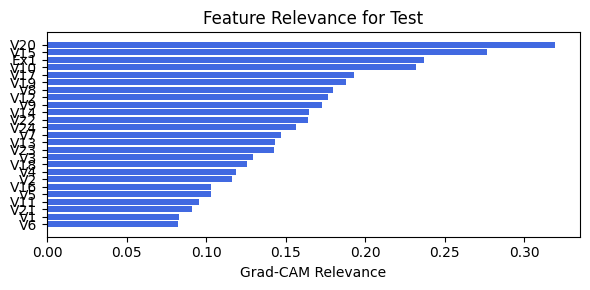

In [77]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.1, filename=filename_2, opt_col_val=0.1)

### 2.3.8 width=[24, 9], grid=8, lamb=0.001 | alpha=0.05

In [ ]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.05, filename=filename_2, opt_col_val=0.05)

### 2.3.9 width=[24, 9], grid=8, lamb=0.001 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 9.16e-01 |: 100%|█████| 40/40 [01:51<00:00,  2.78s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.2898e-01 at 21 epoch
tensor(0.9313, device='cuda:0')
[[416  18   6   1]
 [ 14 402   2   2]
 [  1   8  56   1]
 [  0   6  16 143]]
M_KAN Relevance: 0.8571956157684326
CNN Relevance: 0.14280441403388977
[('V15', 0.39332908), ('V20', 0.33998376), ('V19', 0.28145114), ('V18', 0.18010087), ('V12', 0.17476156), ('V9', 0.13432963), ('V5', 0.12879848), ('V6', 0.124414235), ('V14', 0.12428657), ('V11', 0.12049108), ('V16', 0.11823078), ('V22', 0.115735635), ('V17', 0.11329358), ('V4', 0.10504222), ('V24', 0.09794193), ('V7', 0.09583226), ('V10', 0.08755632), ('V2', 0.0802697), ('V13', 0.07988037), ('V3', 0.07916945), ('V1', 0.078563), ('V23', 0.07131973), ('V21', 0.060233552), ('V8', 0.059201743)]


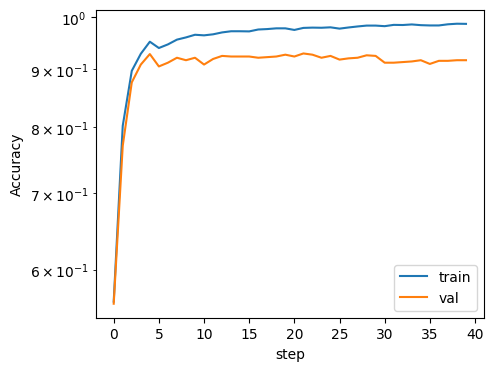

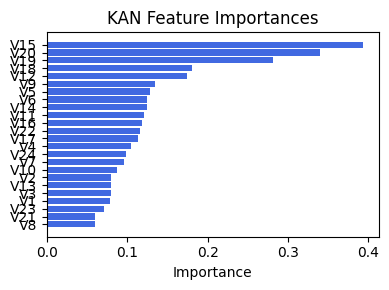

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.39764704459358347), ('V18', 0.3413113578783021), ('V14', 0.33226496079007434), ('V8', 0.32917304478464776), ('V9', 0.32375439553263424), ('V19', 0.31767060855597995), ('V12', 0.31515477212327586), ('V17', 0.3084495655785915), ('V7', 0.26380287074036607), ('V3', 0.26207605634771003), ('V11', 0.2613519773719048), ('V15', 0.2609594789547496), ('V20', 0.2558654317634023), ('V16', 0.2545584238487675), ('Ex1', 0.24498262987349784), ('V10', 0.2339160183378709), ('V4', 0.23017784059369253), ('V2', 0.2202241940503482), ('V6', 0.20729986485213767), ('V24', 0.1974403758277921), ('V23', 0.19101320240415157), ('V22', 0.18256488694096468), ('V21', 0.17730041683429817), ('V1', 0.14934129583945413), ('V5', 0.13928765725565523)]


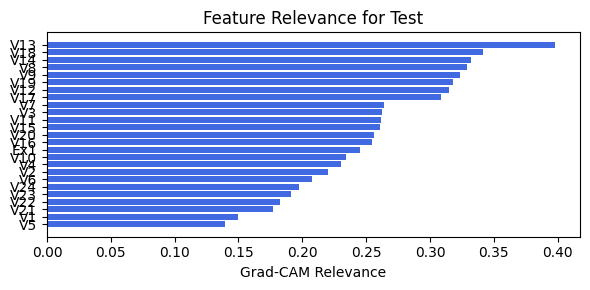

In [79]:
train_and_plot_relevance(Model3_2, kan_neurons=9, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=40, alpha=.05, filename=filename_2, opt_col_val=0.05)

# Option 3: Dynamic factor

In [80]:
create_csv_with_header(filename_3, columns_opt3)

## 3.0. width=[24, 12, 1], grid=8, lamb=0.001

### 3.0.0 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.55e-01 | val_acc_hybrid: 9.30e-01 |: 100%|█████| 60/60 [03:03<00:00,  3.05s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3013e-01 at 59 epoch
tensor(0.9185, device='cuda:0')
[[417  19   5   0]
 [ 20 391   9   0]
 [  0  10  56   0]
 [  0   1  25 139]]
M_KAN Relevance: 0.3341619372367859
CNN Relevance: 0.6658380627632141
[('V15', 0.268387), ('V19', 0.26242346), ('V20', 0.20548724), ('V18', 0.19605169), ('V14', 0.14357078), ('V12', 0.111028075), ('V6', 0.10180166), ('V5', 0.095397115), ('V16', 0.09392866), ('V24', 0.09196409), ('V17', 0.09035966), ('V13', 0.088222764), ('V4', 0.08712177), ('V21', 0.08521714), ('V22', 0.07814698), ('V10', 0.07781412), ('V7', 0.07704474), ('V11', 0.07241841), ('V8', 0.071507104), ('V9', 0.06993785), ('V2', 0.06674706), ('V23', 0.06466797), ('V3', 0.05252344), ('V1', 0.04951089)]


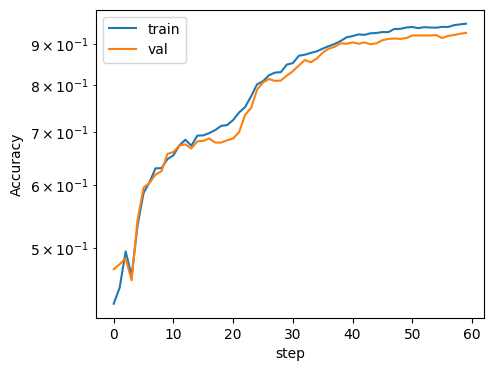

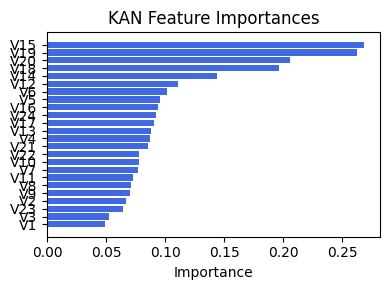

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.38533400680064717), ('V16', 0.34643393488152674), ('V18', 0.3371977344873419), ('V8', 0.3346691334384729), ('V12', 0.3216098747559441), ('V11', 0.3211994267200144), ('V17', 0.3185683251209318), ('V7', 0.2906710869604037), ('V14', 0.2873278885377032), ('V9', 0.28061897628438787), ('V6', 0.27293542349587824), ('V19', 0.2622151690509235), ('V3', 0.20590797721556706), ('V2', 0.18947933462671548), ('V4', 0.18020632640584333), ('V21', 0.15916511379279885), ('V20', 0.1576595694102682), ('V15', 0.1535029048944445), ('V10', 0.14756266686749486), ('V1', 0.1405330556303569), ('V23', 0.11929886311366687), ('V24', 0.11735735881520934), ('V5', 0.11297281185011426), ('V22', 0.11172370659022195), ('Ex1', 0.08690010440858757)]


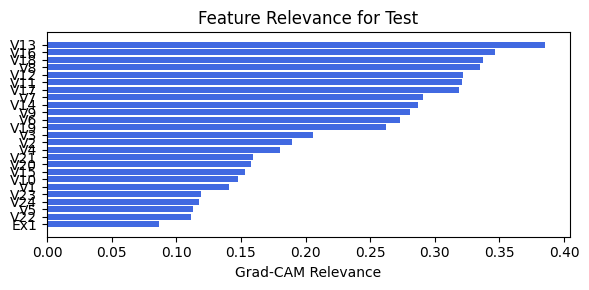

In [85]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, lamb=0.001, steps=60, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.0.1 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.78e-01 | val_acc_hybrid: 9.37e-01 |: 100%|█████| 60/60 [02:59<00:00,  3.00s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4158e-01 at 49 epoch
tensor(0.9286, device='cuda:0')
[[414  23   3   1]
 [ 11 397  11   1]
 [  0   8  56   2]
 [  0   3  15 147]]
M_KAN Relevance: 0.4807848632335663
CNN Relevance: 0.5192151069641113
[('V20', 0.2950294), ('V15', 0.28999633), ('V19', 0.27538392), ('V18', 0.18237245), ('V14', 0.13120417), ('V12', 0.123636395), ('V10', 0.11921533), ('V22', 0.11370778), ('V21', 0.11181103), ('V16', 0.10282677), ('V13', 0.10163872), ('V11', 0.094827875), ('V24', 0.09241345), ('V17', 0.084285274), ('V8', 0.079272), ('V6', 0.07870683), ('V5', 0.07554838), ('V4', 0.074430756), ('V23', 0.07152692), ('V9', 0.06768396), ('V2', 0.061465017), ('V3', 0.053377256), ('V7', 0.051044073), ('V1', 0.048611164)]


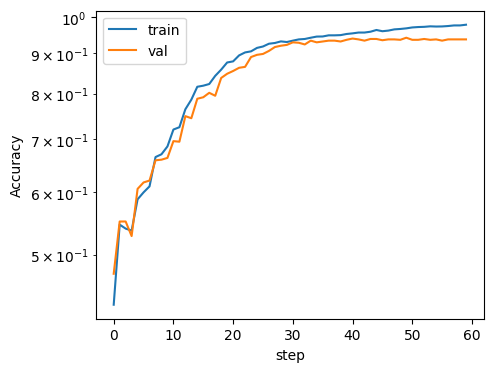

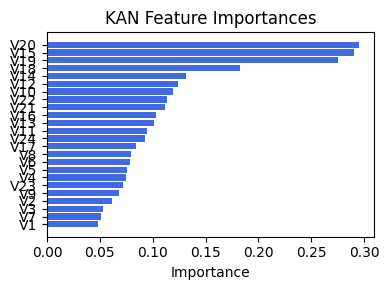

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.31038318311706853), ('V18', 0.3068762334025697), ('V14', 0.30476158540369686), ('V13', 0.3011981384236376), ('V15', 0.26693079908120004), ('V10', 0.26483107197383926), ('V17', 0.26333391120326416), ('V9', 0.25864256686926945), ('V20', 0.2551938930561126), ('V5', 0.2331901815107083), ('V16', 0.23293710363832226), ('V8', 0.23219604170437724), ('V23', 0.2320459459098703), ('V12', 0.22553445559246388), ('V22', 0.2243015919757121), ('V24', 0.2145619886163291), ('V11', 0.21446802786456348), ('V21', 0.2062234931115629), ('V4', 0.20267159346959213), ('V7', 0.1929177510402898), ('V1', 0.1909914918610528), ('V6', 0.1750619931476466), ('V3', 0.1745516248108651), ('V2', 0.16725319589125823), ('Ex1', 0.13969091839040604)]


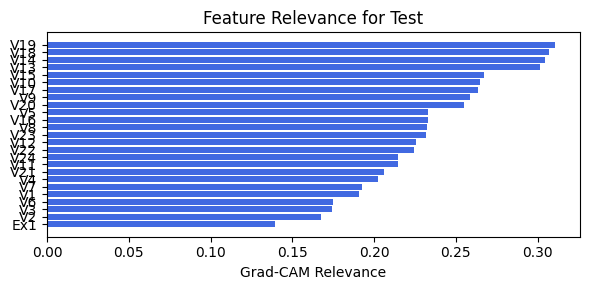

In [86]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, cnn_bottleneck_dim=-1, lamb=0.001, steps=60, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.0.2 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 9.53e-01 |: 100%|█████| 60/60 [02:55<00:00,  2.93s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.5991e-01 at 57 epoch
tensor(0.9533, device='cuda:0')
[[424  13   3   1]
 [ 10 405   5   0]
 [  0   6  59   1]
 [  0   3   9 153]]
M_KAN Relevance: 0.37668734788894653
CNN Relevance: 0.6233125925064087
[('V20', 0.32003933), ('V15', 0.30370182), ('V18', 0.20823841), ('V19', 0.2024498), ('V22', 0.13615209), ('V14', 0.13467984), ('V11', 0.12822667), ('V3', 0.112078816), ('V17', 0.10389059), ('V12', 0.09398824), ('V16', 0.09168437), ('V4', 0.091451906), ('V23', 0.087117516), ('V13', 0.081066065), ('V5', 0.078664176), ('V7', 0.07553181), ('V2', 0.074377134), ('V6', 0.072655305), ('V9', 0.07146375), ('V24', 0.070038855), ('V10', 0.059557714), ('V21', 0.053484872), ('V8', 0.046974584), ('V1', 0.03764748)]


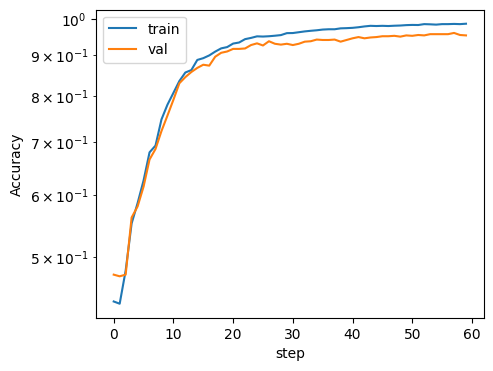

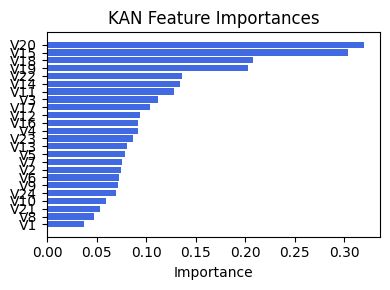

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V14', 0.2735653377910769), ('V13', 0.2655860832604518), ('V19', 0.2600094827754259), ('V18', 0.25584853588814094), ('V16', 0.2535453408625192), ('V17', 0.2502724838446512), ('V12', 0.24012388986208724), ('V11', 0.23024988952139733), ('V9', 0.22480804034360155), ('V8', 0.22475936356654747), ('V20', 0.20192515379904352), ('V7', 0.19397620746993585), ('V15', 0.19188846470248688), ('V10', 0.17261828570083512), ('V6', 0.14310285669409575), ('V21', 0.14205127246926472), ('V23', 0.12664536345737726), ('V24', 0.1261894658829468), ('V22', 0.12458449135850297), ('V3', 0.11134450814513132), ('V4', 0.10953688944829372), ('Ex1', 0.09760398286216314), ('V5', 0.09161704120077167), ('V2', 0.09127186306850557), ('V1', 0.05924449837659397)]


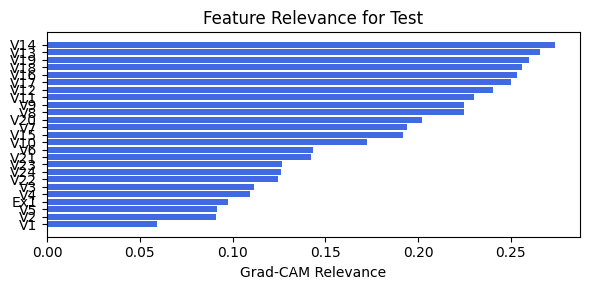

In [87]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, lamb=0.001, steps=60, hidden_dim=64, filename=filename_3, opt_col_val=64)

### 3.0.3 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.90e-01 | val_acc_hybrid: 9.51e-01 |: 100%|█████| 60/60 [02:54<00:00,  2.90s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.5533e-01 at 52 epoch
tensor(0.9368, device='cuda:0')
[[418  18   4   1]
 [ 13 403   3   1]
 [  0  10  54   2]
 [  1   6  10 148]]
M_KAN Relevance: 0.5433046221733093
CNN Relevance: 0.4566953778266907
[('V15', 0.3705935), ('V20', 0.34633207), ('V19', 0.21631126), ('V12', 0.19575493), ('V14', 0.17226158), ('V18', 0.15318422), ('V5', 0.13110459), ('V13', 0.12272599), ('V11', 0.119590476), ('V22', 0.11844872), ('V23', 0.098104015), ('V2', 0.09523395), ('V4', 0.091889635), ('V21', 0.090928994), ('V6', 0.09043409), ('V17', 0.08746307), ('V9', 0.08344419), ('V24', 0.08079795), ('V16', 0.07859995), ('V10', 0.07670185), ('V3', 0.073048145), ('V7', 0.07163921), ('V8', 0.06344254), ('V1', 0.05937014)]


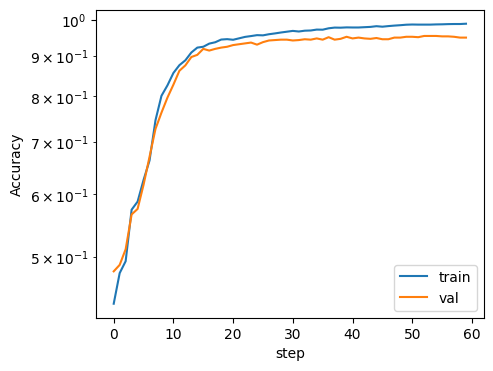

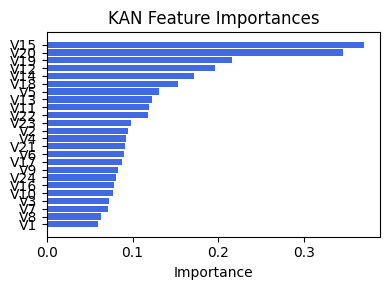

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.38151701383313785), ('V13', 0.37083268754946275), ('V19', 0.36537965498809216), ('V14', 0.3543191823191325), ('V17', 0.3400840564430397), ('V12', 0.3122737386500362), ('V8', 0.30619728824384074), ('V9', 0.2971023284878553), ('V20', 0.29303589268675373), ('V15', 0.2899560067033122), ('V10', 0.2685268121227643), ('V7', 0.25907142711198855), ('V16', 0.25752253376426465), ('V22', 0.24039746988713448), ('V23', 0.233793004667283), ('V5', 0.22807408594753026), ('V24', 0.2264441028695355), ('V21', 0.22505075073435957), ('V11', 0.2235126131686046), ('V6', 0.20811318347524577), ('Ex1', 0.1907803578104281), ('V4', 0.17534076711273797), ('V3', 0.17115165653941627), ('V1', 0.1688747833562317), ('V2', 0.16486007781171486)]


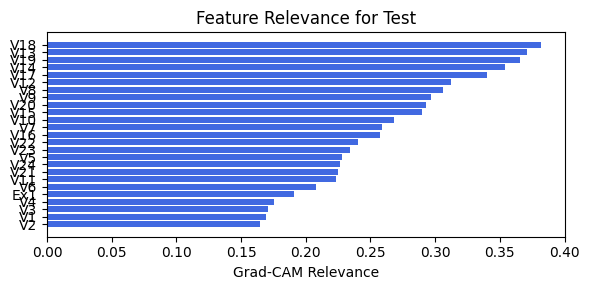

In [88]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, lamb=0.001, steps=60, hidden_dim=64, filename=filename_3, opt_col_val=64)

### 3.0.4 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.74e-01 | val_acc_hybrid: 9.35e-01 |: 100%|█████| 60/60 [03:00<00:00,  3.01s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4044e-01 at 41 epoch
tensor(0.9249, device='cuda:0')
[[407  30   3   1]
 [ 13 399   8   0]
 [  0   8  58   0]
 [  0   1  18 146]]
M_KAN Relevance: 0.2974756360054016
CNN Relevance: 0.7025243639945984
[('V19', 0.25750196), ('V20', 0.25495666), ('V15', 0.24094665), ('V14', 0.17817259), ('V12', 0.16758667), ('V18', 0.16114748), ('V4', 0.15433292), ('V13', 0.1308363), ('V16', 0.11244085), ('V8', 0.11106309), ('V22', 0.10453885), ('V21', 0.099858485), ('V5', 0.09979272), ('V17', 0.0987767), ('V7', 0.09425497), ('V11', 0.08529216), ('V2', 0.08418229), ('V23', 0.08390265), ('V9', 0.08336708), ('V6', 0.08249889), ('V24', 0.082209095), ('V3', 0.07866342), ('V10', 0.06700541), ('V1', 0.05265472)]


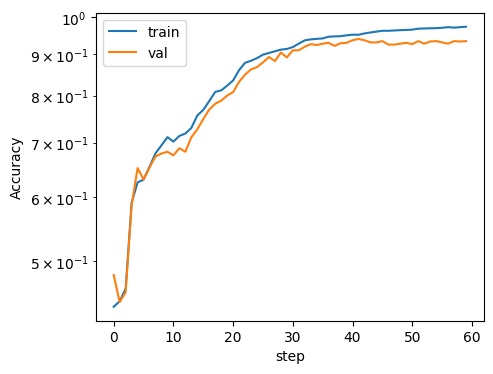

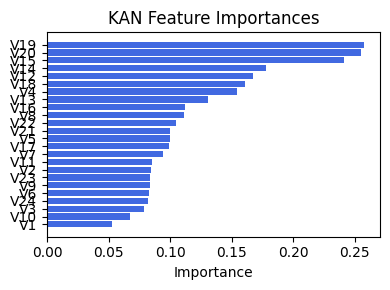

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.32998295700134483), ('V17', 0.3099514272360286), ('V11', 0.29858382859466864), ('V18', 0.29091654420572743), ('V19', 0.28477321696139773), ('V13', 0.2821958742685268), ('V7', 0.2788845104107381), ('V6', 0.27839390385236923), ('V12', 0.25831657050216045), ('V8', 0.24882916291244328), ('V14', 0.23900493044421528), ('V9', 0.20528843461085136), ('V1', 0.17500892336347168), ('V2', 0.15585013221606703), ('V20', 0.14905798323096803), ('V23', 0.14612612935537242), ('V24', 0.14583192821920843), ('V22', 0.14296460295507118), ('V3', 0.13144261143963457), ('V15', 0.12513052227712004), ('V21', 0.1192626129908497), ('V10', 0.11271909910832313), ('V4', 0.10377768371068709), ('Ex1', 0.087304053665937), ('V5', 0.08665178969354051)]


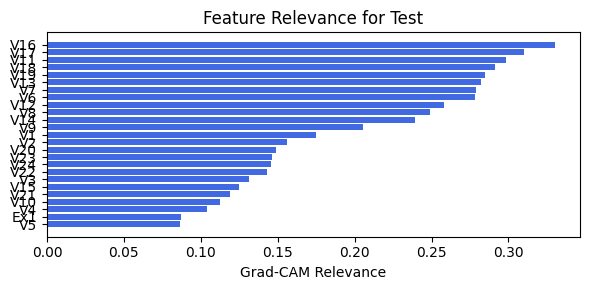

In [89]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, lamb=0.001, steps=60, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.0.5 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 9.27e-01 |: 100%|█████| 60/60 [02:55<00:00,  2.93s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3356e-01 at 44 epoch
tensor(0.9286, device='cuda:0')
[[414  24   2   1]
 [ 18 393   9   0]
 [  1   5  59   1]
 [  0   3  14 148]]
M_KAN Relevance: 0.48897799849510193
CNN Relevance: 0.5110220909118652
[('V19', 0.29905558), ('V20', 0.26227918), ('V15', 0.23105523), ('V18', 0.18661599), ('V12', 0.17079458), ('V14', 0.15092984), ('V17', 0.120643124), ('V13', 0.116658375), ('V11', 0.111347154), ('V16', 0.11106016), ('V23', 0.10643108), ('V2', 0.1050896), ('V22', 0.10043061), ('V4', 0.095867544), ('V21', 0.09356084), ('V7', 0.09266304), ('V10', 0.09196904), ('V24', 0.086795375), ('V9', 0.08595165), ('V6', 0.078151025), ('V3', 0.07717509), ('V8', 0.07397467), ('V5', 0.06661109), ('V1', 0.06187172)]


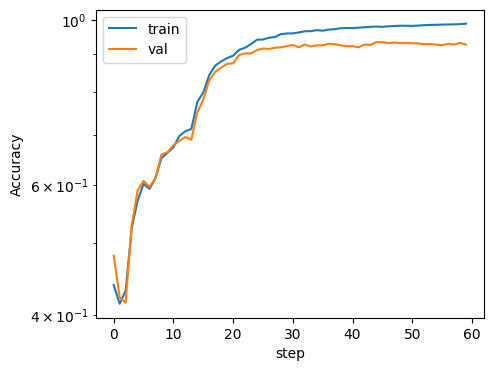

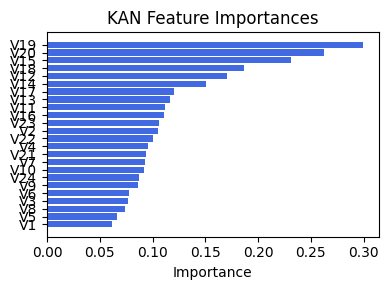

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.4219323153494117), ('V18', 0.37129883618590176), ('V14', 0.3611147081512052), ('V16', 0.3608693904063776), ('V17', 0.35662709026746264), ('V19', 0.34728010346954274), ('V8', 0.3426089898074189), ('V12', 0.3416170527743949), ('V9', 0.3163020493338591), ('V7', 0.312314652340276), ('V11', 0.2940931498143829), ('V6', 0.25919426006989704), ('V15', 0.2195253057457377), ('V20', 0.21603206092512642), ('V10', 0.19641541169240778), ('V23', 0.19039832065829662), ('V24', 0.18741651839596277), ('V22', 0.18082876853174604), ('V3', 0.16936771364588565), ('V2', 0.1678160803258524), ('V4', 0.14953752428293174), ('V21', 0.13285753340240483), ('V1', 0.12963627208777184), ('Ex1', 0.12201991117034172), ('V5', 0.10768776982882834)]


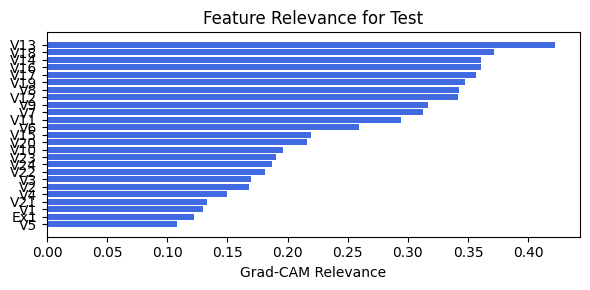

In [90]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, lamb=0.001, steps=60, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.0.6 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.90e-01 | val_acc_hybrid: 9.40e-01 |: 100%|█████| 60/60 [02:59<00:00,  2.99s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4616e-01 at 44 epoch
tensor(0.9267, device='cuda:0')
[[412  26   2   1]
 [ 15 398   7   0]
 [  0   6  60   0]
 [  1   3  19 142]]
M_KAN Relevance: 0.5138117671012878
CNN Relevance: 0.4861881732940674
[('V20', 0.30192167), ('V19', 0.29541522), ('V15', 0.25296736), ('V18', 0.19419084), ('V12', 0.17609315), ('V13', 0.15722683), ('V14', 0.15387082), ('V16', 0.14013638), ('V21', 0.13682304), ('V7', 0.13440973), ('V17', 0.12145426), ('V24', 0.120589755), ('V22', 0.12027681), ('V2', 0.11189605), ('V10', 0.11027473), ('V11', 0.10451986), ('V4', 0.10417117), ('V23', 0.09786785), ('V8', 0.09526607), ('V6', 0.091053694), ('V1', 0.08937457), ('V5', 0.08923738), ('V9', 0.08641754), ('V3', 0.08489357)]


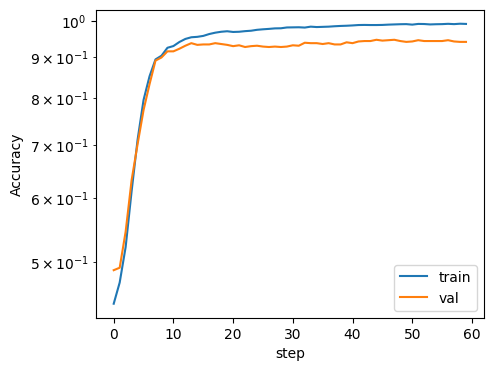

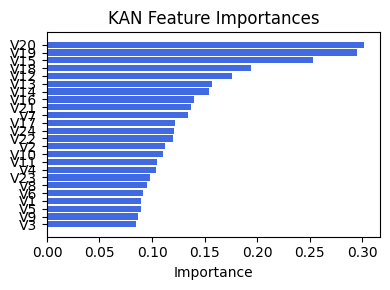

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.35048006257424635), ('V17', 0.3247773936995405), ('V11', 0.31238196617087877), ('V22', 0.30825990866740693), ('V18', 0.29632299230476644), ('V23', 0.28480364469813024), ('V21', 0.2790501090895061), ('V6', 0.25503622249252056), ('V12', 0.24414756218343078), ('V24', 0.2355221647346994), ('V19', 0.21187635054336365), ('V13', 0.20543932193897038), ('V7', 0.199962327547304), ('V8', 0.1687327824563129), ('V1', 0.1489199146111064), ('V14', 0.1461855469043614), ('V2', 0.12024145623147292), ('V9', 0.11363198063724497), ('V3', 0.10486666603689658), ('V5', 0.10482378286924825), ('V4', 0.10252925931046855), ('V20', 0.10100553458858155), ('V15', 0.09679674911026784), ('Ex1', 0.07756344944177576), ('V10', 0.07507839867579831)]


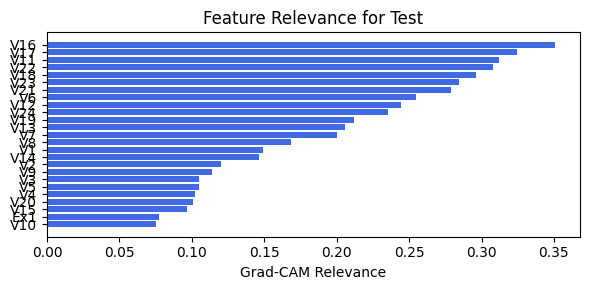

In [91]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, lamb=0.001, steps=60, hidden_dim=16, filename=filename_3, opt_col_val=16)

### 3.0.7 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.90e-01 | val_acc_hybrid: 9.40e-01 |: 100%|█████| 60/60 [02:59<00:00,  2.99s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4616e-01 at 44 epoch
tensor(0.9267, device='cuda:0')
[[412  26   2   1]
 [ 15 398   7   0]
 [  0   6  60   0]
 [  1   3  19 142]]
M_KAN Relevance: 0.5138117671012878
CNN Relevance: 0.4861881732940674
[('V20', 0.30192167), ('V19', 0.29541522), ('V15', 0.25296736), ('V18', 0.19419084), ('V12', 0.17609315), ('V13', 0.15722683), ('V14', 0.15387082), ('V16', 0.14013638), ('V21', 0.13682304), ('V7', 0.13440973), ('V17', 0.12145426), ('V24', 0.120589755), ('V22', 0.12027681), ('V2', 0.11189605), ('V10', 0.11027473), ('V11', 0.10451986), ('V4', 0.10417117), ('V23', 0.09786785), ('V8', 0.09526607), ('V6', 0.091053694), ('V1', 0.08937457), ('V5', 0.08923738), ('V9', 0.08641754), ('V3', 0.08489357)]


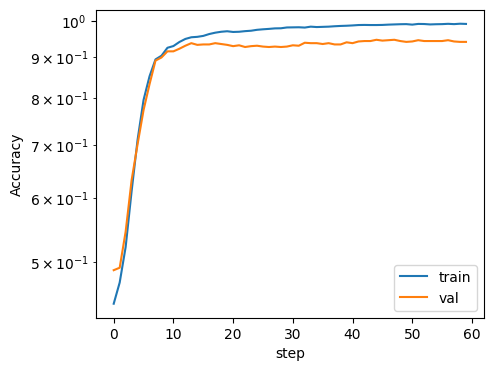

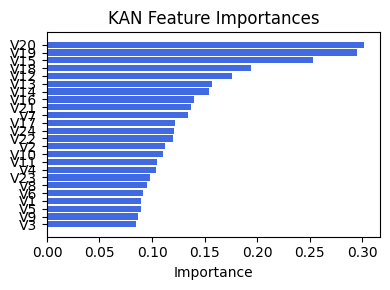

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.35048006257424635), ('V17', 0.3247773936995405), ('V11', 0.31238196617087877), ('V22', 0.30825990866740693), ('V18', 0.29632299230476644), ('V23', 0.28480364469813024), ('V21', 0.2790501090895061), ('V6', 0.25503622249252056), ('V12', 0.24414756218343078), ('V24', 0.2355221647346994), ('V19', 0.21187635054336365), ('V13', 0.20543932193897038), ('V7', 0.199962327547304), ('V8', 0.1687327824563129), ('V1', 0.1489199146111064), ('V14', 0.1461855469043614), ('V2', 0.12024145623147292), ('V9', 0.11363198063724497), ('V3', 0.10486666603689658), ('V5', 0.10482378286924825), ('V4', 0.10252925931046855), ('V20', 0.10100553458858155), ('V15', 0.09679674911026784), ('Ex1', 0.07756344944177576), ('V10', 0.07507839867579831)]


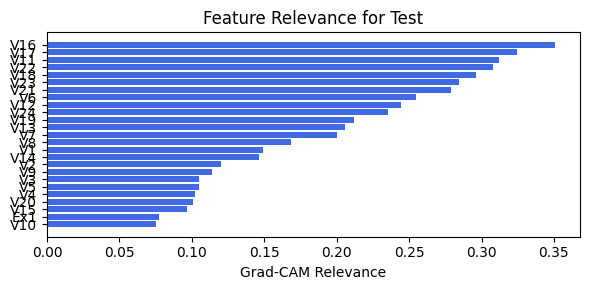

In [92]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, lamb=0.001, steps=60, hidden_dim=16, filename=filename_3, opt_col_val=16)

### 3.0.8 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.94e-01 | val_acc_hybrid: 9.08e-01 |: 100%|█████| 60/60 [02:46<00:00,  2.77s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.2898e-01 at 17 epoch
tensor(0.9240, device='cuda:0')
[[415  22   3   1]
 [ 12 395  13   0]
 [  1   5  55   5]
 [  0   4  17 144]]
M_KAN Relevance: 0.7979034781455994
CNN Relevance: 0.20209653675556183
[('V15', 0.3008329), ('V20', 0.2577886), ('V19', 0.2067829), ('V18', 0.19984631), ('V13', 0.19790302), ('V21', 0.17029917), ('V14', 0.16769807), ('V22', 0.16442671), ('V24', 0.15460679), ('V12', 0.15088138), ('V23', 0.12499781), ('V16', 0.118312865), ('V11', 0.11803382), ('V17', 0.11089357), ('V7', 0.10842419), ('V6', 0.10440838), ('V9', 0.09961697), ('V4', 0.09805351), ('V10', 0.09206357), ('V1', 0.09186262), ('V5', 0.08718609), ('V3', 0.0808848), ('V2', 0.079907455), ('V8', 0.07292737)]


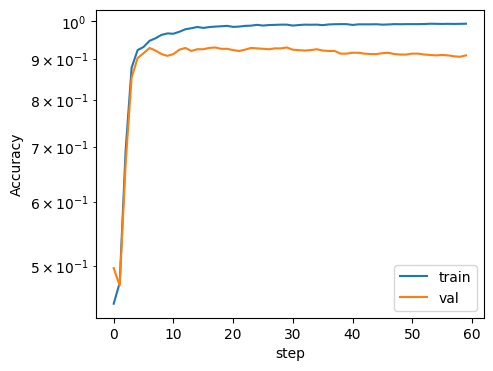

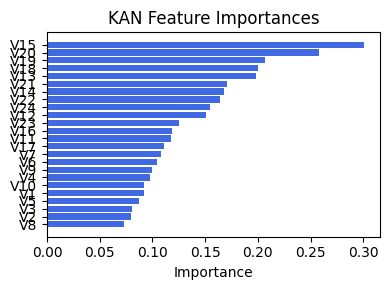

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.27697380505981534), ('V17', 0.259933194767533), ('V21', 0.24944234166118487), ('V22', 0.2493324733842224), ('V14', 0.24555748091732799), ('V12', 0.24028248621393702), ('V18', 0.23457216911082046), ('V19', 0.22901714757038366), ('V9', 0.2285918151939948), ('V3', 0.2262142268243887), ('V7', 0.21537797373705442), ('V4', 0.20327453664296108), ('V8', 0.20225093055461793), ('V20', 0.19007549677278124), ('V11', 0.18657799498592234), ('V16', 0.18201507444335374), ('V23', 0.17738524605664055), ('V10', 0.16726488082689345), ('V5', 0.16441571665368412), ('V24', 0.1604503545532303), ('V2', 0.15919395965195293), ('V6', 0.15053427608076256), ('V15', 0.1428650134320788), ('Ex1', 0.10414962459518166), ('V1', 0.08988567410989202)]


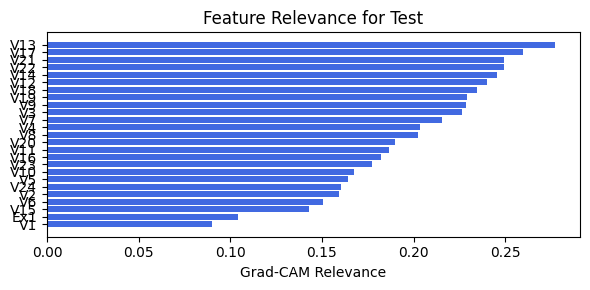

In [93]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, lamb=0.001, steps=60, hidden_dim=8, filename=filename_3, opt_col_val=8)

### 3.0.9 width=[24, 12, 1], grid=8, lamb=0.001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.95e-01 | val_acc_hybrid: 9.20e-01 |: 100%|█████| 60/60 [02:45<00:00,  2.76s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3356e-01 at 7 epoch
tensor(0.9231, device='cuda:0')
[[415  23   2   1]
 [  8 397  15   0]
 [  0  12  53   1]
 [  0   6  16 143]]
M_KAN Relevance: 0.5916622281074524
CNN Relevance: 0.4083377718925476
[('V19', 0.24745332), ('V20', 0.22491875), ('V15', 0.208664), ('V21', 0.17672853), ('V12', 0.16130649), ('V14', 0.15914863), ('V13', 0.14774184), ('V18', 0.1398657), ('V7', 0.13372086), ('V22', 0.12936667), ('V16', 0.12921052), ('V11', 0.12878346), ('V4', 0.12360792), ('V23', 0.11951561), ('V10', 0.10111992), ('V5', 0.09552947), ('V1', 0.089332), ('V8', 0.089203864), ('V24', 0.086449735), ('V17', 0.07925543), ('V9', 0.07830006), ('V6', 0.07117781), ('V2', 0.06412419), ('V3', 0.054797105)]


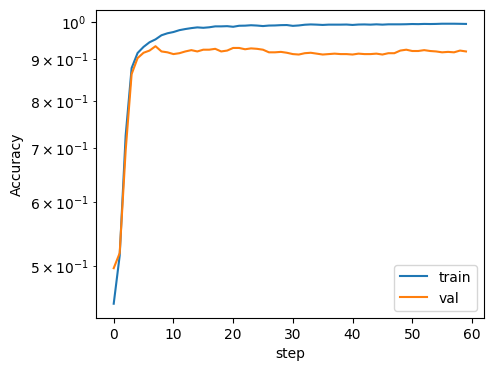

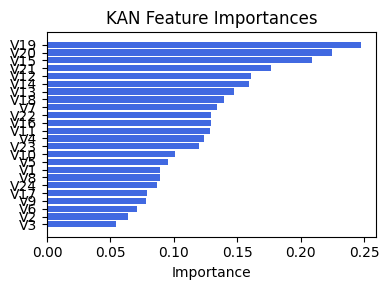

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V8', 0.38957695966487355), ('V13', 0.36125503015519383), ('V7', 0.34143729559840946), ('V6', 0.3132588052946261), ('V3', 0.3073950298492028), ('V9', 0.29920244336473856), ('V12', 0.2955969550595057), ('V16', 0.2903010863512277), ('V17', 0.2875711523297485), ('V11', 0.2840866705204122), ('V18', 0.28108006089042736), ('V2', 0.25453459543349555), ('V14', 0.249985423545232), ('V19', 0.24343103846584552), ('V15', 0.22958732409210408), ('V20', 0.21785956430401365), ('V4', 0.2141965066874922), ('V1', 0.20728307103837781), ('V10', 0.1835669848135298), ('Ex1', 0.16793538668685626), ('V21', 0.16348763844704853), ('V22', 0.15262130446175126), ('V23', 0.14840782061620325), ('V5', 0.1331076140890511), ('V24', 0.12848153656866185)]


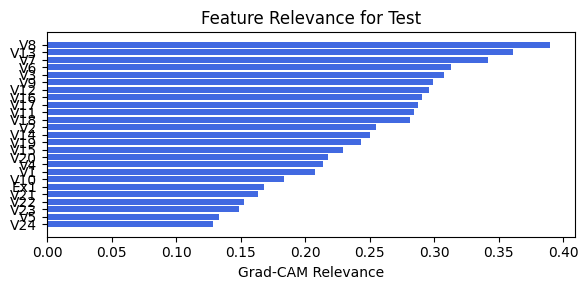

In [94]:
train_and_plot_relevance(Model3_3, kan_neurons=12, kan_grid=8, lamb=0.001, steps=60, hidden_dim=8, filename=filename_3, opt_col_val=8)

## 3.1. width=[24, 5, 1], grid=7, lamb=1e-07

### 3.1.0 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.73e-01 | val_acc_hybrid: 9.53e-01 |: 100%|█████| 60/60 [02:44<00:00,  2.74s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.5647e-01 at 58 epoch
tensor(0.9405, device='cuda:0')
[[414  21   4   2]
 [  8 408   2   2]
 [  0   7  59   0]
 [  1   6  12 146]]
M_KAN Relevance: 0.0725710391998291
CNN Relevance: 0.9274289608001709
[('V15', 0.37585536), ('V19', 0.27140024), ('V20', 0.23241523), ('V24', 0.2075872), ('V18', 0.1829311), ('V11', 0.15322454), ('V14', 0.14350502), ('V9', 0.13949947), ('V7', 0.13290557), ('V16', 0.12713176), ('V12', 0.12495625), ('V17', 0.12473623), ('V22', 0.112711124), ('V10', 0.11146177), ('V5', 0.10816858), ('V2', 0.10253873), ('V8', 0.09764173), ('V13', 0.092282176), ('V3', 0.08992048), ('V4', 0.08533675), ('V23', 0.077178866), ('V21', 0.0744498), ('V6', 0.0582078), ('V1', 0.057965912)]


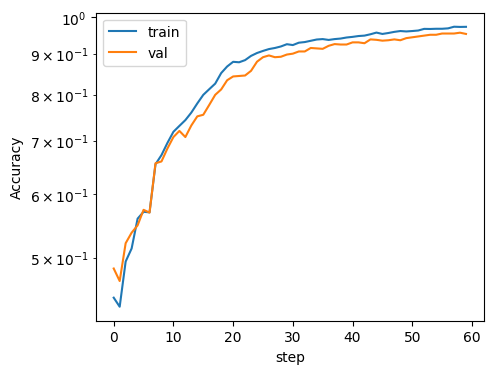

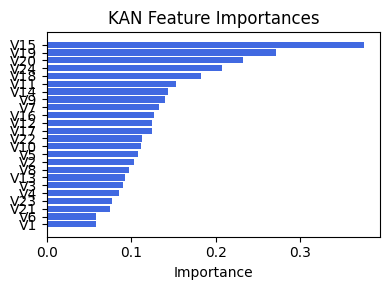

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.33900856302091437), ('V13', 0.33889755913211655), ('V15', 0.3188205095755973), ('V18', 0.30640136011711566), ('V8', 0.30407107872363937), ('V17', 0.27782055682028495), ('V12', 0.27375021085443774), ('V10', 0.2723985049184), ('V11', 0.27184971740521363), ('V7', 0.26917399578961676), ('V9', 0.2632040322036312), ('V16', 0.25674912847496223), ('V19', 0.24991468770162228), ('V14', 0.24386164792249407), ('V3', 0.24021441536671853), ('V6', 0.2263329723660558), ('V2', 0.210354065567913), ('V4', 0.19828025902433394), ('V5', 0.1837902622910239), ('V1', 0.1776510701217639), ('Ex1', 0.15982845532788892), ('V21', 0.1282810185357881), ('V23', 0.11203509360941777), ('V22', 0.10893289130208791), ('V24', 0.09605110019291159)]


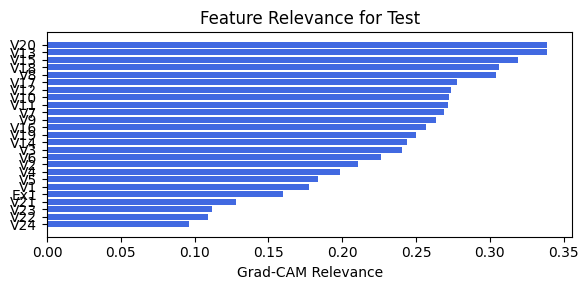

In [95]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.1.1 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.68e-01 | val_acc_hybrid: 9.46e-01 |: 100%|█████| 60/60 [02:46<00:00,  2.77s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4845e-01 at 58 epoch
tensor(0.9432, device='cuda:0')
[[422  15   4   0]
 [ 13 404   2   1]
 [  0   6  58   2]
 [  0   8  11 146]]
M_KAN Relevance: 0.048109106719493866
CNN Relevance: 0.9518909454345703
[('V15', 0.36468855), ('V20', 0.31488165), ('V19', 0.24017611), ('V3', 0.17220043), ('V12', 0.17019878), ('V18', 0.16614044), ('V14', 0.15886298), ('V9', 0.15487666), ('V24', 0.15048075), ('V17', 0.11799321), ('V8', 0.11703235), ('V4', 0.11398132), ('V23', 0.1077567), ('V13', 0.10715975), ('V21', 0.106833175), ('V7', 0.10642208), ('V10', 0.10510085), ('V11', 0.09424783), ('V5', 0.0895131), ('V16', 0.088174514), ('V22', 0.08123484), ('V2', 0.0777316), ('V6', 0.0577613), ('V1', 0.04695967)]


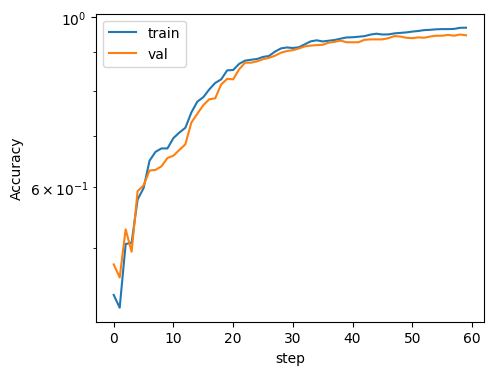

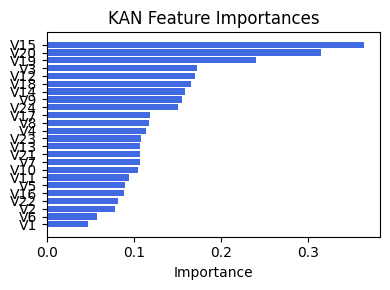

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.332625252621772), ('V14', 0.3305039214067956), ('V19', 0.3030672459930289), ('V18', 0.2978578135043657), ('V9', 0.28465308367800063), ('V23', 0.28196116992303993), ('V24', 0.273186862846398), ('V8', 0.2708694818369949), ('V12', 0.26452879333120666), ('V20', 0.26098986901345533), ('V17', 0.26004135536681094), ('V15', 0.2514415904490453), ('V22', 0.22953507087502645), ('V7', 0.22598933144438424), ('Ex1', 0.21600687529023357), ('V10', 0.2100777229474987), ('V4', 0.18674291202198498), ('V3', 0.16888999353434153), ('V2', 0.16246327557493362), ('V16', 0.13917896209150657), ('V11', 0.13096377634781928), ('V5', 0.12465415220186771), ('V21', 0.1103261223859098), ('V6', 0.11018935142176119), ('V1', 0.0930086629310615)]


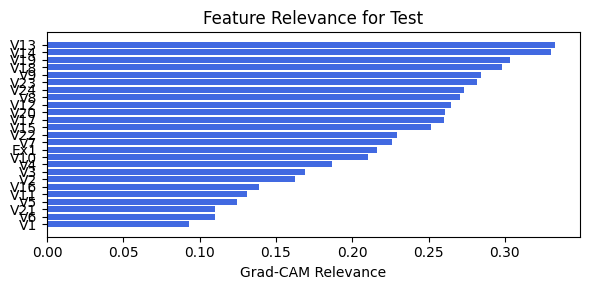

In [96]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.1.2 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 9.46e-01 |: 100%|█████| 60/60 [02:43<00:00,  2.73s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4845e-01 at 54 epoch
tensor(0.9368, device='cuda:0')
[[416  21   3   1]
 [ 11 401   8   0]
 [  1   5  59   1]
 [  1   5  12 147]]
M_KAN Relevance: 0.08834172785282135
CNN Relevance: 0.9116582870483398
[('V15', 0.4016182), ('V24', 0.24369001), ('V19', 0.22037578), ('V3', 0.21620646), ('V20', 0.21043387), ('V18', 0.19303656), ('V2', 0.18901876), ('V12', 0.18672943), ('V14', 0.18503347), ('V10', 0.16053326), ('V22', 0.15354435), ('V17', 0.14796348), ('V6', 0.13776694), ('V11', 0.13749416), ('V8', 0.12132424), ('V1', 0.11903753), ('V21', 0.11408973), ('V23', 0.1077981), ('V16', 0.1060669), ('V13', 0.10271803), ('V9', 0.10070806), ('V4', 0.09943747), ('V7', 0.09711497), ('V5', 0.06592761)]


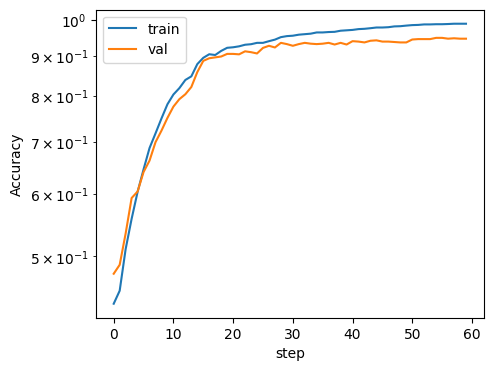

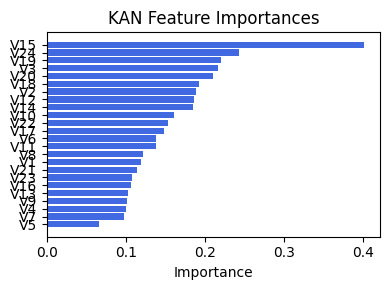

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.3532464027595826), ('V14', 0.3266138099267228), ('V20', 0.2822840018854596), ('V9', 0.2793155344512916), ('V13', 0.27379075172198414), ('V24', 0.26954285314607596), ('V18', 0.26910109567089446), ('V8', 0.25929536426464617), ('V15', 0.25569711611476187), ('V17', 0.25432043127716414), ('V23', 0.23896110957288422), ('V22', 0.223970308097352), ('V12', 0.22190609088603785), ('Ex1', 0.22143538890960263), ('V7', 0.220131890302289), ('V3', 0.2043286242656145), ('V10', 0.19561191214805668), ('V4', 0.192251481025868), ('V2', 0.18858687862805146), ('V6', 0.14185185137905185), ('V5', 0.13632220006542373), ('V1', 0.12794749892838972), ('V16', 0.12786194635803677), ('V11', 0.11815760439005829), ('V21', 0.11298536930158935)]


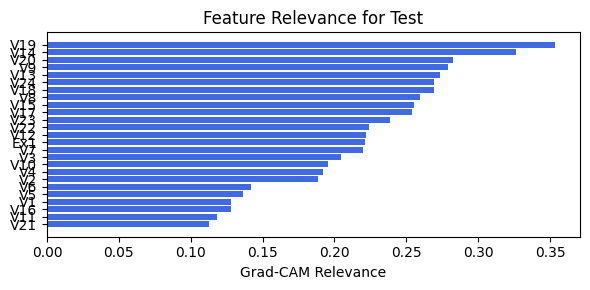

In [97]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=64, filename=filename_3, opt_col_val=64)

### 3.1.3 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 9.40e-01 |: 100%|█████| 60/60 [02:42<00:00,  2.72s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4845e-01 at 53 epoch
tensor(0.9423, device='cuda:0')
[[422  16   2   1]
 [  8 404   8   0]
 [  1   6  56   3]
 [  2   5  11 147]]
M_KAN Relevance: 0.10353317856788635
CNN Relevance: 0.8964667916297913
[('V15', 0.44187117), ('V19', 0.277698), ('V20', 0.22616315), ('V5', 0.19735579), ('V3', 0.19561143), ('V24', 0.18225498), ('V14', 0.16238265), ('V11', 0.15961681), ('V9', 0.15780726), ('V22', 0.1551204), ('V12', 0.15186337), ('V18', 0.14015484), ('V13', 0.134795), ('V23', 0.12818749), ('V17', 0.1263046), ('V16', 0.12280356), ('V1', 0.117489934), ('V2', 0.11515478), ('V10', 0.10534574), ('V8', 0.100611165), ('V6', 0.0978201), ('V7', 0.09433053), ('V21', 0.08792695), ('V4', 0.0859981)]


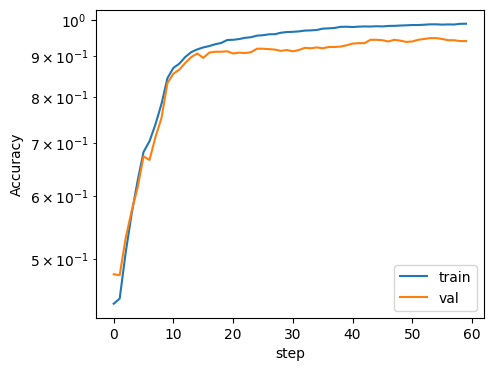

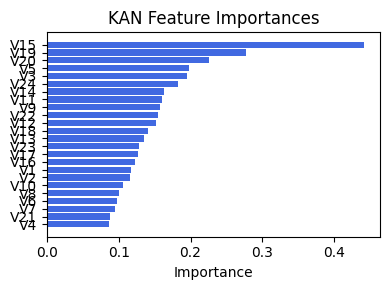

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V8', 0.3053782191417511), ('V16', 0.3013274130797258), ('V7', 0.2963221152987346), ('V12', 0.2862543884181496), ('V17', 0.2826082791813057), ('V13', 0.2814571389337002), ('V11', 0.2776077900798355), ('V6', 0.2730007350647401), ('V9', 0.2716937226840532), ('V14', 0.26964012352678707), ('V18', 0.24452228798236653), ('V22', 0.23618960479155418), ('V19', 0.23459815647193588), ('V3', 0.22268831413904472), ('V2', 0.21907472328155816), ('V23', 0.2110304363632034), ('V24', 0.2077226967618723), ('V4', 0.19898393937751863), ('V1', 0.19851565076543667), ('V20', 0.18876581703235779), ('V21', 0.18022904205182907), ('V10', 0.17649450196696198), ('V15', 0.17610662139982247), ('V5', 0.14901753818325425), ('Ex1', 0.12451761514022516)]


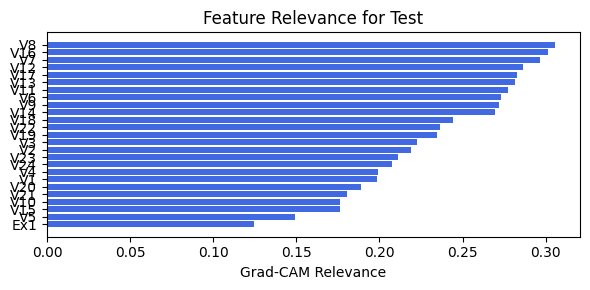

In [98]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=64, filename=filename_3, opt_col_val=64)

### 3.1.4 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.69e-01 | val_acc_hybrid: 9.27e-01 |: 100%|█████| 60/60 [02:46<00:00,  2.78s/it]

saving model version 0.1
✅ Best validation Accuracy: 9.3356e-01 at 51 epoch
tensor(0.9267, device='cuda:0')
[[415  22   2   2]
 [ 13 404   2   1]
 [  0   7  56   3]
 [  0   7  21 137]]
M_KAN Relevance: 0.11617153137922287
CNN Relevance: 0.8838284611701965
[('V15', 0.36540884), ('V14', 0.30460328), ('V19', 0.2629643), ('V24', 0.22623172), ('V12', 0.20859455), ('V20', 0.20728354), ('V11', 0.18467572), ('V9', 0.17066263), ('V17', 0.16700299), ('V2', 0.16438349), ('V8', 0.14868139), ('V22', 0.13741516), ('V5', 0.13615303), ('V18', 0.13257469), ('V3', 0.13019574), ('V7', 0.117589675), ('V10', 0.1095524), ('V4', 0.10589772), ('V16', 0.105196215), ('V13', 0.08363428), ('V23', 0.07725408), ('V1', 0.07338043), ('V6', 0.06593869), ('V21', 0.051543392)]


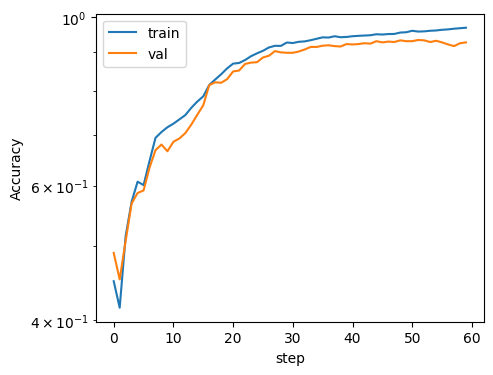

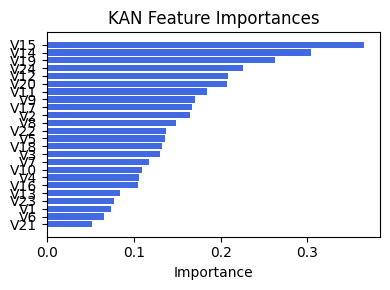

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V24', 0.3118023910156631), ('V22', 0.28617931143358316), ('V23', 0.27564200972426073), ('V16', 0.18611624585578668), ('V13', 0.18257608059721217), ('V17', 0.18185276567021572), ('V21', 0.1792402043974617), ('V18', 0.1765023040880096), ('Ex1', 0.16735703303140073), ('V8', 0.16151823299201784), ('V14', 0.15718700554377088), ('V9', 0.1564198667754501), ('V19', 0.15478601956960913), ('V12', 0.15278546579374894), ('V7', 0.14817311225272203), ('V3', 0.1439916652803405), ('V4', 0.13617794435203873), ('V11', 0.1266243700970019), ('V2', 0.12352286407913331), ('V6', 0.11730159702193761), ('V15', 0.11395201790361877), ('V20', 0.1071499419940065), ('V10', 0.09732988689025467), ('V5', 0.09142698853905201), ('V1', 0.09042803489737107)]


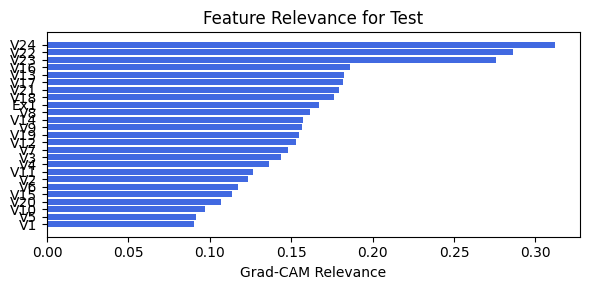

In [99]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.1.5 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.69e-01 | val_acc_hybrid: 9.27e-01 |: 100%|█████| 60/60 [02:47<00:00,  2.79s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3356e-01 at 51 epoch
tensor(0.9267, device='cuda:0')
[[415  22   2   2]
 [ 13 404   2   1]
 [  0   7  56   3]
 [  0   7  21 137]]
M_KAN Relevance: 0.11617153137922287
CNN Relevance: 0.8838284611701965
[('V15', 0.36540884), ('V14', 0.30460328), ('V19', 0.2629643), ('V24', 0.22623172), ('V12', 0.20859455), ('V20', 0.20728354), ('V11', 0.18467572), ('V9', 0.17066263), ('V17', 0.16700299), ('V2', 0.16438349), ('V8', 0.14868139), ('V22', 0.13741516), ('V5', 0.13615303), ('V18', 0.13257469), ('V3', 0.13019574), ('V7', 0.117589675), ('V10', 0.1095524), ('V4', 0.10589772), ('V16', 0.105196215), ('V13', 0.08363428), ('V23', 0.07725408), ('V1', 0.07338043), ('V6', 0.06593869), ('V21', 0.051543392)]


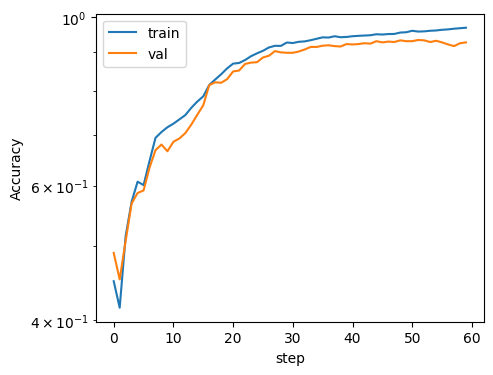

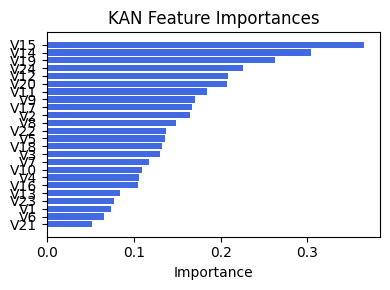

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V24', 0.3118023910156631), ('V22', 0.28617931143358316), ('V23', 0.27564200972426073), ('V16', 0.18611624585578668), ('V13', 0.18257608059721217), ('V17', 0.18185276567021572), ('V21', 0.1792402043974617), ('V18', 0.1765023040880096), ('Ex1', 0.16735703303140073), ('V8', 0.16151823299201784), ('V14', 0.15718700554377088), ('V9', 0.1564198667754501), ('V19', 0.15478601956960913), ('V12', 0.15278546579374894), ('V7', 0.14817311225272203), ('V3', 0.1439916652803405), ('V4', 0.13617794435203873), ('V11', 0.1266243700970019), ('V2', 0.12352286407913331), ('V6', 0.11730159702193761), ('V15', 0.11395201790361877), ('V20', 0.1071499419940065), ('V10', 0.09732988689025467), ('V5', 0.09142698853905201), ('V1', 0.09042803489737107)]


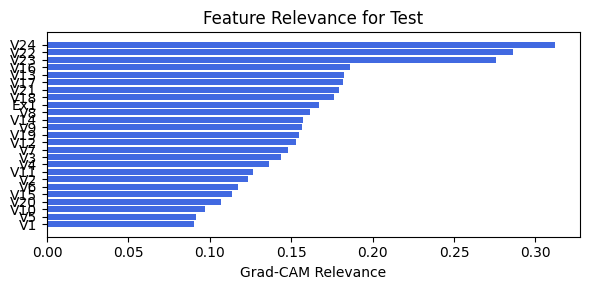

In [100]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.1.6 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.93e-01 | val_acc_hybrid: 9.51e-01 |: 100%|█████| 60/60 [02:38<00:00,  2.64s/it]

saving model version 0.1
✅ Best validation Accuracy: 9.5991e-01 at 48 epoch
tensor(0.9441, device='cuda:0')
[[420  15   3   3]
 [  9 407   3   1]
 [  0   6  59   1]
 [  9   1  10 145]]
M_KAN Relevance: 0.09614477306604385
CNN Relevance: 0.9038552045822144
[('V15', 0.47236663), ('V19', 0.25795814), ('V20', 0.2410132), ('V11', 0.1727029), ('V14', 0.1688692), ('V18', 0.14698122), ('V24', 0.14197557), ('V12', 0.13734722), ('V10', 0.11626085), ('V9', 0.11397918), ('V5', 0.11384499), ('V7', 0.10926669), ('V6', 0.107155524), ('V22', 0.100386515), ('V4', 0.09078305), ('V13', 0.085497044), ('V17', 0.084897615), ('V1', 0.08408055), ('V23', 0.08058458), ('V3', 0.0766498), ('V16', 0.07635774), ('V2', 0.0745127), ('V21', 0.06732382), ('V8', 0.05529688)]


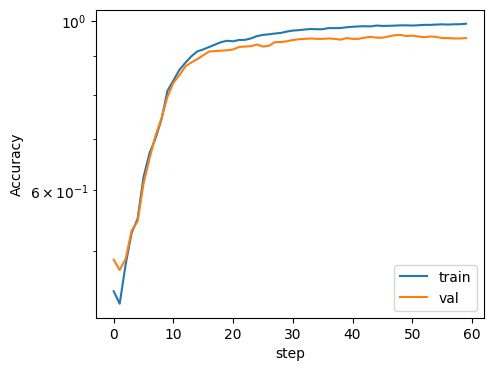

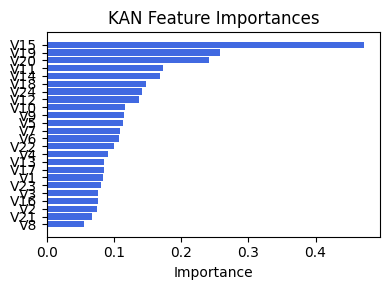

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.20721266247946316), ('V15', 0.19473723008386082), ('V24', 0.17176811723491636), ('V23', 0.17116976697437103), ('V10', 0.1669569233050914), ('V16', 0.162422979745995), ('V6', 0.16115747749469744), ('V3', 0.15521923922242822), ('Ex1', 0.14927790169009653), ('V22', 0.1444184930342456), ('V2', 0.1381844653521275), ('V11', 0.13602145717004033), ('V8', 0.13025988290727525), ('V1', 0.12743378244409714), ('V21', 0.1248767699476131), ('V9', 0.11833503961243767), ('V7', 0.1178169170416501), ('V14', 0.11505668960278641), ('V4', 0.11240456536886616), ('V19', 0.10576635998639729), ('V12', 0.08523702723792441), ('V17', 0.08230274909426673), ('V13', 0.0819018383066071), ('V5', 0.07763164520716541), ('V18', 0.07712498164885838)]


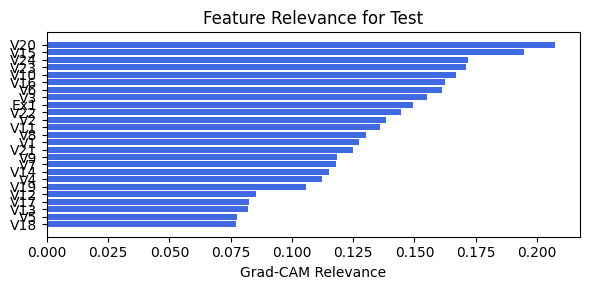

In [101]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=16, filename=filename_3, opt_col_val=16)

### 3.1.7 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.64e-01 | val_acc_hybrid: 9.34e-01 |: 100%|█████| 60/60 [02:44<00:00,  2.74s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3700e-01 at 53 epoch
tensor(0.9405, device='cuda:0')
[[425   9   5   2]
 [ 17 400   1   2]
 [  1   7  56   2]
 [  2   1  16 146]]
M_KAN Relevance: 0.15225599706172943
CNN Relevance: 0.8477440476417542
[('V15', 0.37532243), ('V14', 0.22717436), ('V19', 0.21429555), ('V5', 0.20150033), ('V11', 0.19616869), ('V13', 0.18874283), ('V18', 0.17513464), ('V20', 0.1744877), ('V8', 0.15827028), ('V24', 0.13947427), ('V2', 0.1313234), ('V4', 0.121746115), ('V6', 0.11222439), ('V23', 0.11049636), ('V12', 0.108517125), ('V9', 0.10762954), ('V16', 0.10258212), ('V7', 0.100113906), ('V17', 0.09029076), ('V1', 0.08943029), ('V22', 0.08356813), ('V21', 0.07453744), ('V3', 0.072278075), ('V10', 0.051449817)]


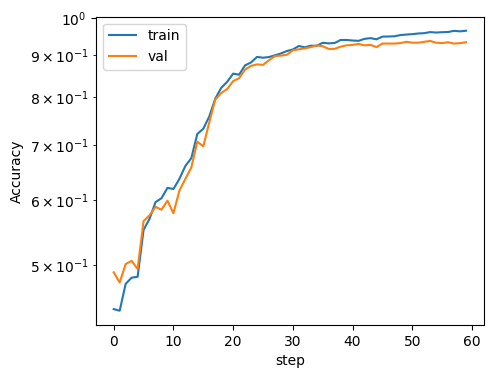

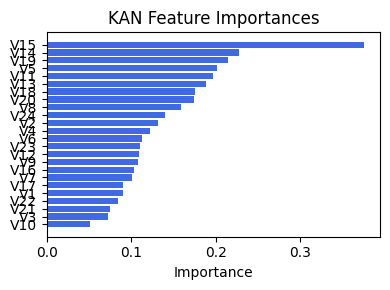

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.3884723325905598), ('V18', 0.37035828546984223), ('V14', 0.33742719679518013), ('V13', 0.3092169402100678), ('V24', 0.3027322255093101), ('V17', 0.30241125511114686), ('V23', 0.29292903979072876), ('V22', 0.27083901496094076), ('V9', 0.2490251169592439), ('V12', 0.23655387849254653), ('V8', 0.2266177562536201), ('V20', 0.22437072246352077), ('Ex1', 0.21022906118997817), ('V15', 0.20036203448422724), ('V7', 0.18316989772652034), ('V10', 0.15051261957164686), ('V16', 0.12205036269508807), ('V11', 0.1029496237460723), ('V21', 0.101942427885847), ('V4', 0.10095451499511157), ('V3', 0.08024487768884833), ('V6', 0.07933972435575891), ('V5', 0.07096040617785887), ('V2', 0.06278043375900096), ('V1', 0.03215699888207029)]


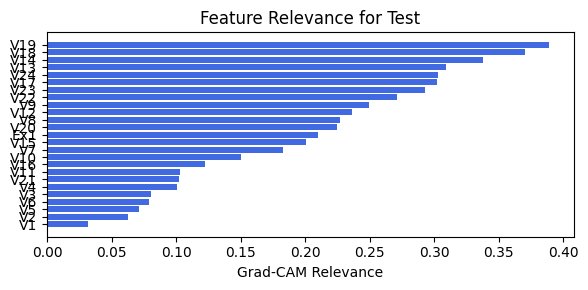

In [102]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=16, filename=filename_3, opt_col_val=16)

### 3.1.8 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.00e-01 | val_acc_hybrid: 8.77e-01 |: 100%|█████| 60/60 [02:43<00:00,  2.73s/it]


saving model version 0.1
✅ Best validation Accuracy: 8.7973e-01 at 56 epoch
tensor(0.8745, device='cuda:0')
[[383  54   4   0]
 [ 16 391  13   0]
 [  0  10  54   2]
 [  1   1  36 127]]
M_KAN Relevance: 0.03354061767458916
CNN Relevance: 0.9664593935012817
[('V5', 0.2811217), ('V2', 0.24217573), ('V19', 0.23222259), ('V14', 0.23181568), ('V11', 0.21812935), ('V9', 0.21415411), ('V20', 0.19802082), ('V7', 0.19463308), ('V8', 0.19451205), ('V24', 0.19209538), ('V10', 0.18467446), ('V3', 0.18083766), ('V15', 0.17705283), ('V4', 0.17372629), ('V23', 0.1700801), ('V6', 0.15479769), ('V13', 0.14672293), ('V1', 0.11947367), ('V18', 0.116912425), ('V17', 0.11505558), ('V16', 0.11451699), ('V12', 0.11402924), ('V22', 0.09194517), ('V21', 0.08339595)]


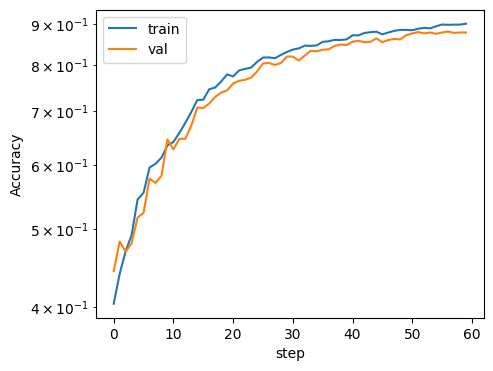

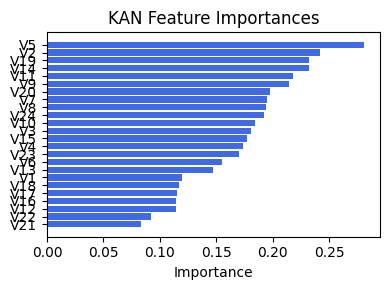

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V15', 0.33203142066177016), ('V20', 0.2844076644605893), ('V19', 0.251270151306916), ('V14', 0.24930338605373192), ('V16', 0.24196404606232386), ('V8', 0.23814236243522383), ('V13', 0.230827533314948), ('V17', 0.22749173950206492), ('V3', 0.2217142297271187), ('V11', 0.215120867512672), ('V9', 0.21225898040504015), ('Ex1', 0.21066161810444228), ('V18', 0.2071502843621505), ('V10', 0.2057258962952771), ('V7', 0.2030601501485632), ('V21', 0.20091218553036694), ('V22', 0.19506126488024844), ('V12', 0.19096238411432187), ('V24', 0.1907784237429331), ('V2', 0.17559607515378403), ('V23', 0.17496428588690452), ('V6', 0.17224444735194164), ('V4', 0.1552454801965743), ('V1', 0.15445554313607449), ('V5', 0.11694948999703451)]


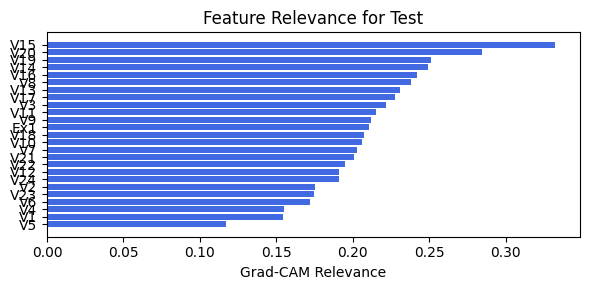

In [103]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=8, filename=filename_3, opt_col_val=8)

### 3.1.9 width=[24, 5, 1], grid=7, lamb=1e-07 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.85e-01 | val_acc_hybrid: 8.87e-01 |: 100%|█████| 60/60 [02:41<00:00,  2.68s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.0149e-01 at 23 epoch
tensor(0.8938, device='cuda:0')
[[399  36   5   1]
 [ 18 386  16   0]
 [  0  10  54   2]
 [  1   2  25 137]]
M_KAN Relevance: 0.03970876336097717
CNN Relevance: 0.9602912664413452
[('V5', 0.2595336), ('V19', 0.2545173), ('V15', 0.23257457), ('V14', 0.22023197), ('V20', 0.21685421), ('V11', 0.21074955), ('V9', 0.20923023), ('V3', 0.20531867), ('V2', 0.20216656), ('V24', 0.19897673), ('V23', 0.1752738), ('V4', 0.1630149), ('V10', 0.16185106), ('V7', 0.15699147), ('V16', 0.14952505), ('V8', 0.1458524), ('V12', 0.1376478), ('V1', 0.13703097), ('V22', 0.13651434), ('V18', 0.12007387), ('V13', 0.11837622), ('V17', 0.11533203), ('V6', 0.112998776), ('V21', 0.076424025)]


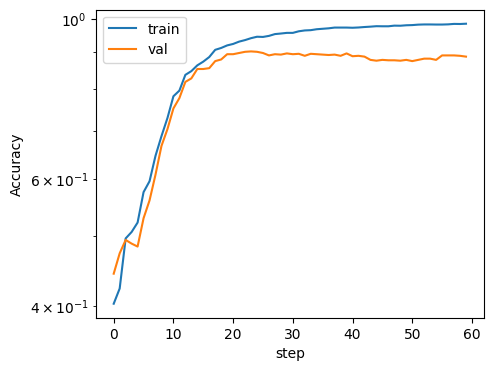

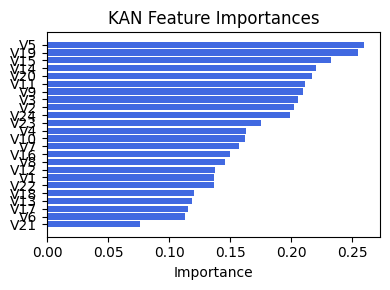

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V15', 0.3231332753989641), ('V20', 0.2933549237678119), ('V19', 0.2465185500254864), ('V22', 0.23384938954607343), ('V24', 0.23293841084551575), ('V23', 0.22555638783995782), ('V17', 0.22082602481202893), ('V14', 0.21634767812979705), ('V16', 0.21059006159191415), ('V18', 0.2069896250080928), ('V21', 0.20456263889321571), ('Ex1', 0.20190754554083543), ('V10', 0.19438863138656992), ('V3', 0.17951692157174753), ('V9', 0.1714915866438317), ('V11', 0.16410341237222537), ('V8', 0.15843980666226337), ('V12', 0.1555342971504625), ('V7', 0.15416437751938603), ('V6', 0.15343763952834652), ('V13', 0.15049949914574984), ('V2', 0.14387003612632776), ('V4', 0.1279044766861761), ('V1', 0.12534343685482058), ('V5', 0.10722688545618834)]


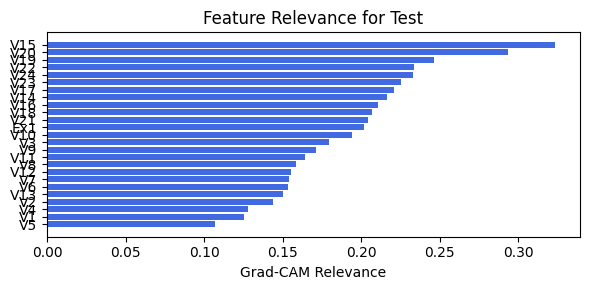

In [104]:
train_and_plot_relevance(Model3_3, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=60, hidden_dim=8, filename=filename_3, opt_col_val=8)

## 3.2. width=[24, 7, 1], grid=8, lamb=0.001

### 3.2.0 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.88e-01 | val_acc_hybrid: 9.20e-01 |: 100%|█████| 60/60 [02:56<00:00,  2.94s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3356e-01 at 34 epoch
tensor(0.9258, device='cuda:0')
[[411  27   3   0]
 [ 12 398  10   0]
 [  0  10  56   0]
 [  1   2  16 146]]
M_KAN Relevance: 0.2609778046607971
CNN Relevance: 0.7390221953392029
[('V15', 0.32249805), ('V19', 0.28350788), ('V20', 0.22789377), ('V18', 0.17002632), ('V7', 0.14621888), ('V14', 0.14511363), ('V6', 0.13617373), ('V24', 0.12627955), ('V11', 0.11982421), ('V12', 0.11488313), ('V13', 0.114149824), ('V17', 0.10904398), ('V10', 0.0980338), ('V22', 0.09109127), ('V5', 0.08322826), ('V23', 0.08309002), ('V2', 0.082484886), ('V16', 0.0804638), ('V8', 0.07753995), ('V4', 0.073402606), ('V9', 0.07218291), ('V3', 0.066867314), ('V21', 0.052086882), ('V1', 0.045779034)]


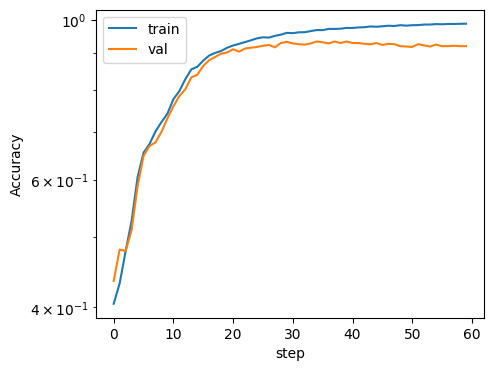

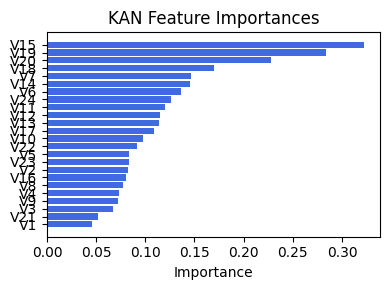

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.292733236048635), ('V19', 0.2913957101522261), ('V13', 0.27221261123150514), ('V17', 0.2579148336853738), ('Ex1', 0.2516627984540729), ('V8', 0.23988922618360653), ('V16', 0.22870745752919863), ('V14', 0.22423565829011327), ('V12', 0.20734341070503712), ('V9', 0.20634632912532028), ('V7', 0.19762178389177507), ('V24', 0.18486828581718417), ('V23', 0.18364841317331107), ('V1', 0.17698136385812782), ('V11', 0.1715583484974592), ('V6', 0.1714539103991245), ('V2', 0.1607679203424239), ('V3', 0.15288086443748872), ('V22', 0.1505608077427213), ('V20', 0.14158228150269775), ('V15', 0.1360429763986265), ('V21', 0.12637189531830165), ('V4', 0.12282006127701767), ('V10', 0.09681279635174761), ('V5', 0.06533664827602412)]


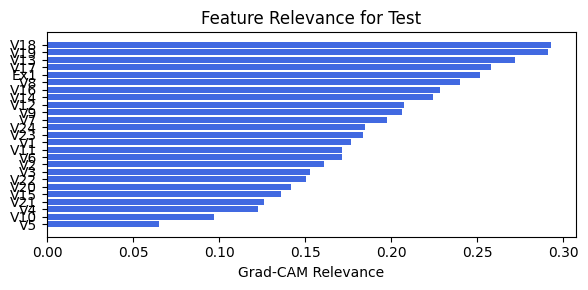

In [105]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.2.1 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.88e-01 | val_acc_hybrid: 9.20e-01 |: 100%|█████| 60/60 [02:55<00:00,  2.93s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3356e-01 at 34 epoch
tensor(0.9258, device='cuda:0')
[[411  27   3   0]
 [ 12 398  10   0]
 [  0  10  56   0]
 [  1   2  16 146]]
M_KAN Relevance: 0.2609778046607971
CNN Relevance: 0.7390221953392029
[('V15', 0.32249805), ('V19', 0.28350788), ('V20', 0.22789377), ('V18', 0.17002632), ('V7', 0.14621888), ('V14', 0.14511363), ('V6', 0.13617373), ('V24', 0.12627955), ('V11', 0.11982421), ('V12', 0.11488313), ('V13', 0.114149824), ('V17', 0.10904398), ('V10', 0.0980338), ('V22', 0.09109127), ('V5', 0.08322826), ('V23', 0.08309002), ('V2', 0.082484886), ('V16', 0.0804638), ('V8', 0.07753995), ('V4', 0.073402606), ('V9', 0.07218291), ('V3', 0.066867314), ('V21', 0.052086882), ('V1', 0.045779034)]


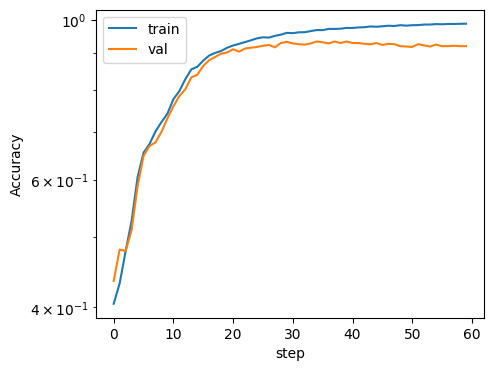

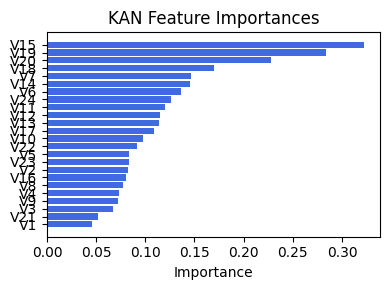

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.292733236048635), ('V19', 0.2913957101522261), ('V13', 0.27221261123150514), ('V17', 0.2579148336853738), ('Ex1', 0.2516627984540729), ('V8', 0.23988922618360653), ('V16', 0.22870745752919863), ('V14', 0.22423565829011327), ('V12', 0.20734341070503712), ('V9', 0.20634632912532028), ('V7', 0.19762178389177507), ('V24', 0.18486828581718417), ('V23', 0.18364841317331107), ('V1', 0.17698136385812782), ('V11', 0.1715583484974592), ('V6', 0.1714539103991245), ('V2', 0.1607679203424239), ('V3', 0.15288086443748872), ('V22', 0.1505608077427213), ('V20', 0.14158228150269775), ('V15', 0.1360429763986265), ('V21', 0.12637189531830165), ('V4', 0.12282006127701767), ('V10', 0.09681279635174761), ('V5', 0.06533664827602412)]


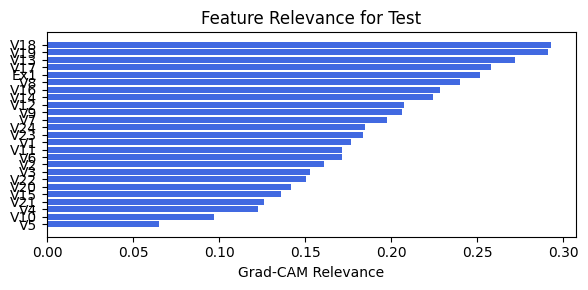

In [106]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.2.2 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.95e-01 | val_acc_hybrid: 9.38e-01 |: 100%|█████| 60/60 [02:48<00:00,  2.80s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.5074e-01 at 26 epoch
tensor(0.9460, device='cuda:0')
[[420  16   4   1]
 [  8 410   1   1]
 [  0   7  59   0]
 [  0   3  18 144]]
M_KAN Relevance: 0.47264206409454346
CNN Relevance: 0.5273579359054565
[('V15', 0.31169102), ('V20', 0.2900432), ('V19', 0.23209226), ('V18', 0.1978305), ('V14', 0.15952897), ('V24', 0.13247022), ('V13', 0.1253076), ('V12', 0.12299104), ('V11', 0.12261895), ('V22', 0.11554104), ('V23', 0.10706292), ('V1', 0.10632659), ('V17', 0.10510871), ('V10', 0.104360275), ('V3', 0.10009099), ('V2', 0.09868537), ('V8', 0.087419085), ('V16', 0.087280184), ('V7', 0.0844622), ('V5', 0.07897023), ('V21', 0.075487696), ('V6', 0.07060343), ('V9', 0.069495544), ('V4', 0.060108133)]


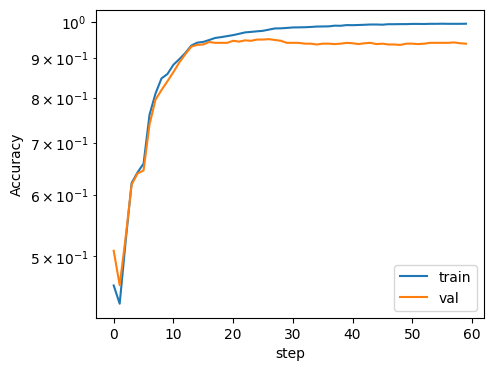

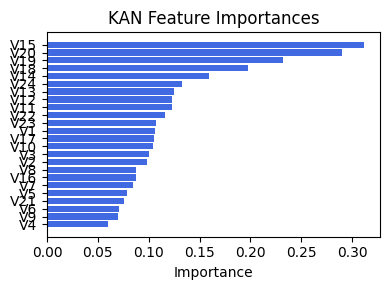

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.3045322855041277), ('V15', 0.2930280335513289), ('V14', 0.2853519244617595), ('V13', 0.26876095297087316), ('Ex1', 0.2643915218970186), ('V8', 0.2614343919905991), ('V19', 0.25977207006628183), ('V18', 0.25974198863080417), ('V24', 0.2564816715037143), ('V23', 0.2521205653815791), ('V17', 0.24845150036989397), ('V12', 0.24825180764949706), ('V9', 0.2476963956146908), ('V7', 0.22969780850921728), ('V10', 0.22827706092413497), ('V22', 0.21532430612950565), ('V3', 0.20289931752983478), ('V4', 0.19389105206601714), ('V16', 0.18874131750664888), ('V11', 0.1816555557336706), ('V5', 0.17210396252293597), ('V6', 0.17036731821614284), ('V2', 0.170135059759406), ('V21', 0.15340124482692785), ('V1', 0.1427320670929489)]


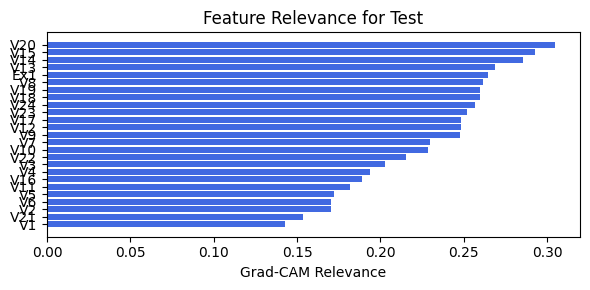

In [107]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=64, filename=filename_3, opt_col_val=64)

### 3.2.3 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.90e-01 | val_acc_hybrid: 9.46e-01 |: 100%|█████| 60/60 [02:47<00:00,  2.79s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4616e-01 at 58 epoch
tensor(0.9359, device='cuda:0')
[[419  17   4   1]
 [ 20 394   5   1]
 [  1   4  60   1]
 [  1   6   9 149]]
M_KAN Relevance: 0.47948500514030457
CNN Relevance: 0.520514965057373
[('V15', 0.42566916), ('V20', 0.2669553), ('V19', 0.24378133), ('V14', 0.19645281), ('V18', 0.15964288), ('V24', 0.13791507), ('V7', 0.13526082), ('V17', 0.13085751), ('V12', 0.12691495), ('V11', 0.12091995), ('V23', 0.11681273), ('V9', 0.10610399), ('V8', 0.10534673), ('V10', 0.10389269), ('V22', 0.099528715), ('V3', 0.09745176), ('V6', 0.09529083), ('V13', 0.09280269), ('V5', 0.09060554), ('V4', 0.08531944), ('V2', 0.08263248), ('V16', 0.0823093), ('V21', 0.07957205), ('V1', 0.067587465)]


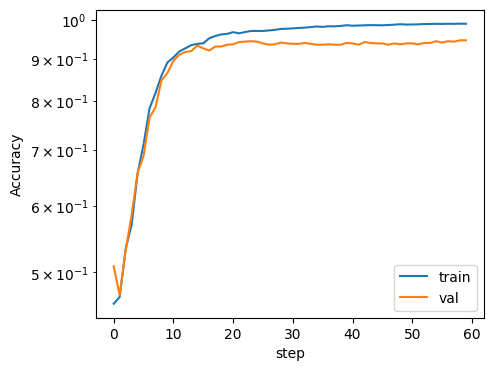

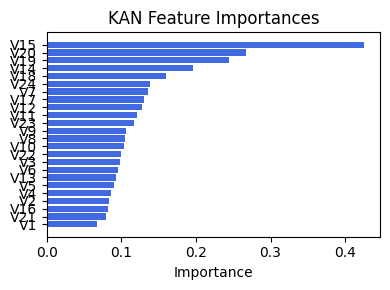

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V3', 0.23793549353957552), ('V18', 0.2315374422308199), ('V9', 0.23146615870821038), ('V14', 0.2258893016528768), ('V17', 0.22389710035309396), ('V8', 0.2185939137446276), ('V19', 0.212964650273051), ('V20', 0.21101475870449704), ('V13', 0.20879015694508812), ('V7', 0.20711855187812447), ('V16', 0.2052682679825008), ('V23', 0.20277629239580908), ('V12', 0.20141341963296458), ('V15', 0.19495207074685109), ('V10', 0.1919411269144746), ('V22', 0.1910571738839407), ('V4', 0.18539770387036658), ('V24', 0.17691825773805656), ('V21', 0.1758599516882023), ('V2', 0.16345748847247654), ('V11', 0.16003563598330264), ('V6', 0.15443516473765107), ('V5', 0.15239893377600064), ('Ex1', 0.12719328620383855), ('V1', 0.09295696308435497)]


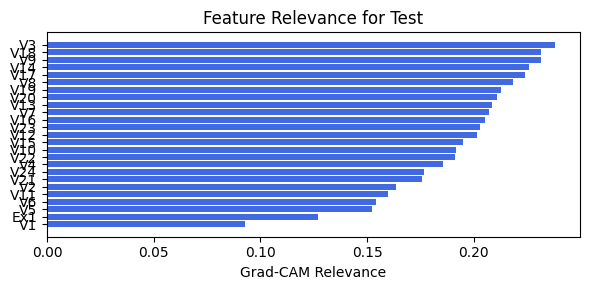

In [108]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=64, filename=filename_3, opt_col_val=64)

### 3.2.4 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.75e-01 | val_acc_hybrid: 9.45e-01 |: 100%|█████| 60/60 [02:55<00:00,  2.93s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4960e-01 at 43 epoch
tensor(0.9313, device='cuda:0')
[[414  23   3   1]
 [ 12 404   4   0]
 [  0   8  56   2]
 [  0   3  19 143]]
M_KAN Relevance: 0.3552958369255066
CNN Relevance: 0.6447041034698486
[('V15', 0.43899712), ('V20', 0.2550585), ('V19', 0.21196097), ('V13', 0.17466925), ('V18', 0.17455119), ('V2', 0.11438695), ('V14', 0.10805528), ('V16', 0.101713076), ('V4', 0.09522117), ('V12', 0.09370988), ('V22', 0.09332595), ('V24', 0.09044643), ('V17', 0.083383754), ('V11', 0.08298806), ('V21', 0.078380495), ('V10', 0.071817964), ('V3', 0.07156321), ('V9', 0.067417756), ('V6', 0.06711268), ('V5', 0.056187235), ('V1', 0.054765046), ('V23', 0.049972188), ('V8', 0.045681592), ('V7', 0.044796053)]


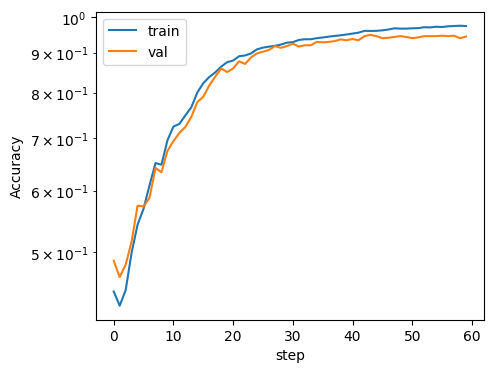

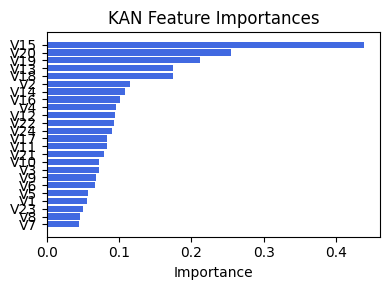

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.28958154179104934), ('V8', 0.21428455801355745), ('V3', 0.21003476867944576), ('V9', 0.20216420312096953), ('V13', 0.1886406508726392), ('V7', 0.18439663833715303), ('V2', 0.18381160192448312), ('V14', 0.1781447360017776), ('V1', 0.17416681019178226), ('V19', 0.17334658462393665), ('V18', 0.16747688493693944), ('V16', 0.16120072112313383), ('V23', 0.15946507895100012), ('V22', 0.1593902750567498), ('V12', 0.15886082488367262), ('V17', 0.15360789075655856), ('V6', 0.149259559098477), ('V4', 0.14456354053344755), ('V24', 0.13250618262824965), ('V15', 0.13181075581697826), ('V20', 0.12844336523933272), ('V10', 0.11962711747774837), ('V11', 0.10527801038687767), ('Ex1', 0.09505125456524803), ('V5', 0.08024550054031038)]


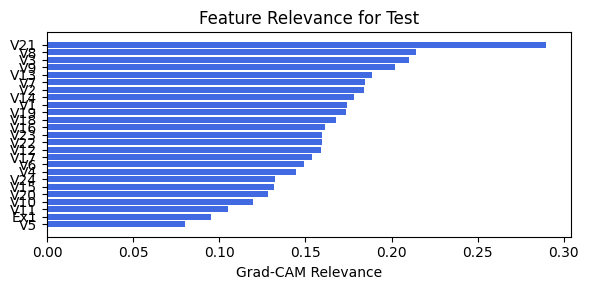

In [109]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.2.5 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.50e-01 | val_acc_hybrid: 9.35e-01 |: 100%|█████| 60/60 [02:59<00:00,  2.99s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3814e-01 at 56 epoch
tensor(0.9231, device='cuda:0')
[[406  31   3   1]
 [  5 409   6   0]
 [  0  14  49   3]
 [  1   4  16 144]]
M_KAN Relevance: 0.24699155986309052
CNN Relevance: 0.7530084848403931
[('V15', 0.36106065), ('V19', 0.25128323), ('V20', 0.22813126), ('V14', 0.15470934), ('V5', 0.15184769), ('V18', 0.13949016), ('V6', 0.13018316), ('V4', 0.12563474), ('V2', 0.124470145), ('V7', 0.12207818), ('V13', 0.11149106), ('V10', 0.11018878), ('V17', 0.1091395), ('V16', 0.101542495), ('V12', 0.09743487), ('V11', 0.0936787), ('V24', 0.09320973), ('V3', 0.088398464), ('V9', 0.08391348), ('V22', 0.079287946), ('V23', 0.07784363), ('V8', 0.07194982), ('V1', 0.061763175), ('V21', 0.060839705)]


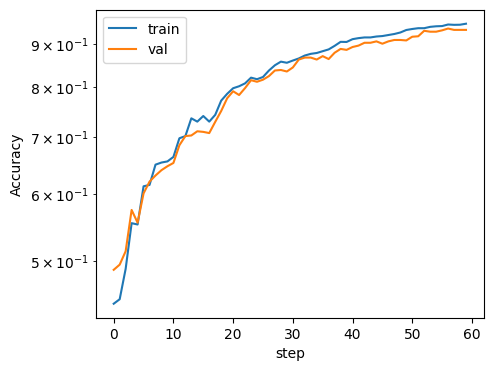

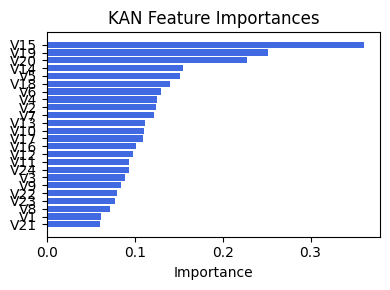

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.427477049974646), ('V22', 0.41954551543672647), ('V21', 0.41099917740202496), ('V24', 0.312349773013261), ('V3', 0.2293099953530522), ('V18', 0.19455660342838857), ('V2', 0.1886241170257616), ('V8', 0.18620918526087338), ('V1', 0.1823863812517766), ('V6', 0.1724122442226625), ('V17', 0.16935235071044494), ('V7', 0.16251247093267399), ('V13', 0.16042632025844783), ('V16', 0.15208292979759425), ('V19', 0.1473147615199975), ('V4', 0.14513105992071879), ('V12', 0.1413471815876719), ('V9', 0.13787501072564382), ('V11', 0.12689296235984973), ('V14', 0.10648796193000191), ('V20', 0.09467419228497756), ('V10', 0.09166432410114421), ('V5', 0.08770255044584747), ('V15', 0.07552609142009212), ('Ex1', 0.057541750315274025)]


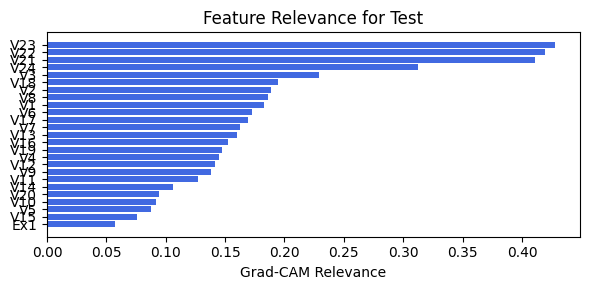

In [110]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.2.6 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.75e-01 | val_acc_hybrid: 9.27e-01 |: 100%|█████| 60/60 [03:00<00:00,  3.00s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3471e-01 at 45 epoch
tensor(0.9304, device='cuda:0')
[[413  26   1   1]
 [ 12 399   9   0]
 [  0   7  58   1]
 [  1   3  15 146]]
M_KAN Relevance: 0.2812403440475464
CNN Relevance: 0.7187596559524536
[('V15', 0.39018), ('V20', 0.28463256), ('V19', 0.2835442), ('V18', 0.15145558), ('V12', 0.13642877), ('V24', 0.13511209), ('V11', 0.098465584), ('V10', 0.096077785), ('V9', 0.09544828), ('V2', 0.09406234), ('V13', 0.09337668), ('V16', 0.09326938), ('V5', 0.091624774), ('V17', 0.091101386), ('V6', 0.089383736), ('V14', 0.08830471), ('V7', 0.08583347), ('V22', 0.08406253), ('V23', 0.075896315), ('V3', 0.075563595), ('V4', 0.063501894), ('V8', 0.050613143), ('V21', 0.045975663), ('V1', 0.039857008)]


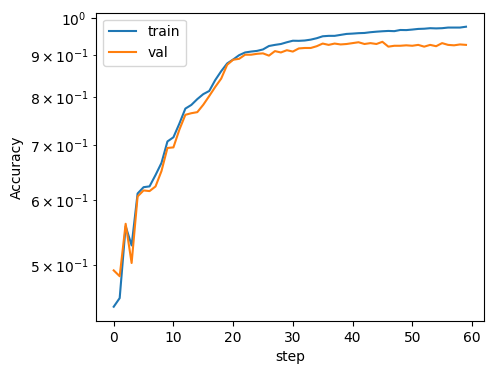

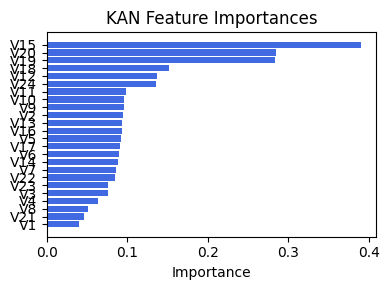

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V24', 0.3643464503745632), ('V23', 0.3331518143307991), ('Ex1', 0.32295640806580944), ('V20', 0.3064261049254435), ('V15', 0.30262452448275723), ('V19', 0.28239267481414854), ('V14', 0.2788702151495042), ('V22', 0.2555975762420447), ('V18', 0.22047692829667975), ('V13', 0.20787884216182506), ('V10', 0.20473518240668365), ('V8', 0.20454568724956487), ('V9', 0.19987568929981211), ('V17', 0.18694840813731098), ('V7', 0.17883448618700948), ('V12', 0.1719080882159534), ('V16', 0.16888919441718273), ('V11', 0.1676125360662186), ('V6', 0.16177432209560022), ('V1', 0.14410195408759752), ('V2', 0.14042872484831925), ('V3', 0.13234897237809437), ('V4', 0.11502982138125388), ('V5', 0.09639525996980687), ('V21', 0.07326926708242812)]


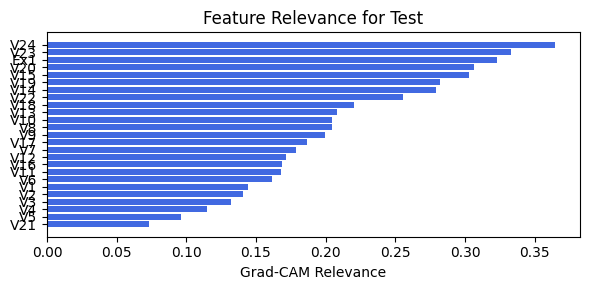

In [111]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=16, filename=filename_3, opt_col_val=16)

### 3.2.7 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.92e-01 | val_acc_hybrid: 9.31e-01 |: 100%|█████| 60/60 [02:52<00:00,  2.87s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3814e-01 at 21 epoch
tensor(0.9286, device='cuda:0')
[[417  20   3   1]
 [ 11 393  16   0]
 [  0   6  60   0]
 [  1   4  16 144]]
M_KAN Relevance: 0.38591107726097107
CNN Relevance: 0.6140888929367065
[('V19', 0.3596443), ('V20', 0.2963564), ('V15', 0.2870596), ('V18', 0.19808365), ('V12', 0.13359316), ('V14', 0.13009126), ('V16', 0.11144176), ('V5', 0.0886784), ('V11', 0.08662984), ('V17', 0.0825523), ('V22', 0.07696543), ('V13', 0.07648313), ('V9', 0.075471036), ('V24', 0.07488147), ('V2', 0.07417163), ('V4', 0.067296974), ('V3', 0.06549194), ('V8', 0.060887173), ('V1', 0.05774793), ('V23', 0.05755739), ('V6', 0.056669865), ('V21', 0.05653687), ('V10', 0.052395247), ('V7', 0.047852594)]


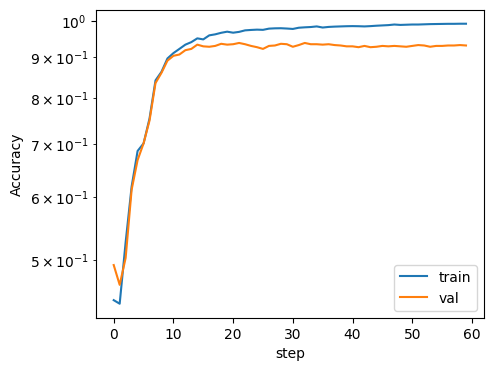

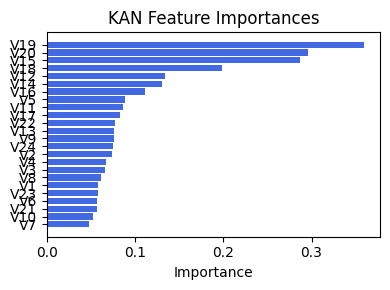

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.315025632644992), ('V13', 0.2711074848078539), ('V19', 0.26011878518867837), ('V24', 0.25587255074168463), ('V14', 0.2497990734268819), ('V8', 0.24961901722934723), ('V23', 0.24093458965156697), ('V7', 0.2349614511739084), ('V18', 0.23373759443802222), ('V12', 0.23342352284411916), ('V9', 0.22914044184460677), ('V17', 0.22600233215729826), ('V11', 0.21854724095750092), ('V16', 0.20873820935514645), ('V20', 0.20244312678201928), ('V15', 0.20193804259932074), ('V22', 0.188154612764365), ('V6', 0.18784312040907192), ('V2', 0.1621946049072727), ('V1', 0.1610994774571923), ('V3', 0.15630285938644795), ('V4', 0.12387660143929266), ('V10', 0.12182744086370696), ('V21', 0.08599861633193698), ('V5', 0.07271059116847493)]


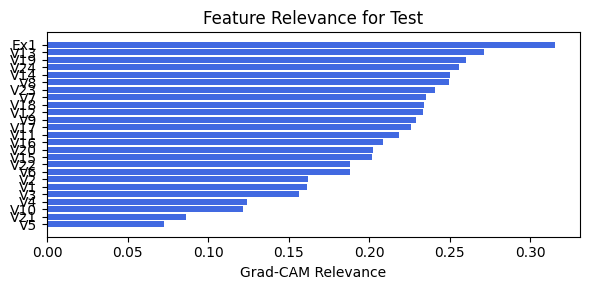

In [112]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=16, filename=filename_3, opt_col_val=16)

### 3.2.8 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 9.52e-01 |: 100%|█████| 60/60 [02:56<00:00,  2.94s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.5189e-01 at 55 epoch
tensor(0.9405, device='cuda:0')
[[421  17   2   1]
 [  8 404   8   0]
 [  0   6  57   3]
 [  0   4  16 145]]
M_KAN Relevance: 0.4405241310596466
CNN Relevance: 0.5594758987426758
[('V18', 0.3468851), ('V15', 0.3391127), ('V20', 0.24477962), ('V19', 0.1818581), ('V12', 0.17677148), ('V14', 0.13299528), ('V11', 0.12629047), ('V5', 0.11908344), ('V22', 0.115387894), ('V24', 0.10742496), ('V4', 0.10365687), ('V21', 0.10175186), ('V7', 0.099946626), ('V17', 0.09468257), ('V2', 0.09192637), ('V9', 0.090811744), ('V16', 0.090085045), ('V10', 0.08839779), ('V13', 0.08474908), ('V3', 0.07949391), ('V23', 0.07886072), ('V6', 0.07345009), ('V8', 0.06459927), ('V1', 0.046639748)]


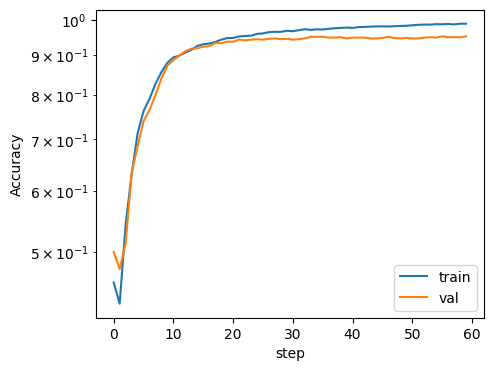

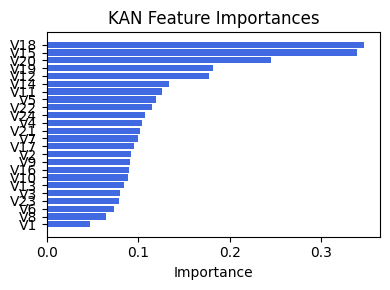

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.25805470229667227), ('V15', 0.2315087740645563), ('V18', 0.1905597074170752), ('V13', 0.18773303835523986), ('V10', 0.1874603406011661), ('V19', 0.18255616575343317), ('V17', 0.17122211369620585), ('V23', 0.17056202900647346), ('V14', 0.16541591115831483), ('V8', 0.15948572071575545), ('V24', 0.15790923498985354), ('Ex1', 0.15497080430385732), ('V9', 0.1526767699144043), ('V5', 0.14711543126223317), ('V3', 0.14644659301559312), ('V12', 0.14630768779980682), ('V22', 0.14615703151444479), ('V7', 0.1457716512665214), ('V4', 0.12609344932799693), ('V16', 0.11762419447509957), ('V2', 0.11527110630269598), ('V11', 0.10908861886223799), ('V21', 0.09735322563759531), ('V6', 0.095424788467979), ('V1', 0.07550300404833692)]


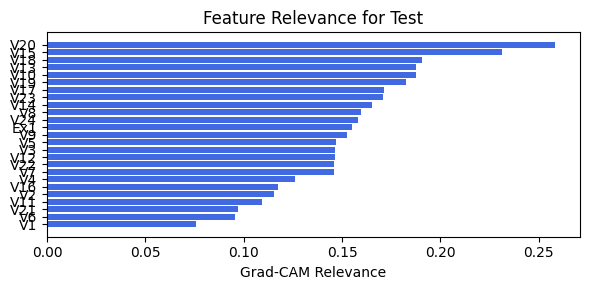

In [113]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=8, filename=filename_3, opt_col_val=8)

### 3.2.9 width=[24, 7, 1], grid=8, lamb=0.001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.95e-01 | val_acc_hybrid: 9.39e-01 |: 100%|█████| 60/60 [02:50<00:00,  2.84s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.5304e-01 at 18 epoch
tensor(0.9478, device='cuda:0')
[[417  20   3   1]
 [  5 410   4   1]
 [  0   5  60   1]
 [  0   3  14 148]]
M_KAN Relevance: 0.43008047342300415
CNN Relevance: 0.5699195265769958
[('V15', 0.3219754), ('V20', 0.24058315), ('V18', 0.21976769), ('V19', 0.18904468), ('V5', 0.15559487), ('V22', 0.15545101), ('V7', 0.1494199), ('V24', 0.1331482), ('V14', 0.12667093), ('V11', 0.11632794), ('V12', 0.114050105), ('V17', 0.10733387), ('V13', 0.10128889), ('V16', 0.09200618), ('V6', 0.09050504), ('V4', 0.08956316), ('V21', 0.084179685), ('V10', 0.0785763), ('V2', 0.07351386), ('V3', 0.0638658), ('V9', 0.062343024), ('V23', 0.059333418), ('V8', 0.051727213), ('V1', 0.036194313)]


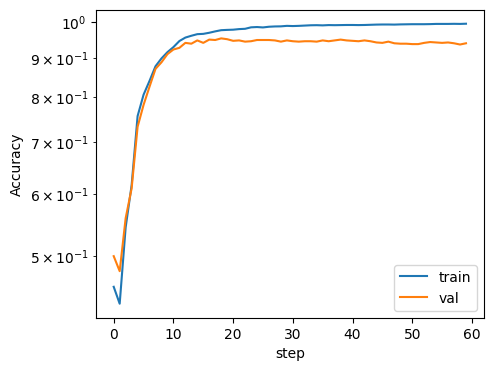

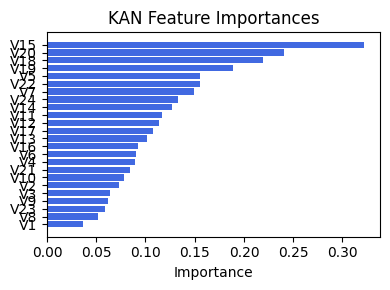

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.3208366601137084), ('V18', 0.3117991757382777), ('V13', 0.30502968833222305), ('V14', 0.29666977058716576), ('V24', 0.2889995195971526), ('V23', 0.2843253835196195), ('V17', 0.26605443589862876), ('V20', 0.25599358386007026), ('V8', 0.248114283554386), ('V22', 0.24475553634426397), ('V9', 0.23780192054881485), ('V15', 0.23421978123866416), ('V12', 0.23042292587214744), ('Ex1', 0.2266674274038424), ('V7', 0.19936715768612168), ('V10', 0.18257709967945582), ('V16', 0.16684451573470782), ('V11', 0.1522618590340274), ('V3', 0.141493255592888), ('V6', 0.14083417485020977), ('V21', 0.13651873664448863), ('V4', 0.12943904055387748), ('V2', 0.12792052861006775), ('V1', 0.11001959491234266), ('V5', 0.10464951844284733)]


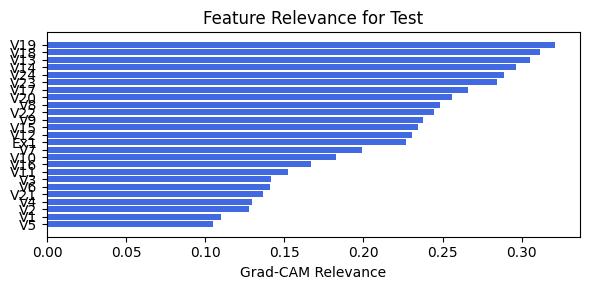

In [114]:
train_and_plot_relevance(Model3_3, kan_neurons=7, kan_grid=8, lamb=0.001, steps=60, hidden_dim=8, filename=filename_3, opt_col_val=8)

## 3.3. width=[24, 9], grid=8, lamb=0.001

### 3.3.0 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.83e-01 | val_acc_hybrid: 9.35e-01 |: 100%|█████| 60/60 [02:59<00:00,  2.98s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4502e-01 at 37 epoch
tensor(0.9377, device='cuda:0')
[[416  22   3   0]
 [  8 406   4   2]
 [  1   5  58   2]
 [  0   2  19 144]]
M_KAN Relevance: 0.3408444821834564
CNN Relevance: 0.6591554880142212
[('V15', 0.43616274), ('V19', 0.23106472), ('V20', 0.20681776), ('V18', 0.15107258), ('V22', 0.14292258), ('V8', 0.14217922), ('V14', 0.13451229), ('V17', 0.1332779), ('V4', 0.12840565), ('V12', 0.12610479), ('V3', 0.118573055), ('V6', 0.11811421), ('V16', 0.11108467), ('V11', 0.106474005), ('V5', 0.100332975), ('V13', 0.09885364), ('V24', 0.09485272), ('V7', 0.09308135), ('V1', 0.0862255), ('V23', 0.08154088), ('V9', 0.07480295), ('V10', 0.07453504), ('V2', 0.0599221), ('V21', 0.052682094)]


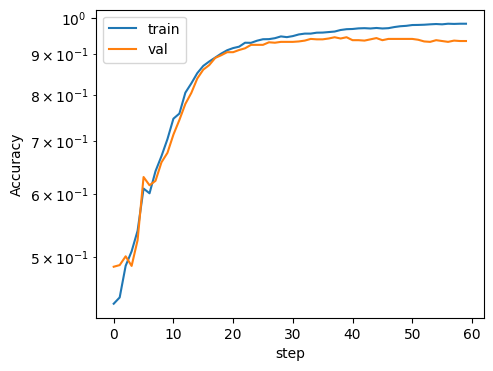

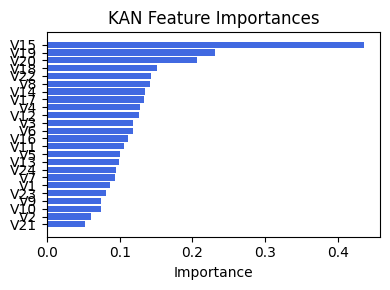

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.2530442283871744), ('V14', 0.2504869320277626), ('V9', 0.2360074029440758), ('V24', 0.227722623818635), ('V22', 0.22319991988451177), ('V16', 0.2190438871278678), ('V23', 0.21441653405035582), ('V17', 0.21334213000893762), ('V18', 0.2131793174740002), ('V6', 0.21114522353450693), ('V20', 0.21026946948210098), ('V10', 0.21018424038973554), ('V8', 0.2035117678559148), ('V11', 0.2034042445838444), ('V15', 0.20230969511085078), ('V5', 0.19939603279381252), ('V7', 0.19397630157941037), ('V13', 0.192038658828536), ('V4', 0.1910769296518826), ('V1', 0.18604150356057975), ('V12', 0.17573370148415846), ('V3', 0.1694375899774575), ('V21', 0.16762246460969657), ('V2', 0.16115600621043544), ('Ex1', 0.1429601853031692)]


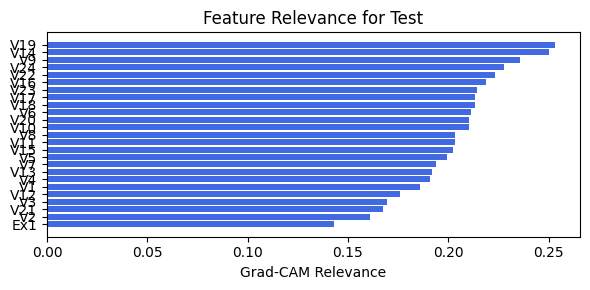

In [115]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.3.1 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=128

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.77e-01 | val_acc_hybrid: 9.39e-01 |: 100%|█████| 60/60 [02:57<00:00,  2.96s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4273e-01 at 58 epoch
tensor(0.9304, device='cuda:0')
[[410  25   5   1]
 [ 12 402   5   1]
 [  0   5  61   0]
 [  1   6  15 143]]
M_KAN Relevance: 0.32532915472984314
CNN Relevance: 0.6746708750724792
[('V15', 0.4220566), ('V19', 0.25970438), ('V20', 0.21330166), ('V12', 0.16891082), ('V18', 0.14794917), ('V9', 0.1392097), ('V14', 0.12702487), ('V23', 0.12630983), ('V11', 0.12545006), ('V16', 0.122360736), ('V1', 0.12051228), ('V22', 0.11982735), ('V8', 0.11712597), ('V10', 0.11411206), ('V6', 0.11386321), ('V13', 0.10792564), ('V5', 0.09994516), ('V17', 0.09547933), ('V24', 0.093656994), ('V2', 0.09262977), ('V7', 0.0882648), ('V3', 0.07954248), ('V21', 0.079101756), ('V4', 0.07831371)]


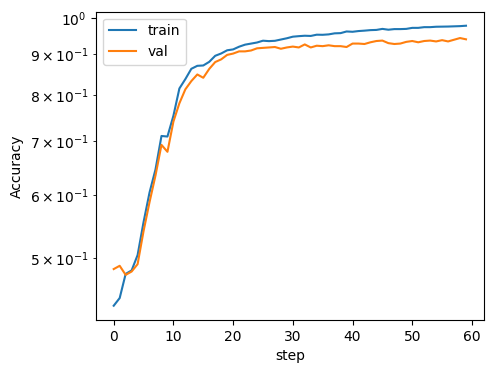

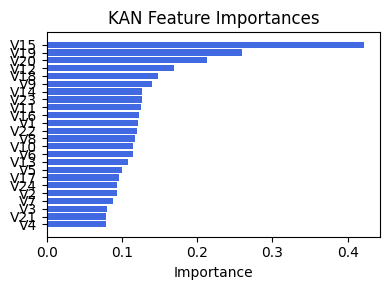

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V15', 0.31096952648168374), ('V20', 0.3013185224318433), ('V10', 0.24908856186969291), ('V11', 0.2352153506825487), ('V19', 0.23374562204548716), ('V16', 0.22596034816207322), ('V13', 0.21960666210854582), ('V6', 0.21300323696009682), ('V18', 0.20859332706195247), ('V14', 0.2071670300150593), ('V8', 0.20224263441609047), ('V1', 0.20215071078776056), ('V17', 0.20062618805529078), ('V9', 0.19998541786694143), ('V5', 0.1941717344539512), ('V7', 0.19043886852906217), ('V12', 0.18813823168285382), ('Ex1', 0.18649160467350903), ('V2', 0.16333945258965962), ('V21', 0.15205854977241473), ('V3', 0.14615858768154746), ('V4', 0.13816810619237035), ('V24', 0.1379765521888681), ('V23', 0.12900815964379006), ('V22', 0.1248421235025859)]


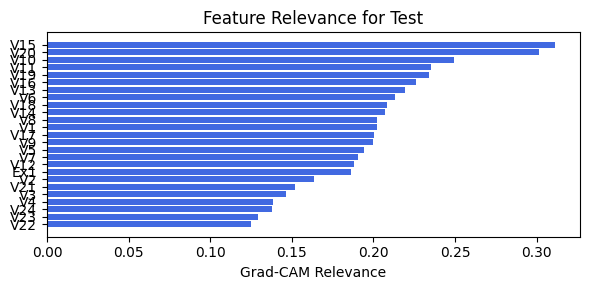

In [116]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=128, filename=filename_3, opt_col_val=128)

### 3.3.2 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.86e-01 | val_acc_hybrid: 9.29e-01 |: 100%|█████| 60/60 [02:59<00:00,  3.00s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3356e-01 at 46 epoch
tensor(0.9240, device='cuda:0')
[[415  23   2   1]
 [ 17 390  13   0]
 [  1   5  60   0]
 [  0   4  17 144]]
M_KAN Relevance: 0.3866191506385803
CNN Relevance: 0.6133808493614197
[('V15', 0.35956177), ('V19', 0.29510763), ('V20', 0.23634379), ('V22', 0.1624601), ('V18', 0.15949045), ('V14', 0.15793109), ('V6', 0.15562877), ('V7', 0.13813652), ('V13', 0.12240098), ('V16', 0.12181793), ('V17', 0.112733126), ('V21', 0.10945573), ('V10', 0.10612079), ('V11', 0.10596105), ('V12', 0.10472136), ('V8', 0.09761993), ('V24', 0.09683189), ('V9', 0.093968764), ('V3', 0.08660226), ('V2', 0.07987658), ('V23', 0.07841701), ('V5', 0.059367552), ('V4', 0.058977842), ('V1', 0.0537308)]


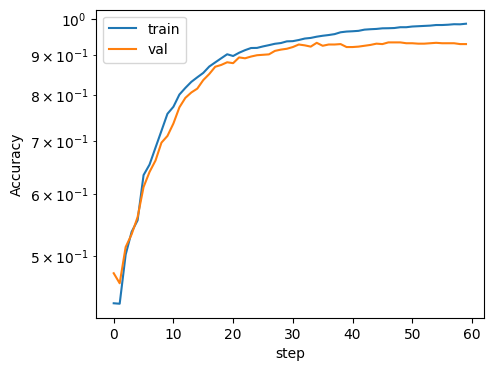

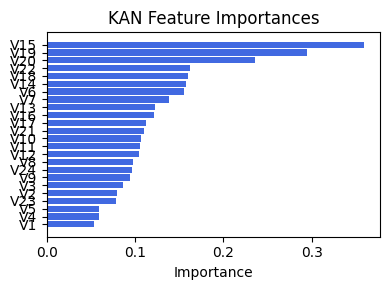

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.24338572229478167), ('V24', 0.24189789308812434), ('V23', 0.2391510163881601), ('V20', 0.2309524998195246), ('V15', 0.2135646058791897), ('V13', 0.21038907520974484), ('V19', 0.20642208205297208), ('V18', 0.19576924175840432), ('V12', 0.19509433255731956), ('V17', 0.18668460863185687), ('V14', 0.1795087582849635), ('V16', 0.17558291729292516), ('V7', 0.1668835048233535), ('V8', 0.16429162081910959), ('V10', 0.16344330111253477), ('V3', 0.15975819837392372), ('V11', 0.15914726609974708), ('V9', 0.15899018839228943), ('V21', 0.1573310986717936), ('V4', 0.15679571029605063), ('Ex1', 0.15420869236551393), ('V2', 0.15334525525348486), ('V6', 0.14426105501296904), ('V5', 0.11775682022743483), ('V1', 0.11550579604923876)]


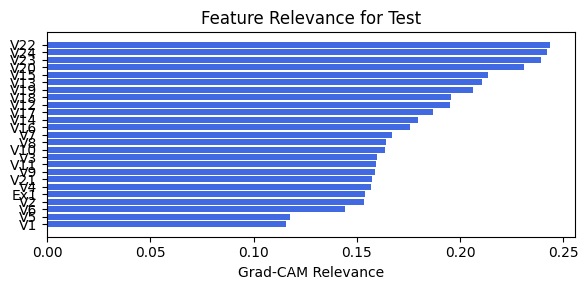

In [117]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=64, filename=filename_3, opt_col_val=64)

### 3.3.3 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=64

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.88e-01 | val_acc_hybrid: 9.31e-01 |: 100%|█████| 60/60 [02:58<00:00,  2.98s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4158e-01 at 29 epoch
tensor(0.9332, device='cuda:0')
[[418  18   5   0]
 [  7 400  12   1]
 [  0   9  57   0]
 [  0   2  19 144]]
M_KAN Relevance: 0.4501829147338867
CNN Relevance: 0.5498170852661133
[('V19', 0.36567694), ('V15', 0.32171434), ('V20', 0.24443701), ('V18', 0.1787761), ('V16', 0.14644177), ('V22', 0.1326539), ('V7', 0.1324256), ('V14', 0.12939282), ('V3', 0.12635566), ('V10', 0.11580372), ('V2', 0.11465718), ('V11', 0.105497144), ('V13', 0.10479282), ('V12', 0.099137835), ('V23', 0.09912769), ('V9', 0.09645996), ('V24', 0.09161368), ('V8', 0.088573985), ('V17', 0.083222754), ('V6', 0.07932627), ('V21', 0.07843325), ('V4', 0.07659508), ('V5', 0.07608781), ('V1', 0.0600874)]


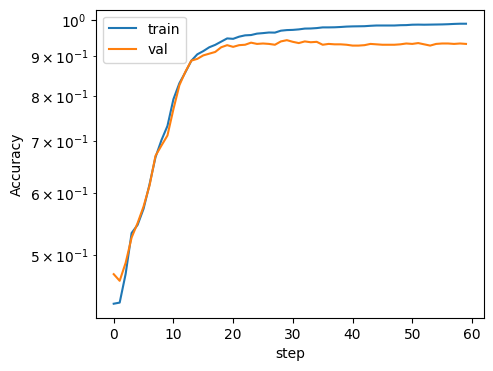

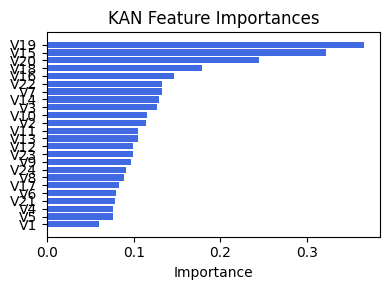

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.4117501143932397), ('V14', 0.399759178193889), ('V18', 0.3912383270313319), ('V20', 0.3645290145472472), ('V13', 0.3607971026927178), ('V15', 0.35688333868048233), ('V23', 0.3525312754167843), ('V24', 0.3427230323161747), ('V9', 0.33621274345703556), ('V8', 0.325652985625914), ('V22', 0.3081237817422044), ('V17', 0.3050966059943296), ('V12', 0.2937813930861838), ('Ex1', 0.27870900239787383), ('V10', 0.26780639263664846), ('V7', 0.2600541231399952), ('V3', 0.19611298711810538), ('V2', 0.18841120124229097), ('V4', 0.18765678953530987), ('V1', 0.1802319032954024), ('V6', 0.1703326405813741), ('V21', 0.16120040944261435), ('V11', 0.15278650307100378), ('V16', 0.15113349503651044), ('V5', 0.14465398605622526)]


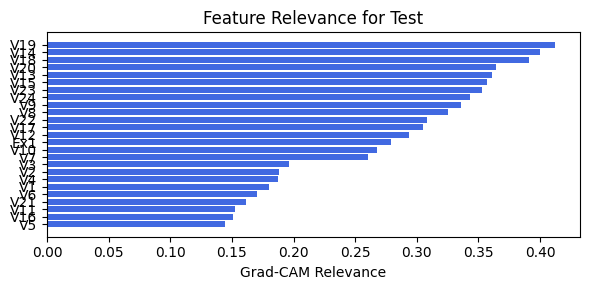

In [118]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=64, filename=filename_3, opt_col_val=64)

### 3.3.4 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 9.32e-01 |: 100%|█████| 60/60 [02:49<00:00,  2.83s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4044e-01 at 29 epoch
tensor(0.9423, device='cuda:0')
[[415  22   3   1]
 [  6 408   6   0]
 [  0   7  59   0]
 [  0   2  16 147]]
M_KAN Relevance: 0.4927874505519867
CNN Relevance: 0.5072125792503357
[('V19', 0.34482008), ('V15', 0.27162516), ('V20', 0.24719281), ('V18', 0.19585909), ('V11', 0.13831133), ('V12', 0.13762532), ('V13', 0.12679225), ('V4', 0.12402272), ('V9', 0.113200225), ('V6', 0.11163519), ('V2', 0.11049397), ('V14', 0.106468245), ('V22', 0.10328428), ('V5', 0.1018636), ('V17', 0.09317613), ('V10', 0.09019259), ('V3', 0.09010175), ('V16', 0.08597658), ('V7', 0.08457176), ('V21', 0.08184696), ('V8', 0.067238264), ('V23', 0.060791865), ('V24', 0.06039455), ('V1', 0.047193397)]


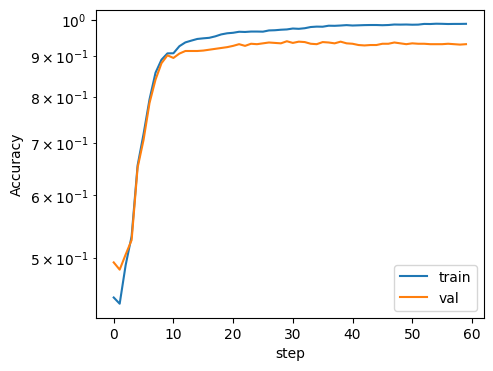

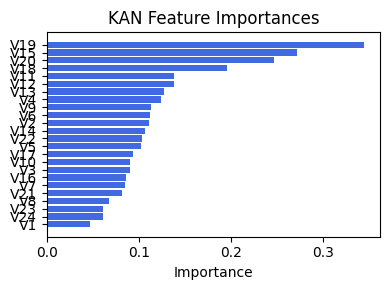

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V18', 0.26482026249676904), ('V14', 0.26301886932476637), ('V13', 0.25928823827223413), ('V19', 0.252563516080278), ('V12', 0.2331663551034607), ('V8', 0.23095189993862053), ('V9', 0.22551358505318472), ('V17', 0.22399376354489117), ('V2', 0.21570101071238856), ('V7', 0.20920186039635927), ('V3', 0.20759192227271656), ('V4', 0.2033444173114634), ('V24', 0.191835205295263), ('V1', 0.19009181568907857), ('V23', 0.1899361268072662), ('V15', 0.18561338943190703), ('V10', 0.1809269529860083), ('V11', 0.17821673185870754), ('V22', 0.17818684165313275), ('V20', 0.17627054148333327), ('V16', 0.17315896663343258), ('V6', 0.16887526782088638), ('V5', 0.16691529253748807), ('V21', 0.1420590785272084), ('Ex1', 0.13854641862420003)]


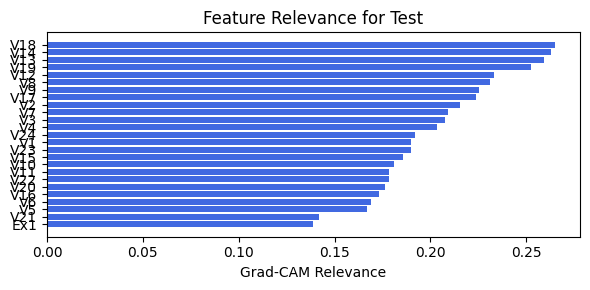

In [119]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.3.5 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=32

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.83e-01 | val_acc_hybrid: 9.44e-01 |: 100%|█████| 60/60 [02:58<00:00,  2.97s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.4616e-01 at 36 epoch
tensor(0.9341, device='cuda:0')
[[416  21   3   1]
 [  7 402  11   0]
 [  1   6  58   1]
 [  0   5  16 144]]
M_KAN Relevance: 0.28804734349250793
CNN Relevance: 0.7119526863098145
[('V15', 0.42373908), ('V20', 0.28241178), ('V19', 0.24523044), ('V18', 0.17289759), ('V13', 0.1450061), ('V17', 0.1435629), ('V7', 0.1350853), ('V12', 0.13381465), ('V6', 0.13041052), ('V22', 0.12842366), ('V5', 0.120878115), ('V4', 0.11832178), ('V11', 0.11784209), ('V14', 0.11561268), ('V3', 0.11433085), ('V16', 0.107944824), ('V8', 0.09114095), ('V9', 0.090689085), ('V24', 0.09047726), ('V2', 0.08795867), ('V10', 0.08657469), ('V23', 0.083069764), ('V1', 0.05992984), ('V21', 0.05328685)]


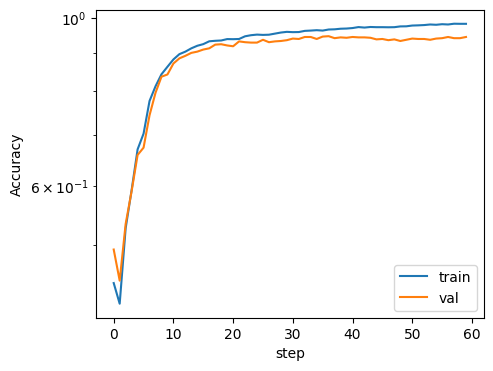

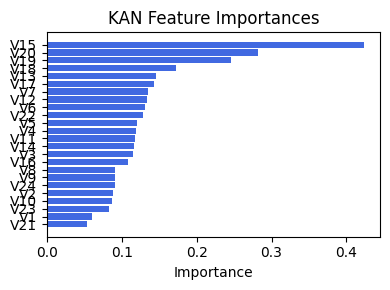

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.31560356690316593), ('V13', 0.31526341607739583), ('V14', 0.3100670647797595), ('V15', 0.28988872656926823), ('V18', 0.285034945003105), ('V8', 0.273937052009617), ('V20', 0.27330513925687056), ('V12', 0.2701519440242086), ('Ex1', 0.2642870376860365), ('V9', 0.2575453875154417), ('V17', 0.25465823161911905), ('V24', 0.2544099309185525), ('V10', 0.25033626090016664), ('V23', 0.22707957725574504), ('V7', 0.22261746357213308), ('V5', 0.1915487880286868), ('V22', 0.1771495971010797), ('V1', 0.17309507364988458), ('V16', 0.1701903308949313), ('V2', 0.16478202719700166), ('V6', 0.15987954636438567), ('V11', 0.15979250799400455), ('V3', 0.15779698499274353), ('V4', 0.15697763730973488), ('V21', 0.13627679111736002)]


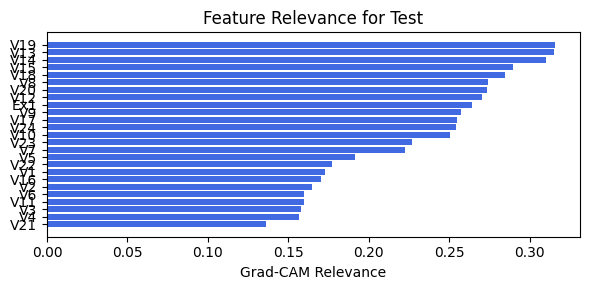

In [120]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=32, filename=filename_3, opt_col_val=32)

### 3.3.6 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.91e-01 | val_acc_hybrid: 9.08e-01 |: 100%|█████| 60/60 [02:46<00:00,  2.77s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3700e-01 at 16 epoch
tensor(0.9203, device='cuda:0')
[[411  26   3   1]
 [ 13 399   8   0]
 [  0  10  56   0]
 [  0   4  22 139]]
M_KAN Relevance: 0.32714757323265076
CNN Relevance: 0.6728523969650269
[('V20', 0.30762973), ('V19', 0.28297913), ('V15', 0.2668472), ('V14', 0.20579444), ('V18', 0.16295606), ('V13', 0.1625219), ('V11', 0.15106869), ('V7', 0.14708512), ('V23', 0.14383584), ('V22', 0.13953976), ('V3', 0.13417263), ('V24', 0.13039888), ('V8', 0.12779965), ('V12', 0.12757824), ('V5', 0.12620859), ('V6', 0.12147275), ('V4', 0.11735454), ('V10', 0.11627536), ('V21', 0.116190605), ('V2', 0.09987953), ('V16', 0.09217594), ('V1', 0.09145324), ('V17', 0.090833716), ('V9', 0.09062042)]


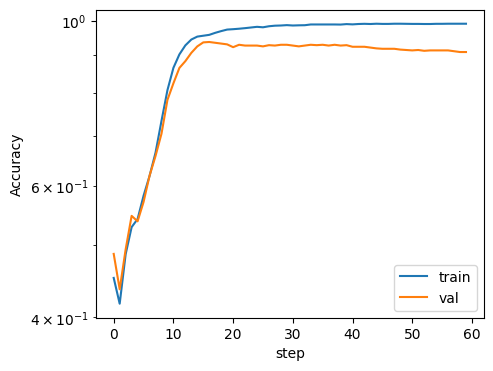

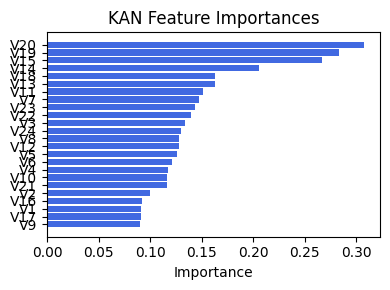

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.35786338615229724), ('V11', 0.27782303595888197), ('V17', 0.2556149280859151), ('V22', 0.2520351385113087), ('V6', 0.24269822704764843), ('V24', 0.24143517620205573), ('V7', 0.24060885755763606), ('V12', 0.2343921455932694), ('V23', 0.23099142289597877), ('V13', 0.23051914112410163), ('V8', 0.21657021158193107), ('V21', 0.21033799543989523), ('V9', 0.1858391162945553), ('V18', 0.17897539839319945), ('V19', 0.16450145931765545), ('V3', 0.16290148993574646), ('V2', 0.14843815706875824), ('Ex1', 0.1469060205806369), ('V4', 0.13111993354364182), ('V14', 0.1293925855483554), ('V1', 0.11522952459628015), ('V20', 0.11187166519691397), ('V5', 0.09528812223941667), ('V15', 0.08776723229385049), ('V10', 0.07102923074946221)]


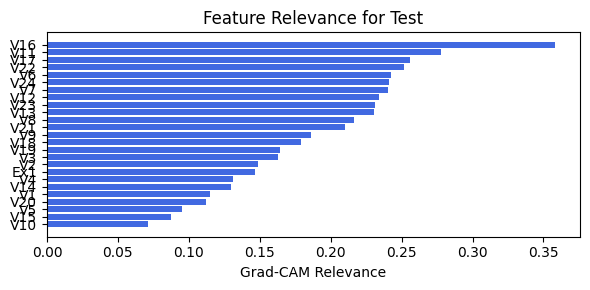

In [121]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=16, filename=filename_3, opt_col_val=16)

### 3.3.7 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=16

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.91e-01 | val_acc_hybrid: 9.08e-01 |: 100%|█████| 60/60 [02:46<00:00,  2.77s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3700e-01 at 16 epoch
tensor(0.9203, device='cuda:0')
[[411  26   3   1]
 [ 13 399   8   0]
 [  0  10  56   0]
 [  0   4  22 139]]
M_KAN Relevance: 0.32714757323265076
CNN Relevance: 0.6728523969650269
[('V20', 0.30762973), ('V19', 0.28297913), ('V15', 0.2668472), ('V14', 0.20579444), ('V18', 0.16295606), ('V13', 0.1625219), ('V11', 0.15106869), ('V7', 0.14708512), ('V23', 0.14383584), ('V22', 0.13953976), ('V3', 0.13417263), ('V24', 0.13039888), ('V8', 0.12779965), ('V12', 0.12757824), ('V5', 0.12620859), ('V6', 0.12147275), ('V4', 0.11735454), ('V10', 0.11627536), ('V21', 0.116190605), ('V2', 0.09987953), ('V16', 0.09217594), ('V1', 0.09145324), ('V17', 0.090833716), ('V9', 0.09062042)]


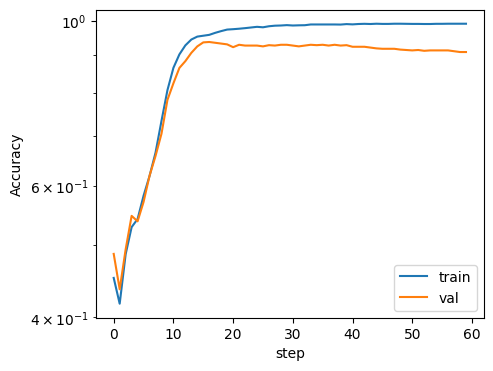

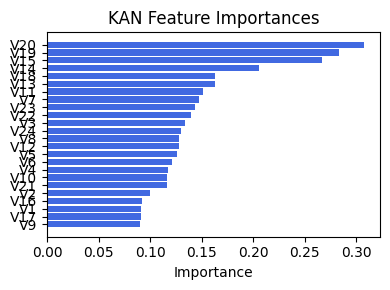

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.35786338615229724), ('V11', 0.27782303595888197), ('V17', 0.2556149280859151), ('V22', 0.2520351385113087), ('V6', 0.24269822704764843), ('V24', 0.24143517620205573), ('V7', 0.24060885755763606), ('V12', 0.2343921455932694), ('V23', 0.23099142289597877), ('V13', 0.23051914112410163), ('V8', 0.21657021158193107), ('V21', 0.21033799543989523), ('V9', 0.1858391162945553), ('V18', 0.17897539839319945), ('V19', 0.16450145931765545), ('V3', 0.16290148993574646), ('V2', 0.14843815706875824), ('Ex1', 0.1469060205806369), ('V4', 0.13111993354364182), ('V14', 0.1293925855483554), ('V1', 0.11522952459628015), ('V20', 0.11187166519691397), ('V5', 0.09528812223941667), ('V15', 0.08776723229385049), ('V10', 0.07102923074946221)]


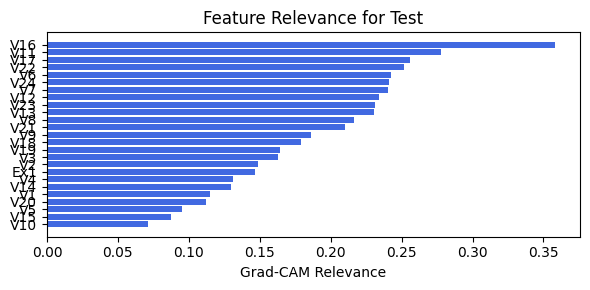

In [122]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=16, filename=filename_3, opt_col_val=16)

### 3.3.8 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.83e-01 | val_acc_hybrid: 9.10e-01 |: 100%|█████| 60/60 [02:49<00:00,  2.82s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.3127e-01 at 25 epoch
tensor(0.9148, device='cuda:0')
[[404  31   5   1]
 [ 11 403   4   2]
 [  0   6  53   7]
 [  0   4  22 139]]
M_KAN Relevance: 0.5450175404548645
CNN Relevance: 0.4549824297428131
[('V15', 0.35585845), ('V20', 0.2322749), ('V19', 0.22319227), ('V14', 0.20257589), ('V7', 0.17411025), ('V9', 0.1505648), ('V18', 0.14683649), ('V10', 0.14433461), ('V5', 0.1365663), ('V4', 0.13348839), ('V12', 0.1322173), ('V3', 0.12893131), ('V11', 0.123730265), ('V6', 0.12266872), ('V24', 0.12041703), ('V21', 0.11470137), ('V13', 0.103184536), ('V2', 0.101949), ('V16', 0.088653), ('V17', 0.087655306), ('V23', 0.08095885), ('V22', 0.07925675), ('V1', 0.069740154), ('V8', 0.069391884)]


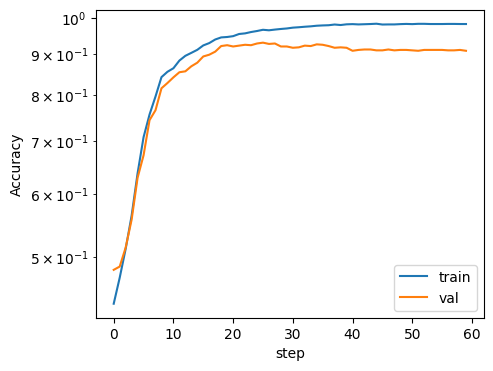

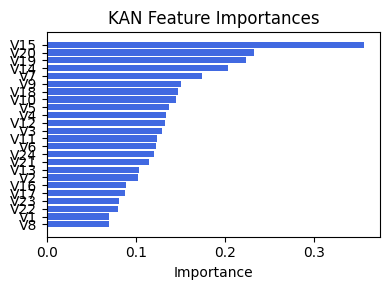

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.3389563577732258), ('V8', 0.23640804350256303), ('V13', 0.23431502908863547), ('V24', 0.23157189323581992), ('V23', 0.22725354049750518), ('V22', 0.21471423119736832), ('V19', 0.19524062218053068), ('V7', 0.18653524625746212), ('V18', 0.1763614688737377), ('V12', 0.1747603065122858), ('V17', 0.17285632060891046), ('V14', 0.16576864488227566), ('V9', 0.1642950966635688), ('V20', 0.15161416291859842), ('V15', 0.1264304060659458), ('V2', 0.12161481685525159), ('V3', 0.10873976112703704), ('V6', 0.10209677820876428), ('V16', 0.09811610915563679), ('V11', 0.09559695351686143), ('V4', 0.08479199095892156), ('V1', 0.08079731150385439), ('V10', 0.07696517928008902), ('V5', 0.05076571817800282), ('V21', 0.04258060754443538)]


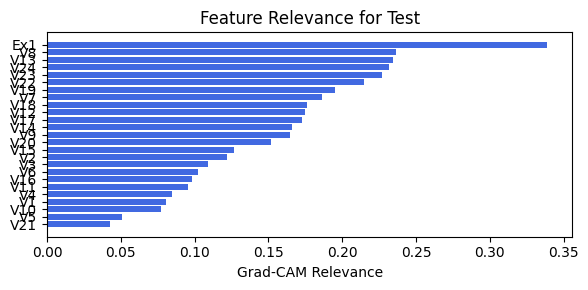

In [123]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=8, filename=filename_3, opt_col_val=8)

### 3.3.9 width=[24, 9], grid=8, lamb=0.001 | hidden_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


 train_acc_hybrid: 9.89e-01 | val_acc_hybrid: 9.06e-01 |: 100%|█████| 60/60 [02:53<00:00,  2.88s/it]


saving model version 0.1
✅ Best validation Accuracy: 9.1065e-01 at 58 epoch
tensor(0.9258, device='cuda:0')
[[410  27   3   1]
 [ 10 401   9   0]
 [  1   5  59   1]
 [  1   4  19 141]]
M_KAN Relevance: 0.6740855574607849
CNN Relevance: 0.3259144723415375
[('V19', 0.29869196), ('V15', 0.27909467), ('V20', 0.25963154), ('V14', 0.21319516), ('V16', 0.16472323), ('V13', 0.16156676), ('V7', 0.14474446), ('V17', 0.14320117), ('V6', 0.14215815), ('V18', 0.13855459), ('V24', 0.13273752), ('V10', 0.11399587), ('V9', 0.11226054), ('V5', 0.11197158), ('V11', 0.10954358), ('V21', 0.10741825), ('V12', 0.104257636), ('V22', 0.10337876), ('V23', 0.09986637), ('V8', 0.07113019), ('V3', 0.07090533), ('V1', 0.070630245), ('V2', 0.06901932), ('V4', 0.060226467)]


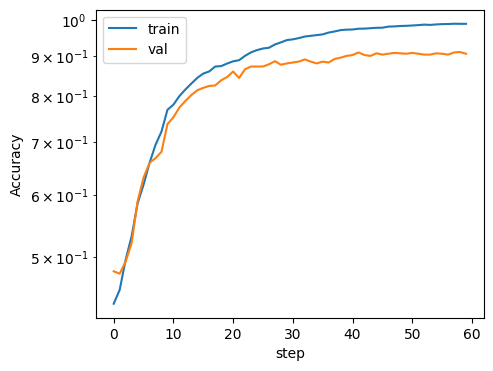

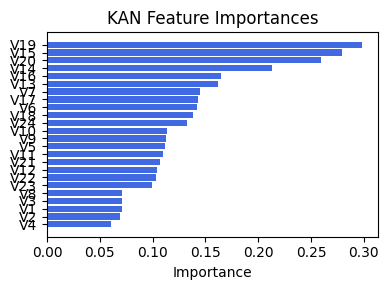

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.4069932727222591), ('V20', 0.3157812250252931), ('V15', 0.2767851874621143), ('V19', 0.24635940631365957), ('V14', 0.22585387724867917), ('V13', 0.22244046955760022), ('V18', 0.2098586229314719), ('V9', 0.20431520337238482), ('V8', 0.20250264223216288), ('V10', 0.18889282477220892), ('V22', 0.1868818118149724), ('V17', 0.18652050841426518), ('V12', 0.1849910235430085), ('V24', 0.18413875293020318), ('V23', 0.17388326213222838), ('V7', 0.15955267095311046), ('V3', 0.15751700372871816), ('V2', 0.15731129221427723), ('V4', 0.13531316756905074), ('V5', 0.13039470951924745), ('V1', 0.12410865840925514), ('V16', 0.10768301737106822), ('V11', 0.10333806517424791), ('V21', 0.10045261520582284), ('V6', 0.10018178406398841)]


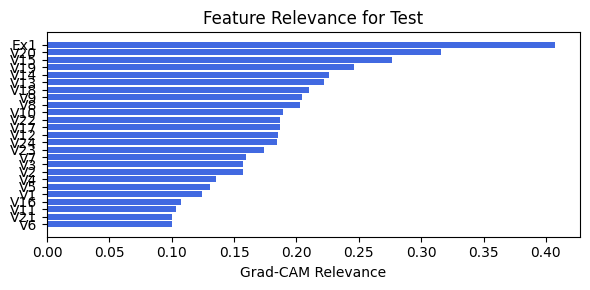

In [124]:
train_and_plot_relevance(Model3_3, kan_neurons=9, kan_grid=8, lamb=0.001, steps=60, hidden_dim=8, filename=filename_3, opt_col_val=8)

# Opt4: MultiHead Attention

In [44]:
create_csv_with_header(filename_4, columns_opt4)

## 4.0. width=[24, 12, 1], grid=8, lamb=0.001

### 4.0.0.0 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.61e-01 | val_acc_hybrid: 7.96e-01 |: 100%|█████| 80/80 [00:33<00:00,  2.41it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.9611e-01 at 79 epoch
tensor(0.7903, device='cuda:0')
[[358  78   4   1]
 [ 35 357  26   2]
 [  2  12  52   0]
 [  4  24  41  96]]
M_KAN Relevance: 0.2409304678440094
CNN Relevance: 0.759069561958313
[('V22', 0.2487732), ('V14', 0.20301083), ('V13', 0.1940951), ('V18', 0.18281624), ('V15', 0.1765378), ('V1', 0.16364956), ('V16', 0.15640287), ('V6', 0.15388072), ('V21', 0.15386167), ('V19', 0.15097563), ('V24', 0.13970882), ('V20', 0.12995856), ('V11', 0.12940222), ('V10', 0.12837994), ('V17', 0.12755339), ('V4', 0.12582546), ('V12', 0.11981308), ('V9', 0.11498674), ('V7', 0.1135578), ('V23', 0.1132282), ('V3', 0.096779585), ('V5', 0.090450466), ('V2', 0.08144826), ('V8', 0.07487948)]


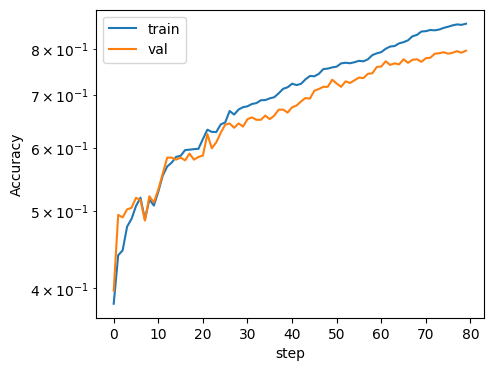

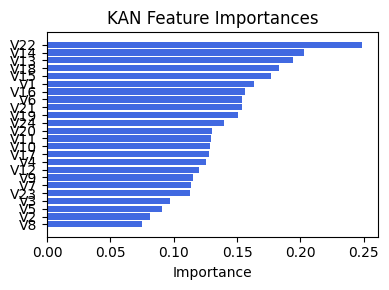

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V24', 0.3038972908963556), ('V22', 0.2829783844898861), ('V23', 0.27521513750252113), ('V12', 0.22616133660910867), ('V2', 0.22377927783582846), ('V1', 0.22165152081501613), ('V14', 0.21573050670689714), ('V19', 0.2127490332756309), ('V13', 0.20735948273305263), ('V17', 0.20561653184611733), ('V7', 0.20549679451516314), ('Ex1', 0.20204806867096212), ('V11', 0.19737054468309523), ('V3', 0.19407090556608672), ('V4', 0.18729856724282828), ('V8', 0.18648161753345704), ('V6', 0.1824465630028159), ('V21', 0.1755212274360279), ('V9', 0.16915989805564316), ('V5', 0.16793313280936423), ('V16', 0.16303978174188832), ('V18', 0.12574683459171113), ('V20', 0.12241490229179039), ('V10', 0.11767988456856637), ('V15', 0.11584013304456589)]


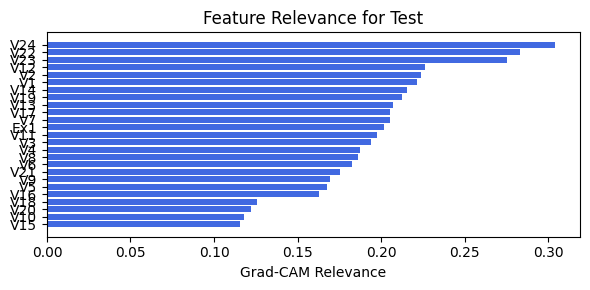

In [55]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=80, embed_dim=64, num_heads=2, filename=filename_4, opt_col_val='64, 2')

### 4.0.0.1 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.01e-01 | val_acc_hybrid: 8.16e-01 |: 100%|█████| 90/90 [00:40<00:00,  2.22it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.1672e-01 at 73 epoch
tensor(0.8132, device='cuda:0')
[[348  75  14   4]
 [ 24 386   8   2]
 [  2  23  38   3]
 [  3  19  27 116]]
M_KAN Relevance: 0.23732228577136993
CNN Relevance: 0.7626777291297913
[('V2', 0.24744181), ('V14', 0.20802808), ('V20', 0.20226085), ('V6', 0.18992136), ('V11', 0.18946505), ('V15', 0.1666112), ('V16', 0.16591787), ('V8', 0.16575521), ('V17', 0.16563791), ('V13', 0.15949401), ('V4', 0.15134922), ('V24', 0.14792705), ('V22', 0.13196073), ('V3', 0.122561745), ('V7', 0.12134032), ('V5', 0.121091485), ('V10', 0.1157917), ('V18', 0.115053974), ('V19', 0.11332652), ('V23', 0.10933001), ('V9', 0.10102706), ('V12', 0.08242218), ('V1', 0.07975301), ('V21', 0.070976935)]


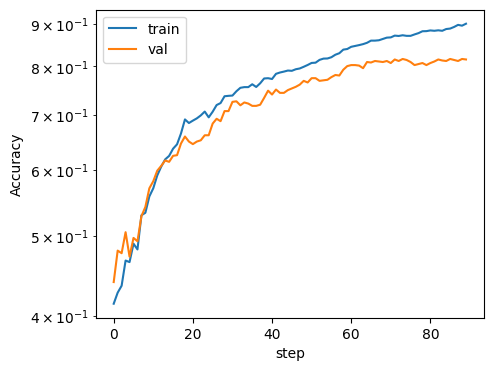

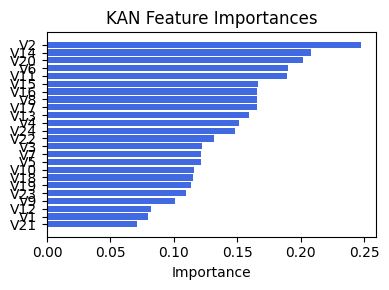

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.39074064428898336), ('V23', 0.3444444050198396), ('V22', 0.32548898383150354), ('V16', 0.3013628833822099), ('V24', 0.29750659573686117), ('V11', 0.2831302203919019), ('V15', 0.2329827954985136), ('V20', 0.22723536870466637), ('V9', 0.2125680655510915), ('V14', 0.2007468172097895), ('V19', 0.1975648495998816), ('V12', 0.1902701694749879), ('V7', 0.1865667505313441), ('V6', 0.18386580907910963), ('V10', 0.17969250875818774), ('V8', 0.16640350298839887), ('V13', 0.16521652585412325), ('Ex1', 0.1617088441288392), ('V17', 0.15838669505010397), ('V18', 0.13586893029234434), ('V4', 0.10783917742916387), ('V3', 0.1042212825482788), ('V5', 0.09594627262813213), ('V2', 0.0883929525056567), ('V1', 0.048200671023634255)]


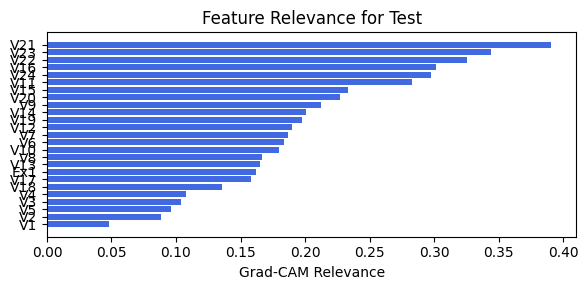

In [57]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=64, num_heads=2, filename=filename_4, opt_col_val='64, 2')

### 4.0.0.2 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.53e-01 | val_acc_hybrid: 7.32e-01 |: 100%|█████| 90/90 [00:38<00:00,  2.37it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.3654e-01 at 87 epoch
tensor(0.7647, device='cuda:0')
[[323 104  11   3]
 [ 38 365  15   2]
 [  2  23  41   0]
 [  8  27  24 106]]
M_KAN Relevance: 0.27601075172424316
CNN Relevance: 0.7239892482757568
[('V10', 0.23957269), ('V12', 0.23356292), ('V9', 0.18829668), ('V22', 0.18140963), ('V14', 0.1628453), ('V7', 0.15043414), ('V4', 0.14931718), ('V19', 0.13329473), ('V20', 0.123199105), ('V8', 0.12102556), ('V2', 0.11902265), ('V11', 0.1159122), ('V18', 0.10857771), ('V6', 0.10654422), ('V21', 0.10232377), ('V24', 0.10215478), ('V13', 0.09495728), ('V23', 0.09043346), ('V16', 0.08893725), ('V3', 0.08736857), ('V17', 0.08023679), ('V1', 0.072655864), ('V15', 0.06274171), ('V5', 0.052073486)]


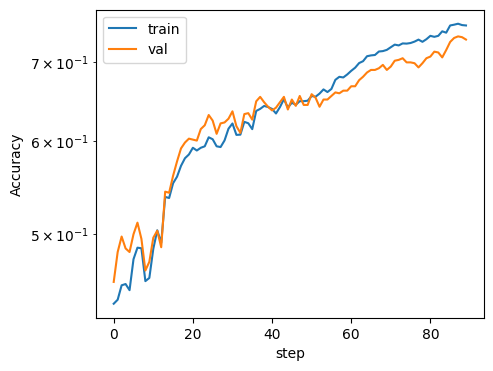

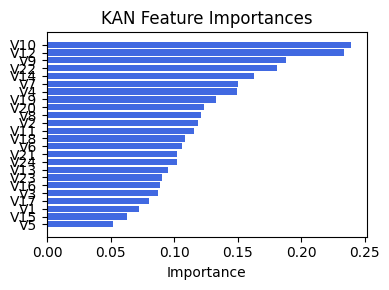

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.35472986876234097), ('V22', 0.34932058725290505), ('V24', 0.32349332803757963), ('V21', 0.30949873554565566), ('V13', 0.21549942218694296), ('V8', 0.21052066268215067), ('Ex1', 0.19562840609038448), ('V9', 0.19251958338376451), ('V11', 0.19062708864706546), ('V12', 0.18739646456157769), ('V7', 0.1840882427141335), ('V1', 0.17704850162360408), ('V6', 0.17418560580888934), ('V16', 0.17221325543348126), ('V17', 0.16652175436269612), ('V18', 0.15923412463681272), ('V19', 0.14629288613450825), ('V2', 0.13691782002791317), ('V14', 0.1354052564096718), ('V3', 0.11180063724821172), ('V20', 0.10892286556589922), ('V5', 0.09392305710288726), ('V15', 0.09389797689103337), ('V4', 0.08863418253626011), ('V10', 0.08723302927829693)]


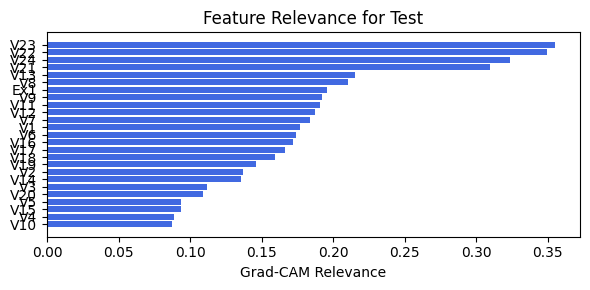

In [58]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=64, num_heads=4, filename=filename_4, opt_col_val='64, 4')

### 4.0.0.3 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.61e-01 | val_acc_hybrid: 7.15e-01 |: 100%|█████| 90/90 [00:38<00:00,  2.33it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.2738e-01 at 84 epoch
tensor(0.7253, device='cuda:0')
[[321 114   5   1]
 [ 54 349  15   2]
 [  2  24  40   0]
 [  1  32  50  82]]
M_KAN Relevance: 0.2861621379852295
CNN Relevance: 0.7138379216194153
[('V13', 0.22009663), ('V22', 0.21763611), ('V7', 0.21298021), ('V6', 0.20669375), ('V11', 0.20348601), ('V14', 0.2023236), ('V2', 0.20201579), ('V3', 0.197479), ('V15', 0.18895292), ('V12', 0.18890557), ('V5', 0.17922875), ('V9', 0.17912637), ('V4', 0.17195593), ('V21', 0.15634233), ('V1', 0.14649168), ('V20', 0.1443835), ('V16', 0.14195323), ('V23', 0.14037839), ('V24', 0.1276806), ('V10', 0.12171161), ('V19', 0.1132686), ('V18', 0.11149615), ('V8', 0.10227552), ('V17', 0.09470179)]


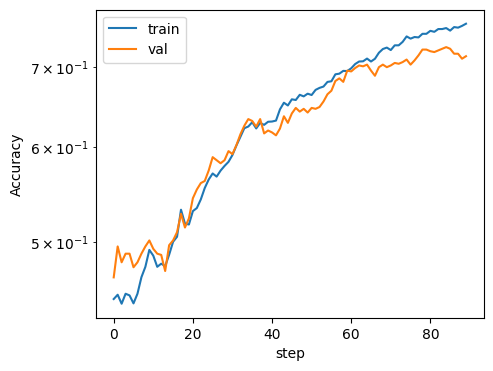

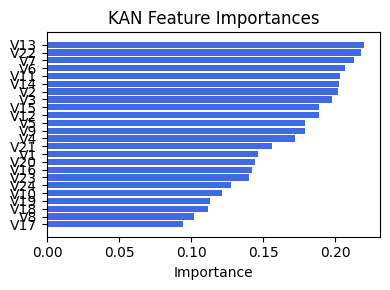

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.342537353657789), ('V22', 0.33713436720824236), ('V24', 0.3163153261166205), ('V8', 0.28774334069218505), ('V13', 0.27357152487226377), ('V21', 0.2647551051467727), ('V17', 0.2395193578214099), ('V18', 0.22524361663341058), ('V16', 0.2178707728310617), ('V7', 0.21357981192446232), ('V12', 0.20472225522571003), ('V9', 0.19572746386358045), ('Ex1', 0.1875691711483651), ('V19', 0.17200285007077284), ('V11', 0.1717259487605978), ('V6', 0.1655351600246375), ('V14', 0.14864461748025934), ('V1', 0.14502136267172805), ('V5', 0.14176179956075263), ('V3', 0.13962188651973417), ('V4', 0.13282951383241995), ('V2', 0.131913396673247), ('V15', 0.10479428744543345), ('V10', 0.09937063086886905), ('V20', 0.09855877494967669)]


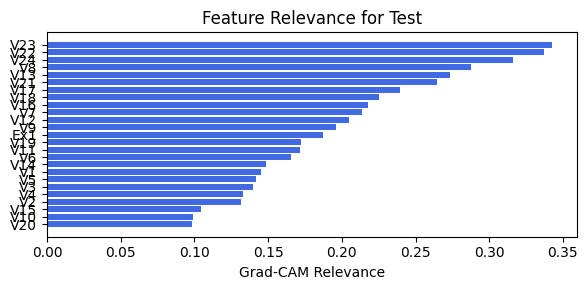

In [59]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=64, num_heads=4, filename=filename_4, opt_col_val='64, 4')

### 4.0.0.4 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.41e-01 | val_acc_hybrid: 7.89e-01 |: 100%|█████| 90/90 [00:39<00:00,  2.28it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.8923e-01 at 89 epoch
tensor(0.7949, device='cuda:0')
[[356  79   4   2]
 [ 31 377  12   0]
 [  1  16  48   1]
 [  2  22  54  87]]
M_KAN Relevance: 0.18004217743873596
CNN Relevance: 0.8199577927589417
[('V13', 0.32174432), ('V6', 0.20674023), ('V22', 0.19490993), ('V14', 0.18790433), ('V16', 0.17265777), ('V18', 0.16884355), ('V21', 0.16837797), ('V3', 0.1670163), ('V24', 0.154461), ('V1', 0.13814458), ('V23', 0.1370641), ('V12', 0.13650325), ('V20', 0.1362513), ('V15', 0.13208197), ('V7', 0.114528745), ('V2', 0.110114895), ('V19', 0.10976082), ('V17', 0.1090225), ('V9', 0.10603817), ('V11', 0.0967738), ('V4', 0.09520735), ('V5', 0.094843835), ('V10', 0.06450452), ('V8', 0.052737474)]


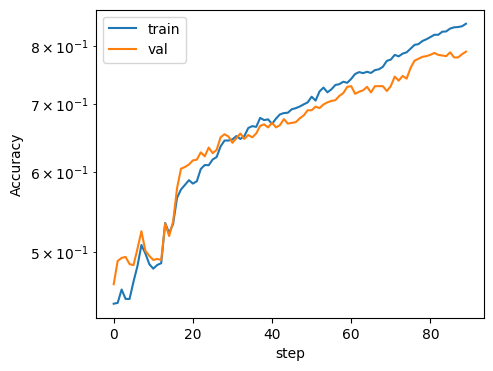

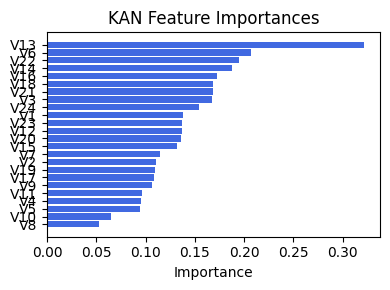

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3332064801708952), ('V22', 0.325516703165937), ('V24', 0.3101055442642467), ('V13', 0.2734324846302855), ('V21', 0.26759050803651013), ('V8', 0.2486489675433364), ('V9', 0.21559915968434354), ('V7', 0.20907312713844034), ('Ex1', 0.19342756186705942), ('V17', 0.18812492184896165), ('V18', 0.1749543506733165), ('V12', 0.17005683641913585), ('V14', 0.1615558929623568), ('V2', 0.15204158572532), ('V19', 0.14890968352554096), ('V4', 0.14717655308212446), ('V5', 0.1433372122686066), ('V3', 0.14197663137049163), ('V16', 0.1415628561378101), ('V1', 0.12975882571593572), ('V6', 0.12914551026473012), ('V11', 0.11305140313927886), ('V10', 0.1035715071126512), ('V15', 0.1018758755820209), ('V20', 0.09802925358078832)]


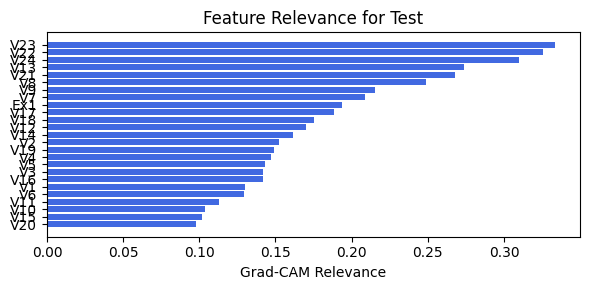

In [62]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=64, num_heads=8, filename=filename_4, opt_col_val='64, 8')

### 4.0.0.5 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.86e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 90/90 [00:38<00:00,  2.36it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.1478e-01 at 87 epoch
tensor(0.7097, device='cuda:0')
[[303 130   8   0]
 [ 43 351  25   1]
 [  0  18  48   0]
 [  2  22  68  73]]
M_KAN Relevance: 0.14930832386016846
CNN Relevance: 0.8506916761398315
[('V13', 0.25316697), ('V15', 0.21044612), ('V7', 0.2095164), ('V14', 0.19737314), ('V2', 0.1871413), ('V17', 0.17325561), ('V21', 0.14938101), ('V22', 0.14657223), ('V6', 0.1338872), ('V1', 0.12205982), ('V18', 0.11976132), ('V16', 0.118408166), ('V20', 0.11576401), ('V10', 0.11353557), ('V24', 0.11042468), ('V19', 0.10997556), ('V11', 0.094266444), ('V3', 0.09292686), ('V4', 0.089235805), ('V9', 0.083217144), ('V23', 0.080631286), ('V5', 0.07778424), ('V12', 0.077548295), ('V8', 0.0562722)]


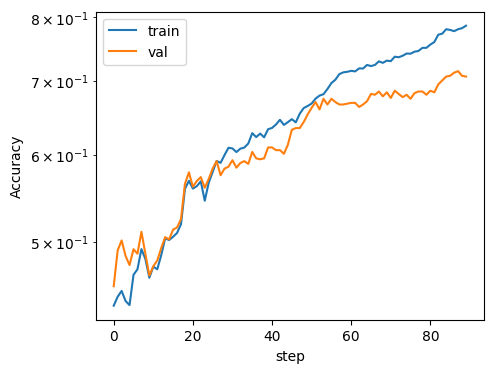

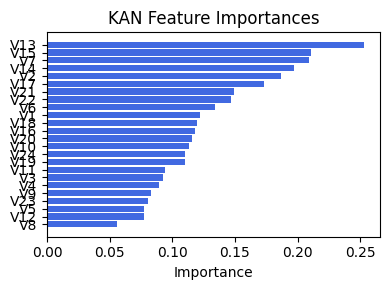

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.3477786251128653), ('V24', 0.3378535067676349), ('V23', 0.32034986543692956), ('V22', 0.301302568850008), ('V18', 0.2917272368317637), ('Ex1', 0.27769633404605243), ('V8', 0.27070563481889526), ('V19', 0.2558766778719683), ('V17', 0.2474002770370814), ('V12', 0.24457583576206274), ('V21', 0.22036995392919537), ('V7', 0.20641823491858124), ('V9', 0.20016686864000272), ('V1', 0.17552939385805008), ('V14', 0.17094322612230672), ('V6', 0.15956811206040036), ('V2', 0.15611962666687612), ('V20', 0.14285508279191653), ('V16', 0.13547963844013267), ('V3', 0.1228855806344228), ('V11', 0.11643595067169492), ('V4', 0.11207772250975892), ('V5', 0.10339990410800252), ('V15', 0.09769563866381319), ('V10', 0.08115249868965443)]


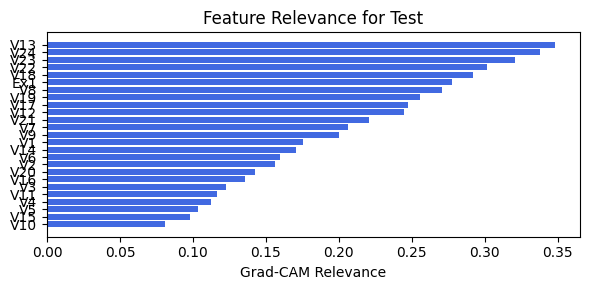

In [64]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=64, num_heads=8, filename=filename_4, opt_col_val='64, 8')

### 4.0.1.0 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.30e-01 | val_acc_hybrid: 7.23e-01 |: 100%|█████| 90/90 [00:30<00:00,  2.92it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.4456e-01 at 63 epoch
tensor(0.7454, device='cuda:0')
[[310 106  19   6]
 [ 30 373  16   1]
 [  3  26  36   1]
 [ 10  18  42  95]]
M_KAN Relevance: 0.2743430435657501
CNN Relevance: 0.7256569266319275
[('V22', 0.25746828), ('V14', 0.23875682), ('V15', 0.21090087), ('V13', 0.20889835), ('V7', 0.20257173), ('V21', 0.18835227), ('V5', 0.17817461), ('V2', 0.16289961), ('V20', 0.16140406), ('V24', 0.15254857), ('V18', 0.15140784), ('V9', 0.15134001), ('V17', 0.14981863), ('V16', 0.14519519), ('V11', 0.14489126), ('V1', 0.14100367), ('V12', 0.13488893), ('V23', 0.13112494), ('V3', 0.13098735), ('V19', 0.12612008), ('V4', 0.11702805), ('V6', 0.11644941), ('V8', 0.10359804), ('V10', 0.10039264)]


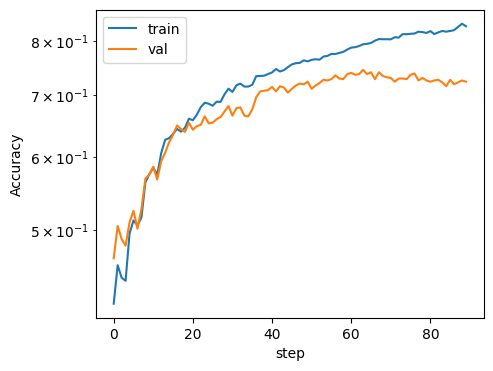

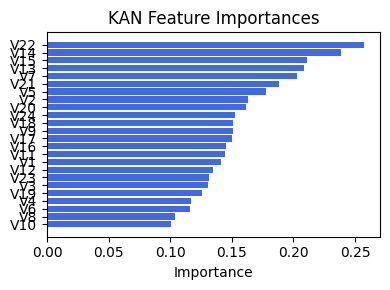

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.3220988899853122), ('V8', 0.3048660573076232), ('V23', 0.3023471088189591), ('V7', 0.25625450775345393), ('V24', 0.2470959830698054), ('V13', 0.24474737989992504), ('V9', 0.23537782041564706), ('V3', 0.23511415122416626), ('V2', 0.23144580045396856), ('V21', 0.2259708407883532), ('V17', 0.21888717340483801), ('V6', 0.21863259883768757), ('V18', 0.21256145478054395), ('V16', 0.21184986807716602), ('V12', 0.2065962247459125), ('V1', 0.20258767722002247), ('V19', 0.1941570038272116), ('V11', 0.18726952586777917), ('V20', 0.17547159735838314), ('V4', 0.16954298855080363), ('V14', 0.1689631707786481), ('Ex1', 0.16674003439491725), ('V15', 0.16334504736622318), ('V10', 0.1345640370238384), ('V5', 0.09063946358139965)]


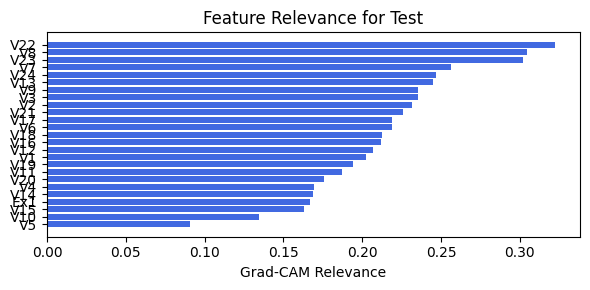

In [65]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=32, num_heads=2, filename=filename_4, opt_col_val='32, 2')

### 4.0.1.1 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.75e-01 | val_acc_hybrid: 8.08e-01 |: 100%|█████| 90/90 [00:30<00:00,  2.92it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.1329e-01 at 83 epoch
tensor(0.7821, device='cuda:0')
[[342  81  17   1]
 [ 30 369  20   1]
 [  2  23  39   2]
 [  4  19  38 104]]
M_KAN Relevance: 0.37769991159439087
CNN Relevance: 0.6223000884056091
[('V13', 0.23860525), ('V14', 0.23374543), ('V18', 0.21763304), ('V22', 0.19827202), ('V21', 0.18592045), ('V16', 0.180392), ('V20', 0.17035393), ('V7', 0.16972618), ('V9', 0.16834986), ('V24', 0.15331772), ('V19', 0.13552478), ('V17', 0.13190156), ('V2', 0.12938131), ('V11', 0.12717152), ('V1', 0.1243466), ('V15', 0.11318603), ('V5', 0.1108925), ('V8', 0.096288286), ('V10', 0.092273846), ('V6', 0.088355064), ('V23', 0.08552492), ('V4', 0.08295837), ('V12', 0.08216311), ('V3', 0.08014481)]


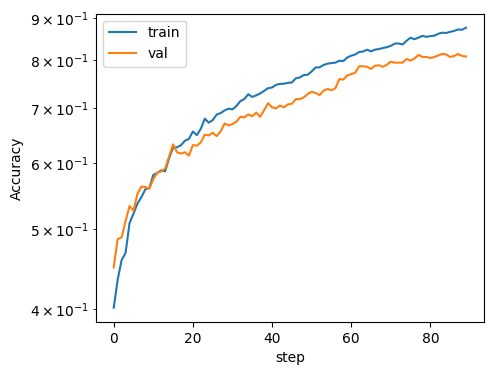

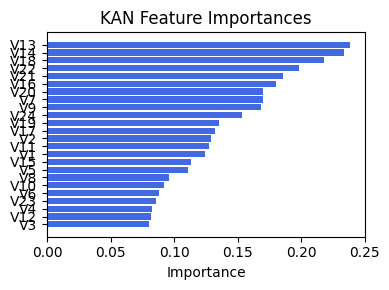

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.338973091385211), ('V23', 0.32316918815843404), ('V24', 0.2823619628917842), ('V21', 0.2737822822948393), ('V8', 0.2731068855481591), ('V13', 0.26277462209168917), ('V7', 0.2351149648346362), ('V16', 0.21966655150391912), ('V17', 0.2120005774301647), ('V6', 0.2037668052763655), ('V18', 0.20145011429219897), ('V9', 0.19334846101287356), ('V19', 0.18770856959751683), ('V12', 0.18769522822021628), ('V3', 0.17138635446534972), ('V11', 0.16981443778676236), ('V1', 0.1678411248167755), ('V2', 0.15768639851076233), ('V14', 0.15309589175400945), ('V4', 0.13245032905502246), ('V5', 0.10970655714401964), ('V10', 0.09650468100497518), ('V20', 0.08871544829122992), ('V15', 0.08865036047478371), ('Ex1', 0.07413070775033209)]


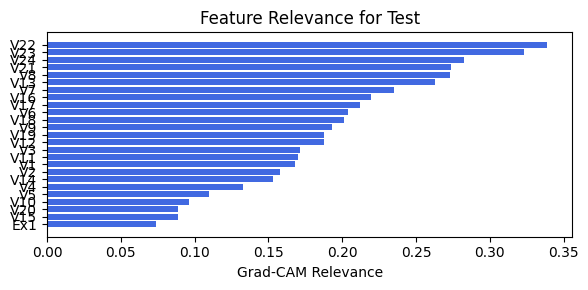

In [66]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=32, num_heads=2, filename=filename_4, opt_col_val='32, 2')

### 4.0.1.2 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.75e-01 | val_acc_hybrid: 7.59e-01 |: 100%|█████| 90/90 [00:32<00:00,  2.78it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.7434e-01 at 69 epoch
tensor(0.7756, device='cuda:0')
[[334  90  13   4]
 [ 23 376  19   2]
 [  0  29  36   1]
 [  4  21  39 101]]
M_KAN Relevance: 0.36563652753829956
CNN Relevance: 0.6343634724617004
[('V14', 0.25264627), ('V22', 0.20485142), ('V13', 0.188475), ('V7', 0.17935131), ('V15', 0.173667), ('V11', 0.1727079), ('V9', 0.1473991), ('V20', 0.14330894), ('V3', 0.13747706), ('V18', 0.13715968), ('V16', 0.1368763), ('V4', 0.13512552), ('V24', 0.13411185), ('V17', 0.13133493), ('V19', 0.120167434), ('V21', 0.118458025), ('V10', 0.1175051), ('V1', 0.109398924), ('V6', 0.1064868), ('V5', 0.10647033), ('V2', 0.1055662), ('V23', 0.10128152), ('V12', 0.095787816), ('V8', 0.067905426)]


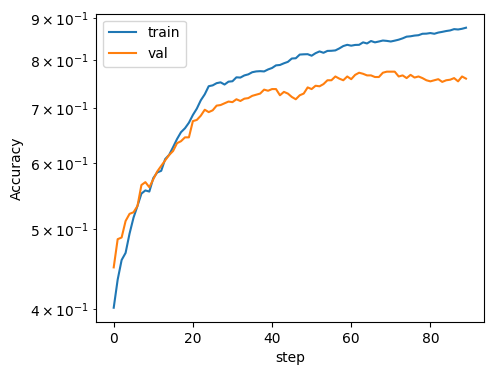

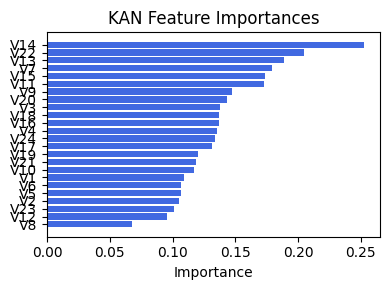

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.3794025232103831), ('V23', 0.3716407419736612), ('V24', 0.3126158237816756), ('V21', 0.2928629014341213), ('V7', 0.2252479883681608), ('V8', 0.21009996537903355), ('V16', 0.20937140723048614), ('V6', 0.1960254114533716), ('V1', 0.19418633246612896), ('V2', 0.19136053120738514), ('V17', 0.18468627397594853), ('V18', 0.1795114649288295), ('V13', 0.17852347466180288), ('V3', 0.16995258324808568), ('V9', 0.1693502681980898), ('V11', 0.16858997834542971), ('V19', 0.16675335024438726), ('V12', 0.158663443356007), ('V20', 0.14746578843083366), ('V14', 0.14194171965673277), ('V4', 0.13126036804176747), ('V15', 0.12334982694629107), ('V10', 0.12226112623422203), ('V5', 0.10913218126283054), ('Ex1', 0.09504136076035412)]


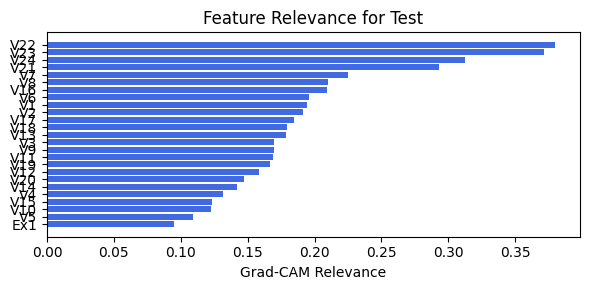

In [67]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=32, num_heads=4, filename=filename_4, opt_col_val='32, 4')

### 4.0.1.3 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.53e-01 | val_acc_hybrid: 7.47e-01 |: 100%|█████| 90/90 [00:31<00:00,  2.88it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.5830e-01 at 74 epoch
tensor(0.7619, device='cuda:0')
[[326  98  16   1]
 [ 27 375  17   1]
 [  3  26  34   3]
 [  9  19  40  97]]
M_KAN Relevance: 0.30999425053596497
CNN Relevance: 0.6900057196617126
[('V14', 0.25341606), ('V13', 0.24693885), ('V22', 0.23310064), ('V20', 0.18966722), ('V15', 0.1779345), ('V21', 0.17403142), ('V2', 0.16355392), ('V24', 0.16200387), ('V16', 0.16071737), ('V18', 0.15552717), ('V19', 0.15547177), ('V9', 0.14947838), ('V7', 0.14478852), ('V5', 0.13849322), ('V11', 0.12472473), ('V10', 0.1215271), ('V17', 0.11888638), ('V1', 0.1139222), ('V23', 0.109198555), ('V12', 0.108183354), ('V3', 0.096463464), ('V4', 0.08622749), ('V6', 0.077932335), ('V8', 0.06743808)]


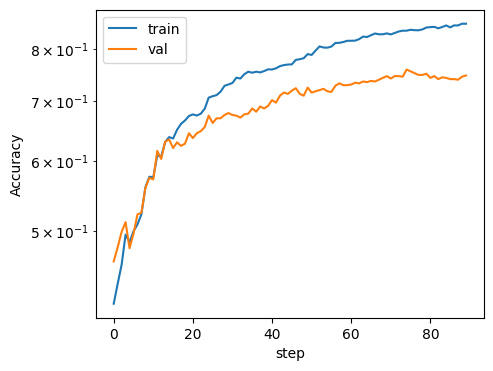

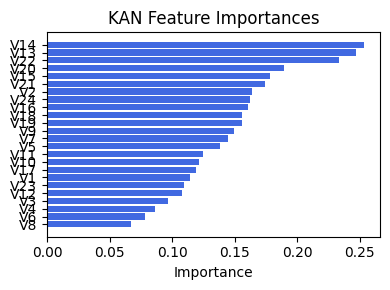

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3059822710193314), ('V22', 0.2673163043765161), ('V19', 0.2635482481078598), ('V8', 0.25813114768090145), ('V13', 0.2572090843592851), ('V23', 0.23834089811430453), ('V16', 0.23155186738936526), ('V24', 0.2268974498128955), ('V18', 0.2231736322740959), ('V7', 0.21561644133692096), ('V12', 0.20885486585627536), ('V9', 0.2060588660189331), ('V17', 0.2022959891895507), ('V14', 0.19695687685586127), ('V20', 0.1876889709450412), ('V11', 0.1676503966833303), ('V6', 0.1644335943587626), ('Ex1', 0.15181450537690977), ('V15', 0.14820096771051125), ('V2', 0.14065399810167767), ('V3', 0.13873870997005538), ('V1', 0.13577556168588056), ('V4', 0.11125317145851965), ('V5', 0.10491983049116123), ('V10', 0.09917468302265685)]


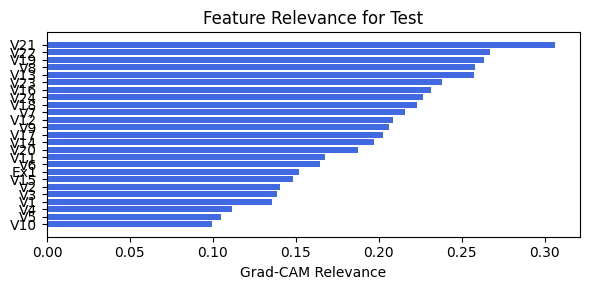

In [68]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=32, num_heads=4, filename=filename_4, opt_col_val='32, 4')

### 4.0.1.4 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.00e-01 | val_acc_hybrid: 7.51e-01 |: 100%|█████| 90/90 [00:32<00:00,  2.75it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.7434e-01 at 65 epoch
tensor(0.7683, device='cuda:0')
[[338  85  13   5]
 [ 36 364  20   0]
 [  1  27  35   3]
 [  7  15  41 102]]
M_KAN Relevance: 0.39483925700187683
CNN Relevance: 0.6051607131958008
[('V22', 0.22873724), ('V14', 0.22566628), ('V15', 0.21722083), ('V7', 0.1993386), ('V13', 0.1899358), ('V20', 0.18460116), ('V18', 0.17429042), ('V21', 0.17340595), ('V2', 0.16090032), ('V16', 0.1520593), ('V12', 0.14766486), ('V24', 0.14416407), ('V5', 0.14192039), ('V3', 0.13686001), ('V6', 0.12780795), ('V19', 0.12538145), ('V1', 0.122679405), ('V17', 0.12044539), ('V9', 0.11951655), ('V11', 0.115103744), ('V23', 0.10826303), ('V8', 0.10441673), ('V10', 0.10107516), ('V4', 0.076873735)]


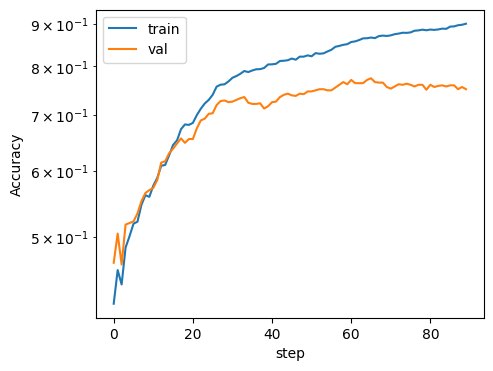

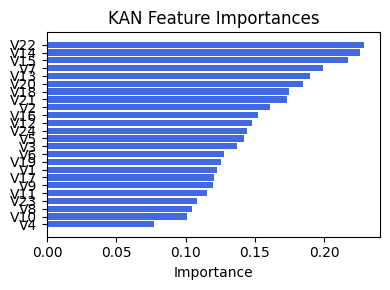

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.36753575665584853), ('V22', 0.3213282352578292), ('V23', 0.2952250486108394), ('V24', 0.2709943085270098), ('V8', 0.24738193594470226), ('V19', 0.23692511427427715), ('V7', 0.23683797524381453), ('V9', 0.23106233061990836), ('V16', 0.22831313510905868), ('V13', 0.21894891375390943), ('V12', 0.20142119793812385), ('V14', 0.18941212578652866), ('V6', 0.18181910924005815), ('V11', 0.17824733389401637), ('V17', 0.16695352315862413), ('V2', 0.14720992417942097), ('V18', 0.1427341505906832), ('V3', 0.13665787418133168), ('V20', 0.13661851244253675), ('V5', 0.11262304119220941), ('V4', 0.10935722294554527), ('V1', 0.10392144445665505), ('V15', 0.10203478610575599), ('V10', 0.09992704422751185), ('Ex1', 0.07277459658533209)]


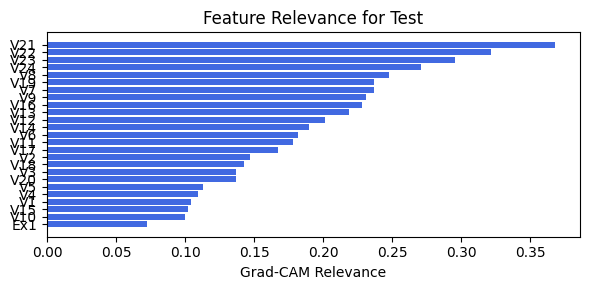

In [69]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=32, num_heads=8, filename=filename_4, opt_col_val='32, 8')

### 4.0.1.5 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.47e-01 | val_acc_hybrid: 7.66e-01 |: 100%|█████| 90/90 [00:31<00:00,  2.85it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.6632e-01 at 89 epoch
tensor(0.7482, device='cuda:0')
[[329  97  13   2]
 [ 38 354  25   3]
 [  2  27  34   3]
 [  5  19  41 100]]
M_KAN Relevance: 0.43373897671699524
CNN Relevance: 0.5662609934806824
[('V22', 0.26645166), ('V14', 0.25195783), ('V9', 0.22490303), ('V13', 0.21107036), ('V7', 0.17880276), ('V15', 0.17285073), ('V20', 0.17206745), ('V5', 0.16512275), ('V4', 0.16474956), ('V18', 0.16289209), ('V21', 0.16221856), ('V24', 0.15993032), ('V2', 0.15847374), ('V16', 0.1488833), ('V19', 0.14105438), ('V17', 0.12092522), ('V8', 0.11621433), ('V1', 0.11409588), ('V11', 0.11289729), ('V3', 0.109335855), ('V23', 0.093335204), ('V6', 0.08937778), ('V12', 0.08755046), ('V10', 0.07189837)]


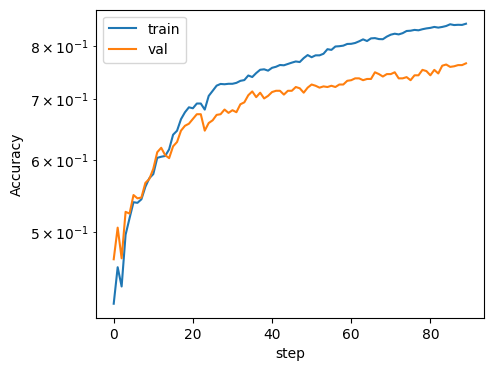

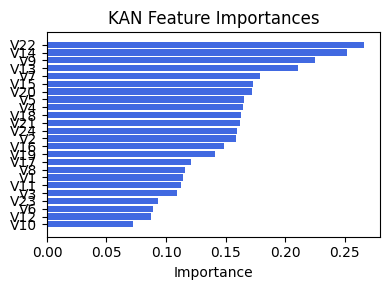

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.35874307798740485), ('V22', 0.3249885113954749), ('V23', 0.30348314687681177), ('V24', 0.2641771029484383), ('V16', 0.26069458406041973), ('V13', 0.23543465066699681), ('V7', 0.2210376389416907), ('V8', 0.21138553229935003), ('V19', 0.2069499914340844), ('V6', 0.19401298542335355), ('V11', 0.18190353001366366), ('V12', 0.17781778834457423), ('V17', 0.1772138201903188), ('V9', 0.16937110513257247), ('V18', 0.16702523863618757), ('V14', 0.14585076469750044), ('V20', 0.11943174753030643), ('V2', 0.11797246450697747), ('V1', 0.11293367854909026), ('V5', 0.11155593947907431), ('V3', 0.1083198412294163), ('V10', 0.10640171691640914), ('V4', 0.09895750606830629), ('V15', 0.08864696116918258), ('Ex1', 0.06969437664001059)]


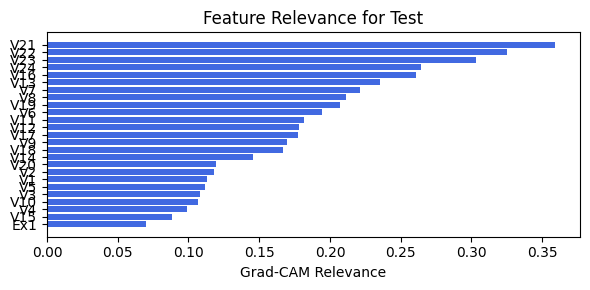

In [70]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=90, embed_dim=32, num_heads=8, filename=filename_4, opt_col_val='32, 8')

### 4.0.2.0 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.46e-01 | val_acc_hybrid: 7.64e-01 |: 100%|█████| 80/80 [00:27<00:00,  2.94it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.6403e-01 at 79 epoch
tensor(0.7848, device='cuda:0')
[[333  91  13   4]
 [ 25 377  14   4]
 [  1  26  36   3]
 [  6  19  29 111]]
M_KAN Relevance: 0.5611759424209595
CNN Relevance: 0.43882399797439575
[('V22', 0.25714624), ('V14', 0.23925047), ('V9', 0.21734473), ('V16', 0.18579714), ('V18', 0.17014536), ('V13', 0.16386674), ('V11', 0.16311863), ('V10', 0.161039), ('V20', 0.15517992), ('V15', 0.1529932), ('V21', 0.14827424), ('V23', 0.13958228), ('V24', 0.13596064), ('V12', 0.13452919), ('V1', 0.12240368), ('V19', 0.119103044), ('V7', 0.117211744), ('V5', 0.115914464), ('V17', 0.11382094), ('V3', 0.112248644), ('V2', 0.10889587), ('V4', 0.09655088), ('V6', 0.08984102), ('V8', 0.05403906)]


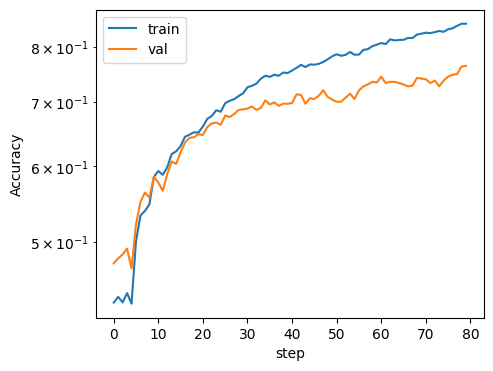

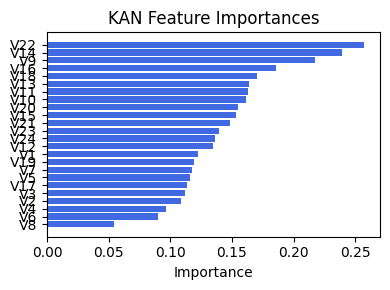

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.27837838037340346), ('V22', 0.27261853573874273), ('V19', 0.26610361546172434), ('V21', 0.2619065673952785), ('V9', 0.26062779737130704), ('V24', 0.2600740964833396), ('V7', 0.24563155853683627), ('V16', 0.23703803591681355), ('V13', 0.22941581106217213), ('V8', 0.2291130592799803), ('V12', 0.22412191250683403), ('V14', 0.22182972419490157), ('V17', 0.2008852628284627), ('V11', 0.18428417522184748), ('V20', 0.17875854982593653), ('V18', 0.17708169995851247), ('V3', 0.17065386955355846), ('V15', 0.16868602117548498), ('V2', 0.16680953104487312), ('V10', 0.15724210125597146), ('V6', 0.15534333430888173), ('V4', 0.14163110022904413), ('V1', 0.1394753473678415), ('V5', 0.10482609411772854), ('Ex1', 0.09799419875395667)]


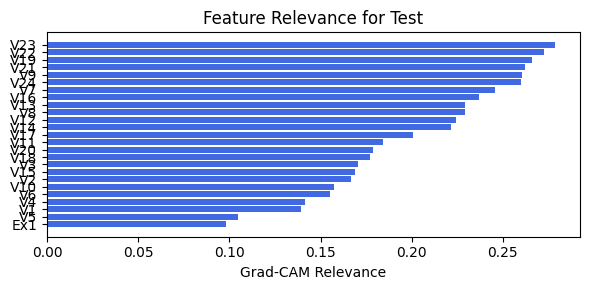

In [71]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=80, embed_dim=16, num_heads=2, filename=filename_4, opt_col_val='16, 2')

### 4.0.2.1 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 6.14e-01 | val_acc_hybrid: 6.16e-01 |: 100%|█████| 80/80 [00:28<00:00,  2.80it/s]


saving model version 0.1
✅ Best validation Accuracy: 6.1627e-01 at 79 epoch
tensor(0.6081, device='cuda:0')
[[253 156  30   2]
 [ 50 337  33   0]
 [  0  38  28   0]
 [  7  42  70  46]]
M_KAN Relevance: 0.58831787109375
CNN Relevance: 0.41168212890625
[('V7', 0.26890102), ('V14', 0.26419735), ('V5', 0.24495922), ('V2', 0.2132309), ('V13', 0.20919141), ('V10', 0.20777678), ('V4', 0.19924924), ('V22', 0.19763713), ('V15', 0.17849264), ('V11', 0.17478918), ('V8', 0.16616072), ('V6', 0.1560788), ('V20', 0.14330214), ('V9', 0.14088291), ('V12', 0.14012176), ('V16', 0.13762914), ('V21', 0.1375265), ('V19', 0.13558531), ('V24', 0.13190731), ('V3', 0.12756708), ('V1', 0.11494619), ('V23', 0.11137079), ('V18', 0.09365078), ('V17', 0.08290213)]


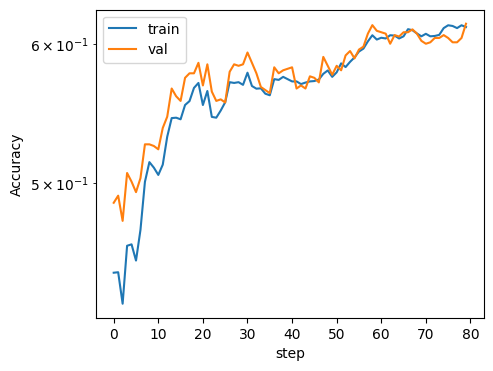

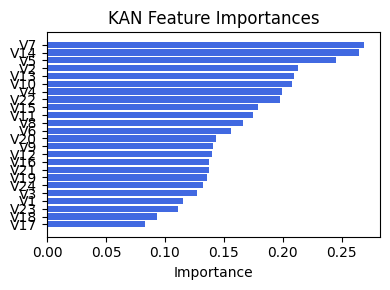

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V9', 0.3440328552058238), ('V20', 0.3127810459142856), ('V15', 0.3088222917216453), ('V24', 0.3006339858545352), ('V23', 0.29465313776628194), ('V2', 0.2906739798539929), ('V19', 0.2870585514366002), ('V14', 0.2829033859136108), ('Ex1', 0.2791917046465592), ('V10', 0.27872237496362334), ('V4', 0.2782768034026265), ('V3', 0.2737764469083508), ('V7', 0.27154602382597326), ('V1', 0.25519367825835193), ('V8', 0.25123552806390154), ('V5', 0.220617547802995), ('V22', 0.20588902051342248), ('V6', 0.19604731644452533), ('V17', 0.19490405738029856), ('V13', 0.19188189965518423), ('V12', 0.18923490242853475), ('V16', 0.17700692769157061), ('V11', 0.17430439719379343), ('V18', 0.16865204400195308), ('V21', 0.14372256890791316)]


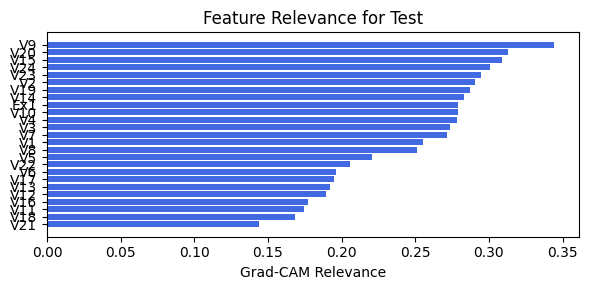

In [72]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=80, embed_dim=16, num_heads=2, filename=filename_4, opt_col_val='16, 2')

### 4.0.2.2 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.20e-01 | val_acc_hybrid: 7.24e-01 |: 100%|█████| 80/80 [00:26<00:00,  3.05it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.3310e-01 at 51 epoch
tensor(0.7106, device='cuda:0')
[[311 106  20   4]
 [ 43 338  36   3]
 [  1  22  40   3]
 [  5  33  40  87]]
M_KAN Relevance: 0.6821707487106323
CNN Relevance: 0.3178291916847229
[('V22', 0.22030048), ('V2', 0.2130491), ('V14', 0.19665466), ('V6', 0.1754444), ('V20', 0.164766), ('V11', 0.1551556), ('V21', 0.14669439), ('V9', 0.14506683), ('V12', 0.14088747), ('V5', 0.13502026), ('V18', 0.13328275), ('V19', 0.13322197), ('V3', 0.12315409), ('V13', 0.115985155), ('V7', 0.11487974), ('V15', 0.11298361), ('V17', 0.11023316), ('V23', 0.10732643), ('V24', 0.10641986), ('V4', 0.10631942), ('V16', 0.10393449), ('V1', 0.09954335), ('V8', 0.07543717), ('V10', 0.062120866)]


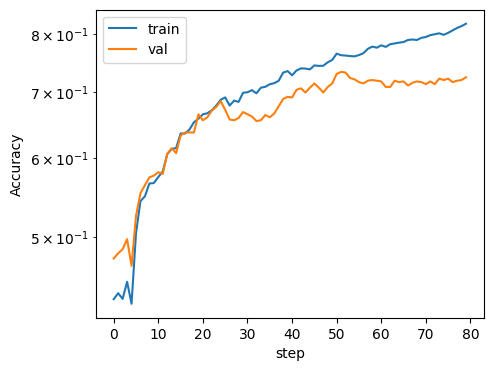

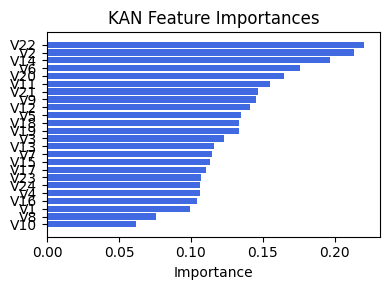

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V9', 0.2873416188319688), ('V19', 0.26262264029131843), ('V16', 0.2551557738986378), ('V7', 0.2489989986920108), ('V14', 0.23817922850992299), ('V8', 0.22866740373345756), ('V23', 0.22063895467380507), ('V13', 0.2204879338434307), ('V22', 0.21931363315065822), ('V12', 0.2175402632205704), ('V11', 0.21598618747754164), ('V24', 0.20667127623628304), ('V3', 0.2061471473773167), ('V17', 0.2056145117370521), ('V2', 0.19811216020918151), ('V21', 0.1956079171480439), ('V6', 0.18371384233847868), ('V4', 0.16380903650826353), ('V18', 0.1441975150637418), ('V1', 0.14282807413091286), ('V20', 0.13479767904321377), ('V15', 0.12284739158090964), ('V10', 0.11267123642566677), ('Ex1', 0.08041459981482632), ('V5', 0.05259120608259651)]


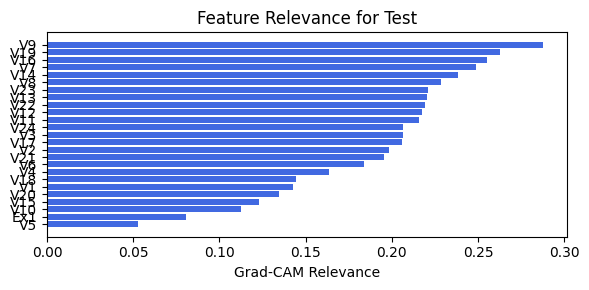

In [73]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=80, embed_dim=16, num_heads=4, filename=filename_4, opt_col_val='16, 4')

### 4.0.2.3 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.20e-01 | val_acc_hybrid: 7.24e-01 |: 100%|█████| 80/80 [00:26<00:00,  3.07it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.3310e-01 at 51 epoch
tensor(0.7106, device='cuda:0')
[[311 106  20   4]
 [ 43 338  36   3]
 [  1  22  40   3]
 [  5  33  40  87]]
M_KAN Relevance: 0.6821707487106323
CNN Relevance: 0.3178291916847229
[('V22', 0.22030048), ('V2', 0.2130491), ('V14', 0.19665466), ('V6', 0.1754444), ('V20', 0.164766), ('V11', 0.1551556), ('V21', 0.14669439), ('V9', 0.14506683), ('V12', 0.14088747), ('V5', 0.13502026), ('V18', 0.13328275), ('V19', 0.13322197), ('V3', 0.12315409), ('V13', 0.115985155), ('V7', 0.11487974), ('V15', 0.11298361), ('V17', 0.11023316), ('V23', 0.10732643), ('V24', 0.10641986), ('V4', 0.10631942), ('V16', 0.10393449), ('V1', 0.09954335), ('V8', 0.07543717), ('V10', 0.062120866)]


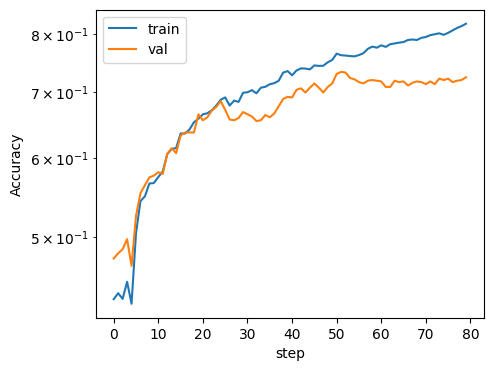

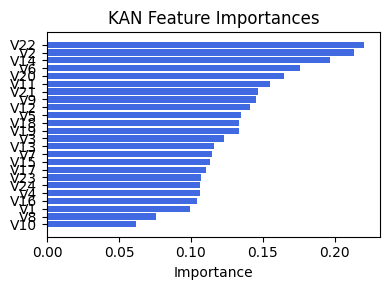

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V9', 0.2873416188319688), ('V19', 0.26262264029131843), ('V16', 0.2551557738986378), ('V7', 0.2489989986920108), ('V14', 0.23817922850992299), ('V8', 0.22866740373345756), ('V23', 0.22063895467380507), ('V13', 0.2204879338434307), ('V22', 0.21931363315065822), ('V12', 0.2175402632205704), ('V11', 0.21598618747754164), ('V24', 0.20667127623628304), ('V3', 0.2061471473773167), ('V17', 0.2056145117370521), ('V2', 0.19811216020918151), ('V21', 0.1956079171480439), ('V6', 0.18371384233847868), ('V4', 0.16380903650826353), ('V18', 0.1441975150637418), ('V1', 0.14282807413091286), ('V20', 0.13479767904321377), ('V15', 0.12284739158090964), ('V10', 0.11267123642566677), ('Ex1', 0.08041459981482632), ('V5', 0.05259120608259651)]


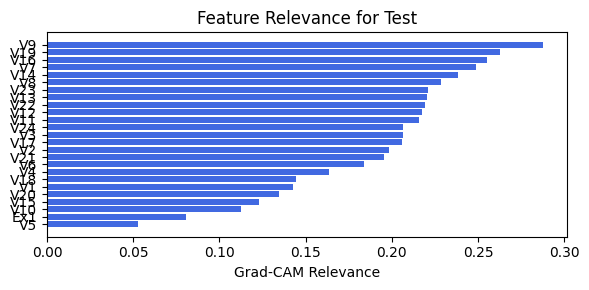

In [74]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=80, embed_dim=16, num_heads=4, filename=filename_4, opt_col_val='16, 4')

### 4.0.2.4 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.31e-01 | val_acc_hybrid: 7.70e-01 |: 100%|█████| 80/80 [00:27<00:00,  2.87it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.7205e-01 at 74 epoch
tensor(0.7601, device='cuda:0')
[[321 104  11   5]
 [ 40 368  11   1]
 [  1  31  33   1]
 [  7  20  30 108]]
M_KAN Relevance: 0.6043809056282043
CNN Relevance: 0.39561906456947327
[('V13', 0.2224474), ('V22', 0.2212777), ('V15', 0.21716003), ('V14', 0.21609013), ('V7', 0.2141472), ('V5', 0.18391512), ('V21', 0.18232772), ('V20', 0.1783068), ('V24', 0.17061484), ('V2', 0.17012069), ('V19', 0.16968763), ('V18', 0.16886394), ('V10', 0.1613599), ('V12', 0.1613257), ('V16', 0.15887198), ('V1', 0.1540628), ('V9', 0.14908004), ('V4', 0.13473217), ('V3', 0.116585135), ('V17', 0.111147046), ('V11', 0.106102884), ('V23', 0.0851534), ('V8', 0.07556698), ('V6', 0.07491879)]


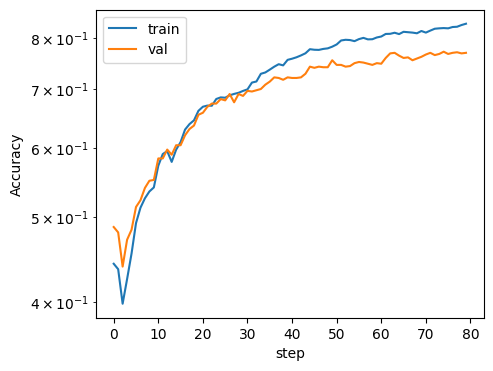

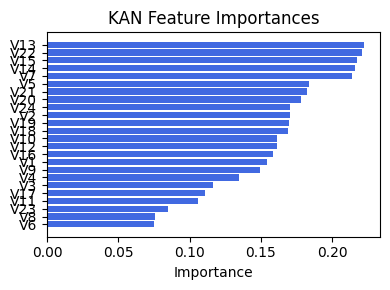

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.2783886555096368), ('V19', 0.26112780361082905), ('V8', 0.23379923834175684), ('V7', 0.2309580327627516), ('V9', 0.2303142662570084), ('V14', 0.22995483876404696), ('V12', 0.2151435581969793), ('V21', 0.21448211273739853), ('V13', 0.20952888525559066), ('V22', 0.19471468954055796), ('V17', 0.19454927633197946), ('V11', 0.1918062610911675), ('V2', 0.184666314307993), ('V6', 0.16752283914978588), ('V3', 0.1665354416152482), ('V23', 0.16590625255028518), ('V24', 0.15591046997497793), ('V1', 0.15531845209927816), ('V18', 0.15346383946603837), ('V20', 0.13904575731887747), ('V10', 0.13477989963120218), ('V4', 0.1184019698434012), ('V15', 0.1144244015290813), ('Ex1', 0.08602434438463262), ('V5', 0.0811089655047735)]


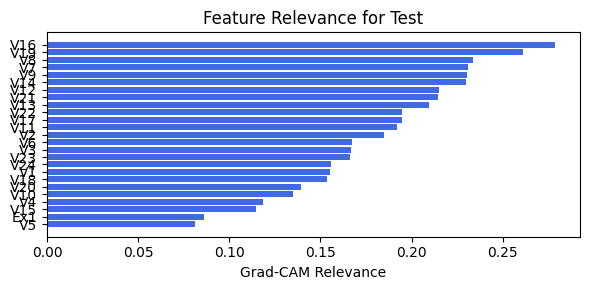

In [75]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=80, embed_dim=16, num_heads=8, filename=filename_4, opt_col_val='16, 8')

### 4.0.2.5 width=[24, 12, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.20e-01 | val_acc_hybrid: 7.24e-01 |: 100%|█████| 80/80 [00:27<00:00,  2.96it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.3310e-01 at 51 epoch
tensor(0.7106, device='cuda:0')
[[311 106  20   4]
 [ 43 338  36   3]
 [  1  22  40   3]
 [  5  33  40  87]]
M_KAN Relevance: 0.6821707487106323
CNN Relevance: 0.3178291916847229
[('V22', 0.22030048), ('V2', 0.2130491), ('V14', 0.19665466), ('V6', 0.1754444), ('V20', 0.164766), ('V11', 0.1551556), ('V21', 0.14669439), ('V9', 0.14506683), ('V12', 0.14088747), ('V5', 0.13502026), ('V18', 0.13328275), ('V19', 0.13322197), ('V3', 0.12315409), ('V13', 0.115985155), ('V7', 0.11487974), ('V15', 0.11298361), ('V17', 0.11023316), ('V23', 0.10732643), ('V24', 0.10641986), ('V4', 0.10631942), ('V16', 0.10393449), ('V1', 0.09954335), ('V8', 0.07543717), ('V10', 0.062120866)]


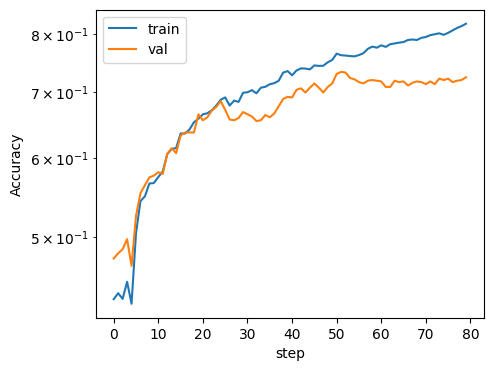

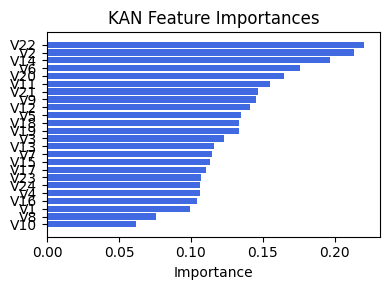

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V9', 0.2873416188319688), ('V19', 0.26262264029131843), ('V16', 0.2551557738986378), ('V7', 0.2489989986920108), ('V14', 0.23817922850992299), ('V8', 0.22866740373345756), ('V23', 0.22063895467380507), ('V13', 0.2204879338434307), ('V22', 0.21931363315065822), ('V12', 0.2175402632205704), ('V11', 0.21598618747754164), ('V24', 0.20667127623628304), ('V3', 0.2061471473773167), ('V17', 0.2056145117370521), ('V2', 0.19811216020918151), ('V21', 0.1956079171480439), ('V6', 0.18371384233847868), ('V4', 0.16380903650826353), ('V18', 0.1441975150637418), ('V1', 0.14282807413091286), ('V20', 0.13479767904321377), ('V15', 0.12284739158090964), ('V10', 0.11267123642566677), ('Ex1', 0.08041459981482632), ('V5', 0.05259120608259651)]


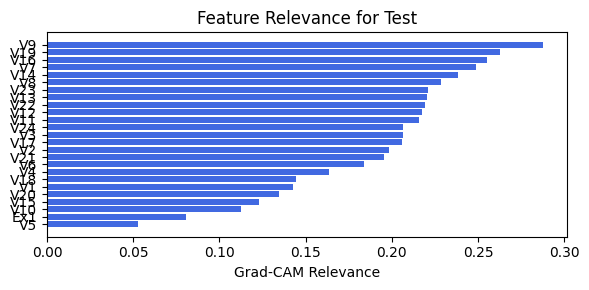

In [76]:
train_and_plot_relevance(Model3_4, kan_neurons=12, kan_grid=8, lamb=0.001, steps=80, embed_dim=16, num_heads=8, filename=filename_4, opt_col_val='16, 8')

## 4.1. width=[24, 5, 1], grid=7, lamb=1e-07

### 4.1.0.0 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=64, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.41e-01 | val_acc_hybrid: 7.09e-01 |: 100%|█████| 90/90 [00:36<00:00,  2.46it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1936e-01 at 85 epoch
tensor(0.7253, device='cuda:0')
[[302 127   9   3]
 [ 31 382   6   1]
 [  3  40  16   7]
 [  8  35  30  92]]
M_KAN Relevance: 0.0444018580019474
CNN Relevance: 0.9555981755256653
[('V5', 0.3118601), ('V14', 0.30836007), ('V11', 0.26566577), ('V15', 0.246539), ('V9', 0.23786266), ('V10', 0.23442884), ('V3', 0.22781153), ('V23', 0.22045417), ('V8', 0.20987771), ('V7', 0.20866881), ('V4', 0.2085362), ('V2', 0.2080808), ('V13', 0.19454113), ('V24', 0.18810236), ('V12', 0.16501205), ('V19', 0.15010457), ('V1', 0.14646147), ('V16', 0.14385594), ('V6', 0.1303157), ('V20', 0.11649002), ('V18', 0.10083248), ('V21', 0.0909267), ('V22', 0.089216836), ('V17', 0.076176964)]


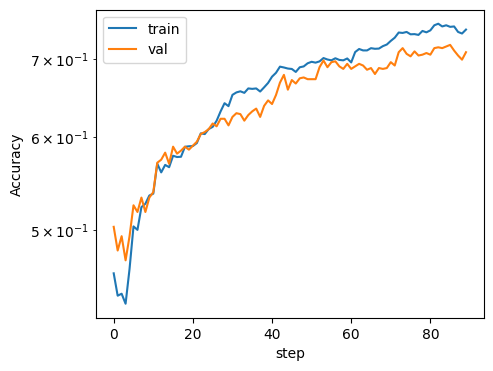

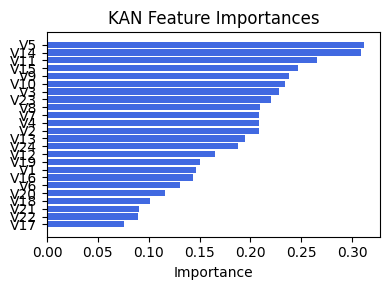

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.36326136041182944), ('V22', 0.3145998215841779), ('V16', 0.2987982645099292), ('V11', 0.28511903689703655), ('V24', 0.27759104503549525), ('V21', 0.26810986688685723), ('V6', 0.25742392614351906), ('V12', 0.2475086828066256), ('V7', 0.2254278523177273), ('V18', 0.21143330416119807), ('V20', 0.20472499424552357), ('V17', 0.2030274135085608), ('V13', 0.20219337654998526), ('V15', 0.20137255023211845), ('V8', 0.1985472853319705), ('V9', 0.17278996496849516), ('V14', 0.16487101016425115), ('V19', 0.16041369897070565), ('V1', 0.15429049836671804), ('V10', 0.1393866488549495), ('V3', 0.12533657665231399), ('V2', 0.12387733444578798), ('Ex1', 0.10133911765632757), ('V4', 0.09276565278978591), ('V5', 0.044726504460400385)]


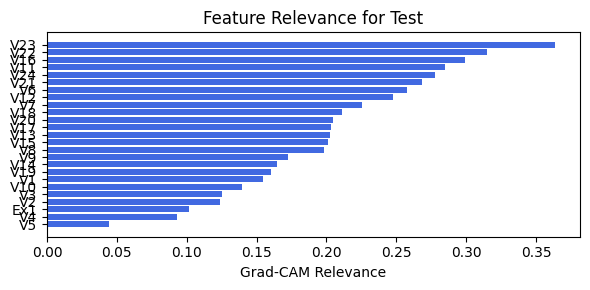

In [77]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=64, num_heads=2, filename=filename_4, opt_col_val='64, 2')

### 4.1.0.1 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=64, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 7.16e-01 |: 100%|█████| 90/90 [00:37<00:00,  2.40it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.1592e-01 at 89 epoch
tensor(0.7271, device='cuda:0')
[[298 123  14   6]
 [ 28 384   8   0]
 [  4  39  16   7]
 [  7  33  29  96]]
M_KAN Relevance: 0.0783921331167221
CNN Relevance: 0.9216078519821167
[('V5', 0.3118603), ('V14', 0.3083594), ('V11', 0.26566473), ('V15', 0.24653819), ('V9', 0.23786156), ('V10', 0.23442836), ('V3', 0.22781149), ('V23', 0.22045414), ('V8', 0.20987771), ('V7', 0.20866595), ('V4', 0.20853448), ('V2', 0.20808029), ('V13', 0.19453916), ('V24', 0.18810248), ('V12', 0.16501032), ('V19', 0.1501042), ('V1', 0.14646222), ('V16', 0.1438546), ('V6', 0.13031308), ('V20', 0.11648877), ('V18', 0.10083158), ('V21', 0.090925746), ('V22', 0.089213), ('V17', 0.07617571)]


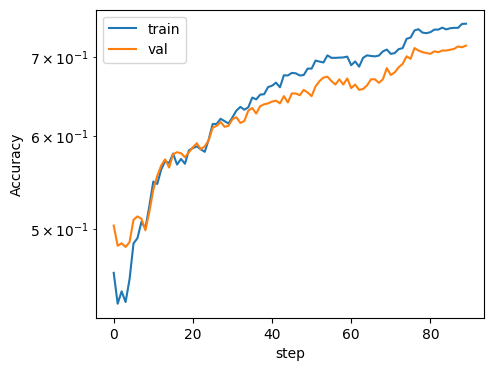

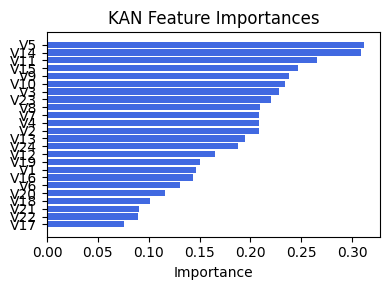

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V15', 0.3000361047447052), ('V20', 0.29898724842778956), ('V23', 0.26784543452321397), ('V22', 0.2552940459696108), ('V10', 0.254661507713659), ('V21', 0.23915157707554602), ('V6', 0.22067680667226677), ('V24', 0.220471569558698), ('V7', 0.21436166769905998), ('V8', 0.2082709655987189), ('V12', 0.20358922208770008), ('V16', 0.2030896878945846), ('V11', 0.182597047585008), ('V9', 0.1821001367543731), ('V13', 0.16283353598289033), ('V17', 0.16162215991853673), ('V14', 0.16050792120917914), ('V19', 0.1582795269819427), ('V1', 0.1353610397860067), ('V5', 0.13278257786447323), ('V18', 0.13098213563500308), ('V2', 0.12152661433471718), ('V3', 0.11431202832611548), ('Ex1', 0.10306853796944966), ('V4', 0.09606000834392635)]


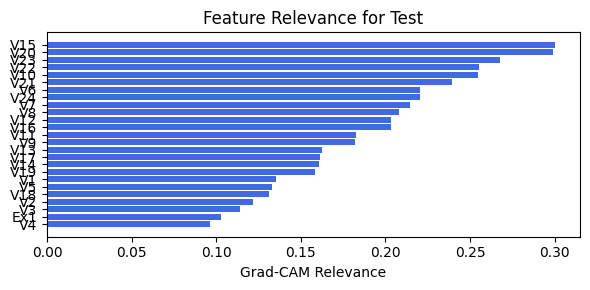

In [78]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=64, num_heads=2, filename=filename_4, opt_col_val='64, 2')

### 4.1.0.2 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=64, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 7.16e-01 |: 100%|█████| 90/90 [00:37<00:00,  2.40it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.1592e-01 at 89 epoch
tensor(0.7271, device='cuda:0')
[[298 123  14   6]
 [ 28 384   8   0]
 [  4  39  16   7]
 [  7  33  29  96]]
M_KAN Relevance: 0.0783921331167221
CNN Relevance: 0.9216078519821167
[('V5', 0.3118603), ('V14', 0.3083594), ('V11', 0.26566473), ('V15', 0.24653819), ('V9', 0.23786156), ('V10', 0.23442836), ('V3', 0.22781149), ('V23', 0.22045414), ('V8', 0.20987771), ('V7', 0.20866595), ('V4', 0.20853448), ('V2', 0.20808029), ('V13', 0.19453916), ('V24', 0.18810248), ('V12', 0.16501032), ('V19', 0.1501042), ('V1', 0.14646222), ('V16', 0.1438546), ('V6', 0.13031308), ('V20', 0.11648877), ('V18', 0.10083158), ('V21', 0.090925746), ('V22', 0.089213), ('V17', 0.07617571)]


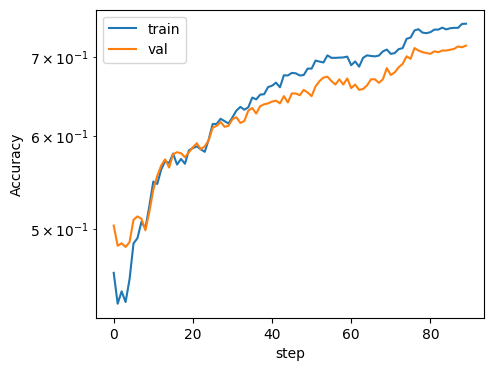

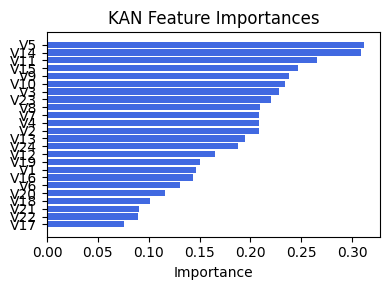

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V15', 0.3000361047447052), ('V20', 0.29898724842778956), ('V23', 0.26784543452321397), ('V22', 0.2552940459696108), ('V10', 0.254661507713659), ('V21', 0.23915157707554602), ('V6', 0.22067680667226677), ('V24', 0.220471569558698), ('V7', 0.21436166769905998), ('V8', 0.2082709655987189), ('V12', 0.20358922208770008), ('V16', 0.2030896878945846), ('V11', 0.182597047585008), ('V9', 0.1821001367543731), ('V13', 0.16283353598289033), ('V17', 0.16162215991853673), ('V14', 0.16050792120917914), ('V19', 0.1582795269819427), ('V1', 0.1353610397860067), ('V5', 0.13278257786447323), ('V18', 0.13098213563500308), ('V2', 0.12152661433471718), ('V3', 0.11431202832611548), ('Ex1', 0.10306853796944966), ('V4', 0.09606000834392635)]


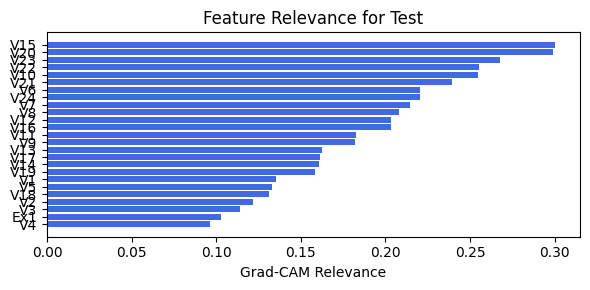

In [79]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=64, num_heads=4, filename=filename_4, opt_col_val='64, 4')

### 4.1.0.3 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=64, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.33e-01 | val_acc_hybrid: 6.78e-01 |: 100%|█████| 90/90 [00:36<00:00,  2.45it/s]


saving model version 0.1
✅ Best validation Accuracy: 6.8041e-01 at 86 epoch
tensor(0.7015, device='cuda:0')
[[287 128  21   5]
 [ 35 366  15   4]
 [  2  36  26   2]
 [  5  32  41  87]]
M_KAN Relevance: 0.0719505250453949
CNN Relevance: 0.9280494451522827
[('V5', 0.31185916), ('V14', 0.30836272), ('V11', 0.2656687), ('V15', 0.24654292), ('V9', 0.23786847), ('V10', 0.23443237), ('V3', 0.22781049), ('V23', 0.22045505), ('V8', 0.20987824), ('V7', 0.20868197), ('V4', 0.208544), ('V2', 0.20808248), ('V13', 0.19454928), ('V24', 0.18810296), ('V12', 0.16501985), ('V19', 0.15010713), ('V1', 0.14646041), ('V16', 0.14386182), ('V6', 0.13032715), ('V20', 0.11649617), ('V18', 0.100837186), ('V21', 0.090931825), ('V22', 0.08923532), ('V17', 0.07618299)]


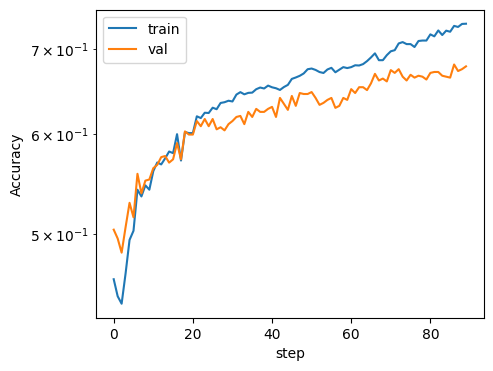

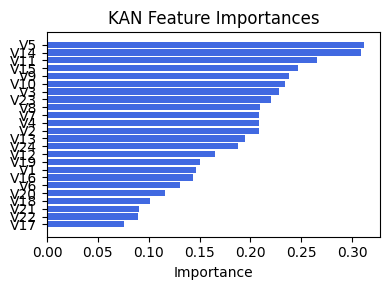

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3817685556741741), ('V22', 0.3209290751239258), ('V23', 0.2941485587388086), ('V24', 0.26294173871831383), ('V16', 0.24612039718257764), ('V7', 0.23140205022612267), ('V8', 0.22819175628965807), ('V11', 0.22234209313615133), ('V9', 0.21723215239141805), ('V18', 0.21365725205456268), ('V6', 0.20541120780076583), ('V17', 0.19243264407765515), ('V12', 0.19138948420521498), ('V14', 0.19046150920954732), ('V19', 0.19004087967530742), ('V2', 0.15436535786922678), ('V13', 0.15044238193228418), ('V3', 0.14411270583700686), ('V1', 0.13202467112931354), ('V4', 0.11582164889500662), ('V10', 0.11132740571531444), ('V5', 0.1051872323556721), ('V20', 0.09316717517581294), ('V15', 0.0904791670458601), ('Ex1', 0.0680910221160977)]


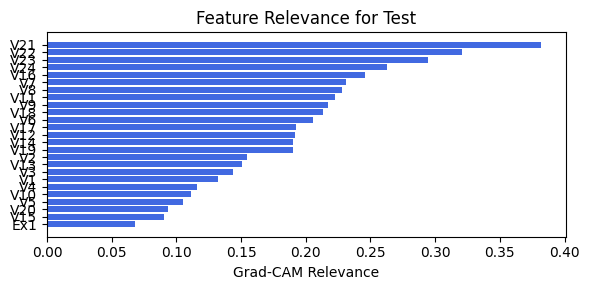

In [80]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=64, num_heads=4, filename=filename_4, opt_col_val='64, 4')

### 4.1.0.4 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=64, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.41e-01 | val_acc_hybrid: 7.09e-01 |: 100%|█████| 90/90 [00:38<00:00,  2.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1936e-01 at 85 epoch
tensor(0.7253, device='cuda:0')
[[302 127   9   3]
 [ 31 382   6   1]
 [  3  40  16   7]
 [  8  35  30  92]]
M_KAN Relevance: 0.0444018580019474
CNN Relevance: 0.9555981755256653
[('V5', 0.3118601), ('V14', 0.30836007), ('V11', 0.26566577), ('V15', 0.246539), ('V9', 0.23786266), ('V10', 0.23442884), ('V3', 0.22781153), ('V23', 0.22045417), ('V8', 0.20987771), ('V7', 0.20866881), ('V4', 0.2085362), ('V2', 0.2080808), ('V13', 0.19454113), ('V24', 0.18810236), ('V12', 0.16501205), ('V19', 0.15010457), ('V1', 0.14646147), ('V16', 0.14385594), ('V6', 0.1303157), ('V20', 0.11649002), ('V18', 0.10083248), ('V21', 0.0909267), ('V22', 0.089216836), ('V17', 0.076176964)]


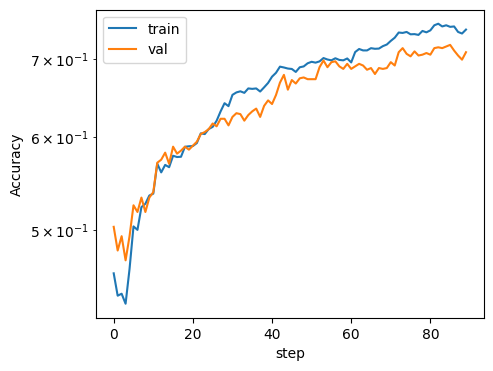

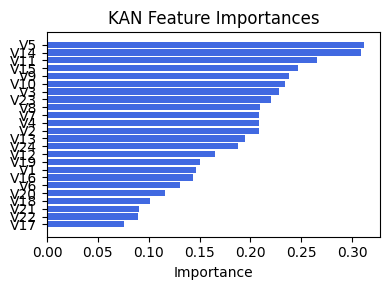

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.36326136041182944), ('V22', 0.3145998215841779), ('V16', 0.2987982645099292), ('V11', 0.28511903689703655), ('V24', 0.27759104503549525), ('V21', 0.26810986688685723), ('V6', 0.25742392614351906), ('V12', 0.2475086828066256), ('V7', 0.2254278523177273), ('V18', 0.21143330416119807), ('V20', 0.20472499424552357), ('V17', 0.2030274135085608), ('V13', 0.20219337654998526), ('V15', 0.20137255023211845), ('V8', 0.1985472853319705), ('V9', 0.17278996496849516), ('V14', 0.16487101016425115), ('V19', 0.16041369897070565), ('V1', 0.15429049836671804), ('V10', 0.1393866488549495), ('V3', 0.12533657665231399), ('V2', 0.12387733444578798), ('Ex1', 0.10133911765632757), ('V4', 0.09276565278978591), ('V5', 0.044726504460400385)]


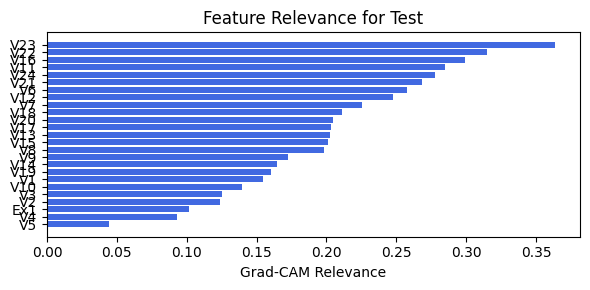

In [81]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=64, num_heads=8, filename=filename_4, opt_col_val='64, 8')

### 4.1.0.5 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=64, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.41e-01 | val_acc_hybrid: 7.09e-01 |: 100%|█████| 90/90 [00:37<00:00,  2.42it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1936e-01 at 85 epoch
tensor(0.7253, device='cuda:0')
[[302 127   9   3]
 [ 31 382   6   1]
 [  3  40  16   7]
 [  8  35  30  92]]
M_KAN Relevance: 0.0444018580019474
CNN Relevance: 0.9555981755256653
[('V5', 0.3118601), ('V14', 0.30836007), ('V11', 0.26566577), ('V15', 0.246539), ('V9', 0.23786266), ('V10', 0.23442884), ('V3', 0.22781153), ('V23', 0.22045417), ('V8', 0.20987771), ('V7', 0.20866881), ('V4', 0.2085362), ('V2', 0.2080808), ('V13', 0.19454113), ('V24', 0.18810236), ('V12', 0.16501205), ('V19', 0.15010457), ('V1', 0.14646147), ('V16', 0.14385594), ('V6', 0.1303157), ('V20', 0.11649002), ('V18', 0.10083248), ('V21', 0.0909267), ('V22', 0.089216836), ('V17', 0.076176964)]


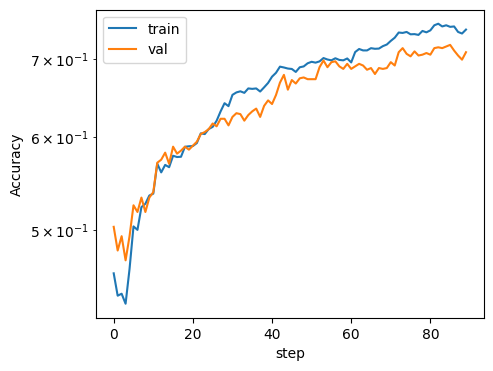

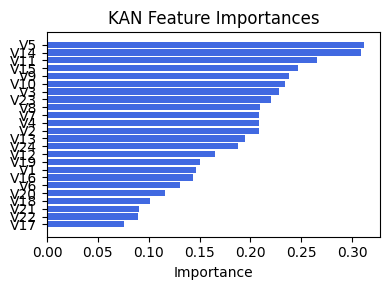

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.36326136041182944), ('V22', 0.3145998215841779), ('V16', 0.2987982645099292), ('V11', 0.28511903689703655), ('V24', 0.27759104503549525), ('V21', 0.26810986688685723), ('V6', 0.25742392614351906), ('V12', 0.2475086828066256), ('V7', 0.2254278523177273), ('V18', 0.21143330416119807), ('V20', 0.20472499424552357), ('V17', 0.2030274135085608), ('V13', 0.20219337654998526), ('V15', 0.20137255023211845), ('V8', 0.1985472853319705), ('V9', 0.17278996496849516), ('V14', 0.16487101016425115), ('V19', 0.16041369897070565), ('V1', 0.15429049836671804), ('V10', 0.1393866488549495), ('V3', 0.12533657665231399), ('V2', 0.12387733444578798), ('Ex1', 0.10133911765632757), ('V4', 0.09276565278978591), ('V5', 0.044726504460400385)]


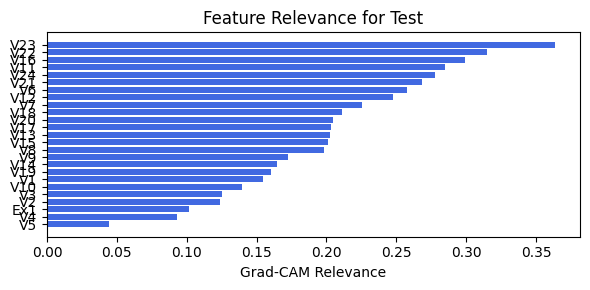

In [82]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=64, num_heads=8, filename=filename_4, opt_col_val='64, 8')

### 4.1.2.0 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=32, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.23e-01 | val_acc_hybrid: 7.22e-01 |: 100%|█████| 90/90 [00:30<00:00,  2.94it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3883e-01 at 69 epoch
tensor(0.7408, device='cuda:0')
[[320 107  12   2]
 [ 31 365  22   2]
 [  1  32  29   4]
 [  5  28  37  95]]
M_KAN Relevance: 0.10091134905815125
CNN Relevance: 0.8990886211395264
[('V5', 0.31186318), ('V14', 0.30835107), ('V11', 0.26565546), ('V15', 0.2465267), ('V9', 0.23784399), ('V10', 0.2344177), ('V3', 0.22781439), ('V23', 0.22045134), ('V8', 0.20987587), ('V7', 0.20862608), ('V4', 0.20851015), ('V2', 0.2080745), ('V13', 0.19451413), ('V24', 0.18810086), ('V12', 0.16498654), ('V19', 0.15009609), ('V1', 0.14646645), ('V16', 0.14383659), ('V6', 0.13027766), ('V20', 0.11647023), ('V18', 0.100817285), ('V21', 0.09091044), ('V22', 0.0891565), ('V17', 0.07615749)]


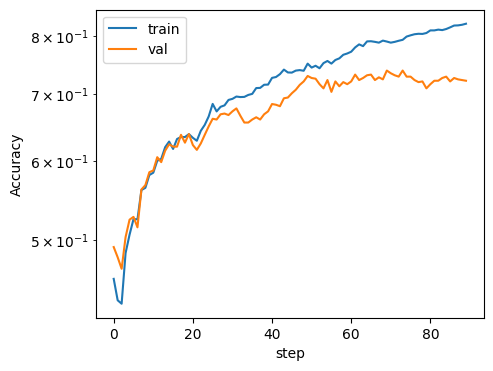

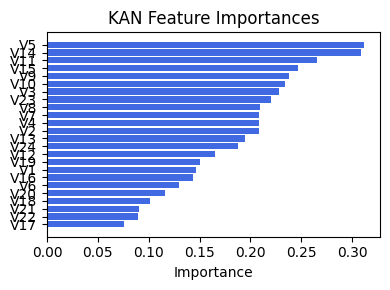

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.29562003031277373), ('V23', 0.28934086512895973), ('V8', 0.2860932344452528), ('V13', 0.28004419528820057), ('V24', 0.26137668533235126), ('V7', 0.25368058730829957), ('V12', 0.2482414622512866), ('V17', 0.24069350063587996), ('V18', 0.23358368614763994), ('V6', 0.2162024609158621), ('V16', 0.21187269469463144), ('V19', 0.19670067667407187), ('V21', 0.19172257791606936), ('V11', 0.189444879575137), ('V9', 0.18697217867836347), ('V14', 0.1601826735532086), ('V3', 0.14886797177483532), ('V2', 0.13813203588451803), ('V20', 0.13627381087893803), ('V15', 0.12948003851011397), ('V1', 0.12555533622795645), ('V10', 0.11922606699974808), ('V5', 0.11089369307628424), ('Ex1', 0.10923513369541998), ('V4', 0.09091989168504262)]


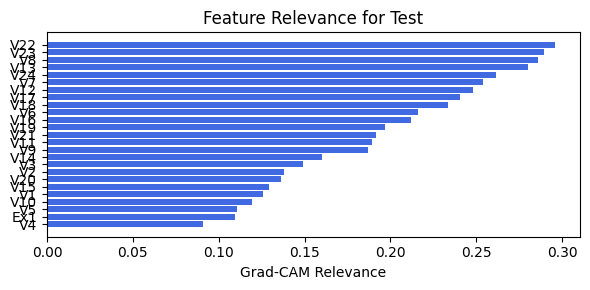

In [85]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=32, num_heads=2, filename=filename_4, opt_col_val='32, 2')

### 4.1.2.1 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=32, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.23e-01 | val_acc_hybrid: 7.22e-01 |: 100%|█████| 90/90 [00:29<00:00,  3.10it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.3883e-01 at 69 epoch
tensor(0.7408, device='cuda:0')
[[320 107  12   2]
 [ 31 365  22   2]
 [  1  32  29   4]
 [  5  28  37  95]]
M_KAN Relevance: 0.10091134905815125
CNN Relevance: 0.8990886211395264
[('V5', 0.31186318), ('V14', 0.30835107), ('V11', 0.26565546), ('V15', 0.2465267), ('V9', 0.23784399), ('V10', 0.2344177), ('V3', 0.22781439), ('V23', 0.22045134), ('V8', 0.20987587), ('V7', 0.20862608), ('V4', 0.20851015), ('V2', 0.2080745), ('V13', 0.19451413), ('V24', 0.18810086), ('V12', 0.16498654), ('V19', 0.15009609), ('V1', 0.14646645), ('V16', 0.14383659), ('V6', 0.13027766), ('V20', 0.11647023), ('V18', 0.100817285), ('V21', 0.09091044), ('V22', 0.0891565), ('V17', 0.07615749)]


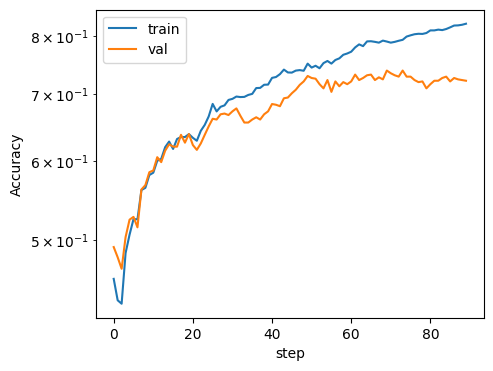

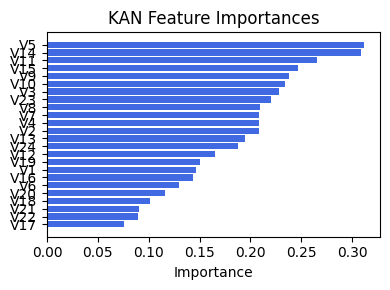

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.29562003031277373), ('V23', 0.28934086512895973), ('V8', 0.2860932344452528), ('V13', 0.28004419528820057), ('V24', 0.26137668533235126), ('V7', 0.25368058730829957), ('V12', 0.2482414622512866), ('V17', 0.24069350063587996), ('V18', 0.23358368614763994), ('V6', 0.2162024609158621), ('V16', 0.21187269469463144), ('V19', 0.19670067667407187), ('V21', 0.19172257791606936), ('V11', 0.189444879575137), ('V9', 0.18697217867836347), ('V14', 0.1601826735532086), ('V3', 0.14886797177483532), ('V2', 0.13813203588451803), ('V20', 0.13627381087893803), ('V15', 0.12948003851011397), ('V1', 0.12555533622795645), ('V10', 0.11922606699974808), ('V5', 0.11089369307628424), ('Ex1', 0.10923513369541998), ('V4', 0.09091989168504262)]


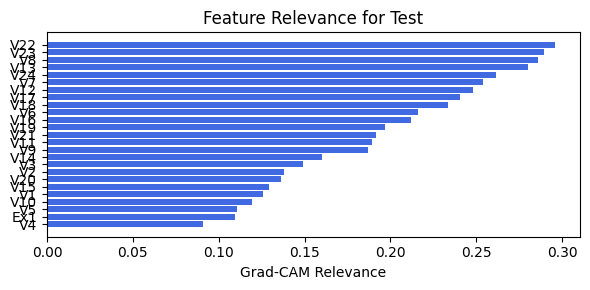

In [86]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=32, num_heads=2, filename=filename_4, opt_col_val='32, 2')

### 4.1.2.2 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=32, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.23e-01 | val_acc_hybrid: 7.22e-01 |: 100%|█████| 90/90 [00:28<00:00,  3.12it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3883e-01 at 69 epoch
tensor(0.7408, device='cuda:0')
[[320 107  12   2]
 [ 31 365  22   2]
 [  1  32  29   4]
 [  5  28  37  95]]
M_KAN Relevance: 0.10091134905815125
CNN Relevance: 0.8990886211395264
[('V5', 0.31186318), ('V14', 0.30835107), ('V11', 0.26565546), ('V15', 0.2465267), ('V9', 0.23784399), ('V10', 0.2344177), ('V3', 0.22781439), ('V23', 0.22045134), ('V8', 0.20987587), ('V7', 0.20862608), ('V4', 0.20851015), ('V2', 0.2080745), ('V13', 0.19451413), ('V24', 0.18810086), ('V12', 0.16498654), ('V19', 0.15009609), ('V1', 0.14646645), ('V16', 0.14383659), ('V6', 0.13027766), ('V20', 0.11647023), ('V18', 0.100817285), ('V21', 0.09091044), ('V22', 0.0891565), ('V17', 0.07615749)]


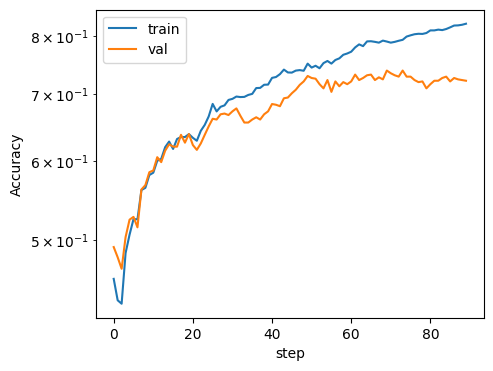

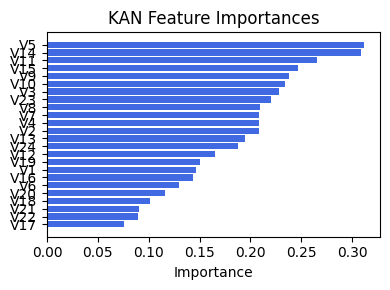

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.29562003031277373), ('V23', 0.28934086512895973), ('V8', 0.2860932344452528), ('V13', 0.28004419528820057), ('V24', 0.26137668533235126), ('V7', 0.25368058730829957), ('V12', 0.2482414622512866), ('V17', 0.24069350063587996), ('V18', 0.23358368614763994), ('V6', 0.2162024609158621), ('V16', 0.21187269469463144), ('V19', 0.19670067667407187), ('V21', 0.19172257791606936), ('V11', 0.189444879575137), ('V9', 0.18697217867836347), ('V14', 0.1601826735532086), ('V3', 0.14886797177483532), ('V2', 0.13813203588451803), ('V20', 0.13627381087893803), ('V15', 0.12948003851011397), ('V1', 0.12555533622795645), ('V10', 0.11922606699974808), ('V5', 0.11089369307628424), ('Ex1', 0.10923513369541998), ('V4', 0.09091989168504262)]


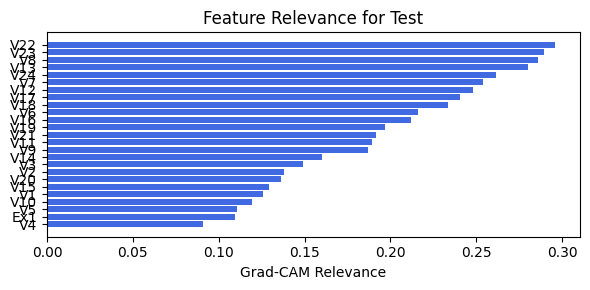

In [87]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=32, num_heads=4, filename=filename_4, opt_col_val='32, 4')

### 4.1.2.3 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=32, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.23e-01 | val_acc_hybrid: 7.22e-01 |: 100%|█████| 90/90 [00:28<00:00,  3.16it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3883e-01 at 69 epoch
tensor(0.7408, device='cuda:0')
[[320 107  12   2]
 [ 31 365  22   2]
 [  1  32  29   4]
 [  5  28  37  95]]
M_KAN Relevance: 0.10091134905815125
CNN Relevance: 0.8990886211395264
[('V5', 0.31186318), ('V14', 0.30835107), ('V11', 0.26565546), ('V15', 0.2465267), ('V9', 0.23784399), ('V10', 0.2344177), ('V3', 0.22781439), ('V23', 0.22045134), ('V8', 0.20987587), ('V7', 0.20862608), ('V4', 0.20851015), ('V2', 0.2080745), ('V13', 0.19451413), ('V24', 0.18810086), ('V12', 0.16498654), ('V19', 0.15009609), ('V1', 0.14646645), ('V16', 0.14383659), ('V6', 0.13027766), ('V20', 0.11647023), ('V18', 0.100817285), ('V21', 0.09091044), ('V22', 0.0891565), ('V17', 0.07615749)]


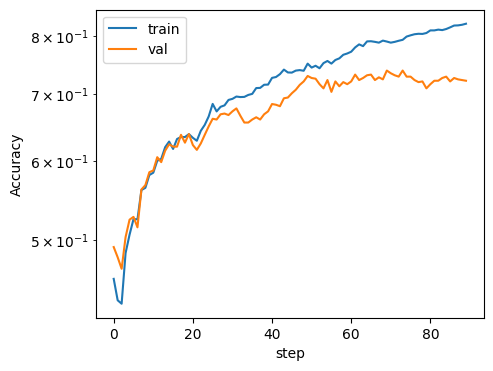

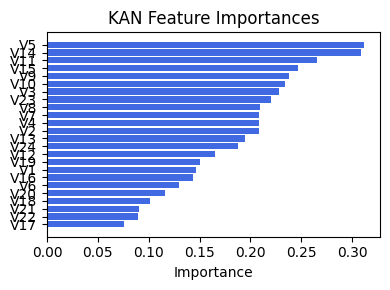

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.29562003031277373), ('V23', 0.28934086512895973), ('V8', 0.2860932344452528), ('V13', 0.28004419528820057), ('V24', 0.26137668533235126), ('V7', 0.25368058730829957), ('V12', 0.2482414622512866), ('V17', 0.24069350063587996), ('V18', 0.23358368614763994), ('V6', 0.2162024609158621), ('V16', 0.21187269469463144), ('V19', 0.19670067667407187), ('V21', 0.19172257791606936), ('V11', 0.189444879575137), ('V9', 0.18697217867836347), ('V14', 0.1601826735532086), ('V3', 0.14886797177483532), ('V2', 0.13813203588451803), ('V20', 0.13627381087893803), ('V15', 0.12948003851011397), ('V1', 0.12555533622795645), ('V10', 0.11922606699974808), ('V5', 0.11089369307628424), ('Ex1', 0.10923513369541998), ('V4', 0.09091989168504262)]


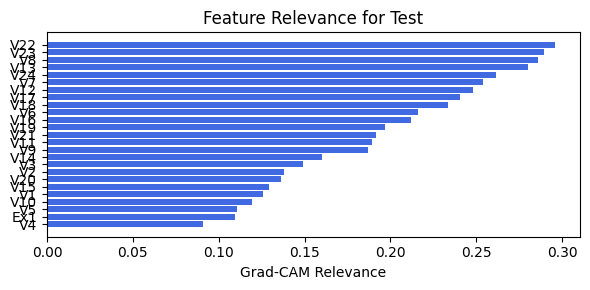

In [88]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=32, num_heads=4, filename=filename_4, opt_col_val='32, 4')

### 4.1.2.4 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=32, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.23e-01 | val_acc_hybrid: 7.22e-01 |: 100%|█████| 90/90 [00:33<00:00,  2.71it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3883e-01 at 69 epoch
tensor(0.7408, device='cuda:0')
[[320 107  12   2]
 [ 31 365  22   2]
 [  1  32  29   4]
 [  5  28  37  95]]
M_KAN Relevance: 0.10091134905815125
CNN Relevance: 0.8990886211395264
[('V5', 0.31186318), ('V14', 0.30835107), ('V11', 0.26565546), ('V15', 0.2465267), ('V9', 0.23784399), ('V10', 0.2344177), ('V3', 0.22781439), ('V23', 0.22045134), ('V8', 0.20987587), ('V7', 0.20862608), ('V4', 0.20851015), ('V2', 0.2080745), ('V13', 0.19451413), ('V24', 0.18810086), ('V12', 0.16498654), ('V19', 0.15009609), ('V1', 0.14646645), ('V16', 0.14383659), ('V6', 0.13027766), ('V20', 0.11647023), ('V18', 0.100817285), ('V21', 0.09091044), ('V22', 0.0891565), ('V17', 0.07615749)]


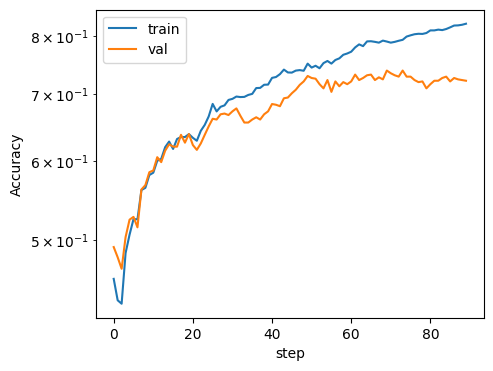

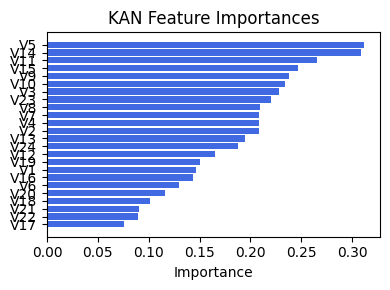

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.29562003031277373), ('V23', 0.28934086512895973), ('V8', 0.2860932344452528), ('V13', 0.28004419528820057), ('V24', 0.26137668533235126), ('V7', 0.25368058730829957), ('V12', 0.2482414622512866), ('V17', 0.24069350063587996), ('V18', 0.23358368614763994), ('V6', 0.2162024609158621), ('V16', 0.21187269469463144), ('V19', 0.19670067667407187), ('V21', 0.19172257791606936), ('V11', 0.189444879575137), ('V9', 0.18697217867836347), ('V14', 0.1601826735532086), ('V3', 0.14886797177483532), ('V2', 0.13813203588451803), ('V20', 0.13627381087893803), ('V15', 0.12948003851011397), ('V1', 0.12555533622795645), ('V10', 0.11922606699974808), ('V5', 0.11089369307628424), ('Ex1', 0.10923513369541998), ('V4', 0.09091989168504262)]


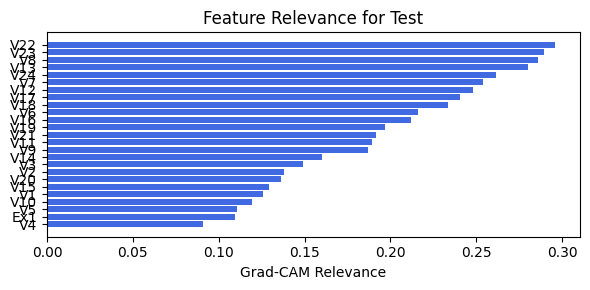

In [89]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=32, num_heads=8, filename=filename_4, opt_col_val='32, 8')

### 4.1.2.5 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=32, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.23e-01 | val_acc_hybrid: 7.22e-01 |: 100%|█████| 90/90 [00:29<00:00,  3.10it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3883e-01 at 69 epoch
tensor(0.7408, device='cuda:0')
[[320 107  12   2]
 [ 31 365  22   2]
 [  1  32  29   4]
 [  5  28  37  95]]
M_KAN Relevance: 0.10091134905815125
CNN Relevance: 0.8990886211395264
[('V5', 0.31186318), ('V14', 0.30835107), ('V11', 0.26565546), ('V15', 0.2465267), ('V9', 0.23784399), ('V10', 0.2344177), ('V3', 0.22781439), ('V23', 0.22045134), ('V8', 0.20987587), ('V7', 0.20862608), ('V4', 0.20851015), ('V2', 0.2080745), ('V13', 0.19451413), ('V24', 0.18810086), ('V12', 0.16498654), ('V19', 0.15009609), ('V1', 0.14646645), ('V16', 0.14383659), ('V6', 0.13027766), ('V20', 0.11647023), ('V18', 0.100817285), ('V21', 0.09091044), ('V22', 0.0891565), ('V17', 0.07615749)]


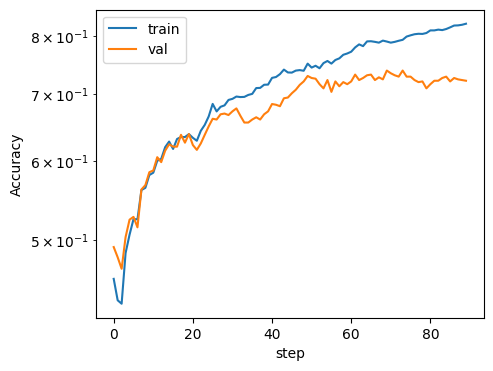

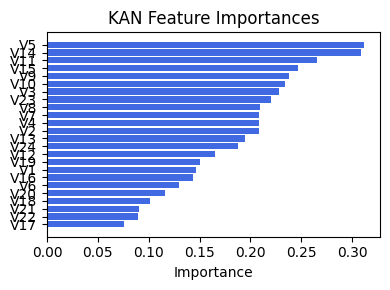

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.29562003031277373), ('V23', 0.28934086512895973), ('V8', 0.2860932344452528), ('V13', 0.28004419528820057), ('V24', 0.26137668533235126), ('V7', 0.25368058730829957), ('V12', 0.2482414622512866), ('V17', 0.24069350063587996), ('V18', 0.23358368614763994), ('V6', 0.2162024609158621), ('V16', 0.21187269469463144), ('V19', 0.19670067667407187), ('V21', 0.19172257791606936), ('V11', 0.189444879575137), ('V9', 0.18697217867836347), ('V14', 0.1601826735532086), ('V3', 0.14886797177483532), ('V2', 0.13813203588451803), ('V20', 0.13627381087893803), ('V15', 0.12948003851011397), ('V1', 0.12555533622795645), ('V10', 0.11922606699974808), ('V5', 0.11089369307628424), ('Ex1', 0.10923513369541998), ('V4', 0.09091989168504262)]


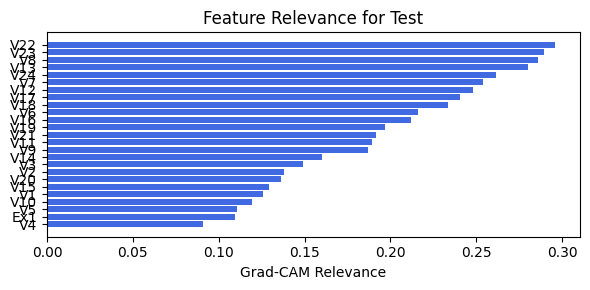

In [90]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=32, num_heads=8, filename=filename_4, opt_col_val='32, 8')

### 4.1.3.0 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=16, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.83e-01 | val_acc_hybrid: 8.02e-01 |: 100%|█████| 90/90 [00:30<00:00,  2.96it/s]

saving model version 0.1
✅ Best validation Accuracy: 8.0183e-01 at 89 epoch
tensor(0.8068, device='cuda:0')
[[346  83   9   3]
 [ 23 374  21   2]
 [  1  12  51   2]
 [  6  21  28 110]]
M_KAN Relevance: 0.5029563903808594
CNN Relevance: 0.4970436096191406
[('V5', 0.31186375), ('V14', 0.30834895), ('V11', 0.26565304), ('V15', 0.246524), ('V9', 0.23784013), ('V10', 0.23441505), ('V3', 0.22781503), ('V23', 0.2204508), ('V8', 0.20987535), ('V7', 0.2086163), ('V4', 0.20850424), ('V2', 0.20807321), ('V13', 0.19450809), ('V24', 0.18810055), ('V12', 0.16498077), ('V19', 0.1500942), ('V1', 0.14646754), ('V16', 0.14383227), ('V6', 0.13026913), ('V20', 0.116465926), ('V18', 0.1008138), ('V21', 0.09090685), ('V22', 0.08914282), ('V17', 0.076153174)]


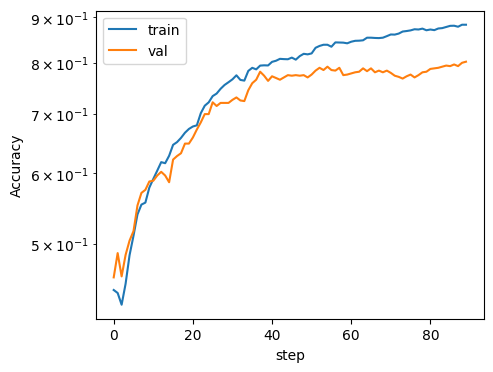

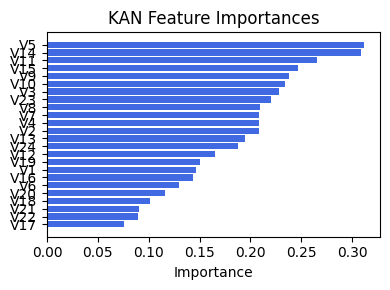

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3531579631077972), ('V22', 0.336611614590289), ('V21', 0.32450901456316356), ('V24', 0.2939988999775908), ('V13', 0.24394925089506944), ('V16', 0.24207466563660626), ('V8', 0.2384859185054772), ('V7', 0.23576748516001111), ('V12', 0.23210700530488038), ('V9', 0.2174747834472131), ('V11', 0.21649510720192502), ('V18', 0.2147784568475996), ('V17', 0.21223036736644865), ('V19', 0.19731904470943631), ('V6', 0.17349031698418185), ('V3', 0.17145807536000354), ('V20', 0.16485228522732218), ('V15', 0.16440175515801303), ('V14', 0.15791921587677965), ('V2', 0.15039760612278555), ('V10', 0.1449748031690443), ('V1', 0.12341210596646689), ('V4', 0.11832771766377526), ('Ex1', 0.11690497868333366), ('V5', 0.09200520118996286)]


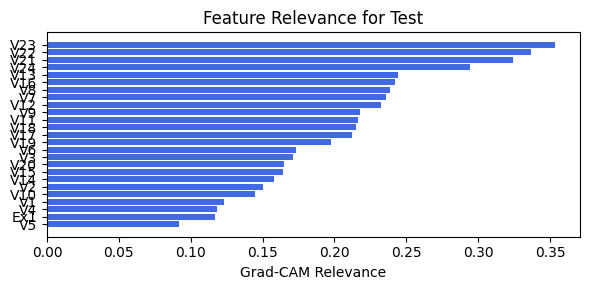

In [91]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=16, num_heads=8, filename=filename_4, opt_col_val='16, 2')

### 4.1.3.1 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=16, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.83e-01 | val_acc_hybrid: 8.02e-01 |: 100%|█████| 90/90 [00:29<00:00,  3.03it/s]

saving model version 0.1
✅ Best validation Accuracy: 8.0183e-01 at 89 epoch
tensor(0.8068, device='cuda:0')
[[346  83   9   3]
 [ 23 374  21   2]
 [  1  12  51   2]
 [  6  21  28 110]]
M_KAN Relevance: 0.5029563903808594
CNN Relevance: 0.4970436096191406
[('V5', 0.31186375), ('V14', 0.30834895), ('V11', 0.26565304), ('V15', 0.246524), ('V9', 0.23784013), ('V10', 0.23441505), ('V3', 0.22781503), ('V23', 0.2204508), ('V8', 0.20987535), ('V7', 0.2086163), ('V4', 0.20850424), ('V2', 0.20807321), ('V13', 0.19450809), ('V24', 0.18810055), ('V12', 0.16498077), ('V19', 0.1500942), ('V1', 0.14646754), ('V16', 0.14383227), ('V6', 0.13026913), ('V20', 0.116465926), ('V18', 0.1008138), ('V21', 0.09090685), ('V22', 0.08914282), ('V17', 0.076153174)]


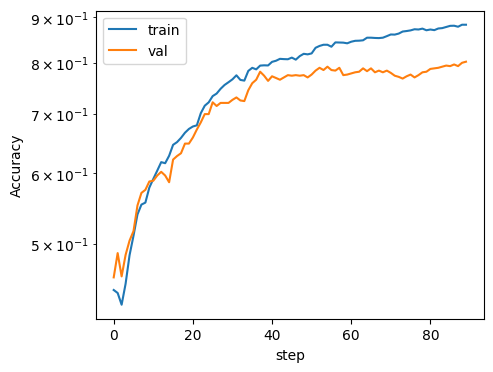

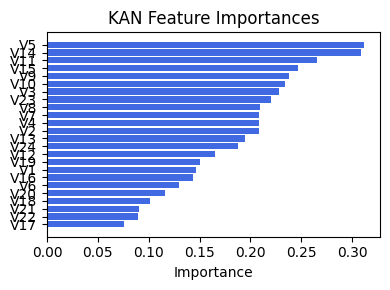

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3531579631077972), ('V22', 0.336611614590289), ('V21', 0.32450901456316356), ('V24', 0.2939988999775908), ('V13', 0.24394925089506944), ('V16', 0.24207466563660626), ('V8', 0.2384859185054772), ('V7', 0.23576748516001111), ('V12', 0.23210700530488038), ('V9', 0.2174747834472131), ('V11', 0.21649510720192502), ('V18', 0.2147784568475996), ('V17', 0.21223036736644865), ('V19', 0.19731904470943631), ('V6', 0.17349031698418185), ('V3', 0.17145807536000354), ('V20', 0.16485228522732218), ('V15', 0.16440175515801303), ('V14', 0.15791921587677965), ('V2', 0.15039760612278555), ('V10', 0.1449748031690443), ('V1', 0.12341210596646689), ('V4', 0.11832771766377526), ('Ex1', 0.11690497868333366), ('V5', 0.09200520118996286)]


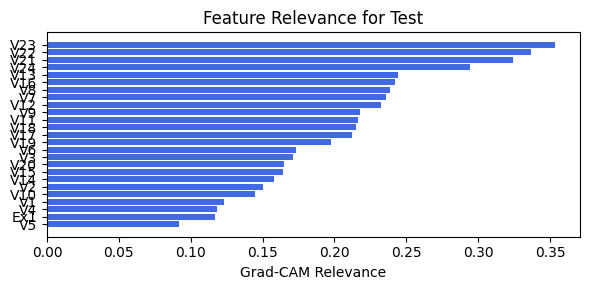

In [93]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=16, num_heads=2, filename=filename_4, opt_col_val='16, 2')

### 4.1.3.2 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=16, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.83e-01 | val_acc_hybrid: 8.02e-01 |: 100%|█████| 90/90 [00:29<00:00,  3.04it/s]

saving model version 0.1
✅ Best validation Accuracy: 8.0183e-01 at 89 epoch
tensor(0.8068, device='cuda:0')
[[346  83   9   3]
 [ 23 374  21   2]
 [  1  12  51   2]
 [  6  21  28 110]]
M_KAN Relevance: 0.5029563903808594
CNN Relevance: 0.4970436096191406
[('V5', 0.31186375), ('V14', 0.30834895), ('V11', 0.26565304), ('V15', 0.246524), ('V9', 0.23784013), ('V10', 0.23441505), ('V3', 0.22781503), ('V23', 0.2204508), ('V8', 0.20987535), ('V7', 0.2086163), ('V4', 0.20850424), ('V2', 0.20807321), ('V13', 0.19450809), ('V24', 0.18810055), ('V12', 0.16498077), ('V19', 0.1500942), ('V1', 0.14646754), ('V16', 0.14383227), ('V6', 0.13026913), ('V20', 0.116465926), ('V18', 0.1008138), ('V21', 0.09090685), ('V22', 0.08914282), ('V17', 0.076153174)]


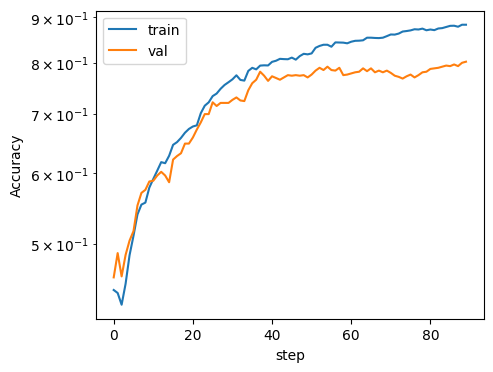

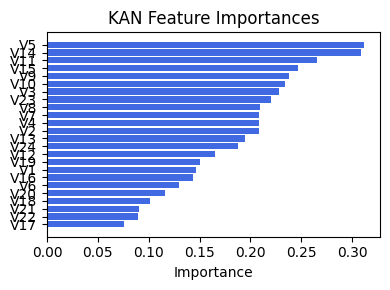

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3531579631077972), ('V22', 0.336611614590289), ('V21', 0.32450901456316356), ('V24', 0.2939988999775908), ('V13', 0.24394925089506944), ('V16', 0.24207466563660626), ('V8', 0.2384859185054772), ('V7', 0.23576748516001111), ('V12', 0.23210700530488038), ('V9', 0.2174747834472131), ('V11', 0.21649510720192502), ('V18', 0.2147784568475996), ('V17', 0.21223036736644865), ('V19', 0.19731904470943631), ('V6', 0.17349031698418185), ('V3', 0.17145807536000354), ('V20', 0.16485228522732218), ('V15', 0.16440175515801303), ('V14', 0.15791921587677965), ('V2', 0.15039760612278555), ('V10', 0.1449748031690443), ('V1', 0.12341210596646689), ('V4', 0.11832771766377526), ('Ex1', 0.11690497868333366), ('V5', 0.09200520118996286)]


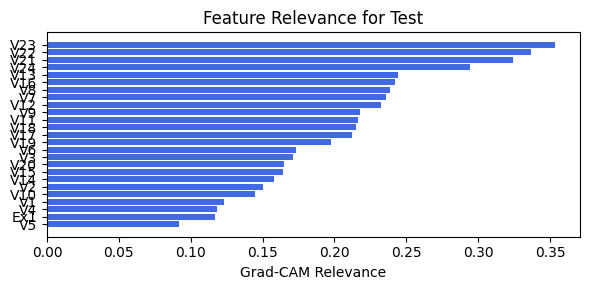

In [95]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=16, num_heads=4, filename=filename_4, opt_col_val='16, 4')

### 4.1.3.3 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=16, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.83e-01 | val_acc_hybrid: 8.02e-01 |: 100%|█████| 90/90 [00:29<00:00,  3.09it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.0183e-01 at 89 epoch
tensor(0.8068, device='cuda:0')
[[346  83   9   3]
 [ 23 374  21   2]
 [  1  12  51   2]
 [  6  21  28 110]]
M_KAN Relevance: 0.5029563903808594
CNN Relevance: 0.4970436096191406
[('V5', 0.31186375), ('V14', 0.30834895), ('V11', 0.26565304), ('V15', 0.246524), ('V9', 0.23784013), ('V10', 0.23441505), ('V3', 0.22781503), ('V23', 0.2204508), ('V8', 0.20987535), ('V7', 0.2086163), ('V4', 0.20850424), ('V2', 0.20807321), ('V13', 0.19450809), ('V24', 0.18810055), ('V12', 0.16498077), ('V19', 0.1500942), ('V1', 0.14646754), ('V16', 0.14383227), ('V6', 0.13026913), ('V20', 0.116465926), ('V18', 0.1008138), ('V21', 0.09090685), ('V22', 0.08914282), ('V17', 0.076153174)]


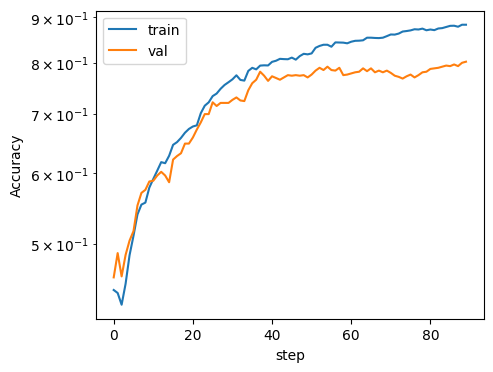

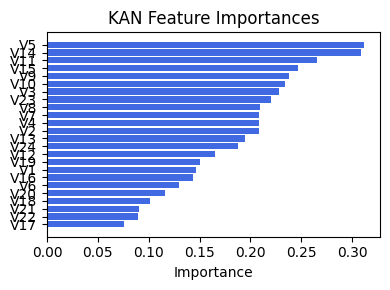

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3531579631077972), ('V22', 0.336611614590289), ('V21', 0.32450901456316356), ('V24', 0.2939988999775908), ('V13', 0.24394925089506944), ('V16', 0.24207466563660626), ('V8', 0.2384859185054772), ('V7', 0.23576748516001111), ('V12', 0.23210700530488038), ('V9', 0.2174747834472131), ('V11', 0.21649510720192502), ('V18', 0.2147784568475996), ('V17', 0.21223036736644865), ('V19', 0.19731904470943631), ('V6', 0.17349031698418185), ('V3', 0.17145807536000354), ('V20', 0.16485228522732218), ('V15', 0.16440175515801303), ('V14', 0.15791921587677965), ('V2', 0.15039760612278555), ('V10', 0.1449748031690443), ('V1', 0.12341210596646689), ('V4', 0.11832771766377526), ('Ex1', 0.11690497868333366), ('V5', 0.09200520118996286)]


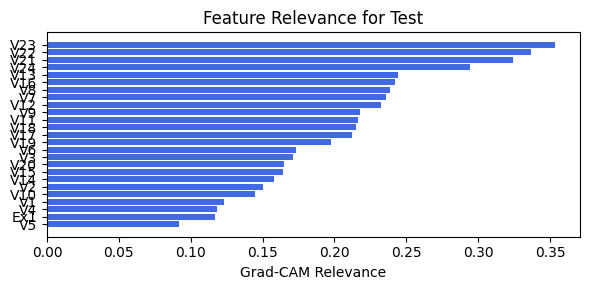

In [96]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=16, num_heads=4, filename=filename_4, opt_col_val='16, 4')

### 4.1.3.4 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=16, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.83e-01 | val_acc_hybrid: 8.02e-01 |: 100%|█████| 90/90 [00:30<00:00,  2.99it/s]

saving model version 0.1
✅ Best validation Accuracy: 8.0183e-01 at 89 epoch
tensor(0.8068, device='cuda:0')
[[346  83   9   3]
 [ 23 374  21   2]
 [  1  12  51   2]
 [  6  21  28 110]]
M_KAN Relevance: 0.5029563903808594
CNN Relevance: 0.4970436096191406
[('V5', 0.31186375), ('V14', 0.30834895), ('V11', 0.26565304), ('V15', 0.246524), ('V9', 0.23784013), ('V10', 0.23441505), ('V3', 0.22781503), ('V23', 0.2204508), ('V8', 0.20987535), ('V7', 0.2086163), ('V4', 0.20850424), ('V2', 0.20807321), ('V13', 0.19450809), ('V24', 0.18810055), ('V12', 0.16498077), ('V19', 0.1500942), ('V1', 0.14646754), ('V16', 0.14383227), ('V6', 0.13026913), ('V20', 0.116465926), ('V18', 0.1008138), ('V21', 0.09090685), ('V22', 0.08914282), ('V17', 0.076153174)]


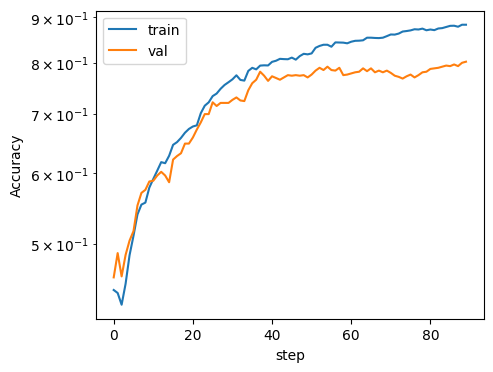

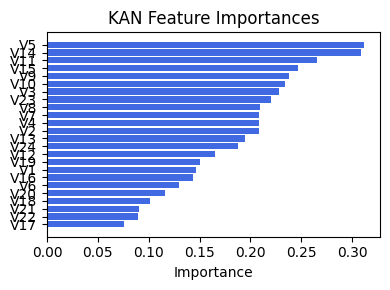

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V23', 0.3531579631077972), ('V22', 0.336611614590289), ('V21', 0.32450901456316356), ('V24', 0.2939988999775908), ('V13', 0.24394925089506944), ('V16', 0.24207466563660626), ('V8', 0.2384859185054772), ('V7', 0.23576748516001111), ('V12', 0.23210700530488038), ('V9', 0.2174747834472131), ('V11', 0.21649510720192502), ('V18', 0.2147784568475996), ('V17', 0.21223036736644865), ('V19', 0.19731904470943631), ('V6', 0.17349031698418185), ('V3', 0.17145807536000354), ('V20', 0.16485228522732218), ('V15', 0.16440175515801303), ('V14', 0.15791921587677965), ('V2', 0.15039760612278555), ('V10', 0.1449748031690443), ('V1', 0.12341210596646689), ('V4', 0.11832771766377526), ('Ex1', 0.11690497868333366), ('V5', 0.09200520118996286)]


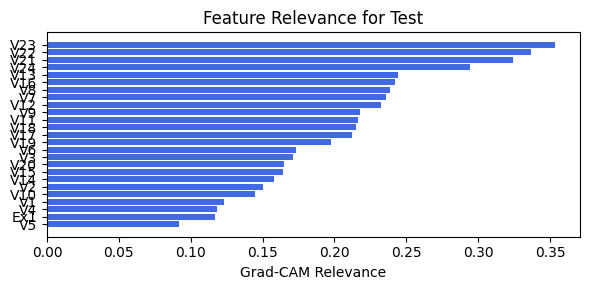

In [97]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=16, num_heads=8, filename=filename_4, opt_col_val='16, 8')

### 4.1.3.5 width=[24, 5, 1], grid=7, lamb=1e-07 | embed_dim=16, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.56e-01 | val_acc_hybrid: 7.79e-01 |: 100%|█████| 90/90 [00:31<00:00,  2.87it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.8465e-01 at 72 epoch
tensor(0.8022, device='cuda:0')
[[363  70   7   1]
 [ 33 368  18   1]
 [  1  24  40   1]
 [  9  19  32 105]]
M_KAN Relevance: 0.3361513018608093
CNN Relevance: 0.6638486981391907
[('V5', 0.311865), ('V14', 0.3083453), ('V11', 0.26564923), ('V15', 0.246519), ('V9', 0.23783246), ('V10', 0.23441063), ('V3', 0.22781621), ('V23', 0.22044952), ('V8', 0.20987463), ('V7', 0.20859909), ('V4', 0.20849383), ('V2', 0.2080709), ('V13', 0.19449723), ('V24', 0.18809976), ('V12', 0.16497037), ('V19', 0.15009074), ('V1', 0.14646938), ('V16', 0.14382435), ('V6', 0.1302536), ('V20', 0.11645787), ('V18', 0.10080761), ('V21', 0.090900235), ('V22', 0.08911846), ('V17', 0.07614527)]


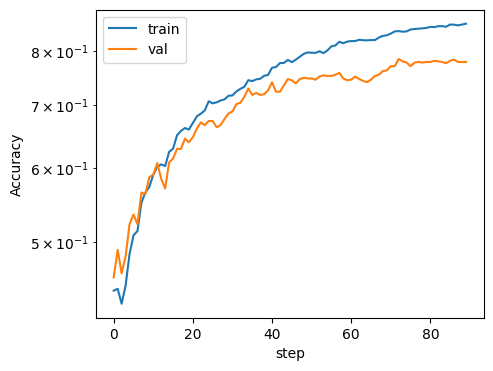

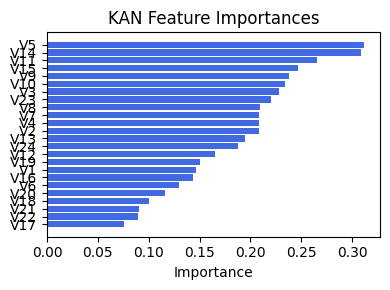

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.32575065605645154), ('V22', 0.31141740011222724), ('V8', 0.270837991132534), ('V21', 0.2681387852096985), ('V23', 0.2621982812712177), ('V24', 0.2509871428411139), ('V17', 0.23122199367149307), ('V19', 0.22429256963320998), ('V16', 0.22399662559209801), ('V18', 0.2126277653170914), ('V7', 0.20702783640242423), ('V12', 0.19333864057150024), ('V11', 0.18932039770176173), ('V9', 0.1812187990193633), ('V14', 0.1659343159622323), ('V6', 0.1631000013423925), ('V3', 0.14228873504667958), ('V1', 0.1398600569474107), ('V5', 0.13455647460964745), ('V2', 0.12780086182451986), ('V4', 0.125433385334103), ('Ex1', 0.10147905908413718), ('V10', 0.09998053029170272), ('V20', 0.09162248643532131), ('V15', 0.0822251196965649)]


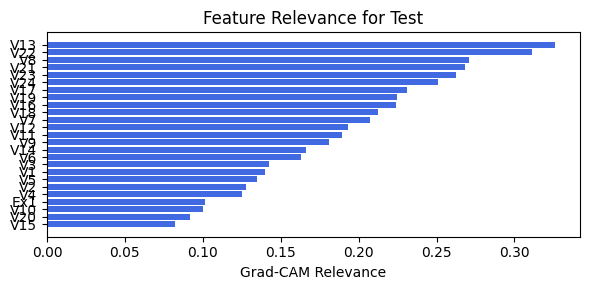

In [98]:
train_and_plot_relevance(Model3_4, kan_neurons=5, kan_grid=7, lamb=1e-07, steps=90, embed_dim=16, num_heads=8, filename=filename_4, opt_col_val='16, 8')

## 4.2. width=[24, 7, 1], grid=8, lamb=0.001

### 4.2.0.0 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.75e-01 | val_acc_hybrid: 7.59e-01 |: 100%|███| 100/100 [00:40<00:00,  2.45it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.6060e-01 at 91 epoch
tensor(0.7802, device='cuda:0')
[[341  92   6   2]
 [ 35 359  25   1]
 [  1  14  49   2]
 [  4  22  36 103]]
M_KAN Relevance: 0.12416976690292358
CNN Relevance: 0.8758302330970764
[('V14', 0.2981205), ('V6', 0.28065416), ('V11', 0.24143673), ('V20', 0.21309166), ('V7', 0.19081582), ('V21', 0.17594582), ('V13', 0.16296633), ('V9', 0.15302932), ('V15', 0.147323), ('V5', 0.13044854), ('V18', 0.12133642), ('V22', 0.11823312), ('V1', 0.116651915), ('V10', 0.11526849), ('V3', 0.11363727), ('V8', 0.11195066), ('V4', 0.11082091), ('V19', 0.10658285), ('V23', 0.104584046), ('V16', 0.10127966), ('V24', 0.09724429), ('V17', 0.09508828), ('V12', 0.08914676), ('V2', 0.07660136)]


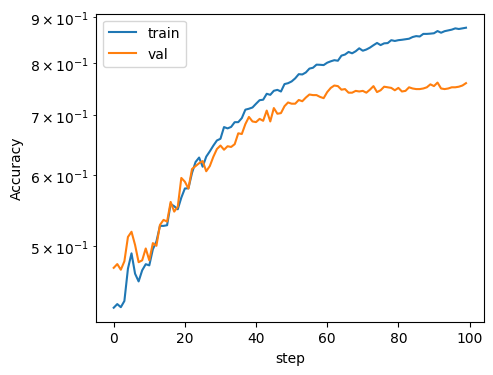

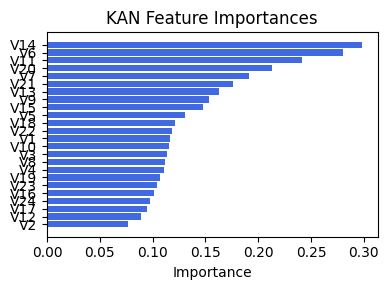

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3781902656754314), ('V22', 0.34232192979216186), ('V23', 0.33193936819938136), ('V24', 0.2943003958387988), ('V16', 0.2296804216801873), ('V13', 0.21545638518592158), ('V19', 0.21428759428756713), ('V11', 0.20502239685640647), ('V9', 0.18426679624849301), ('V12', 0.1785553219378393), ('V8', 0.17642845778979022), ('V18', 0.173190185339544), ('V7', 0.17241146548138322), ('V17', 0.17172731871604954), ('Ex1', 0.16752809887988498), ('V14', 0.16606827505224345), ('V6', 0.1635756550862368), ('V5', 0.15486815224487258), ('V20', 0.1469501575599576), ('V10', 0.14379353504323045), ('V15', 0.1383386168482559), ('V1', 0.12900556186519552), ('V2', 0.1121706291671663), ('V4', 0.11188130874099123), ('V3', 0.09608689807620456)]


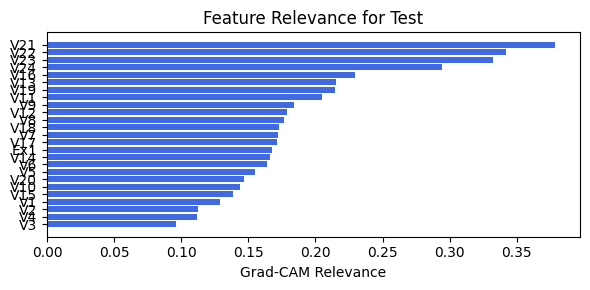

In [99]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=64, num_heads=2, filename=filename_4, opt_col_val='64, 2')

### 4.2.0.1 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.75e-01 | val_acc_hybrid: 7.59e-01 |: 100%|███| 100/100 [00:41<00:00,  2.40it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.6060e-01 at 91 epoch
tensor(0.7802, device='cuda:0')
[[341  92   6   2]
 [ 35 359  25   1]
 [  1  14  49   2]
 [  4  22  36 103]]
M_KAN Relevance: 0.12416976690292358
CNN Relevance: 0.8758302330970764
[('V14', 0.2981205), ('V6', 0.28065416), ('V11', 0.24143673), ('V20', 0.21309166), ('V7', 0.19081582), ('V21', 0.17594582), ('V13', 0.16296633), ('V9', 0.15302932), ('V15', 0.147323), ('V5', 0.13044854), ('V18', 0.12133642), ('V22', 0.11823312), ('V1', 0.116651915), ('V10', 0.11526849), ('V3', 0.11363727), ('V8', 0.11195066), ('V4', 0.11082091), ('V19', 0.10658285), ('V23', 0.104584046), ('V16', 0.10127966), ('V24', 0.09724429), ('V17', 0.09508828), ('V12', 0.08914676), ('V2', 0.07660136)]


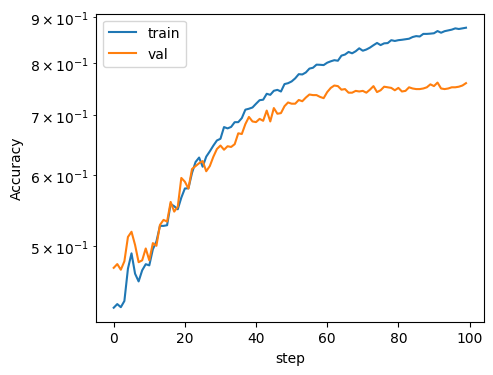

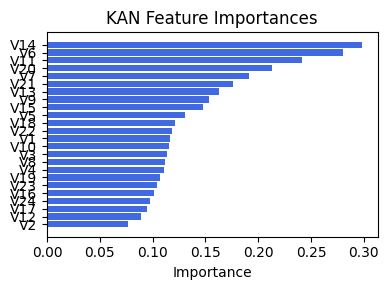

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3781902656754314), ('V22', 0.34232192979216186), ('V23', 0.33193936819938136), ('V24', 0.2943003958387988), ('V16', 0.2296804216801873), ('V13', 0.21545638518592158), ('V19', 0.21428759428756713), ('V11', 0.20502239685640647), ('V9', 0.18426679624849301), ('V12', 0.1785553219378393), ('V8', 0.17642845778979022), ('V18', 0.173190185339544), ('V7', 0.17241146548138322), ('V17', 0.17172731871604954), ('Ex1', 0.16752809887988498), ('V14', 0.16606827505224345), ('V6', 0.1635756550862368), ('V5', 0.15486815224487258), ('V20', 0.1469501575599576), ('V10', 0.14379353504323045), ('V15', 0.1383386168482559), ('V1', 0.12900556186519552), ('V2', 0.1121706291671663), ('V4', 0.11188130874099123), ('V3', 0.09608689807620456)]


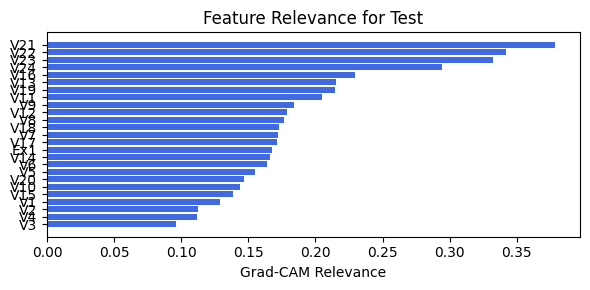

In [100]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=64, num_heads=2, filename=filename_4, opt_col_val='64, 2')

### 4.2.0.2 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.75e-01 | val_acc_hybrid: 7.59e-01 |: 100%|███| 100/100 [00:40<00:00,  2.45it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.6060e-01 at 91 epoch
tensor(0.7802, device='cuda:0')
[[341  92   6   2]
 [ 35 359  25   1]
 [  1  14  49   2]
 [  4  22  36 103]]
M_KAN Relevance: 0.12416976690292358
CNN Relevance: 0.8758302330970764
[('V14', 0.2981205), ('V6', 0.28065416), ('V11', 0.24143673), ('V20', 0.21309166), ('V7', 0.19081582), ('V21', 0.17594582), ('V13', 0.16296633), ('V9', 0.15302932), ('V15', 0.147323), ('V5', 0.13044854), ('V18', 0.12133642), ('V22', 0.11823312), ('V1', 0.116651915), ('V10', 0.11526849), ('V3', 0.11363727), ('V8', 0.11195066), ('V4', 0.11082091), ('V19', 0.10658285), ('V23', 0.104584046), ('V16', 0.10127966), ('V24', 0.09724429), ('V17', 0.09508828), ('V12', 0.08914676), ('V2', 0.07660136)]


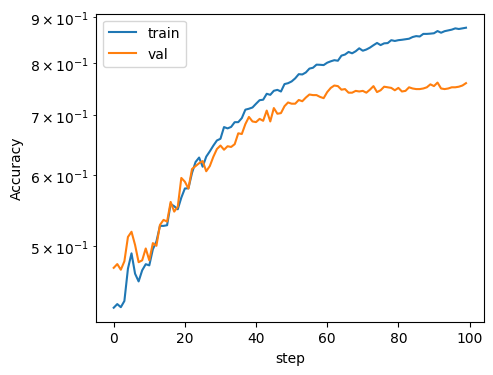

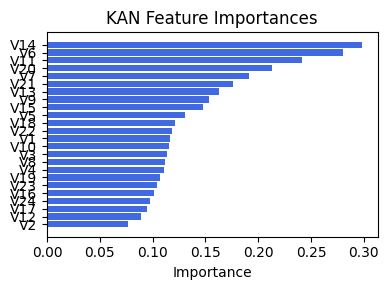

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3781902656754314), ('V22', 0.34232192979216186), ('V23', 0.33193936819938136), ('V24', 0.2943003958387988), ('V16', 0.2296804216801873), ('V13', 0.21545638518592158), ('V19', 0.21428759428756713), ('V11', 0.20502239685640647), ('V9', 0.18426679624849301), ('V12', 0.1785553219378393), ('V8', 0.17642845778979022), ('V18', 0.173190185339544), ('V7', 0.17241146548138322), ('V17', 0.17172731871604954), ('Ex1', 0.16752809887988498), ('V14', 0.16606827505224345), ('V6', 0.1635756550862368), ('V5', 0.15486815224487258), ('V20', 0.1469501575599576), ('V10', 0.14379353504323045), ('V15', 0.1383386168482559), ('V1', 0.12900556186519552), ('V2', 0.1121706291671663), ('V4', 0.11188130874099123), ('V3', 0.09608689807620456)]


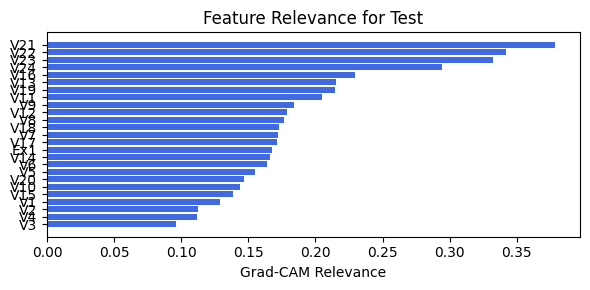

In [101]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=64, num_heads=4, filename=filename_4, opt_col_val='64, 4')

### 4.2.0.3 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.75e-01 | val_acc_hybrid: 7.59e-01 |: 100%|███| 100/100 [00:41<00:00,  2.43it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.6060e-01 at 91 epoch
tensor(0.7802, device='cuda:0')
[[341  92   6   2]
 [ 35 359  25   1]
 [  1  14  49   2]
 [  4  22  36 103]]
M_KAN Relevance: 0.12416976690292358
CNN Relevance: 0.8758302330970764
[('V14', 0.2981205), ('V6', 0.28065416), ('V11', 0.24143673), ('V20', 0.21309166), ('V7', 0.19081582), ('V21', 0.17594582), ('V13', 0.16296633), ('V9', 0.15302932), ('V15', 0.147323), ('V5', 0.13044854), ('V18', 0.12133642), ('V22', 0.11823312), ('V1', 0.116651915), ('V10', 0.11526849), ('V3', 0.11363727), ('V8', 0.11195066), ('V4', 0.11082091), ('V19', 0.10658285), ('V23', 0.104584046), ('V16', 0.10127966), ('V24', 0.09724429), ('V17', 0.09508828), ('V12', 0.08914676), ('V2', 0.07660136)]


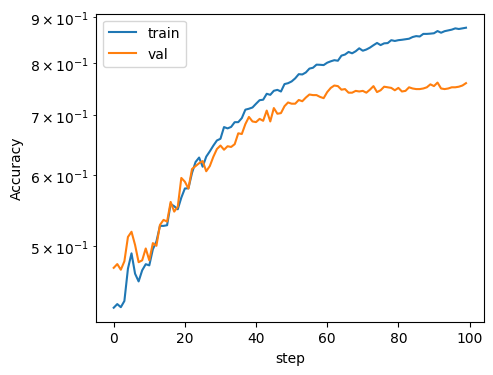

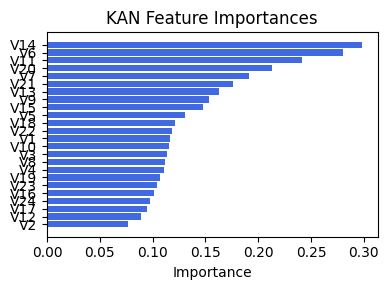

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3781902656754314), ('V22', 0.34232192979216186), ('V23', 0.33193936819938136), ('V24', 0.2943003958387988), ('V16', 0.2296804216801873), ('V13', 0.21545638518592158), ('V19', 0.21428759428756713), ('V11', 0.20502239685640647), ('V9', 0.18426679624849301), ('V12', 0.1785553219378393), ('V8', 0.17642845778979022), ('V18', 0.173190185339544), ('V7', 0.17241146548138322), ('V17', 0.17172731871604954), ('Ex1', 0.16752809887988498), ('V14', 0.16606827505224345), ('V6', 0.1635756550862368), ('V5', 0.15486815224487258), ('V20', 0.1469501575599576), ('V10', 0.14379353504323045), ('V15', 0.1383386168482559), ('V1', 0.12900556186519552), ('V2', 0.1121706291671663), ('V4', 0.11188130874099123), ('V3', 0.09608689807620456)]


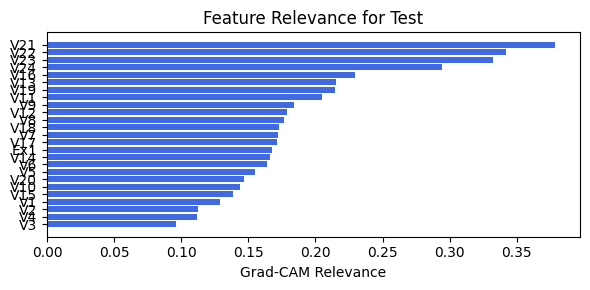

In [102]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=64, num_heads=4, filename=filename_4, opt_col_val='64, 4')

### 4.2.0.4 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.75e-01 | val_acc_hybrid: 7.59e-01 |: 100%|███| 100/100 [00:39<00:00,  2.53it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.6060e-01 at 91 epoch
tensor(0.7802, device='cuda:0')
[[341  92   6   2]
 [ 35 359  25   1]
 [  1  14  49   2]
 [  4  22  36 103]]
M_KAN Relevance: 0.12416976690292358
CNN Relevance: 0.8758302330970764
[('V14', 0.2981205), ('V6', 0.28065416), ('V11', 0.24143673), ('V20', 0.21309166), ('V7', 0.19081582), ('V21', 0.17594582), ('V13', 0.16296633), ('V9', 0.15302932), ('V15', 0.147323), ('V5', 0.13044854), ('V18', 0.12133642), ('V22', 0.11823312), ('V1', 0.116651915), ('V10', 0.11526849), ('V3', 0.11363727), ('V8', 0.11195066), ('V4', 0.11082091), ('V19', 0.10658285), ('V23', 0.104584046), ('V16', 0.10127966), ('V24', 0.09724429), ('V17', 0.09508828), ('V12', 0.08914676), ('V2', 0.07660136)]


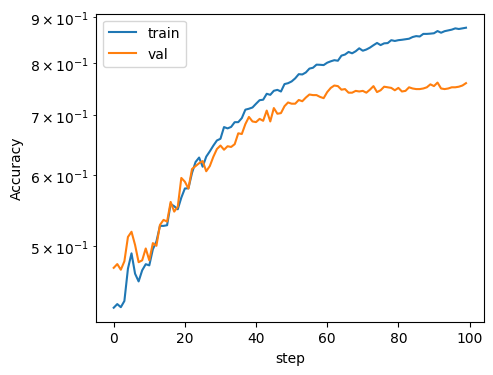

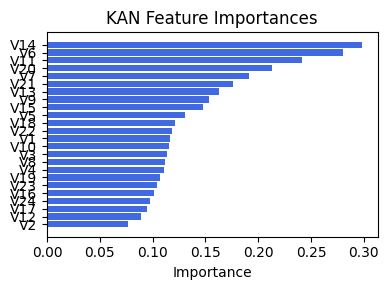

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3781902656754314), ('V22', 0.34232192979216186), ('V23', 0.33193936819938136), ('V24', 0.2943003958387988), ('V16', 0.2296804216801873), ('V13', 0.21545638518592158), ('V19', 0.21428759428756713), ('V11', 0.20502239685640647), ('V9', 0.18426679624849301), ('V12', 0.1785553219378393), ('V8', 0.17642845778979022), ('V18', 0.173190185339544), ('V7', 0.17241146548138322), ('V17', 0.17172731871604954), ('Ex1', 0.16752809887988498), ('V14', 0.16606827505224345), ('V6', 0.1635756550862368), ('V5', 0.15486815224487258), ('V20', 0.1469501575599576), ('V10', 0.14379353504323045), ('V15', 0.1383386168482559), ('V1', 0.12900556186519552), ('V2', 0.1121706291671663), ('V4', 0.11188130874099123), ('V3', 0.09608689807620456)]


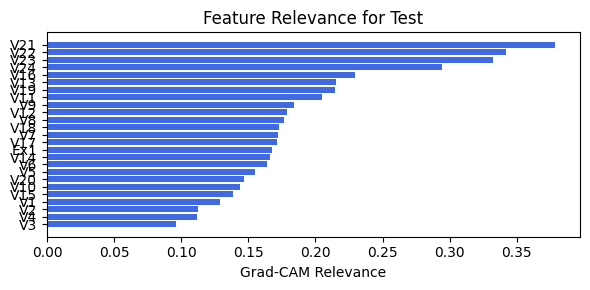

In [103]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=64, num_heads=8, filename=filename_4, opt_col_val='64, 8')

### 4.2.0.5 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=64, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.75e-01 | val_acc_hybrid: 7.59e-01 |: 100%|███| 100/100 [00:40<00:00,  2.44it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.6060e-01 at 91 epoch
tensor(0.7802, device='cuda:0')
[[341  92   6   2]
 [ 35 359  25   1]
 [  1  14  49   2]
 [  4  22  36 103]]
M_KAN Relevance: 0.12416976690292358
CNN Relevance: 0.8758302330970764
[('V14', 0.2981205), ('V6', 0.28065416), ('V11', 0.24143673), ('V20', 0.21309166), ('V7', 0.19081582), ('V21', 0.17594582), ('V13', 0.16296633), ('V9', 0.15302932), ('V15', 0.147323), ('V5', 0.13044854), ('V18', 0.12133642), ('V22', 0.11823312), ('V1', 0.116651915), ('V10', 0.11526849), ('V3', 0.11363727), ('V8', 0.11195066), ('V4', 0.11082091), ('V19', 0.10658285), ('V23', 0.104584046), ('V16', 0.10127966), ('V24', 0.09724429), ('V17', 0.09508828), ('V12', 0.08914676), ('V2', 0.07660136)]


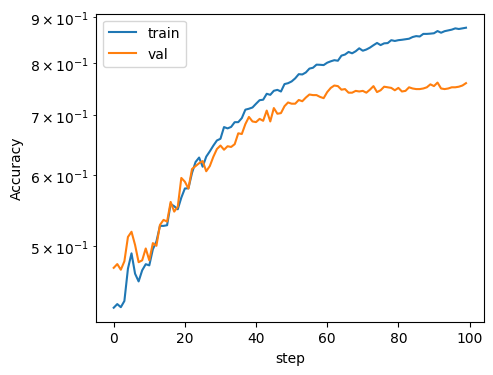

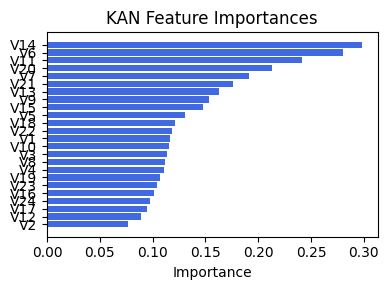

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3781902656754314), ('V22', 0.34232192979216186), ('V23', 0.33193936819938136), ('V24', 0.2943003958387988), ('V16', 0.2296804216801873), ('V13', 0.21545638518592158), ('V19', 0.21428759428756713), ('V11', 0.20502239685640647), ('V9', 0.18426679624849301), ('V12', 0.1785553219378393), ('V8', 0.17642845778979022), ('V18', 0.173190185339544), ('V7', 0.17241146548138322), ('V17', 0.17172731871604954), ('Ex1', 0.16752809887988498), ('V14', 0.16606827505224345), ('V6', 0.1635756550862368), ('V5', 0.15486815224487258), ('V20', 0.1469501575599576), ('V10', 0.14379353504323045), ('V15', 0.1383386168482559), ('V1', 0.12900556186519552), ('V2', 0.1121706291671663), ('V4', 0.11188130874099123), ('V3', 0.09608689807620456)]


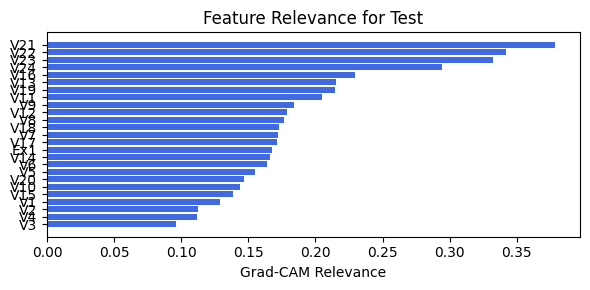

In [104]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=64, num_heads=8, filename=filename_4, opt_col_val='64, 8')

### 4.2.1.0 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.93e-01 | val_acc_hybrid: 8.11e-01 |: 100%|███| 100/100 [00:35<00:00,  2.78it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.1100e-01 at 98 epoch
tensor(0.7949, device='cuda:0')
[[342  79  16   4]
 [ 25 380  15   0]
 [  2  25  36   3]
 [  2  20  33 110]]
M_KAN Relevance: 0.4571354389190674
CNN Relevance: 0.5428645610809326
[('V14', 0.26477322), ('V20', 0.19855565), ('V10', 0.1923617), ('V21', 0.18971011), ('V15', 0.17898531), ('V1', 0.17036436), ('V5', 0.16448016), ('V6', 0.16400239), ('V24', 0.15570231), ('V4', 0.1516802), ('V19', 0.15026967), ('V11', 0.14772911), ('V18', 0.13568932), ('V22', 0.13374956), ('V2', 0.13254046), ('V9', 0.12885697), ('V7', 0.12681004), ('V17', 0.123985074), ('V12', 0.12267955), ('V23', 0.11350891), ('V13', 0.11067991), ('V16', 0.09836189), ('V8', 0.097106196), ('V3', 0.071070895)]


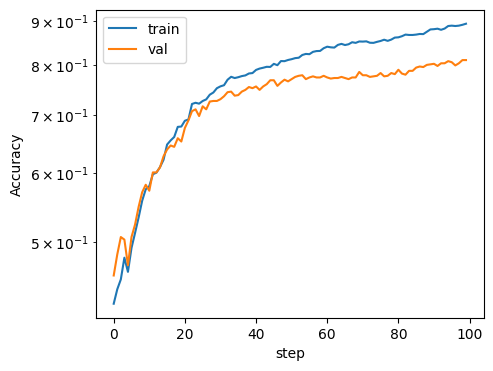

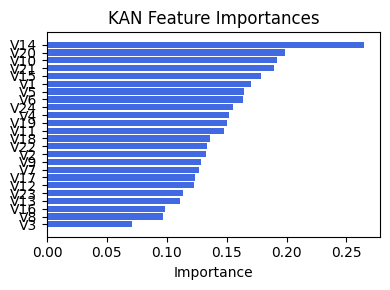

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3341784259703476), ('V23', 0.29809069405894334), ('V22', 0.28362969799580395), ('V24', 0.28091065277986826), ('V14', 0.27612467834863713), ('V19', 0.2657763866919618), ('V9', 0.24496021738864146), ('V16', 0.23408034439916142), ('V11', 0.22110362829565455), ('V13', 0.21238913330627518), ('V12', 0.20575554233092147), ('V7', 0.2009975467710466), ('Ex1', 0.2000536537110241), ('V8', 0.19893145026789846), ('V17', 0.197680233874619), ('V15', 0.1832048126449254), ('V20', 0.17085731635221976), ('V18', 0.165054912353798), ('V6', 0.1509731283665629), ('V10', 0.12217802375566979), ('V4', 0.09227248690867548), ('V3', 0.09223002069043454), ('V5', 0.08515846278485809), ('V2', 0.08000885986862341), ('V1', 0.07955403915986571)]


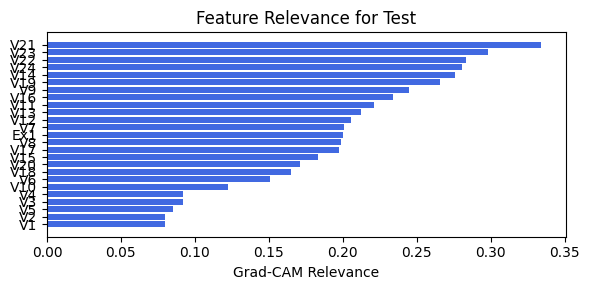

In [105]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=32, num_heads=2, filename=filename_4, opt_col_val='32, 2')

### 4.2.1.1 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.57e-01 | val_acc_hybrid: 8.00e-01 |: 100%|███| 100/100 [00:33<00:00,  2.96it/s]

saving model version 0.1
✅ Best validation Accuracy: 8.1901e-01 at 88 epoch
tensor(0.7985, device='cuda:0')
[[339  93   5   4]
 [ 22 389   7   2]
 [  1  27  36   2]
 [  8  32  17 108]]
M_KAN Relevance: 0.496658056974411
CNN Relevance: 0.5033419728279114
[('V14', 0.3349653), ('V7', 0.27495864), ('V15', 0.21893352), ('V13', 0.2097248), ('V5', 0.19473664), ('V19', 0.18148421), ('V20', 0.15429436), ('V22', 0.15280573), ('V2', 0.13631512), ('V8', 0.12813146), ('V9', 0.11374767), ('V3', 0.11234516), ('V12', 0.10757639), ('V6', 0.103991725), ('V16', 0.09263204), ('V17', 0.08475713), ('V10', 0.08332148), ('V11', 0.07739692), ('V4', 0.075154856), ('V23', 0.06645598), ('V21', 0.06385073), ('V1', 0.06244995), ('V24', 0.057963677), ('V18', 0.053566623)]


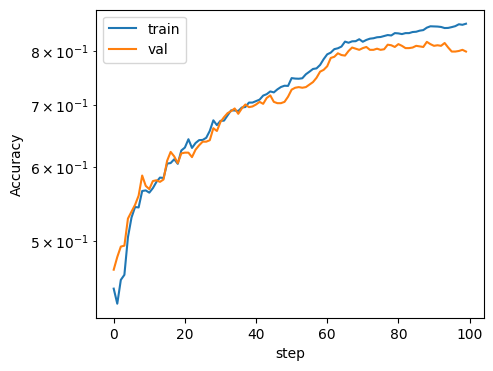

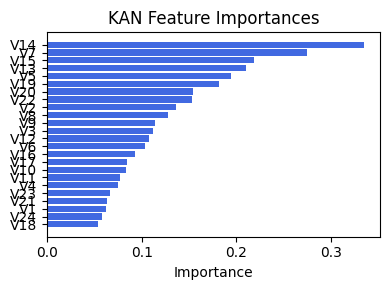

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.4321435818059159), ('V23', 0.30092253924239576), ('V22', 0.29729060749990815), ('V24', 0.2972263893361575), ('V16', 0.2967649117867498), ('V11', 0.2710394342309203), ('V19', 0.24506015512198803), ('V14', 0.23704363066812115), ('V13', 0.19002218449431993), ('V9', 0.18949710482768453), ('V12', 0.18546684299287133), ('V7', 0.1745167089205067), ('V6', 0.1591630435083035), ('V8', 0.15496560179615318), ('V18', 0.15456660385657764), ('V17', 0.14315477181927758), ('V20', 0.1324170295605048), ('V15', 0.12954899786590707), ('V10', 0.10282794372134905), ('Ex1', 0.09393752395685408), ('V2', 0.06460813895060484), ('V5', 0.06095981841895831), ('V4', 0.05878896038595798), ('V3', 0.05553913631712144), ('V1', 0.04516058074318524)]


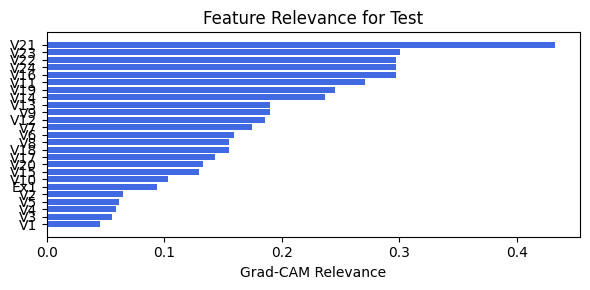

In [106]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=32, num_heads=2, filename=filename_4, opt_col_val='32, 2')

### 4.2.1.2 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.06e-01 | val_acc_hybrid: 8.24e-01 |: 100%|███| 100/100 [00:32<00:00,  3.05it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.3047e-01 at 69 epoch
tensor(0.7875, device='cuda:0')
[[345  76  18   2]
 [ 29 376  14   1]
 [  3  23  39   1]
 [  3  27  35 100]]
M_KAN Relevance: 0.14474044740200043
CNN Relevance: 0.8552595973014832
[('V14', 0.3722814), ('V20', 0.20378122), ('V23', 0.20192356), ('V21', 0.1902135), ('V7', 0.17703757), ('V15', 0.17451693), ('V2', 0.16650176), ('V11', 0.16361955), ('V22', 0.15486106), ('V13', 0.14952739), ('V9', 0.14779943), ('V1', 0.1474416), ('V4', 0.14211726), ('V24', 0.1372479), ('V8', 0.12585989), ('V18', 0.12364044), ('V12', 0.1194195), ('V17', 0.11597944), ('V16', 0.11474456), ('V10', 0.11149789), ('V5', 0.10624155), ('V3', 0.103843726), ('V19', 0.09874756), ('V6', 0.096869856)]


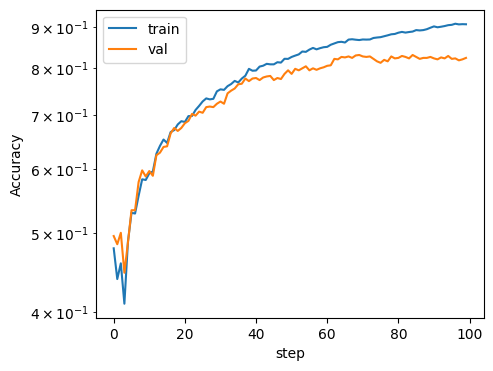

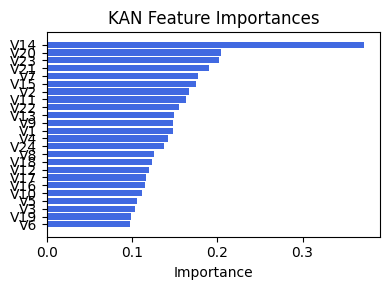

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3392421002214851), ('V22', 0.2970391061314394), ('V23', 0.28264758857976663), ('V24', 0.24721569425246043), ('V19', 0.2313412421631572), ('V9', 0.21827266902340647), ('V16', 0.2069903553578708), ('V7', 0.198785870591854), ('V14', 0.197075257930033), ('V8', 0.19293175894360765), ('V13', 0.18624028583474353), ('V12', 0.16146783598155323), ('V11', 0.15801760056691797), ('V20', 0.15623907862493816), ('V10', 0.15106513369607785), ('V15', 0.14882929350126659), ('V17', 0.13988461408540462), ('V6', 0.1373931422907105), ('V18', 0.13604963081962146), ('V5', 0.12067598304286585), ('V3', 0.11947515083297747), ('V4', 0.11524123340462547), ('V2', 0.10927614644856892), ('Ex1', 0.09032185892320764), ('V1', 0.07833745907979332)]


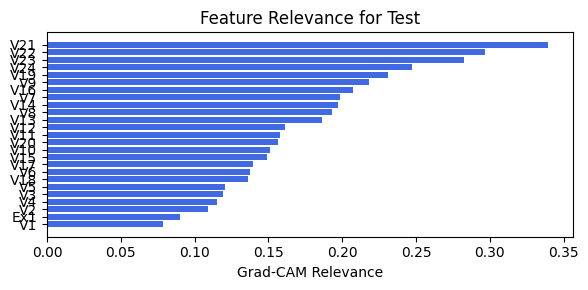

In [108]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=32, num_heads=4, filename=filename_4, opt_col_val='32, 4')

### 4.2.1.3 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.93e-01 | val_acc_hybrid: 8.11e-01 |: 100%|███| 100/100 [00:35<00:00,  2.80it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.1100e-01 at 98 epoch
tensor(0.7949, device='cuda:0')
[[342  79  16   4]
 [ 25 380  15   0]
 [  2  25  36   3]
 [  2  20  33 110]]
M_KAN Relevance: 0.4571354389190674
CNN Relevance: 0.5428645610809326
[('V14', 0.26477322), ('V20', 0.19855565), ('V10', 0.1923617), ('V21', 0.18971011), ('V15', 0.17898531), ('V1', 0.17036436), ('V5', 0.16448016), ('V6', 0.16400239), ('V24', 0.15570231), ('V4', 0.1516802), ('V19', 0.15026967), ('V11', 0.14772911), ('V18', 0.13568932), ('V22', 0.13374956), ('V2', 0.13254046), ('V9', 0.12885697), ('V7', 0.12681004), ('V17', 0.123985074), ('V12', 0.12267955), ('V23', 0.11350891), ('V13', 0.11067991), ('V16', 0.09836189), ('V8', 0.097106196), ('V3', 0.071070895)]


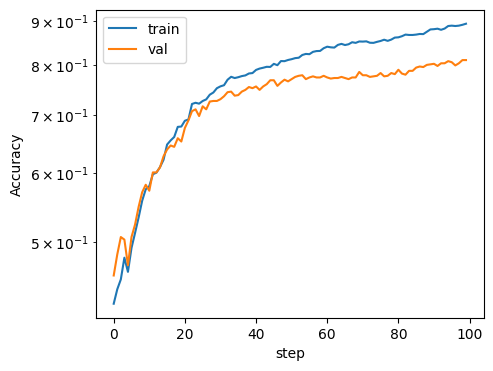

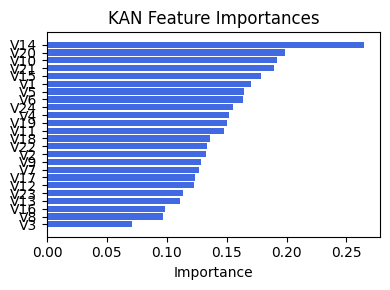

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3341784259703476), ('V23', 0.29809069405894334), ('V22', 0.28362969799580395), ('V24', 0.28091065277986826), ('V14', 0.27612467834863713), ('V19', 0.2657763866919618), ('V9', 0.24496021738864146), ('V16', 0.23408034439916142), ('V11', 0.22110362829565455), ('V13', 0.21238913330627518), ('V12', 0.20575554233092147), ('V7', 0.2009975467710466), ('Ex1', 0.2000536537110241), ('V8', 0.19893145026789846), ('V17', 0.197680233874619), ('V15', 0.1832048126449254), ('V20', 0.17085731635221976), ('V18', 0.165054912353798), ('V6', 0.1509731283665629), ('V10', 0.12217802375566979), ('V4', 0.09227248690867548), ('V3', 0.09223002069043454), ('V5', 0.08515846278485809), ('V2', 0.08000885986862341), ('V1', 0.07955403915986571)]


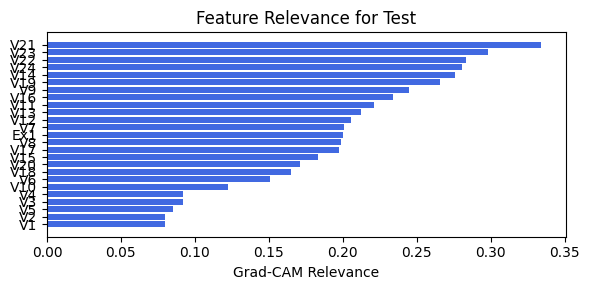

In [109]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=32, num_heads=4, filename=filename_4, opt_col_val='32, 4')

### 4.2.1.4 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.93e-01 | val_acc_hybrid: 8.11e-01 |: 100%|███| 100/100 [00:36<00:00,  2.76it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.1100e-01 at 98 epoch
tensor(0.7949, device='cuda:0')
[[342  79  16   4]
 [ 25 380  15   0]
 [  2  25  36   3]
 [  2  20  33 110]]
M_KAN Relevance: 0.4571354389190674
CNN Relevance: 0.5428645610809326
[('V14', 0.26477322), ('V20', 0.19855565), ('V10', 0.1923617), ('V21', 0.18971011), ('V15', 0.17898531), ('V1', 0.17036436), ('V5', 0.16448016), ('V6', 0.16400239), ('V24', 0.15570231), ('V4', 0.1516802), ('V19', 0.15026967), ('V11', 0.14772911), ('V18', 0.13568932), ('V22', 0.13374956), ('V2', 0.13254046), ('V9', 0.12885697), ('V7', 0.12681004), ('V17', 0.123985074), ('V12', 0.12267955), ('V23', 0.11350891), ('V13', 0.11067991), ('V16', 0.09836189), ('V8', 0.097106196), ('V3', 0.071070895)]


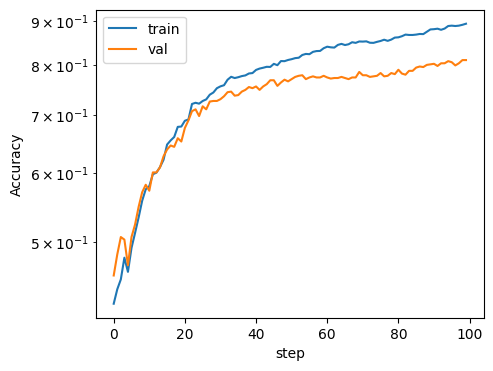

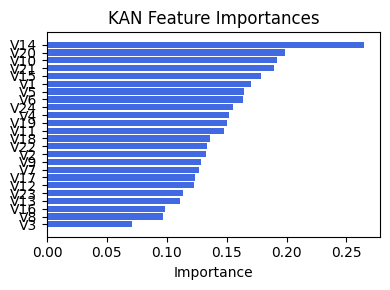

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3341784259703476), ('V23', 0.29809069405894334), ('V22', 0.28362969799580395), ('V24', 0.28091065277986826), ('V14', 0.27612467834863713), ('V19', 0.2657763866919618), ('V9', 0.24496021738864146), ('V16', 0.23408034439916142), ('V11', 0.22110362829565455), ('V13', 0.21238913330627518), ('V12', 0.20575554233092147), ('V7', 0.2009975467710466), ('Ex1', 0.2000536537110241), ('V8', 0.19893145026789846), ('V17', 0.197680233874619), ('V15', 0.1832048126449254), ('V20', 0.17085731635221976), ('V18', 0.165054912353798), ('V6', 0.1509731283665629), ('V10', 0.12217802375566979), ('V4', 0.09227248690867548), ('V3', 0.09223002069043454), ('V5', 0.08515846278485809), ('V2', 0.08000885986862341), ('V1', 0.07955403915986571)]


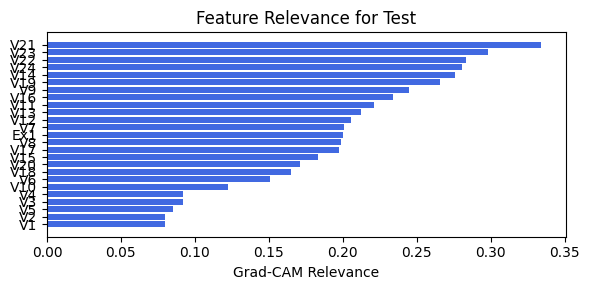

In [110]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=32, num_heads=8, filename=filename_4, opt_col_val='32, 8')

### 4.2.1.5 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=32, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.93e-01 | val_acc_hybrid: 8.11e-01 |: 100%|███| 100/100 [00:35<00:00,  2.83it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.1100e-01 at 98 epoch
tensor(0.7949, device='cuda:0')
[[342  79  16   4]
 [ 25 380  15   0]
 [  2  25  36   3]
 [  2  20  33 110]]
M_KAN Relevance: 0.4571354389190674
CNN Relevance: 0.5428645610809326
[('V14', 0.26477322), ('V20', 0.19855565), ('V10', 0.1923617), ('V21', 0.18971011), ('V15', 0.17898531), ('V1', 0.17036436), ('V5', 0.16448016), ('V6', 0.16400239), ('V24', 0.15570231), ('V4', 0.1516802), ('V19', 0.15026967), ('V11', 0.14772911), ('V18', 0.13568932), ('V22', 0.13374956), ('V2', 0.13254046), ('V9', 0.12885697), ('V7', 0.12681004), ('V17', 0.123985074), ('V12', 0.12267955), ('V23', 0.11350891), ('V13', 0.11067991), ('V16', 0.09836189), ('V8', 0.097106196), ('V3', 0.071070895)]


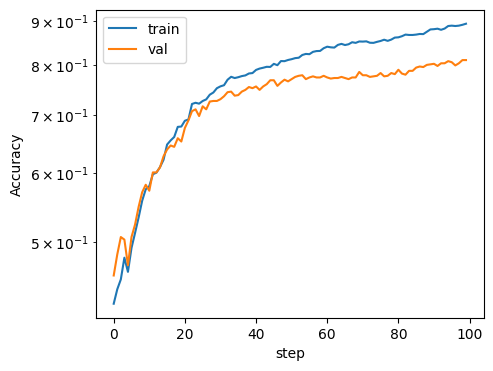

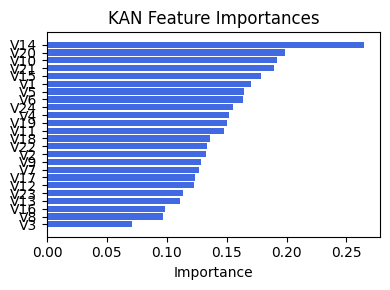

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3341784259703476), ('V23', 0.29809069405894334), ('V22', 0.28362969799580395), ('V24', 0.28091065277986826), ('V14', 0.27612467834863713), ('V19', 0.2657763866919618), ('V9', 0.24496021738864146), ('V16', 0.23408034439916142), ('V11', 0.22110362829565455), ('V13', 0.21238913330627518), ('V12', 0.20575554233092147), ('V7', 0.2009975467710466), ('Ex1', 0.2000536537110241), ('V8', 0.19893145026789846), ('V17', 0.197680233874619), ('V15', 0.1832048126449254), ('V20', 0.17085731635221976), ('V18', 0.165054912353798), ('V6', 0.1509731283665629), ('V10', 0.12217802375566979), ('V4', 0.09227248690867548), ('V3', 0.09223002069043454), ('V5', 0.08515846278485809), ('V2', 0.08000885986862341), ('V1', 0.07955403915986571)]


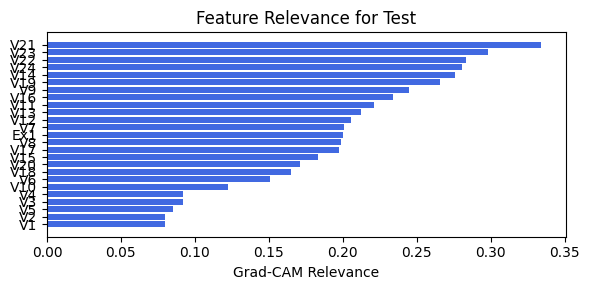

In [111]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=32, num_heads=8, filename=filename_4, opt_col_val='32, 8')

### 4.2.2.0 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.91e-01 | val_acc_hybrid: 7.88e-01 |: 100%|███| 100/100 [00:34<00:00,  2.91it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.8809e-01 at 98 epoch
tensor(0.8068, device='cuda:0')
[[353  73  14   1]
 [ 28 375  17   0]
 [  2  22  40   2]
 [  4  22  26 113]]
M_KAN Relevance: 0.2842920422554016
CNN Relevance: 0.7157080173492432
[('V23', 0.23923442), ('V5', 0.2234396), ('V9', 0.22179575), ('V16', 0.17693587), ('V15', 0.16658734), ('V7', 0.16586094), ('V3', 0.14916101), ('V6', 0.13688853), ('V24', 0.13531443), ('V4', 0.13204177), ('V14', 0.116725236), ('V19', 0.11224283), ('V8', 0.10689806), ('V11', 0.0958402), ('V2', 0.08407039), ('V1', 0.07371262), ('V10', 0.07154745), ('V22', 0.06714219), ('V12', 0.06625957), ('V13', 0.061479792), ('V20', 0.06017435), ('V18', 0.05294228), ('V17', 0.04350022), ('V21', 0.041890454)]


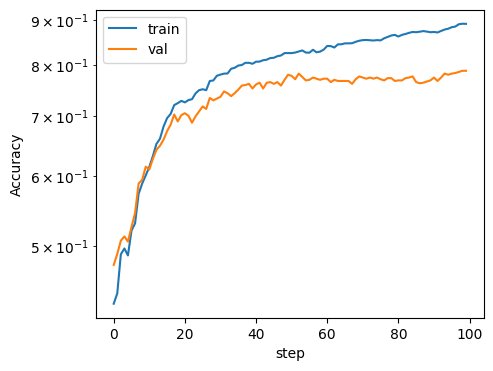

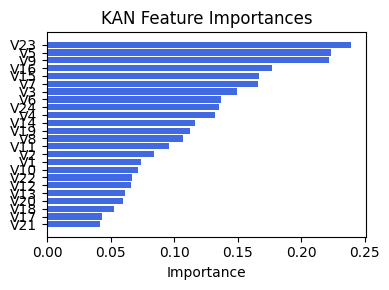

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.3117784348994194), ('V13', 0.2839704517029045), ('V20', 0.2746018240849324), ('V15', 0.2611386576644934), ('V17', 0.24683851869898243), ('V18', 0.2389334470121167), ('V22', 0.23409613224886439), ('V19', 0.2268037183360357), ('V12', 0.21845787691362378), ('V8', 0.21826744627775949), ('V7', 0.18661350786333925), ('V14', 0.18579299467544996), ('V10', 0.17948282458881282), ('V16', 0.17014289829642157), ('V23', 0.16697616260385226), ('V9', 0.1654360544647376), ('V11', 0.16539121240703858), ('V1', 0.1575888657977115), ('V21', 0.1553089333190409), ('V24', 0.15512858216339276), ('V6', 0.14853846800662604), ('V2', 0.12826042196056633), ('V3', 0.12501829569452969), ('V5', 0.11920025509018756), ('V4', 0.1181234274262453)]


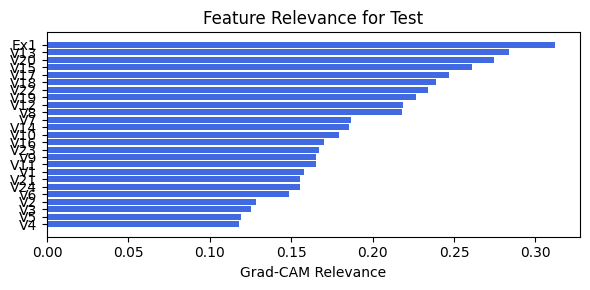

In [114]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=16, num_heads=2, filename=filename_4, opt_col_val='16, 2')

### 4.2.2.1 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.91e-01 | val_acc_hybrid: 7.88e-01 |: 100%|███| 100/100 [00:32<00:00,  3.04it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.8809e-01 at 98 epoch
tensor(0.8068, device='cuda:0')
[[353  73  14   1]
 [ 28 375  17   0]
 [  2  22  40   2]
 [  4  22  26 113]]
M_KAN Relevance: 0.2842920422554016
CNN Relevance: 0.7157080173492432
[('V23', 0.23923442), ('V5', 0.2234396), ('V9', 0.22179575), ('V16', 0.17693587), ('V15', 0.16658734), ('V7', 0.16586094), ('V3', 0.14916101), ('V6', 0.13688853), ('V24', 0.13531443), ('V4', 0.13204177), ('V14', 0.116725236), ('V19', 0.11224283), ('V8', 0.10689806), ('V11', 0.0958402), ('V2', 0.08407039), ('V1', 0.07371262), ('V10', 0.07154745), ('V22', 0.06714219), ('V12', 0.06625957), ('V13', 0.061479792), ('V20', 0.06017435), ('V18', 0.05294228), ('V17', 0.04350022), ('V21', 0.041890454)]


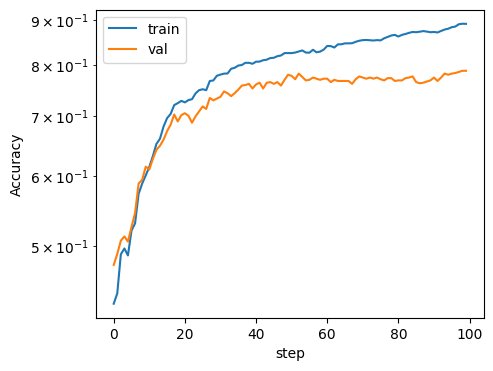

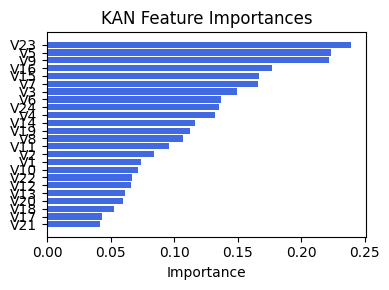

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.3117784348994194), ('V13', 0.2839704517029045), ('V20', 0.2746018240849324), ('V15', 0.2611386576644934), ('V17', 0.24683851869898243), ('V18', 0.2389334470121167), ('V22', 0.23409613224886439), ('V19', 0.2268037183360357), ('V12', 0.21845787691362378), ('V8', 0.21826744627775949), ('V7', 0.18661350786333925), ('V14', 0.18579299467544996), ('V10', 0.17948282458881282), ('V16', 0.17014289829642157), ('V23', 0.16697616260385226), ('V9', 0.1654360544647376), ('V11', 0.16539121240703858), ('V1', 0.1575888657977115), ('V21', 0.1553089333190409), ('V24', 0.15512858216339276), ('V6', 0.14853846800662604), ('V2', 0.12826042196056633), ('V3', 0.12501829569452969), ('V5', 0.11920025509018756), ('V4', 0.1181234274262453)]


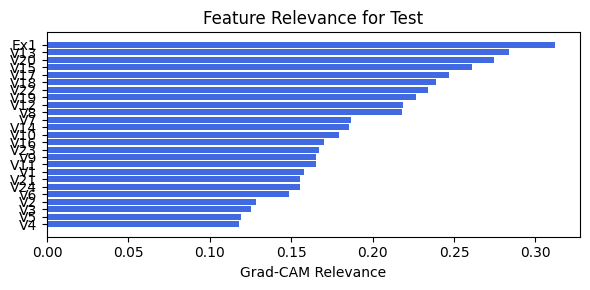

In [115]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=16, num_heads=2, filename=filename_4, opt_col_val='16, 2')

### 4.2.2.2 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.91e-01 | val_acc_hybrid: 7.88e-01 |: 100%|███| 100/100 [00:33<00:00,  3.03it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.8809e-01 at 98 epoch
tensor(0.8068, device='cuda:0')
[[353  73  14   1]
 [ 28 375  17   0]
 [  2  22  40   2]
 [  4  22  26 113]]
M_KAN Relevance: 0.2842920422554016
CNN Relevance: 0.7157080173492432
[('V23', 0.23923442), ('V5', 0.2234396), ('V9', 0.22179575), ('V16', 0.17693587), ('V15', 0.16658734), ('V7', 0.16586094), ('V3', 0.14916101), ('V6', 0.13688853), ('V24', 0.13531443), ('V4', 0.13204177), ('V14', 0.116725236), ('V19', 0.11224283), ('V8', 0.10689806), ('V11', 0.0958402), ('V2', 0.08407039), ('V1', 0.07371262), ('V10', 0.07154745), ('V22', 0.06714219), ('V12', 0.06625957), ('V13', 0.061479792), ('V20', 0.06017435), ('V18', 0.05294228), ('V17', 0.04350022), ('V21', 0.041890454)]


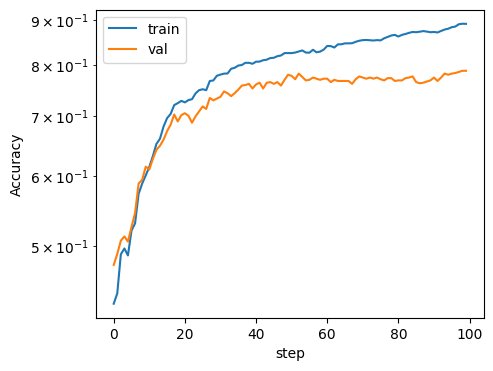

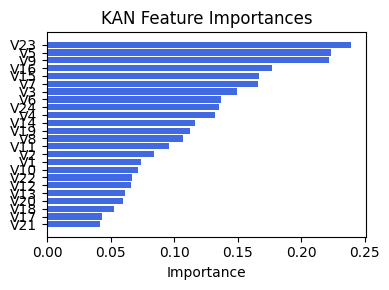

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('Ex1', 0.3117784348994194), ('V13', 0.2839704517029045), ('V20', 0.2746018240849324), ('V15', 0.2611386576644934), ('V17', 0.24683851869898243), ('V18', 0.2389334470121167), ('V22', 0.23409613224886439), ('V19', 0.2268037183360357), ('V12', 0.21845787691362378), ('V8', 0.21826744627775949), ('V7', 0.18661350786333925), ('V14', 0.18579299467544996), ('V10', 0.17948282458881282), ('V16', 0.17014289829642157), ('V23', 0.16697616260385226), ('V9', 0.1654360544647376), ('V11', 0.16539121240703858), ('V1', 0.1575888657977115), ('V21', 0.1553089333190409), ('V24', 0.15512858216339276), ('V6', 0.14853846800662604), ('V2', 0.12826042196056633), ('V3', 0.12501829569452969), ('V5', 0.11920025509018756), ('V4', 0.1181234274262453)]


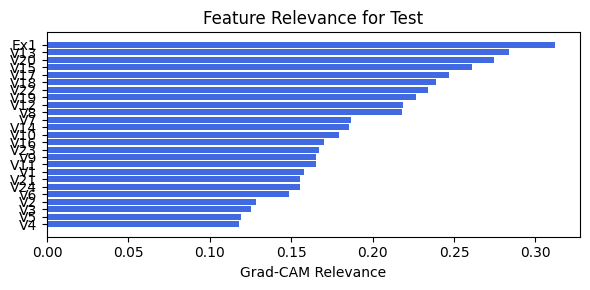

In [116]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=16, num_heads=4, filename=filename_4, opt_col_val='16, 4')

### 4.2.2.3 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.84e-01 | val_acc_hybrid: 8.01e-01 |: 100%|███| 100/100 [00:33<00:00,  2.97it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.1329e-01 at 98 epoch
tensor(0.8150, device='cuda:0')
[[358  67  13   3]
 [ 24 383  12   1]
 [  2  25  35   4]
 [  7  23  21 114]]
M_KAN Relevance: 0.17915292084217072
CNN Relevance: 0.8208470344543457
[('V15', 0.28646645), ('V23', 0.2471369), ('V14', 0.19406377), ('V7', 0.16266298), ('V13', 0.16118594), ('V19', 0.15706), ('V16', 0.14545551), ('V10', 0.1380379), ('V9', 0.12516221), ('V6', 0.1228331), ('V11', 0.10947771), ('V20', 0.10901424), ('V1', 0.106071405), ('V22', 0.101924986), ('V21', 0.10159282), ('V24', 0.1007747), ('V17', 0.071653895), ('V2', 0.06996493), ('V8', 0.06685331), ('V18', 0.06605548), ('V4', 0.055245046), ('V5', 0.052092437), ('V12', 0.044143144), ('V3', 0.029555803)]


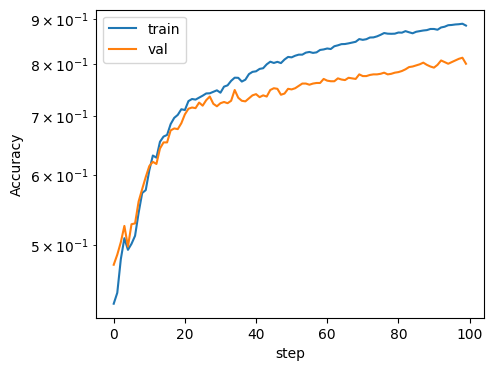

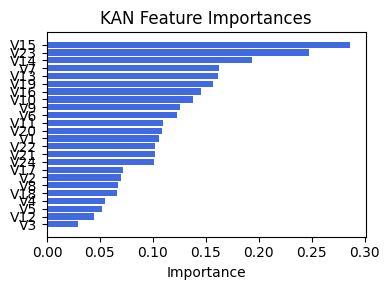

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.2919646076265413), ('V15', 0.2880926987896891), ('Ex1', 0.2723640554990524), ('V17', 0.23613832267116674), ('V16', 0.2353413797189625), ('V22', 0.2183986091504433), ('V21', 0.21562822993313097), ('V12', 0.20589348879559524), ('V11', 0.20240490979788678), ('V13', 0.19990627664003194), ('V19', 0.19532216947989803), ('V8', 0.18461361346476807), ('V10', 0.17280031995523842), ('V14', 0.16299254971030738), ('V6', 0.16092186615643542), ('V7', 0.16074110700338634), ('V18', 0.15970349255866373), ('V9', 0.15003271596243983), ('V3', 0.13618870806132338), ('V1', 0.12182019287681195), ('V24', 0.11667112678592925), ('V2', 0.11501013315357454), ('V4', 0.10728652233112851), ('V23', 0.10636946433470047), ('V5', 0.07427102520981223)]


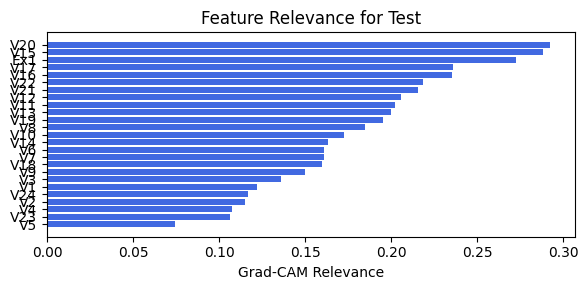

In [117]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=16, num_heads=4, filename=filename_4, opt_col_val='16, 4')

### 4.2.2.4 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.81e-01 | val_acc_hybrid: 8.08e-01 |: 100%|███| 100/100 [00:33<00:00,  3.00it/s]

saving model version 0.1
✅ Best validation Accuracy: 8.0756e-01 at 99 epoch
tensor(0.8104, device='cuda:0')
[[347  84   6   4]
 [ 35 368  15   2]
 [  1  19  46   0]
 [  7  17  17 124]]
M_KAN Relevance: 0.3140248656272888
CNN Relevance: 0.6859751343727112
[('V22', 0.26679805), ('V11', 0.24644783), ('V2', 0.24546558), ('V9', 0.2439909), ('V7', 0.21578081), ('V15', 0.18832949), ('V6', 0.1775213), ('V14', 0.16802654), ('V23', 0.14025109), ('V5', 0.13254175), ('V10', 0.12524405), ('V24', 0.112084575), ('V16', 0.11151735), ('V20', 0.10380598), ('V4', 0.100182794), ('V17', 0.089802556), ('V19', 0.082152896), ('V1', 0.06653146), ('V12', 0.06160043), ('V13', 0.061284337), ('V8', 0.05801836), ('V18', 0.05743513), ('V21', 0.050445933), ('V3', 0.04663932)]


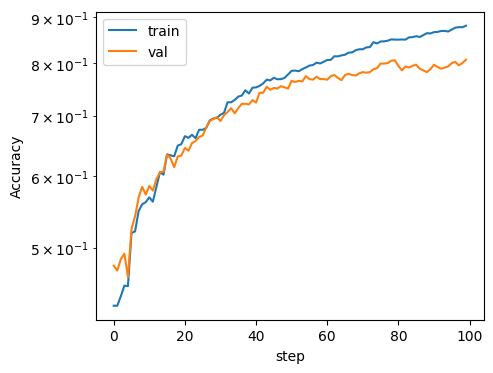

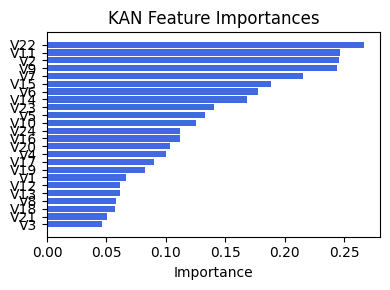

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V11', 0.31391665513378625), ('V13', 0.2845457905674039), ('V16', 0.27588198974747985), ('V12', 0.26041091161491897), ('V22', 0.2602537304177558), ('V8', 0.25532279239322275), ('V17', 0.25116098956810745), ('V6', 0.24803172278806856), ('V19', 0.2381317397075724), ('V18', 0.23246532673593576), ('V24', 0.2252302983889212), ('V7', 0.22475147432086465), ('V23', 0.21572333391031528), ('V3', 0.19601723201911214), ('V20', 0.19355845833851806), ('V9', 0.19067652531135376), ('V15', 0.18952567986502217), ('V14', 0.18732754158949047), ('V2', 0.17054937034937218), ('V1', 0.16014920413142475), ('Ex1', 0.15554267329299454), ('V4', 0.13528653552974979), ('V21', 0.12835255991754926), ('V10', 0.11946010304635597), ('V5', 0.06328591696618564)]


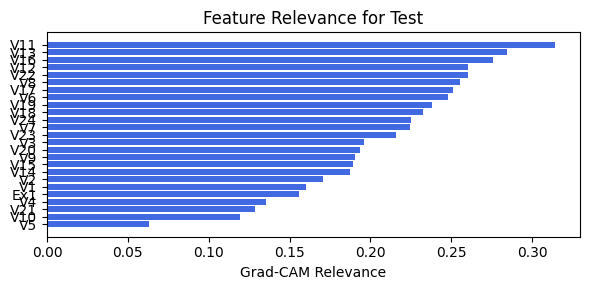

In [118]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=16, num_heads=8, filename=filename_4, opt_col_val='16, 8')

### 4.2.2.5 width=[24, 7, 1], grid=8, lamb=0.001 | embed_dim=16, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.81e-01 | val_acc_hybrid: 8.08e-01 |: 100%|███| 100/100 [00:32<00:00,  3.05it/s]


saving model version 0.1
✅ Best validation Accuracy: 8.0756e-01 at 99 epoch
tensor(0.8104, device='cuda:0')
[[347  84   6   4]
 [ 35 368  15   2]
 [  1  19  46   0]
 [  7  17  17 124]]
M_KAN Relevance: 0.3140248656272888
CNN Relevance: 0.6859751343727112
[('V22', 0.26679805), ('V11', 0.24644783), ('V2', 0.24546558), ('V9', 0.2439909), ('V7', 0.21578081), ('V15', 0.18832949), ('V6', 0.1775213), ('V14', 0.16802654), ('V23', 0.14025109), ('V5', 0.13254175), ('V10', 0.12524405), ('V24', 0.112084575), ('V16', 0.11151735), ('V20', 0.10380598), ('V4', 0.100182794), ('V17', 0.089802556), ('V19', 0.082152896), ('V1', 0.06653146), ('V12', 0.06160043), ('V13', 0.061284337), ('V8', 0.05801836), ('V18', 0.05743513), ('V21', 0.050445933), ('V3', 0.04663932)]


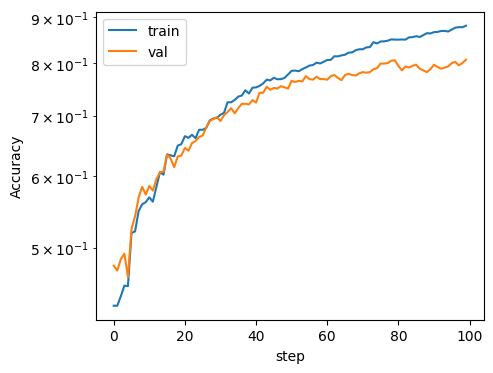

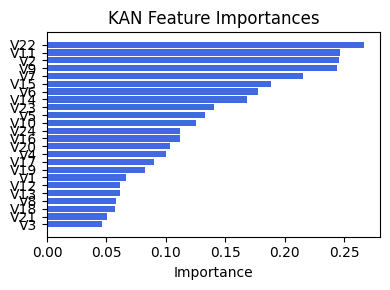

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V11', 0.31391665513378625), ('V13', 0.2845457905674039), ('V16', 0.27588198974747985), ('V12', 0.26041091161491897), ('V22', 0.2602537304177558), ('V8', 0.25532279239322275), ('V17', 0.25116098956810745), ('V6', 0.24803172278806856), ('V19', 0.2381317397075724), ('V18', 0.23246532673593576), ('V24', 0.2252302983889212), ('V7', 0.22475147432086465), ('V23', 0.21572333391031528), ('V3', 0.19601723201911214), ('V20', 0.19355845833851806), ('V9', 0.19067652531135376), ('V15', 0.18952567986502217), ('V14', 0.18732754158949047), ('V2', 0.17054937034937218), ('V1', 0.16014920413142475), ('Ex1', 0.15554267329299454), ('V4', 0.13528653552974979), ('V21', 0.12835255991754926), ('V10', 0.11946010304635597), ('V5', 0.06328591696618564)]


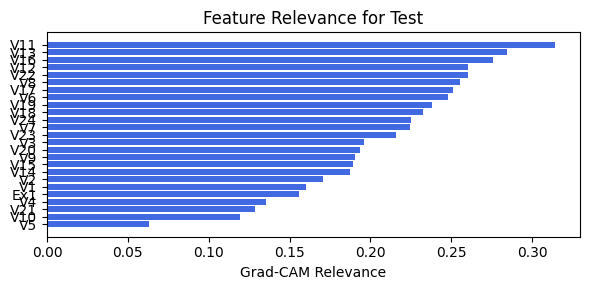

In [119]:
train_and_plot_relevance(Model3_4, kan_neurons=7, kan_grid=8, lamb=0.001, steps=100, embed_dim=16, num_heads=8, filename=filename_4, opt_col_val='16, 8')

## 4.3. width=[24, 9], grid=8, lamb=0.001

### 4.3.0.0 width=[24, 9], grid=8, lamb=0.001 | embed_dim=64, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.26e-01 | val_acc_hybrid: 7.71e-01 |: 100%|███| 150/150 [00:56<00:00,  2.65it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.8236e-01 at 82 epoch
tensor(0.7802, device='cuda:0')
[[342  80  12   7]
 [ 28 372  20   0]
 [  1  25  39   1]
 [  6  26  34  99]]
M_KAN Relevance: 0.08006796985864639
CNN Relevance: 0.9199320673942566
[('V22', 0.22453083), ('V5', 0.21777295), ('V7', 0.217553), ('V8', 0.20889199), ('V15', 0.20754926), ('V12', 0.20213939), ('V20', 0.20201752), ('V13', 0.19551454), ('V14', 0.1814585), ('V10', 0.15317859), ('V6', 0.1523134), ('V4', 0.14862223), ('V11', 0.14772944), ('V23', 0.14469245), ('V24', 0.14192337), ('V9', 0.14116156), ('V16', 0.13000506), ('V21', 0.12381673), ('V3', 0.11888067), ('V1', 0.11065548), ('V17', 0.1104689), ('V2', 0.10809868), ('V19', 0.101660155), ('V18', 0.09524066)]


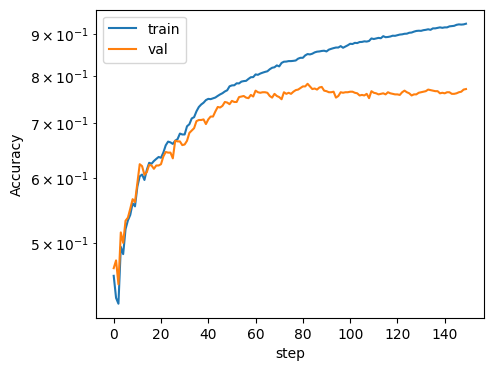

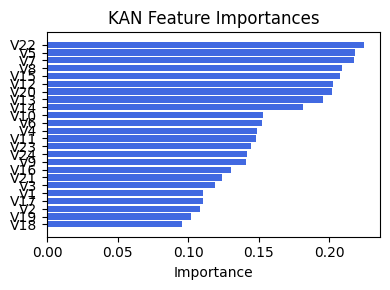

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.30817133881382586), ('V22', 0.270127231480755), ('V24', 0.2601963244554469), ('V19', 0.25604414015350024), ('V16', 0.24957978622006677), ('V23', 0.2453814334694071), ('V9', 0.21238321959102466), ('V14', 0.20165927628745073), ('V11', 0.19660125635400685), ('V7', 0.18699493312985627), ('V20', 0.18581736213723776), ('V15', 0.18573372649430167), ('V8', 0.18365240915918948), ('V10', 0.18153764281505935), ('V17', 0.17807179695890835), ('V12', 0.169231901888142), ('V5', 0.1512245579194044), ('V13', 0.14680776255816774), ('V18', 0.1465372028183599), ('V3', 0.14168498050742365), ('V6', 0.14054096416697537), ('V4', 0.13955701625613134), ('V2', 0.10692129018310806), ('Ex1', 0.08721630686386395), ('V1', 0.05975776921278362)]


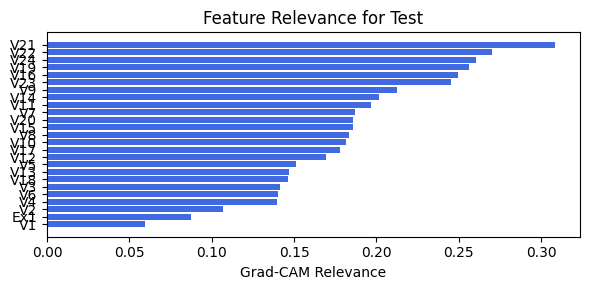

In [126]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=64, num_heads=2, filename=filename_4, opt_col_val='64, 2')

### 4.3.0.1 width=[24, 9], grid=8, lamb=0.001 | embed_dim=64, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.79e-01 | val_acc_hybrid: 6.80e-01 |: 100%|███| 150/150 [01:02<00:00,  2.39it/s]


saving model version 0.1
✅ Best validation Accuracy: 6.8729e-01 at 143 epoch
tensor(0.6868, device='cuda:0')
[[310 105  22   4]
 [ 46 330  42   2]
 [  3  31  32   0]
 [  3  31  53  78]]
M_KAN Relevance: 0.09184832125902176
CNN Relevance: 0.9081516861915588
[('V7', 0.23872228), ('V13', 0.22543044), ('V20', 0.22161569), ('V15', 0.20203526), ('V22', 0.20131214), ('V24', 0.20002034), ('V14', 0.19081017), ('V3', 0.17872353), ('V9', 0.172771), ('V11', 0.16199403), ('V21', 0.1598046), ('V17', 0.15268187), ('V12', 0.15222506), ('V2', 0.15188742), ('V10', 0.15180475), ('V19', 0.14916079), ('V8', 0.14795248), ('V5', 0.14075902), ('V23', 0.13909142), ('V16', 0.12738393), ('V18', 0.1198784), ('V1', 0.11187172), ('V6', 0.1012391), ('V4', 0.09977725)]


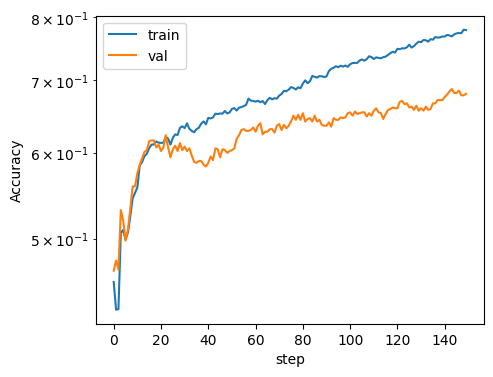

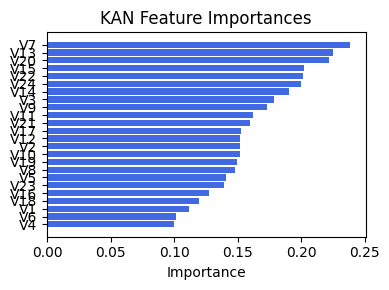

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.29018404930228736), ('V21', 0.26814609968511627), ('V8', 0.25945764219428025), ('V9', 0.2539766609899457), ('V7', 0.2532082975966203), ('V12', 0.24340321430650746), ('V14', 0.24096697727034905), ('V13', 0.23440811733502875), ('V17', 0.23167126061484467), ('V24', 0.22941207857331306), ('V16', 0.2121631817368698), ('V22', 0.1966072157815938), ('V18', 0.17713324096258898), ('V23', 0.17485714927026938), ('V11', 0.17152546808149602), ('V6', 0.1707768795458033), ('V3', 0.14672325683111076), ('V2', 0.14593549024871724), ('V20', 0.1403968180611861), ('V1', 0.12465451907780498), ('V10', 0.12434232195094314), ('V15', 0.11731799267843118), ('V4', 0.10556302206695807), ('V5', 0.09712786877110245), ('Ex1', 0.08354564826942353)]


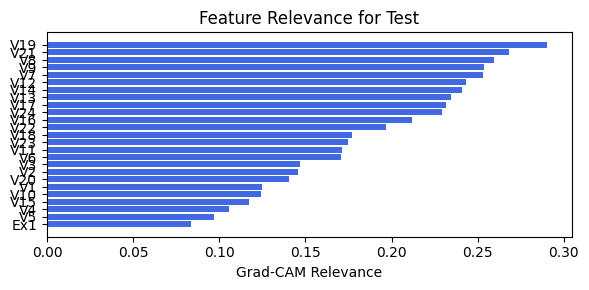

In [127]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=64, num_heads=2, filename=filename_4, opt_col_val='64, 2')

### 4.3.0.2 width=[24, 9], grid=8, lamb=0.001 | embed_dim=64, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.23e-01 | val_acc_hybrid: 7.50e-01 |: 100%|███| 150/150 [01:02<00:00,  2.39it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.5143e-01 at 145 epoch
tensor(0.7418, device='cuda:0')
[[321  94  21   5]
 [ 38 353  27   2]
 [  2  28  31   5]
 [  5  25  30 105]]
M_KAN Relevance: 0.09056601673364639
CNN Relevance: 0.9094340205192566
[('V13', 0.26840302), ('V9', 0.25136533), ('V15', 0.2156267), ('V23', 0.21173035), ('V19', 0.19674225), ('V7', 0.19057876), ('V20', 0.15731235), ('V21', 0.1381509), ('V12', 0.13144577), ('V22', 0.1301815), ('V24', 0.12827821), ('V17', 0.12067657), ('V5', 0.119092755), ('V14', 0.11612439), ('V8', 0.10558397), ('V11', 0.10317755), ('V4', 0.0977742), ('V16', 0.095220685), ('V3', 0.095132984), ('V2', 0.09388106), ('V1', 0.07779555), ('V18', 0.07001902), ('V6', 0.05665027), ('V10', 0.053327527)]


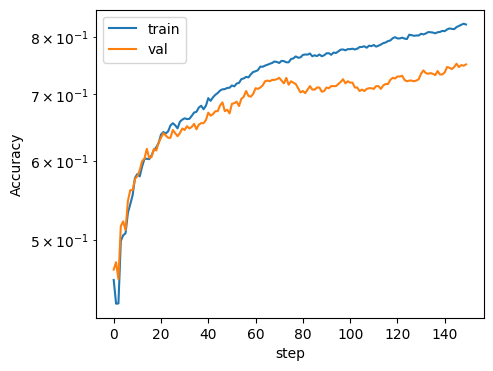

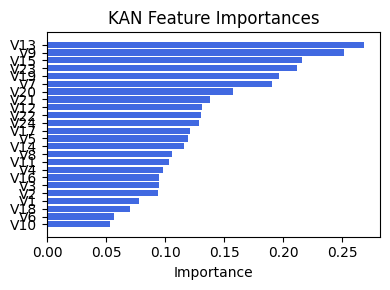

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V16', 0.28772957425077544), ('V11', 0.24416229773212916), ('V21', 0.23856437824378235), ('V24', 0.23717634270340646), ('V22', 0.23107951466887916), ('V19', 0.2246083223527508), ('V7', 0.2104646992961784), ('V8', 0.2084181321674622), ('V23', 0.20505262120276554), ('V6', 0.19911577462431063), ('V17', 0.1978021623791182), ('V14', 0.1958190363471565), ('V9', 0.19404356287333488), ('V12', 0.1905718285552045), ('V20', 0.18968690501409477), ('V13', 0.1721352504278685), ('V15', 0.16632734577132274), ('V18', 0.16631416394567158), ('V10', 0.14120318752077268), ('Ex1', 0.12836105135335205), ('V2', 0.10562200984444671), ('V1', 0.10206460359777572), ('V3', 0.09726316066467457), ('V5', 0.08471220754213407), ('V4', 0.07852621022195289)]


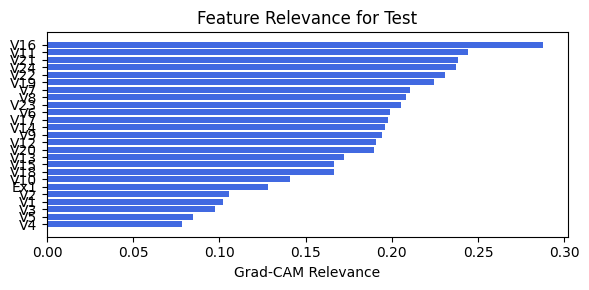

In [128]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=64, num_heads=4, filename=filename_4, opt_col_val='64, 4')

### 4.3.0.3 width=[24, 9], grid=8, lamb=0.001 | embed_dim=64, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 7.79e-01 | val_acc_hybrid: 6.80e-01 |: 100%|███| 150/150 [01:03<00:00,  2.35it/s]


saving model version 0.1
✅ Best validation Accuracy: 6.8729e-01 at 143 epoch
tensor(0.6868, device='cuda:0')
[[310 105  22   4]
 [ 46 330  42   2]
 [  3  31  32   0]
 [  3  31  53  78]]
M_KAN Relevance: 0.09184832125902176
CNN Relevance: 0.9081516861915588
[('V7', 0.23872228), ('V13', 0.22543044), ('V20', 0.22161569), ('V15', 0.20203526), ('V22', 0.20131214), ('V24', 0.20002034), ('V14', 0.19081017), ('V3', 0.17872353), ('V9', 0.172771), ('V11', 0.16199403), ('V21', 0.1598046), ('V17', 0.15268187), ('V12', 0.15222506), ('V2', 0.15188742), ('V10', 0.15180475), ('V19', 0.14916079), ('V8', 0.14795248), ('V5', 0.14075902), ('V23', 0.13909142), ('V16', 0.12738393), ('V18', 0.1198784), ('V1', 0.11187172), ('V6', 0.1012391), ('V4', 0.09977725)]


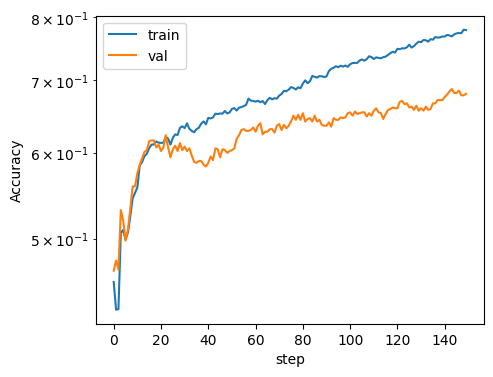

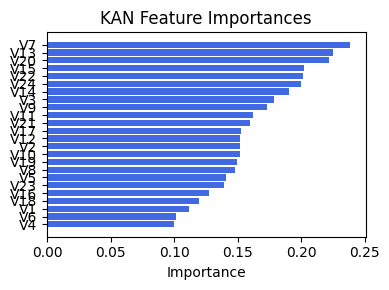

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V19', 0.29018404930228736), ('V21', 0.26814609968511627), ('V8', 0.25945764219428025), ('V9', 0.2539766609899457), ('V7', 0.2532082975966203), ('V12', 0.24340321430650746), ('V14', 0.24096697727034905), ('V13', 0.23440811733502875), ('V17', 0.23167126061484467), ('V24', 0.22941207857331306), ('V16', 0.2121631817368698), ('V22', 0.1966072157815938), ('V18', 0.17713324096258898), ('V23', 0.17485714927026938), ('V11', 0.17152546808149602), ('V6', 0.1707768795458033), ('V3', 0.14672325683111076), ('V2', 0.14593549024871724), ('V20', 0.1403968180611861), ('V1', 0.12465451907780498), ('V10', 0.12434232195094314), ('V15', 0.11731799267843118), ('V4', 0.10556302206695807), ('V5', 0.09712786877110245), ('Ex1', 0.08354564826942353)]


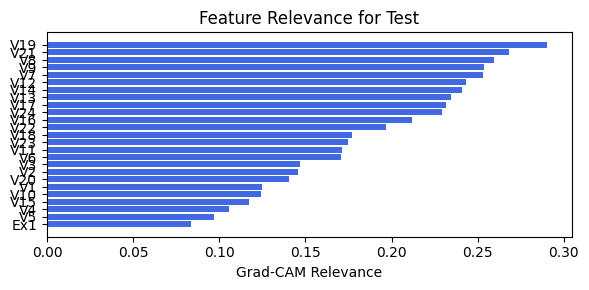

In [129]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=64, num_heads=4, filename=filename_4, opt_col_val='64, 4')

### 4.3.0.4 width=[24, 9], grid=8, lamb=0.001 | embed_dim=64, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.72e-01 | val_acc_hybrid: 7.48e-01 |: 100%|███| 150/150 [01:00<00:00,  2.46it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.5372e-01 at 127 epoch
tensor(0.7592, device='cuda:0')
[[333  88  12   8]
 [ 27 368  22   3]
 [  6  26  30   4]
 [  8  27  32  98]]
M_KAN Relevance: 0.15212132036685944
CNN Relevance: 0.8478786945343018
[('V15', 0.29060236), ('V20', 0.25923693), ('V13', 0.23279388), ('V5', 0.19873913), ('V22', 0.18055163), ('V24', 0.16453417), ('V14', 0.15995696), ('V4', 0.15067215), ('V17', 0.1400674), ('V19', 0.13730788), ('V8', 0.122566275), ('V3', 0.12238613), ('V7', 0.12219073), ('V9', 0.12085708), ('V12', 0.11535426), ('V6', 0.114627935), ('V16', 0.11222623), ('V1', 0.10784646), ('V21', 0.10684596), ('V18', 0.10618306), ('V10', 0.10460137), ('V11', 0.09645182), ('V23', 0.09366666), ('V2', 0.086406484)]


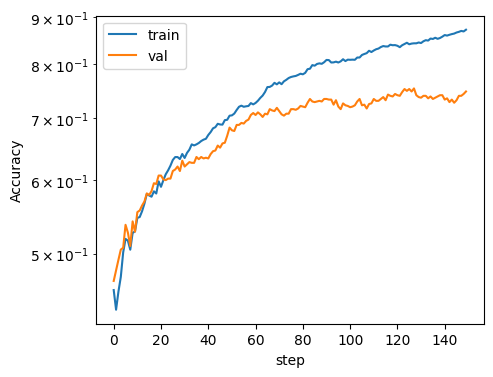

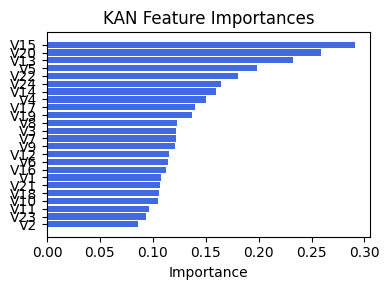

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.2990653449840685), ('V22', 0.28379408751055424), ('V23', 0.2641983060224874), ('V24', 0.2565133301850371), ('V16', 0.22378289217102484), ('V7', 0.22087927195556964), ('V15', 0.21863403354725647), ('V12', 0.21562549268462164), ('V13', 0.21445381070163969), ('V20', 0.21410529994731597), ('V9', 0.21317874387412156), ('V8', 0.20372211382146105), ('V19', 0.2015148895227537), ('V17', 0.20120098196778036), ('V14', 0.1918341849468761), ('V10', 0.18815074382114405), ('V6', 0.17913607655961206), ('V11', 0.1763260254036327), ('V18', 0.14843777983859358), ('Ex1', 0.11963692332759514), ('V5', 0.11370912924228453), ('V3', 0.10645438794674005), ('V2', 0.10221930435486501), ('V4', 0.09676995443488778), ('V1', 0.09039639831595335)]


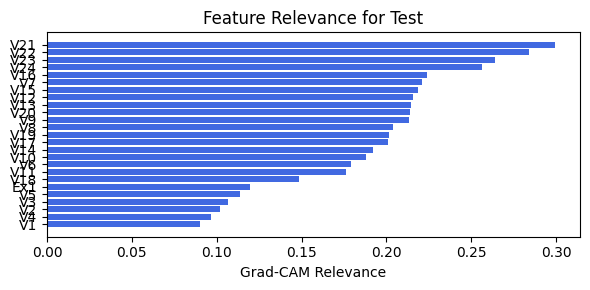

In [130]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=64, num_heads=8, filename=filename_4, opt_col_val='64, 8')

### 4.3.0.5 width=[24, 9], grid=8, lamb=0.001 | embed_dim=64, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.23e-01 | val_acc_hybrid: 7.64e-01 |: 100%|███| 150/150 [01:00<00:00,  2.48it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.6747e-01 at 92 epoch
tensor(0.7692, device='cuda:0')
[[345  82  10   4]
 [ 32 358  30   0]
 [  2  21  40   3]
 [ 10  28  30  97]]
M_KAN Relevance: 0.3989803194999695
CNN Relevance: 0.6010197401046753
[('V20', 0.2665524), ('V23', 0.21672268), ('V13', 0.20892763), ('V5', 0.20458026), ('V15', 0.19870093), ('V22', 0.18156779), ('V9', 0.17713913), ('V19', 0.14858651), ('V18', 0.14380808), ('V3', 0.1398595), ('V14', 0.13565902), ('V24', 0.13274024), ('V17', 0.13009985), ('V21', 0.1299919), ('V11', 0.12398195), ('V12', 0.11045128), ('V1', 0.10607016), ('V6', 0.09898084), ('V16', 0.090232216), ('V2', 0.08262981), ('V4', 0.081146404), ('V7', 0.07820434), ('V10', 0.069760196), ('V8', 0.04521649)]


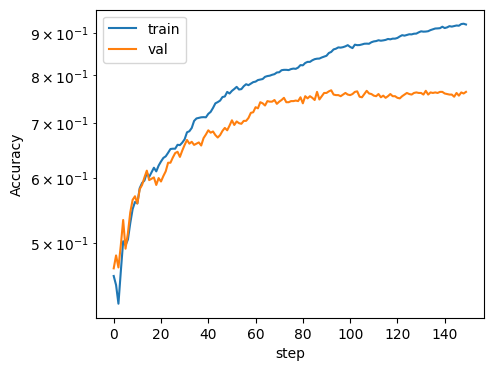

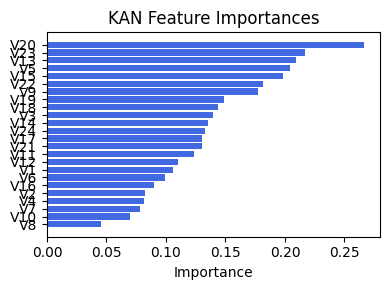

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.24476585476951343), ('V13', 0.2420783577524825), ('V17', 0.23985336657810527), ('V21', 0.23596275004105263), ('V20', 0.23158190992188335), ('V19', 0.22781029692595148), ('V8', 0.22329297647655827), ('V12', 0.22309627265458537), ('V18', 0.21858353817382048), ('V23', 0.21381291383186046), ('V15', 0.21201771230794741), ('V10', 0.20083991146035698), ('V7', 0.1997218251931755), ('V24', 0.19970561120407093), ('V9', 0.18444059894762097), ('V16', 0.17767579846258075), ('V14', 0.17558679785135956), ('V6', 0.1566042764482521), ('V5', 0.1372747341809817), ('V11', 0.13397383748316904), ('V3', 0.1312392279234497), ('V4', 0.1167876366364578), ('V2', 0.10853667988355846), ('Ex1', 0.10064203297640363), ('V1', 0.08864849519741856)]


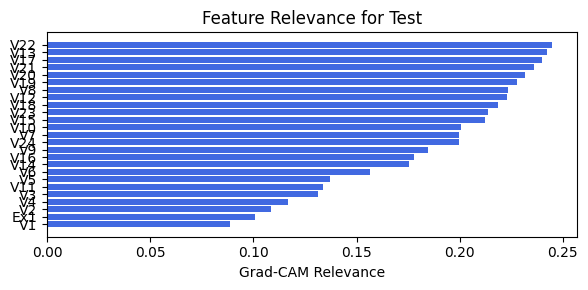

In [131]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=64, num_heads=8, filename=filename_4, opt_col_val='64, 8')

### 4.3.1.0 width=[24, 9], grid=8, lamb=0.001 | embed_dim=32, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.42e-01 | val_acc_hybrid: 7.77e-01 |: 100%|███| 150/150 [00:51<00:00,  2.92it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.7778e-01 at 146 epoch
tensor(0.7930, device='cuda:0')
[[344  73  15   9]
 [ 25 365  29   1]
 [  2  15  48   1]
 [  7  21  28 109]]
M_KAN Relevance: 0.22713318467140198
CNN Relevance: 0.7728668451309204
[('V20', 0.20050134), ('V3', 0.18708949), ('V22', 0.17102991), ('V4', 0.15363757), ('V17', 0.1392626), ('V18', 0.13878246), ('V15', 0.13462844), ('V19', 0.11836901), ('V14', 0.10987034), ('V24', 0.10911118), ('V11', 0.103982426), ('V2', 0.09836026), ('V23', 0.097151585), ('V16', 0.09524748), ('V9', 0.095164575), ('V6', 0.08766438), ('V13', 0.087150835), ('V1', 0.07247739), ('V7', 0.066057354), ('V21', 0.062486317), ('V5', 0.05619061), ('V12', 0.05058855), ('V10', 0.04723803), ('V8', 0.0374902)]


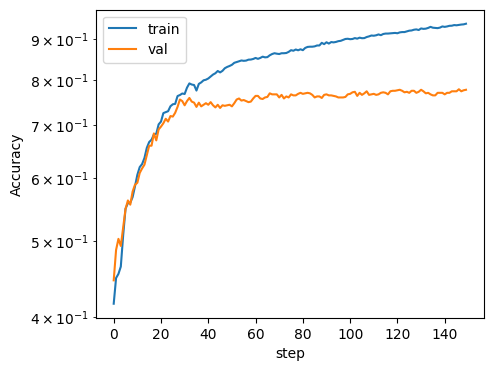

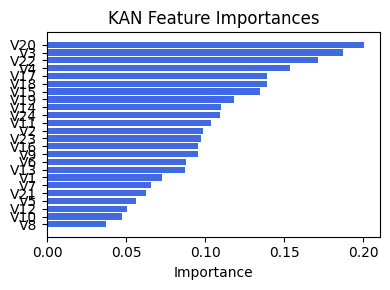

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.3607478667373527), ('V22', 0.27090909010333036), ('V24', 0.2477854328576924), ('V23', 0.2406570356094392), ('V16', 0.21548575319156255), ('V13', 0.20654385500987726), ('V8', 0.20552443743055693), ('V12', 0.20010342967185893), ('V7', 0.19605347296854586), ('V19', 0.19204647830129), ('V6', 0.1861158008283156), ('V17', 0.17888382309881212), ('V9', 0.17401969779230358), ('V18', 0.16942046953162332), ('V11', 0.16158050166235718), ('V14', 0.1613662147402988), ('V10', 0.1418133175931851), ('V20', 0.13973194375138362), ('V5', 0.13520173123002252), ('V4', 0.12778846237003794), ('V1', 0.11612215025180599), ('V15', 0.11456792820569381), ('V2', 0.11342263831575909), ('V3', 0.10890524220087752), ('Ex1', 0.08225528136025763)]


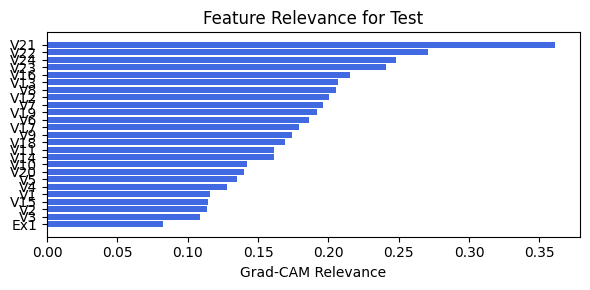

In [132]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=32, num_heads=2, filename=filename_4, opt_col_val='32, 2')

### 4.3.1.1 width=[24, 9], grid=8, lamb=0.001 | embed_dim=32, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.41e-01 | val_acc_hybrid: 7.82e-01 |: 100%|███| 150/150 [00:50<00:00,  2.98it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.9954e-01 at 81 epoch
tensor(0.7729, device='cuda:0')
[[338  87  11   5]
 [ 34 367  19   0]
 [  3  28  34   1]
 [  6  26  28 105]]
M_KAN Relevance: 0.2423817664384842
CNN Relevance: 0.757618248462677
[('V13', 0.24931686), ('V20', 0.24452467), ('V22', 0.21813072), ('V15', 0.21411787), ('V5', 0.2096477), ('V7', 0.20062344), ('V14', 0.17861965), ('V16', 0.17551446), ('V12', 0.17332539), ('V23', 0.16948125), ('V24', 0.16013518), ('V3', 0.14970778), ('V17', 0.14596117), ('V19', 0.14047086), ('V21', 0.13286023), ('V4', 0.13087231), ('V1', 0.12978853), ('V11', 0.12476962), ('V8', 0.1229025), ('V18', 0.11651674), ('V2', 0.11639057), ('V9', 0.115251936), ('V6', 0.088262044), ('V10', 0.07494525)]


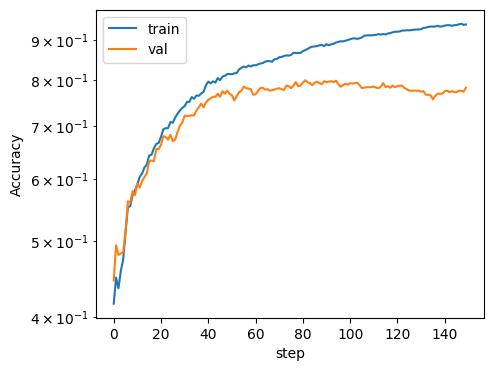

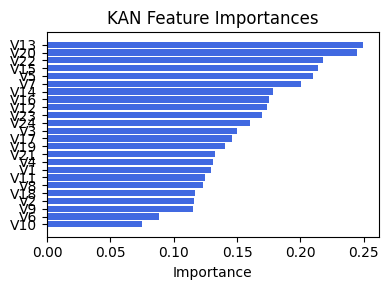

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.30059101194244947), ('V21', 0.28606741044894834), ('V23', 0.24694632132315295), ('V24', 0.23616419773401298), ('V8', 0.22333715782260297), ('V7', 0.2130163212648421), ('V13', 0.19029495781656947), ('V19', 0.17865335586900935), ('V9', 0.17425560557736197), ('V17', 0.1737282971011781), ('V12', 0.17231756052325972), ('V5', 0.1563929373291853), ('V16', 0.1546154740603808), ('V10', 0.15380549767174978), ('V6', 0.15141609593530242), ('V14', 0.15084605024968525), ('Ex1', 0.14272481239113705), ('V18', 0.14072627021104692), ('V20', 0.13981902819351147), ('V3', 0.13333232376221082), ('V2', 0.12095681279382776), ('V4', 0.12083468232220042), ('V11', 0.11413177438668251), ('V15', 0.1057470531439308), ('V1', 0.1012225560038792)]


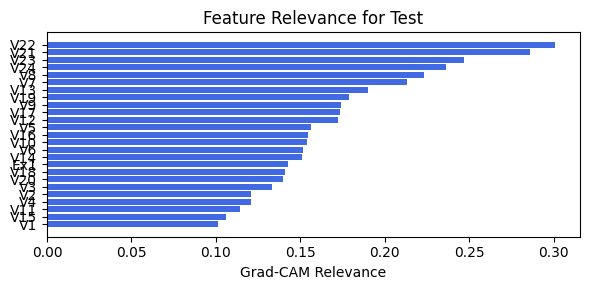

In [133]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=32, num_heads=2, filename=filename_4, opt_col_val='32, 2')

### 4.3.1.2 width=[24, 9], grid=8, lamb=0.001 | embed_dim=32, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.51e-01 | val_acc_hybrid: 7.59e-01 |: 100%|███| 150/150 [00:51<00:00,  2.92it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.6976e-01 at 132 epoch
tensor(0.7555, device='cuda:0')
[[338  89  12   2]
 [ 54 344  22   0]
 [  2  15  49   0]
 [  4  28  39  94]]
M_KAN Relevance: 0.43378975987434387
CNN Relevance: 0.5662102699279785
[('V13', 0.28520545), ('V22', 0.2772107), ('V14', 0.21398531), ('V20', 0.20341113), ('V23', 0.20311326), ('V15', 0.20069265), ('V7', 0.19208251), ('V11', 0.18514708), ('V12', 0.17309906), ('V5', 0.1673195), ('V21', 0.15957734), ('V1', 0.15884323), ('V3', 0.1537505), ('V24', 0.14528914), ('V17', 0.14411329), ('V16', 0.13865474), ('V8', 0.13448094), ('V18', 0.12408192), ('V10', 0.10857137), ('V9', 0.10491227), ('V19', 0.10015033), ('V2', 0.0805004), ('V6', 0.08001574), ('V4', 0.07769707)]


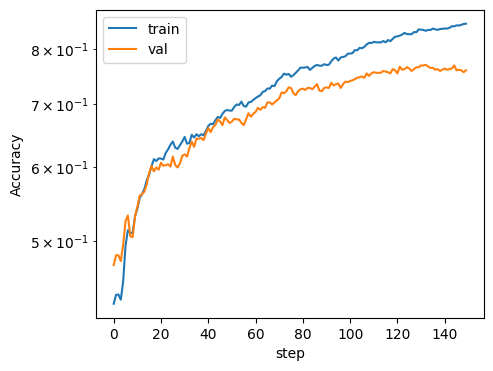

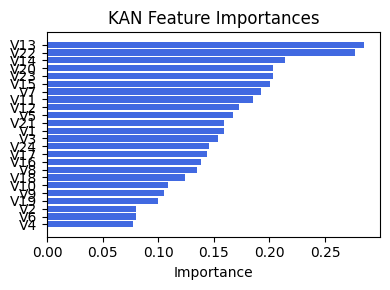

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V14', 0.2587815822493805), ('V21', 0.24825615815656346), ('V22', 0.24742545560071622), ('V19', 0.2469081403781411), ('V23', 0.24613877703358322), ('V24', 0.23892176290984682), ('V9', 0.2346971178562037), ('V8', 0.2245170304526348), ('V13', 0.2146275924604417), ('V18', 0.19791123788572904), ('V16', 0.19015368440368247), ('V15', 0.18972044192441534), ('V20', 0.18808351833800377), ('V12', 0.1880813338803942), ('V17', 0.18608909607164506), ('V7', 0.1769568268968341), ('V11', 0.1704708500198912), ('Ex1', 0.1511722434284494), ('V10', 0.12867840370741068), ('V6', 0.12175465343461304), ('V4', 0.10647436759901767), ('V5', 0.10563737452616556), ('V3', 0.09327803463400035), ('V2', 0.08691350898408974), ('V1', 0.07828144634354747)]


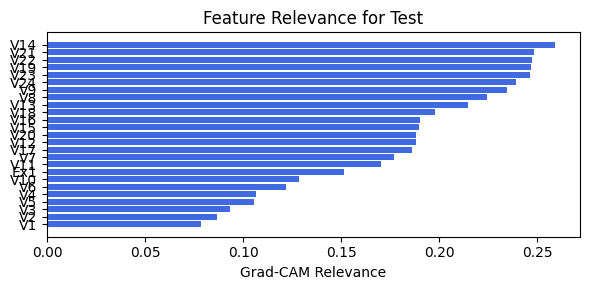

In [134]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=32, num_heads=4, filename=filename_4, opt_col_val='32, 4')

### 4.3.1.3 width=[24, 9], grid=8, lamb=0.001 | embed_dim=32, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.52e-01 | val_acc_hybrid: 7.63e-01 |: 100%|███| 150/150 [00:52<00:00,  2.84it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.8923e-01 at 99 epoch
tensor(0.7894, device='cuda:0')
[[345  82  13   1]
 [ 42 357  20   1]
 [  2  15  48   1]
 [  3  20  30 112]]
M_KAN Relevance: 0.34860140085220337
CNN Relevance: 0.6513985991477966
[('V20', 0.2828338), ('V13', 0.23948164), ('V17', 0.19201405), ('V14', 0.1899911), ('V24', 0.18603647), ('V15', 0.18600018), ('V16', 0.17023338), ('V22', 0.16495955), ('V7', 0.15035026), ('V19', 0.13992448), ('V18', 0.13780437), ('V21', 0.13406876), ('V1', 0.12270901), ('V3', 0.12096635), ('V11', 0.11329012), ('V5', 0.09278834), ('V12', 0.089911655), ('V4', 0.079071134), ('V9', 0.07568573), ('V23', 0.07101052), ('V8', 0.06306146), ('V10', 0.0613323), ('V2', 0.055945583), ('V6', 0.043706596)]


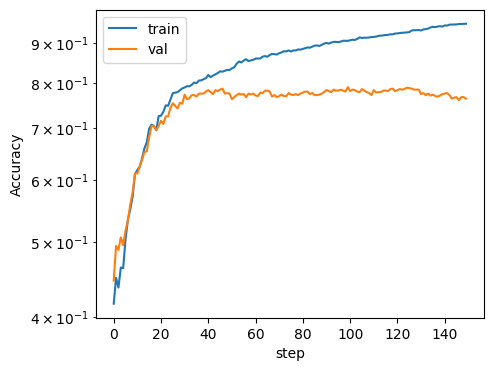

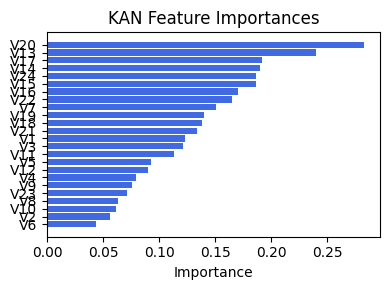

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.3165284185853415), ('V21', 0.2991139814400476), ('V23', 0.2839835965848409), ('V24', 0.26200792230021774), ('V16', 0.21397052403892716), ('V13', 0.2038597959106036), ('V7', 0.20016182282602246), ('V8', 0.19563830060163265), ('V9', 0.1870075007172467), ('V10', 0.1786415512065188), ('V11', 0.17681831014642707), ('V19', 0.17507799210459898), ('V14', 0.16878435051944923), ('V12', 0.16725106476437243), ('V17', 0.16714091566399017), ('V20', 0.16362160981527815), ('V18', 0.15497174309552225), ('V15', 0.14854405960281322), ('V5', 0.14448523205828512), ('V6', 0.13264522885239766), ('Ex1', 0.11927438989264358), ('V3', 0.1191978977369797), ('V4', 0.11146307338493741), ('V2', 0.09898127807335122), ('V1', 0.054715328579977025)]


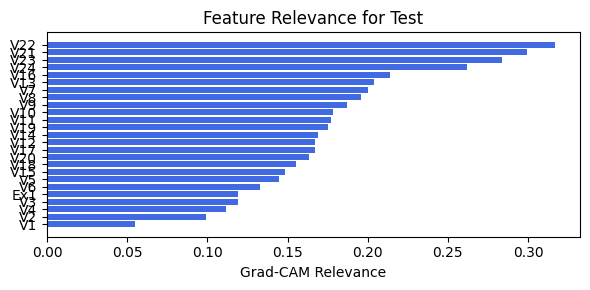

In [135]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=32, num_heads=4, filename=filename_4, opt_col_val='32, 4')

### 4.3.1.3 width=[24, 9], grid=8, lamb=0.001 | embed_dim=32, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.41e-01 | val_acc_hybrid: 7.82e-01 |: 100%|███| 150/150 [04:40<00:00,  1.87s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.9954e-01 at 81 epoch
tensor(0.7729, device='cuda:0')
[[338  87  11   5]
 [ 34 367  19   0]
 [  3  28  34   1]
 [  6  26  28 105]]
M_KAN Relevance: 0.2423817664384842
CNN Relevance: 0.757618248462677
[('V13', 0.24931686), ('V20', 0.24452467), ('V22', 0.21813072), ('V15', 0.21411787), ('V5', 0.2096477), ('V7', 0.20062344), ('V14', 0.17861965), ('V16', 0.17551446), ('V12', 0.17332539), ('V23', 0.16948125), ('V24', 0.16013518), ('V3', 0.14970778), ('V17', 0.14596117), ('V19', 0.14047086), ('V21', 0.13286023), ('V4', 0.13087231), ('V1', 0.12978853), ('V11', 0.12476962), ('V8', 0.1229025), ('V18', 0.11651674), ('V2', 0.11639057), ('V9', 0.115251936), ('V6', 0.088262044), ('V10', 0.07494525)]


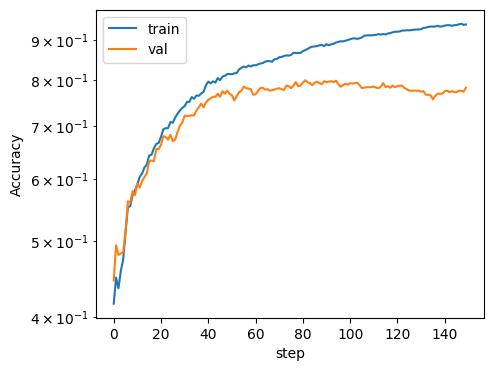

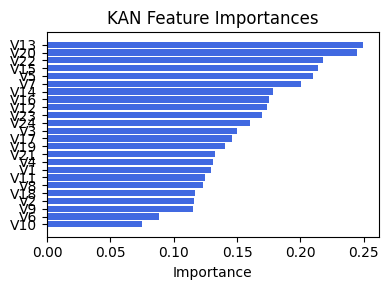

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V22', 0.30059101194244947), ('V21', 0.28606741044894834), ('V23', 0.24694632132315295), ('V24', 0.23616419773401298), ('V8', 0.22333715782260297), ('V7', 0.2130163212648421), ('V13', 0.19029495781656947), ('V19', 0.17865335586900935), ('V9', 0.17425560557736197), ('V17', 0.1737282971011781), ('V12', 0.17231756052325972), ('V5', 0.1563929373291853), ('V16', 0.1546154740603808), ('V10', 0.15380549767174978), ('V6', 0.15141609593530242), ('V14', 0.15084605024968525), ('Ex1', 0.14272481239113705), ('V18', 0.14072627021104692), ('V20', 0.13981902819351147), ('V3', 0.13333232376221082), ('V2', 0.12095681279382776), ('V4', 0.12083468232220042), ('V11', 0.11413177438668251), ('V15', 0.1057470531439308), ('V1', 0.1012225560038792)]


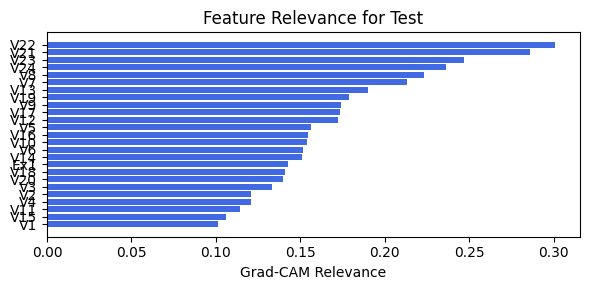

In [146]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=32, num_heads=8, filename=filename_4, opt_col_val='32, 8')

### 4.3.1.4 width=[24, 9], grid=8, lamb=0.001 | embed_dim=32, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.36e-01 | val_acc_hybrid: 7.95e-01 |: 100%|███| 150/150 [03:56<00:00,  1.58s/it]


saving model version 0.1
✅ Best validation Accuracy: 8.0412e-01 at 98 epoch
tensor(0.7830, device='cuda:0')
[[338  82  17   4]
 [ 39 365  16   0]
 [  2  13  49   2]
 [  4  16  42 103]]
M_KAN Relevance: 0.3676173985004425
CNN Relevance: 0.6323825716972351
[('V5', 0.26375008), ('V20', 0.24289608), ('V15', 0.21525407), ('V13', 0.21385275), ('V19', 0.16437301), ('V12', 0.1477421), ('V17', 0.14290185), ('V14', 0.13272604), ('V11', 0.13030507), ('V6', 0.1294027), ('V24', 0.12658547), ('V18', 0.12262615), ('V22', 0.12119961), ('V16', 0.110426225), ('V2', 0.09733329), ('V21', 0.0959164), ('V23', 0.09435221), ('V8', 0.09140341), ('V1', 0.08681398), ('V4', 0.08323117), ('V3', 0.07574966), ('V7', 0.07384479), ('V10', 0.06673047), ('V9', 0.037924673)]


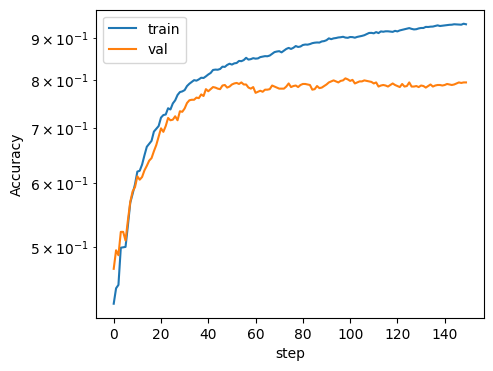

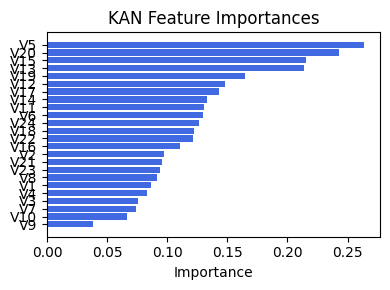

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V21', 0.31901121510960007), ('V22', 0.275656451762508), ('V19', 0.26573658241922715), ('V16', 0.251229467551109), ('V23', 0.23728783296519063), ('V9', 0.22772438426321495), ('V24', 0.22684515514683948), ('V14', 0.2128950046411001), ('V8', 0.21196626787792283), ('V7', 0.2098151709641047), ('V11', 0.19159871579773982), ('V13', 0.18960761764334005), ('V12', 0.17317533075087532), ('V17', 0.16665995307853054), ('V6', 0.1612476657159437), ('V20', 0.1548267494356848), ('V10', 0.15449743808621128), ('V18', 0.1532992124893042), ('V2', 0.14513617970470266), ('V15', 0.14311312040103902), ('V3', 0.14140270662790586), ('V5', 0.1308869602103403), ('V4', 0.11555351223511098), ('V1', 0.10545206580482645), ('Ex1', 0.097256337980177)]


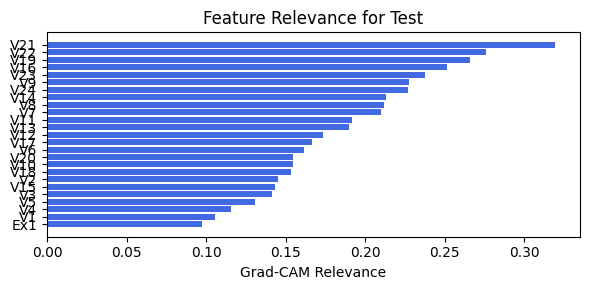

In [46]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=32, num_heads=8, filename=filename_4, opt_col_val='32, 8')

### 4.3.2.0 width=[24, 9], grid=8, lamb=0.001 | embed_dim=16, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.15e-01 | val_acc_hybrid: 7.65e-01 |: 100%|███| 150/150 [00:48<00:00,  3.10it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.7434e-01 at 93 epoch
tensor(0.7802, device='cuda:0')
[[332  88  17   4]
 [ 26 373  19   2]
 [  0  24  38   4]
 [  4  21  31 109]]
M_KAN Relevance: 0.1745694875717163
CNN Relevance: 0.8254305124282837
[('V7', 0.20149204), ('V6', 0.18020087), ('V4', 0.17353864), ('V5', 0.17210104), ('V20', 0.16616255), ('V9', 0.15659907), ('V3', 0.15179312), ('V16', 0.14098316), ('V17', 0.14032629), ('V12', 0.13921355), ('V18', 0.12758772), ('V24', 0.124362245), ('V10', 0.12156202), ('V11', 0.12068735), ('V14', 0.11711163), ('V19', 0.10385628), ('V15', 0.102909185), ('V13', 0.09820373), ('V21', 0.09662008), ('V22', 0.09236696), ('V2', 0.086410634), ('V1', 0.062114842), ('V8', 0.05361519), ('V23', 0.05090943)]


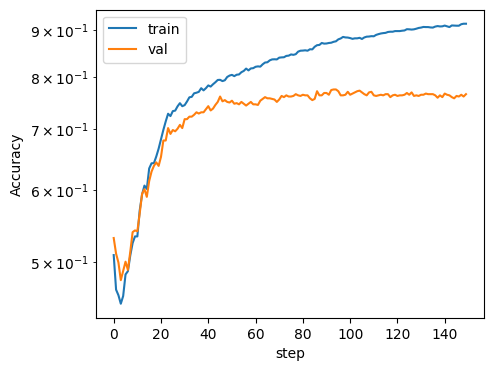

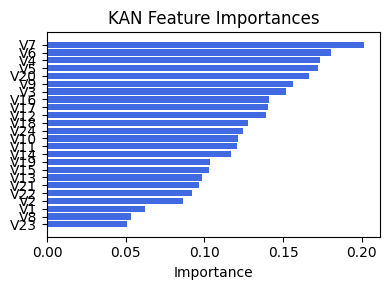

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.3060914256516182), ('V19', 0.28078399511457564), ('V15', 0.2637252320161076), ('V17', 0.2479334724586353), ('V18', 0.2378449755249163), ('V8', 0.22087267385873535), ('V10', 0.20741285514652572), ('V13', 0.20145704462951997), ('V14', 0.19879048173260389), ('V9', 0.19213598863198625), ('V22', 0.1914648475852971), ('V7', 0.18805840538922125), ('V12', 0.17850508138371046), ('V24', 0.177236139669684), ('Ex1', 0.17240328081554532), ('V23', 0.17122798126541425), ('V21', 0.16740690453616314), ('V16', 0.1505441685091479), ('V3', 0.12463068494495626), ('V5', 0.11795223742971954), ('V11', 0.11691447195492305), ('V4', 0.11411985750381949), ('V6', 0.1103937759965184), ('V2', 0.1070473215863777), ('V1', 0.09545261984202827)]


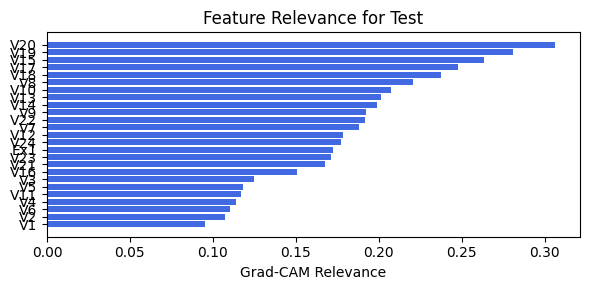

In [47]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=16, num_heads=2, filename=filename_4, opt_col_val='16, 2')

### 4.3.2.1 width=[24, 9], grid=8, lamb=0.001 | embed_dim=16, num_heads=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.15e-01 | val_acc_hybrid: 7.65e-01 |: 100%|███| 150/150 [00:50<00:00,  2.98it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.7434e-01 at 93 epoch
tensor(0.7802, device='cuda:0')
[[332  88  17   4]
 [ 26 373  19   2]
 [  0  24  38   4]
 [  4  21  31 109]]
M_KAN Relevance: 0.1745694875717163
CNN Relevance: 0.8254305124282837
[('V7', 0.20149204), ('V6', 0.18020087), ('V4', 0.17353864), ('V5', 0.17210104), ('V20', 0.16616255), ('V9', 0.15659907), ('V3', 0.15179312), ('V16', 0.14098316), ('V17', 0.14032629), ('V12', 0.13921355), ('V18', 0.12758772), ('V24', 0.124362245), ('V10', 0.12156202), ('V11', 0.12068735), ('V14', 0.11711163), ('V19', 0.10385628), ('V15', 0.102909185), ('V13', 0.09820373), ('V21', 0.09662008), ('V22', 0.09236696), ('V2', 0.086410634), ('V1', 0.062114842), ('V8', 0.05361519), ('V23', 0.05090943)]


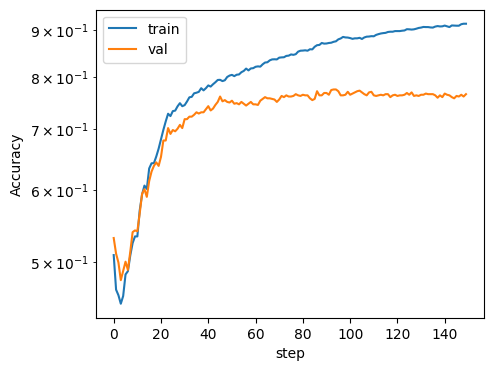

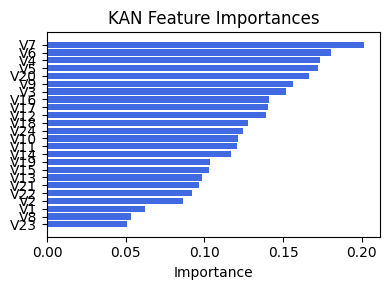

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.3060914256516182), ('V19', 0.28078399511457564), ('V15', 0.2637252320161076), ('V17', 0.2479334724586353), ('V18', 0.2378449755249163), ('V8', 0.22087267385873535), ('V10', 0.20741285514652572), ('V13', 0.20145704462951997), ('V14', 0.19879048173260389), ('V9', 0.19213598863198625), ('V22', 0.1914648475852971), ('V7', 0.18805840538922125), ('V12', 0.17850508138371046), ('V24', 0.177236139669684), ('Ex1', 0.17240328081554532), ('V23', 0.17122798126541425), ('V21', 0.16740690453616314), ('V16', 0.1505441685091479), ('V3', 0.12463068494495626), ('V5', 0.11795223742971954), ('V11', 0.11691447195492305), ('V4', 0.11411985750381949), ('V6', 0.1103937759965184), ('V2', 0.1070473215863777), ('V1', 0.09545261984202827)]


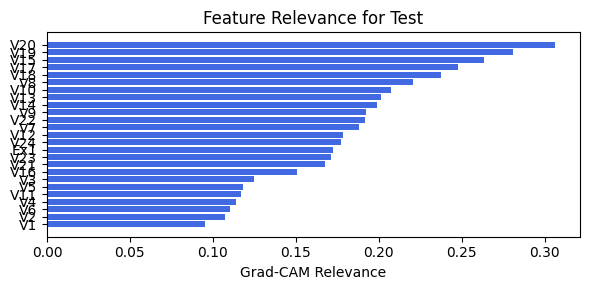

In [48]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=16, num_heads=2, filename=filename_4, opt_col_val='16, 2')

### 4.3.2.2 width=[24, 9], grid=8, lamb=0.001 | embed_dim=16, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.15e-01 | val_acc_hybrid: 7.65e-01 |: 100%|███| 150/150 [00:46<00:00,  3.20it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.7434e-01 at 93 epoch
tensor(0.7802, device='cuda:0')
[[332  88  17   4]
 [ 26 373  19   2]
 [  0  24  38   4]
 [  4  21  31 109]]
M_KAN Relevance: 0.1745694875717163
CNN Relevance: 0.8254305124282837
[('V7', 0.20149204), ('V6', 0.18020087), ('V4', 0.17353864), ('V5', 0.17210104), ('V20', 0.16616255), ('V9', 0.15659907), ('V3', 0.15179312), ('V16', 0.14098316), ('V17', 0.14032629), ('V12', 0.13921355), ('V18', 0.12758772), ('V24', 0.124362245), ('V10', 0.12156202), ('V11', 0.12068735), ('V14', 0.11711163), ('V19', 0.10385628), ('V15', 0.102909185), ('V13', 0.09820373), ('V21', 0.09662008), ('V22', 0.09236696), ('V2', 0.086410634), ('V1', 0.062114842), ('V8', 0.05361519), ('V23', 0.05090943)]


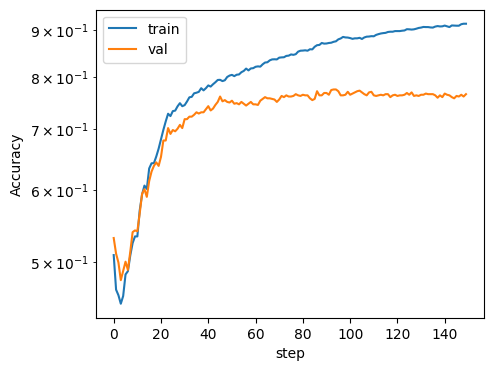

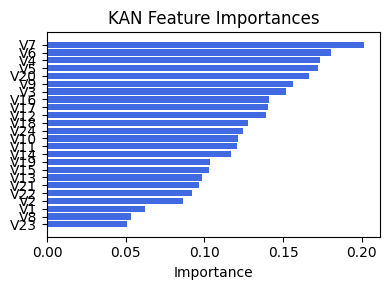

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.3060914256516182), ('V19', 0.28078399511457564), ('V15', 0.2637252320161076), ('V17', 0.2479334724586353), ('V18', 0.2378449755249163), ('V8', 0.22087267385873535), ('V10', 0.20741285514652572), ('V13', 0.20145704462951997), ('V14', 0.19879048173260389), ('V9', 0.19213598863198625), ('V22', 0.1914648475852971), ('V7', 0.18805840538922125), ('V12', 0.17850508138371046), ('V24', 0.177236139669684), ('Ex1', 0.17240328081554532), ('V23', 0.17122798126541425), ('V21', 0.16740690453616314), ('V16', 0.1505441685091479), ('V3', 0.12463068494495626), ('V5', 0.11795223742971954), ('V11', 0.11691447195492305), ('V4', 0.11411985750381949), ('V6', 0.1103937759965184), ('V2', 0.1070473215863777), ('V1', 0.09545261984202827)]


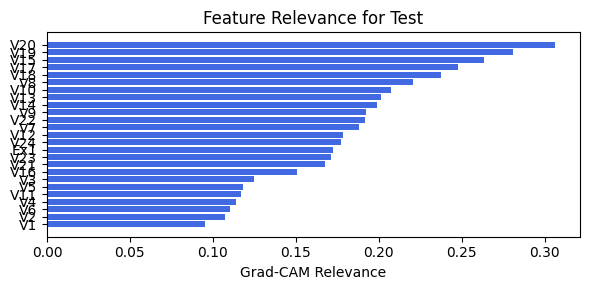

In [49]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=16, num_heads=4, filename=filename_4, opt_col_val='16, 4')

### 4.3.2.3 width=[24, 9], grid=8, lamb=0.001 | embed_dim=16, num_heads=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 8.85e-01 | val_acc_hybrid: 7.26e-01 |: 100%|███| 150/150 [00:55<00:00,  2.72it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.2623e-01 at 149 epoch
tensor(0.7436, device='cuda:0')
[[316 104  19   2]
 [ 33 353  31   3]
 [  1  26  36   3]
 [  2  15  41 107]]
M_KAN Relevance: 0.25775042176246643
CNN Relevance: 0.7422495484352112
[('V7', 0.28874353), ('V14', 0.18123056), ('V6', 0.1630522), ('V20', 0.138463), ('V11', 0.13299818), ('V19', 0.1252145), ('V13', 0.11605969), ('V22', 0.10207086), ('V23', 0.1003496), ('V16', 0.09964973), ('V4', 0.09524035), ('V18', 0.093229994), ('V15', 0.09247583), ('V17', 0.08811257), ('V24', 0.06759977), ('V21', 0.06345939), ('V9', 0.04447368), ('V5', 0.04199307), ('V1', 0.040432826), ('V3', 0.04023083), ('V10', 0.032871794), ('V12', 0.032243453), ('V2', 0.025333682), ('V8', 0.018697256)]


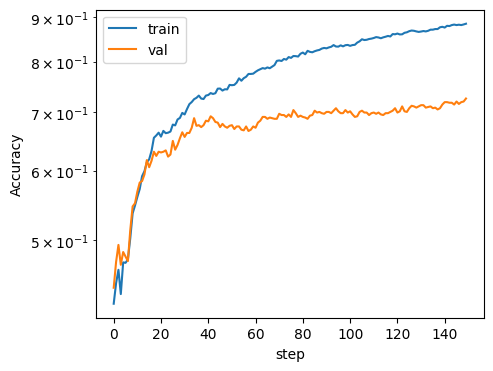

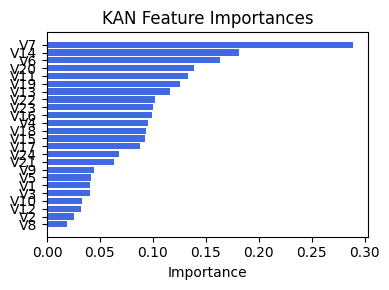

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.2735530075975682), ('V13', 0.2501430400671103), ('V10', 0.24085966878255233), ('V5', 0.23486752925019896), ('V8', 0.23485336437307114), ('V4', 0.2195809454777977), ('V3', 0.21825117755267853), ('V18', 0.21554648526421843), ('V12', 0.21263122332312134), ('V19', 0.21068243884006807), ('V24', 0.20981283474125303), ('V9', 0.20325749972558005), ('V16', 0.20166291586377025), ('V23', 0.19614844505631215), ('V15', 0.1791079357312194), ('V17', 0.17737807046101048), ('V22', 0.17485693305225608), ('V7', 0.17249047274758544), ('V14', 0.17080233623254482), ('Ex1', 0.15615962992820648), ('V6', 0.14537365351877798), ('V2', 0.14479930734760507), ('V21', 0.1446541670375954), ('V11', 0.13556709265985806), ('V1', 0.06768539066293809)]


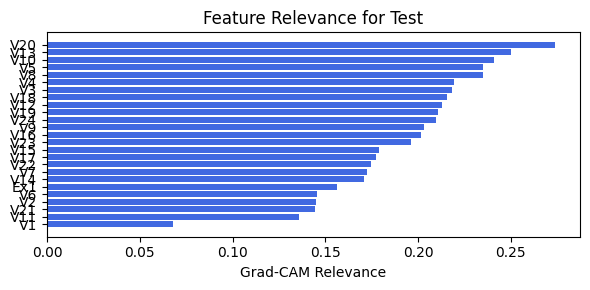

In [50]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=16, num_heads=4, filename=filename_4, opt_col_val='16, 4')

### 4.3.2.4 width=[24, 9], grid=8, lamb=0.001 | embed_dim=16, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.15e-01 | val_acc_hybrid: 7.65e-01 |: 100%|███| 150/150 [00:52<00:00,  2.85it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.7434e-01 at 93 epoch
tensor(0.7802, device='cuda:0')
[[332  88  17   4]
 [ 26 373  19   2]
 [  0  24  38   4]
 [  4  21  31 109]]
M_KAN Relevance: 0.1745694875717163
CNN Relevance: 0.8254305124282837
[('V7', 0.20149204), ('V6', 0.18020087), ('V4', 0.17353864), ('V5', 0.17210104), ('V20', 0.16616255), ('V9', 0.15659907), ('V3', 0.15179312), ('V16', 0.14098316), ('V17', 0.14032629), ('V12', 0.13921355), ('V18', 0.12758772), ('V24', 0.124362245), ('V10', 0.12156202), ('V11', 0.12068735), ('V14', 0.11711163), ('V19', 0.10385628), ('V15', 0.102909185), ('V13', 0.09820373), ('V21', 0.09662008), ('V22', 0.09236696), ('V2', 0.086410634), ('V1', 0.062114842), ('V8', 0.05361519), ('V23', 0.05090943)]


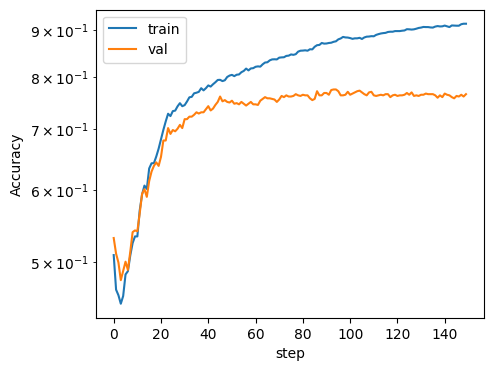

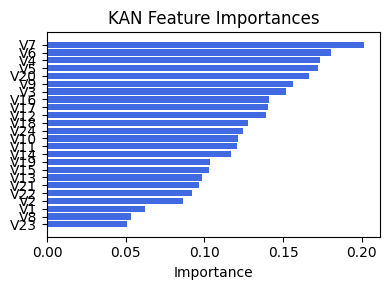

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V20', 0.3060914256516182), ('V19', 0.28078399511457564), ('V15', 0.2637252320161076), ('V17', 0.2479334724586353), ('V18', 0.2378449755249163), ('V8', 0.22087267385873535), ('V10', 0.20741285514652572), ('V13', 0.20145704462951997), ('V14', 0.19879048173260389), ('V9', 0.19213598863198625), ('V22', 0.1914648475852971), ('V7', 0.18805840538922125), ('V12', 0.17850508138371046), ('V24', 0.177236139669684), ('Ex1', 0.17240328081554532), ('V23', 0.17122798126541425), ('V21', 0.16740690453616314), ('V16', 0.1505441685091479), ('V3', 0.12463068494495626), ('V5', 0.11795223742971954), ('V11', 0.11691447195492305), ('V4', 0.11411985750381949), ('V6', 0.1103937759965184), ('V2', 0.1070473215863777), ('V1', 0.09545261984202827)]


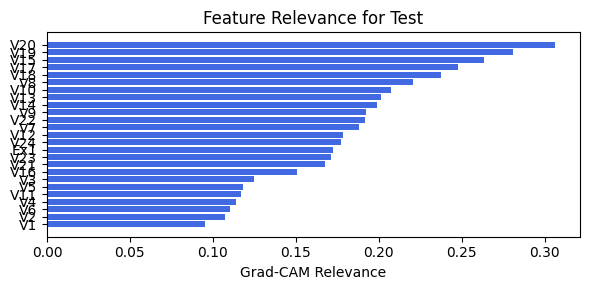

In [51]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=16, num_heads=8, filename=filename_4, opt_col_val='16, 8')

### 4.3.2.5 width=[24, 9], grid=8, lamb=0.001 | embed_dim=16, num_heads=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_4


 train_acc_hybrid: 9.22e-01 | val_acc_hybrid: 7.84e-01 |: 100%|███| 150/150 [00:48<00:00,  3.11it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.8580e-01 at 78 epoch
tensor(0.7738, device='cuda:0')
[[335  90  12   4]
 [ 32 357  29   2]
 [  1  20  43   2]
 [  2  22  31 110]]
M_KAN Relevance: 0.42040976881980896
CNN Relevance: 0.5795902609825134
[('V14', 0.2108876), ('V20', 0.20837334), ('V6', 0.19660102), ('V13', 0.184181), ('V16', 0.17715631), ('V7', 0.17067415), ('V18', 0.1628428), ('V19', 0.14253876), ('V3', 0.13883072), ('V15', 0.12862529), ('V24', 0.12809122), ('V17', 0.12519452), ('V12', 0.12303562), ('V23', 0.122891106), ('V10', 0.12208462), ('V8', 0.11854732), ('V11', 0.1182298), ('V22', 0.11246516), ('V5', 0.111447625), ('V2', 0.10949179), ('V21', 0.10084754), ('V4', 0.07850682), ('V9', 0.07264742), ('V1', 0.071577586)]


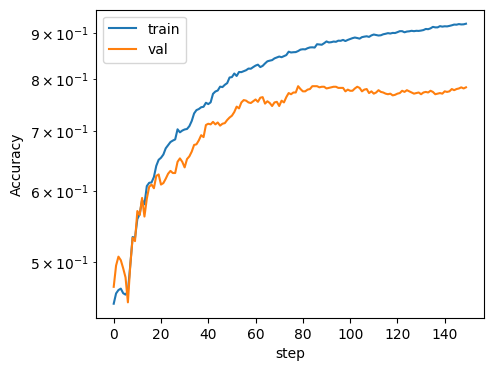

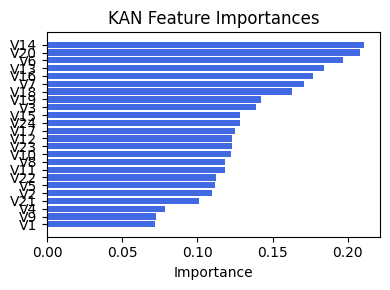

Computing Grad-CAM:   0%|          | 0/1092 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be stric

[('V13', 0.3512160758310485), ('V19', 0.35030689326676456), ('V8', 0.3442767970204258), ('V14', 0.3185651852170836), ('V18', 0.308280662936377), ('V12', 0.3076948015988999), ('V17', 0.30694699198477293), ('V9', 0.282537252316915), ('V7', 0.2800242181302022), ('V3', 0.19866625736544297), ('V2', 0.19828124464436855), ('V20', 0.19523361573484738), ('V22', 0.1818286285674231), ('V24', 0.17665900858425893), ('V4', 0.17366078059089704), ('V23', 0.15910738045893816), ('V15', 0.15442404942915877), ('V10', 0.12316042667729755), ('V21', 0.1198793172158227), ('V11', 0.11855779263024512), ('Ex1', 0.11748994948973986), ('V16', 0.11663713570148598), ('V6', 0.11498029607042927), ('V1', 0.10302371542092503), ('V5', 0.09312645004973878)]


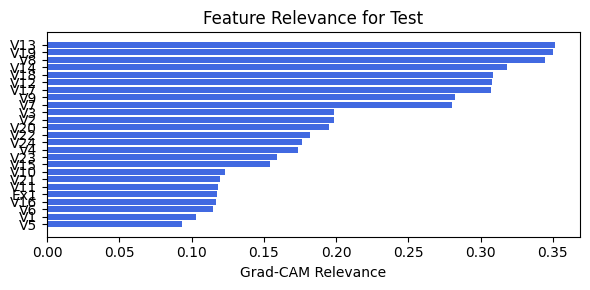

In [52]:
train_and_plot_relevance(Model3_4, kan_neurons=9, kan_grid=8, lamb=0.001, steps=150, embed_dim=16, num_heads=8, filename=filename_4, opt_col_val='16, 8')

# Hibrid Model3 training ✅ Top 2 Configurations

### 1. width=[24, 7, 1], grid=8, lamb=0.001| best_epoch=38 | avg_acc=0.93681

In [ ]:
model = try_create_model(Model3, attributes, imgs_shape, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=1)
best_model_state, metrics3, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics3['train_loss'], metrics3['eval_loss'])

In [ ]:
model.m_kan.plot()

In [ ]:
plot_sorted_feature_importance(x_col, model.m_kan.feature_score)

In [ ]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

In [ ]:
model.final_kan.plot()

In [ ]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=4)

In [ ]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

In [ ]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. width=[24, 9, 1], grid=8, lamb=0.001| best_epoch=19 | avg_acc=0.92857

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

In [ ]:
model = try_create_model(Model3, attributes, imgs_shape, kan_neurons=3, kan_grid=5)
best_model_state, metrics3,_ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics3['train_loss'], metrics3['val_loss'])

In [ ]:
model.m_kan.plot()

In [ ]:
plot_sorted_feature_importance(x_col, model.m_kan.feature_score)

In [ ]:
model.final_kan.plot()

In [ ]:
feature_score = model.final_kan.feature_score

In [ ]:
plot_mkan_vs_cnn_relevance(feature_score, mkan_len=3)

In [ ]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

In [ ]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Hybrid Model4 training ✅ Top 2 Configurations

### 1. width=[8, 1, 1], grid=4, lamb=0.01| best_epoch=7 | loss=3.23119

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

In [ ]:
model = try_create_model(Model4, attributes, imgs_shape, kan_neurons=1, kan_grid=4)  # Attempt to create Model4
best_model_state, metrics4, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics4['train_loss'], metrics4['eval_loss'])

In [ ]:
model.m_kan.plot()

In [ ]:
model.final_kan.plot()

In [ ]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=1)

In [ ]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

In [ ]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. width=[8, 2, 1], grid=4, lamb=0.1| best_epoch=7 | loss=3.23543

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

In [ ]:
model = try_create_model(Model4, attributes, imgs_shape, kan_neurons=2, kan_grid=4)  # Attempt to create Model4
best_model_state, metrics4, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.1)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics4['train_loss'], metrics4['eval_loss'])

In [ ]:
model.m_kan.plot()

In [ ]:
model.final_kan.plot()

In [ ]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=2)

In [ ]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

In [ ]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Bonus Hybrid

In [ ]:
class Model5(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, device=device):
        super(Model5, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 8, 8]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        self.final_kan = KAN(
            width=[self.flat_size, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        cnn_input = cnn_input.to(self.device)
        
        return self.cnn_branch(cnn_input)  # Process image input

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [ ]:
def fit_hybrid_dataloaders2(model, 
                           dataset,
                           opt="AdamW", 
                           steps=100, 
                           log=1, 
                           lamb=0., 
                           lamb_l1=1., 
                           lamb_entropy=2., 
                           lamb_coef=0., 
                           lamb_coefdiff=0., 
                           update_grid=True, 
                           grid_update_num=10, 
                           loss_fn=None, 
                           lr=1., 
                           start_grid_update_step=-1, 
                           stop_grid_update_step=50, 
                           batch=-1,
                           metrics=None, 
                           save_fig=False, 
                           in_vars=None, 
                           out_vars=None, 
                           beta=3, 
                           save_fig_freq=1, 
                           img_folder='./video', 
                           singularity_avoiding=False, 
                           y_th=1000., 
                           reg_metric='edge_forward_spline_n', 
                           display_metrics=None,
                           sum_f_reg=True):
    """
    Trains the hybrid model (with a KAN branch and a CNN branch) using a steps-based loop
    adapted from KAN.fit(), with grid updates and regularization.
    
    Instead of a single dataset dict, this function accepts three DataLoaders:
        - train_loader: provides (mlp, img, target) for training
        - val_loader: provides (mlp, img, target) for evaluation during training
        - test_loader: provides (mlp, img, target) for validation

    Internally, the function combines each loader into a dataset dictionary.
    
    Returns:
        results: dictionary containing training loss, evaluation loss, regularization values,
                 and any additional metrics recorded during training.
    """
    #device = next(model.parameters()).device

    # Warn if regularization is requested but model's internal flag isn't enabled.
    if lamb > 0. and not getattr(model.final_kan, "save_act", False):
        print("setting lamb=0. If you want to set lamb > 0, set model.final_kan.save_act=True")
    
    # Disable symbolic processing for training if applicable (KAN internal logic)
    if hasattr(model.final_kan, "disable_symbolic_in_fit"):
        old_save_act, old_symbolic_enabled = model.final_kan.disable_symbolic_in_fit(lamb)
    else:
        old_save_act, old_symbolic_enabled = None, None

    pbar = tqdm(range(steps), desc='Training', ncols=100)

    # Default loss function (mean squared error) if not provided
    if loss_fn is None:
        loss_fn = lambda x, y: torch.mean((x - y) ** 2)

    # Determine grid update frequency
    grid_update_freq = int(stop_grid_update_step / grid_update_num) if grid_update_num > 0 else 1

    # Determine total number of training examples
    n_train = dataset["train_input"].shape[0]
    n_eval  = dataset["val_input"].shape[0]  # using val set for evaluation during training
    batch_size = n_train if batch == -1 or batch > n_train else batch

    # Set up optimizer: choose between Adam and LBFGS (removed tolerance_ys)
    if opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    elif opt == "LBFGS":        
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    else:
        raise ValueError("Optimizer not recognized. Use 'Adam' or 'LBFGS'.")

    # Prepare results dictionary.
    results = {'train_loss': [], 'eval_loss': [], 'reg': []}

    
    if metrics is not None:
        for metric in metrics:
            results[metric.__name__] = []

    best_model_state = None
    best_epoch = -1
    best_loss = float('inf')

    for step in pbar:
        # Randomly sample indices for a mini-batch from the training set.
        train_indices = np.random.choice(n_train, batch_size, replace=False)
        # Use full evaluation set for evaluation; you can also sample if desired.
        eval_indices = np.arange(n_eval)
        cached_loss = {}
        # Closure for LBFGS
        def closure():
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            # Compute regularization term if enabled.
            if hasattr(model.final_kan, "save_act") and model.final_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.final_kan.node_attribute()
                reg_val_inner = model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val_inner = torch.tensor(0., device=device)
            loss_val_inner = train_loss + lamb * reg_val_inner
            loss_val_inner.backward()

            cached_loss['loss'] = loss_val_inner.detach()
            cached_loss['reg'] = reg_val_inner.detach()
            return loss_val_inner

        # Perform grid update if applicable.
        if (step % grid_update_freq == 0 and step < stop_grid_update_step 
            and update_grid and step >= start_grid_update_step):
            
            mlp_batch = dataset['train_input'][train_indices]
            cnn_batch = dataset['train_img'][train_indices]
            #cnn_output = model.cnn_branch(cnn_batch)  # Process image input
            concatenated = model.get_concat_output(mlp_batch, cnn_batch)
            #concatenated = torch.cat((mlp_batch, cnn_output), dim=1)
            model.final_kan.update_grid(concatenated)

        # Perform an optimizer step.
        if opt == "LBFGS":
            optimizer.step(closure)
            loss_val = cached_loss['loss']
            reg_val = cached_loss['reg']
        else:  # AdamW branch
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            if hasattr(model.final_kan, "save_act") and model.final_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.final_kan.node_attribute()
                reg_val = model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val = torch.tensor(0., device=device)
            loss_val = train_loss + lamb * reg_val
            loss_val.backward()
            optimizer.step()

        with torch.no_grad():
            mlp_eval = dataset["val_input"][eval_indices]
            img_eval = dataset["val_img"][eval_indices]
            target_eval = dataset["val_label"][eval_indices]
            eval_loss = loss_fn(model(mlp_eval, img_eval), target_eval)

        # Record results (using square-root of loss similar to KAN.fit)
        results['train_loss'].append(torch.sqrt(loss_val.detach()).item())
        results['eval_loss'].append(torch.sqrt(eval_loss.detach()).item())
        results['reg'].append(reg_val.detach().item())

        if metrics is not None:
            for metric in metrics:
                # Here, we assume each metric returns a tensor.
                results[metric.__name__].append(metric().item())

        if eval_loss < best_loss:
            best_epoch = step
            best_loss = eval_loss
            best_model_state = copy.deepcopy(model.state_dict())

        # Update progress bar.
        if display_metrics is None:
            pbar.set_description("| train_loss: %.2e | eval_loss: %.2e | reg: %.2e |" %
                                 (torch.sqrt(loss_val.detach()).item(),
                                  torch.sqrt(eval_loss.detach()).item(),
                                  reg_val.detach().item()))
        else:
            desc = ""
            data = []
            for metric in display_metrics:
                desc += f" {metric}: %.2e |"
                data.append(results[metric.__name__][-1])
            pbar.set_description(desc % tuple(data))

        # Optionally save a figure snapshot.
        if save_fig and step % save_fig_freq == 0:
            save_act_backup = getattr(model.final_kan, "save_act", False)
            model.final_kan.save_act = True
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title=f"Step {step}", beta=beta)
            plt.savefig(os.path.join(img_folder, f"{step}.jpg"), bbox_inches='tight', dpi=200)
            plt.close()
            model.final_kan.save_act = save_act_backup

    # Restore original settings if applicable.
    if old_symbolic_enabled is not None:
        model.final_kan.symbolic_enabled = old_symbolic_enabled
    if hasattr(model.final_kan, "log_history"):
        model.final_kan.log_history('fit')
    print(f"Best epoch {best_epoch}")
    return best_model_state, results, best_epoch

In [ ]:
del model
torch.cuda.empty_cache()
gc.collect()

In [ ]:
model = try_create_model(Model5, attributes, imgs_shape, kan_neurons=3, kan_grid=4)  # Attempt to create Model4

In [ ]:
best_model_state, metrics5, _ = fit_hybrid_dataloaders2(model, dataset, opt="LBFGS", steps=10, lamb=0.01)

In [ ]:
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics5['train_loss'], metrics5['eval_loss'])

In [ ]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

In [ ]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)